In [7]:
%env CUDA_DEVICE_ORDER=PCI_BUS_ID
# %env CUDA_VISIBLE_DEVICES=4
!nvidia-smi
%config InlineBackend.figure_format = 'retina'

env: CUDA_DEVICE_ORDER=PCI_BUS_ID
Fri Jun  6 13:23:07 2025       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.125.06   Driver Version: 525.125.06   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA A100-SXM...  On   | 00000000:01:00.0 Off |                    0 |
| N/A   51C    P0    74W / 275W |    497MiB / 81920MiB |      0%      Default |
|                               |                      |             Disabled |
+-------------------------------+----------------------+----------------------+
|   1  NVIDIA A100-SXM...  On   | 00000000:47:00.0 Off

In [8]:
import hydra
from hydra.utils import instantiate
from hydra import initialize, compose

In [9]:
import sys
import os
import getpass

os.chdir('/home/' + getpass.getuser() + '/Projects/CaloQVAE/')
sys.path.insert(1, '/home/' + getpass.getuser() + '/Projects/CaloQVAE/')

In [10]:
#external libraries
import os
import pickle
import datetime
import sys
import yaml
import json

import torch.optim as optim
import torch
from torch import nn
from torch.nn.functional import binary_cross_entropy_with_logits
torch.manual_seed(32)
import numpy as np
np.random.seed(32)
import matplotlib.pyplot as plt
import hydra
from hydra.utils import instantiate

from omegaconf import OmegaConf

import time

# PyTorch imports
from torch import device, load, save
from torch.nn import DataParallel
from torch.cuda import is_available

# Add the path to the parent directory to augment search for module
sys.path.append(os.getcwd())
    
# Weights and Biases
import wandb

#self defined imports
from CaloQVAE import logging

In [11]:
logger = logging.getLogger(__name__)

from data.dataManager import DataManager
from utils.plotting.plotProvider import PlotProvider
from engine.engine import Engine
from models.modelCreator import ModelCreator

from utils.plotting.HighLevelFeatures import HighLevelFeatures as HLF
from utils.plotting.HighLevelFeatsAtlasReg import HighLevelFeatures_ATLAS_regular as HLF2
# HLF_1_photons = HLF('photon', filename='/raid/javier/Datasets/CaloVAE/data/atlas/binning_dataset_1_photons.xml', wandb=False)
# HLF_1_pions = HLF('pion', filename='/raid/javier/Datasets/CaloVAE/data/atlas/binning_dataset_1_pions.xml', wandb=False)
# HLF_1_electron = HLF('electron', filename='/raid/javier/Datasets/CaloVAE/data/atlas_dataset2and3/binning_dataset_2.xml', wandb=False)

In [12]:
hydra.core.global_hydra.GlobalHydra.instance().clear()
initialize(version_base=None, config_path="configs")

hydra.initialize()

In [9]:

# config=compose(config_name="config.yaml")
config=compose(config_name="config.yaml")

HLF_1_photons = HLF('photon', filename=config.data.binning_xml_photons, wandb=False)
HLF_1_pions = HLF('pion', filename=config.data.binning_xml_pions, wandb=False)
HLF_1_electron = HLF('electron', filename=config.data.binning_xml_electrons, wandb=False)
HLF_1_Atlas= HLF2('electron', filename=config.data.binning_atlas_reg, wandb=False)

wandb.init(project="caloqvae", entity=config.data.entity, config=config, mode='disabled')
modelCreator = ModelCreator(cfg=config)
dataMgr = DataManager(cfg=config)
#initialise data loaders
dataMgr.init_dataLoaders()
#run pre processing: get/set input dimensions and mean of train dataset
dataMgr.pre_processing()

if config.model.activation_fct.lower()=="relu":
    modelCreator.default_activation_fct=torch.nn.ReLU()
elif config.model.activation_fct.lower()=="tanh":
    modelCreator.default_activation_fct=torch.nn.Tanh()
else:
    logger.warning("Setting identity as default activation fct")
    modelCreator.default_activation_fct=torch.nn.Identity()

#instantiate the chosen model
#loads from file 
model=modelCreator.init_model(dataMgr=dataMgr)

#create the NN infrastructure
model.create_networks()

/raid/javier/anaconda3/lib/python3.11/site-packages/hydra/_internal/defaults_list.py:251: UserWarning: In 'config.yaml': Defaults list is missing `_self_`. See https://hydra.cc/docs/1.2/upgrades/1.0_to_1.1/default_composition_order for more information
  warnings.warn(msg, UserWarning)


Keys: ['binsize_alpha_layer_0', 'binsize_alpha_layer_1', 'binsize_alpha_layer_10', 'binsize_alpha_layer_11', 'binsize_alpha_layer_12', 'binsize_alpha_layer_13', 'binsize_alpha_layer_14', 'binsize_alpha_layer_15', 'binsize_alpha_layer_16', 'binsize_alpha_layer_17', 'binsize_alpha_layer_18', 'binsize_alpha_layer_19', 'binsize_alpha_layer_2', 'binsize_alpha_layer_20', 'binsize_alpha_layer_21', 'binsize_alpha_layer_22', 'binsize_alpha_layer_23', 'binsize_alpha_layer_3', 'binsize_alpha_layer_4', 'binsize_alpha_layer_5', 'binsize_alpha_layer_6', 'binsize_alpha_layer_7', 'binsize_alpha_layer_8', 'binsize_alpha_layer_9', 'binsize_radius_layer_0', 'binsize_radius_layer_1', 'binsize_radius_layer_10', 'binsize_radius_layer_11', 'binsize_radius_layer_12', 'binsize_radius_layer_13', 'binsize_radius_layer_14', 'binsize_radius_layer_15', 'binsize_radius_layer_16', 'binsize_radius_layer_17', 'binsize_radius_layer_18', 'binsize_radius_layer_19', 'binsize_radius_layer_2', 'binsize_radius_layer_20', 'bin

[17:41:45.305] INFO   data.dataManager                                  Loading Data
[17:42:07.589] INFO   data.dataManager                                  <torch.utils.data.dataloader.DataLoader object at 0x7f7450a25610>: 101816 events, 100 batches
[17:42:07.591] INFO   data.dataManager                                  <torch.utils.data.dataloader.DataLoader object at 0x7f745013ee90>: 1272 events, 2 batches
[17:42:07.591] INFO   data.dataManager                                  <torch.utils.data.dataloader.DataLoader object at 0x7f7450140710>: 24183 events, 24 batches
[17:42:09.603] INFO   models.modelCreator                               Initialising Model Type AtlasConditionalQVAE3D
2025-05-22 17:42:09,610 dwave.cloud.client.base INFO  MainThread Fetching definitions of all available solvers
[17:42:09.610] INFO   dwave.cloud.client.base                           Fetching definitions of all available solvers
2025-05-22 17:42:10,981 dwave.cloud.client.base INFO  MainThread Received s

Initializing NetworkV3


In [10]:
# Layer Inputs:  [1208, 3368, 3368, 3368]
# Layer Outputs:  [2160, 2160, 2160, 6480]
# Raw Layer Indices:  [0, 2160, 2160, 2160, 6480]
# Initializing NetworkV3
# Initializing NetworkV3

In [11]:
#Not printing much useful info at the moment to avoid clutter. TODO optimise
model.print_model_info()
# for name, param in model.named_parameters():
#         print(name, param.requires_grad)

# Load the model on the GPU if applicable
# dev = None
# if (config.device == 'gpu') and config.gpu_list:
#     logger.info('Requesting GPUs. GPU list :' + str(config.gpu_list))
#     devids = ["cuda:{0}".format(x) for x in list(config.gpu_list)]
#     logger.info("Main GPU : " + devids[0])

#     if is_available():
#         print(devids[0])
#         dev = device(devids[0])
#         if len(devids) > 1:
#             logger.info(f"Using DataParallel on {devids}")
#             model = DataParallel(model, device_ids=list(config.gpu_list))
#         logger.info("CUDA available")
#     else:
#         dev = device('cpu')
#         logger.info("CUDA unavailable")
# else:
#     logger.info('Requested CPU or unable to use GPU. Setting CPU as device.')
#     dev = device('cpu')
# dev = torch.device("cuda:0")
dev = "cuda:{0}".format(config.gpu_list[0])

# Send the model to the selected device
# model.to(dev)
# Log metrics with wandb
wandb.watch(model)

# For some reason, need to use postional parameter cfg instead of named parameter
# with updated Hydra - used to work with named param but now is cfg=None 
engine=instantiate(config.engine, config)

#TODO for some reason hydra double instantiates the engine in a
#newer version if cfg=config is passed as an argument. This is a workaround.
#Find out why that is...
engine._config=config
#add dataMgr instance to engine namespace
engine.data_mgr=dataMgr
#add device instance to engine namespace
engine.device=dev    
#instantiate and register optimisation algorithm
engine.optimiser = torch.optim.Adam(model.parameters(),
                                    lr=config.engine.learning_rate)
#add the model instance to the engine namespace
engine.model = model
# add the modelCreator instance to engine namespace
engine.model_creator = modelCreator
engine.model = engine.model.to(dev)

[17:42:13.236] INFO   wandb                                             Watching
/raid/javier/anaconda3/lib/python3.11/site-packages/coffea/util.py:154: FutureWarning: In coffea version v2023.3.0 (target date: 31 Mar 2023), this will be an error.
(Set coffea.deprecations_as_errors = True to get a stack trace now.)
ImportError: coffea.hist is deprecated
  warnings.warn(message, FutureWarning)
[17:42:13.621] INFO   engine.engineAtlas                                Setting up engine Atlas.
[17:42:13.622] INFO   engine.engineCaloV3                               Setting up engine Calo.
[17:42:13.622] INFO   engine.engine                                     Setting up default engine.


Keys: ['binsize_alpha_layer_0', 'binsize_alpha_layer_1', 'binsize_alpha_layer_10', 'binsize_alpha_layer_11', 'binsize_alpha_layer_12', 'binsize_alpha_layer_13', 'binsize_alpha_layer_14', 'binsize_alpha_layer_15', 'binsize_alpha_layer_16', 'binsize_alpha_layer_17', 'binsize_alpha_layer_18', 'binsize_alpha_layer_19', 'binsize_alpha_layer_2', 'binsize_alpha_layer_20', 'binsize_alpha_layer_21', 'binsize_alpha_layer_22', 'binsize_alpha_layer_23', 'binsize_alpha_layer_3', 'binsize_alpha_layer_4', 'binsize_alpha_layer_5', 'binsize_alpha_layer_6', 'binsize_alpha_layer_7', 'binsize_alpha_layer_8', 'binsize_alpha_layer_9', 'binsize_radius_layer_0', 'binsize_radius_layer_1', 'binsize_radius_layer_10', 'binsize_radius_layer_11', 'binsize_radius_layer_12', 'binsize_radius_layer_13', 'binsize_radius_layer_14', 'binsize_radius_layer_15', 'binsize_radius_layer_16', 'binsize_radius_layer_17', 'binsize_radius_layer_18', 'binsize_radius_layer_19', 'binsize_radius_layer_2', 'binsize_radius_layer_20', 'bin

In [12]:
# def count_parameters(model):
#     return sum(p.numel() for p in model.parameters() if p.requires_grad)
# count_parameters(engine.model)

In [13]:
# # config=compose(config_name="config.yaml")
# config_2=compose(config_name="config.yaml")
# wandb.init(project="caloqvae", entity="qvae", config=config_2, mode='disabled')
# modelCreator_2 = ModelCreator(cfg=config_2)
# dataMgr_2 = DataManager(cfg=config_2)
# #initialise data loaders
# dataMgr_2.init_dataLoaders()
# #run pre processing: get/set input dimensions and mean of train dataset
# dataMgr_2.pre_processing()

# if config_2.model.activation_fct.lower()=="relu":
#     modelCreator_2.default_activation_fct=torch.nn.ReLU()
# elif config_2.model.activation_fct.lower()=="tanh":
#     modelCreator_2.default_activation_fct=torch.nn.Tanh()
# else:
#     logger.warning("Setting identity as default activation fct")
#     modelCreator_2.default_activation_fct=torch.nn.Identity()

# #instantiate the chosen model
# #loads from file 
# model_2=modelCreator_2.init_model(dataMgr=dataMgr_2)

# #create the NN infrastructure
# model_2.create_networks()

# engine_2=instantiate(config_2.engine, config_2)

# #TODO for some reason hydra double instantiates the engine in a
# #newer version if cfg=config is passed as an argument. This is a workaround.
# #Find out why that is...
# engine_2._config=config_2
# #add dataMgr instance to engine namespace
# engine_2.data_mgr=dataMgr_2
# #add device instance to engine namespace
# engine_2.device=dev    
# #instantiate and register optimisation algorithm
# engine_2.optimiser = torch.optim.Adam(model_2.parameters(),
#                                     lr=config_2.engine.learning_rate)
# #add the model instance to the engine namespace
# engine_2.model = model_2
# # add the modelCreator instance to engine namespace
# engine_2.model_creator = modelCreator_2
# engine_2.model = engine_2.model.to(dev)

In [14]:
train_loader,test_loader,val_loader = engine.data_mgr.create_dataLoader()

[17:42:36.356] INFO   data.dataManager                                  <torch.utils.data.dataloader.DataLoader object at 0x7f745013f190>: 101816 events, 100 batches
[17:42:36.357] INFO   data.dataManager                                  <torch.utils.data.dataloader.DataLoader object at 0x7f73df81ca50>: 1272 events, 2 batches
[17:42:36.358] INFO   data.dataManager                                  <torch.utils.data.dataloader.DataLoader object at 0x7f73dc85ff90>: 24183 events, 24 batches


In [12]:
###LOAD MODEL
# engine.model.prior._weight_dict['03']
# engine.model.prior.fullyconnected
# engine.model._config.model.fullyconnected
# engine.model.encoder

In [15]:
engine.model._qpu_sampler.properties["chip_id"]

'Advantage2_system1.1'

In [48]:
#ATLAS
# RBM centered + pos energy BP to encoder.
run_path = "/home/javier/Projects/CaloQVAE/outputs/2025-05-09/22-05-10/wandb/run-20250509_220511-rfqpk9dk/files/AtlasConditionalQVAE3D_atlas_default_250.pth"
modelname = 'peach-haze-94'
datascaled = 'reduced'
with open("/home/javier/Projects/CaloQVAE/outputs/2025-05-09/22-05-10/wandb/run-20250509_220511-rfqpk9dk/files/config.yaml", 'r') as file:
    model_config = yaml.safe_load(file)
    R = json.loads(model_config["_content"]["value"]['engine'].replace("'", "\""))['r_param']
    reducedata = True if model_config["_content"]["value"]["reducedata"] == 'True' else False
    scaled=False 
    cond=True
    
    
# RBM centered + pos energy BP to encoder. 
run_path = "/home/javier/Projects/CaloQVAE/outputs/2025-05-14/20-07-23/wandb/run-20250514_200724-2ulyk7w4/files/AtlasConditionalQVAE3D_atlas_default_250.pth"
modelname = 'dutiful-monkey-95'
datascaled = 'reduced'
with open("/home/javier/Projects/CaloQVAE/outputs/2025-05-14/20-07-23/wandb/run-20250514_200724-2ulyk7w4/files/config.yaml", 'r') as file:
    model_config = yaml.safe_load(file)
    R = json.loads(model_config["_content"]["value"]['engine'].replace("'", "\""))['r_param']
    reducedata = True if model_config["_content"]["value"]["reducedata"] == 'True' else False
    scaled=False 
    cond=True
    
# RBM centered + pos energy BP to encoder. 
run_path = "/home/javier/Projects/CaloQVAE/outputs/2025-05-16/15-18-16/wandb/run-20250516_151817-tj5hf9y7/files/AtlasConditionalQVAE3D_atlas_default_250.pth"
modelname = 'dainty-tree-106'
datascaled = 'reduced'
with open("/home/javier/Projects/CaloQVAE/outputs/2025-05-16/15-18-16/wandb/run-20250516_151817-tj5hf9y7/files/config.yaml", 'r') as file:
    model_config = yaml.safe_load(file)
    R = json.loads(model_config["_content"]["value"]['engine'].replace("'", "\""))['r_param']
    reducedata = True if model_config["_content"]["value"]["reducedata"] == 'True' else False
    scaled=False 
    cond=True

    
arch = config['model']['model_type']
part = config['data']['particle_type']
print(arch)
print(part)
print(scaled, reducedata, R)


# load_state(model, run_path, 'cuda:{0}'.format(cfg.gpu_list[0]))
# load_state(model, run_path, dev)
modelCreator.load_state(run_path, dev)
engine.model.eval();

[18:16:20.773] INFO   models.modelCreator                               Loading state
/home/javier/Projects/CaloQVAE/models/modelCreator.py:157: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experi

AtlasConditionalQVAE3D
atlas_reg2
False True 1e-07
Loading weights for module =  _activation_fct
Loading weights for module =  _bce_loss
Loading weights for module =  _energy_activation_fct
Loading weights for module =  _hit_activation_fct
Loading weights for module =  _output_loss
Loading weights for module =  _hit_loss
Loading weights for module =  _hit_smoothing_dist_mod
Loading weights for module =  _inference_energy_activation_fct
Loading weights for module =  encoder
Loading weights for module =  prior
Loading weights for module =  decoder


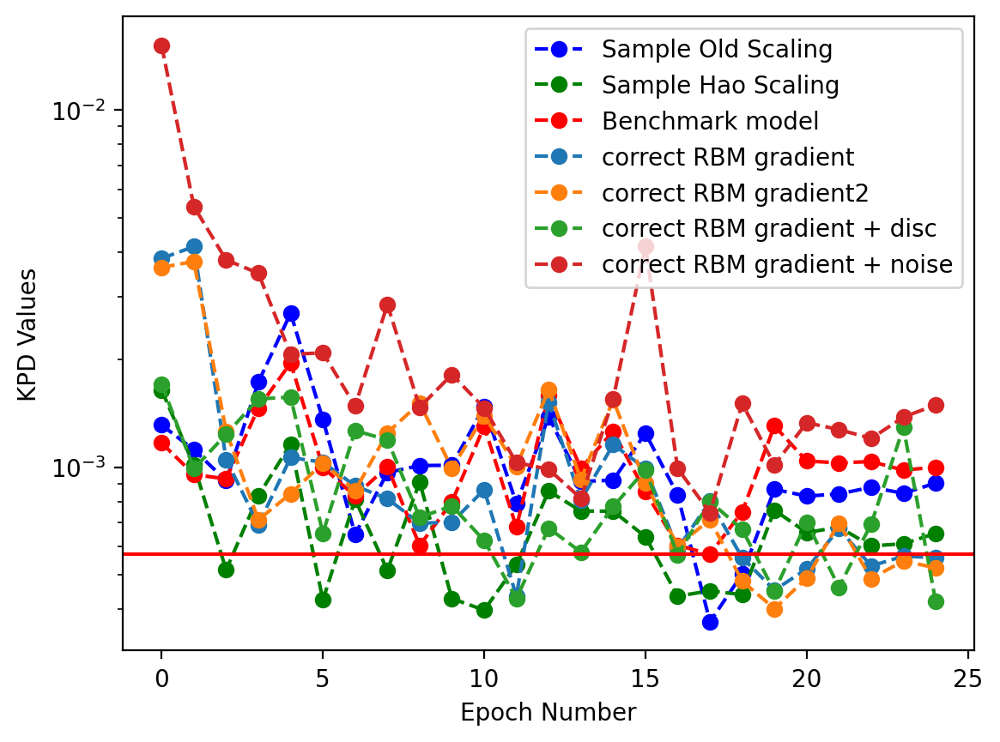

In [8]:

# import h5py
# with h5py.File("/home/javier/RBM_weights.hdf5", 'w') as hdf_file:
#     for key, value in engine.model.prior.weight_dict.items():
#         # Each key-value pair in the dictionary becomes a dataset in the HDF5 file
#         hdf_file.create_dataset(key, data=value.detach().cpu())
        
# with h5py.File("/home/javier/RBM_biases.hdf5", 'w') as hdf_file:
#     for key, value in engine.model.prior.bias_dict.items():
#         # Each key-value pair in the dictionary becomes a dataset in the HDF5 file
#         hdf_file.create_dataset(key, data=value.detach().cpu())

f_rbmCentered = np.load("/home/javier/Projects/CaloQVAE/outputs/2024-12-18/22-03-41/wandb/run-20241218_220342-nqwgiewh/files/JetData.npz")
f_rbmCentered2 = np.load("/home/javier/Projects/CaloQVAE/outputs/2024-12-18/22-03-41/wandb/run-20250121_132833-nqwgiewh/files/JetData.npz")
f_rbmCentered_HaoScaling = np.load("/home/javier/Projects/CaloQVAE/outputs/2024-12-24/16-23-58/wandb/run-20241224_162359-6xh18drf/files/JetData.npz")
f_livelyeGrass = np.load("/home/javier/Projects/CaloQVAE/outputs/2024-10-21/19-59-47/wandb/run-20241021_195948-809lp14l/files/JetData.npz")
f_fully = np.load("/home/javier/Projects/CaloQVAE/outputs/2025-01-21/13-40-26/wandb/run-20250121_134027-18yz2gl1/files/JetData.npz")
f_Centered = np.load("/home/javier/Projects/CaloQVAE/outputs/2025-01-19/02-13-29/wandb/run-20250121_132020-vj9yai2u/files/JetData.npz")
# f_rbm = np.load("/home/javier/Projects/CaloQVAE/outputs/2025-01-19/02-12-57/wandb/run-20250119_021258-4tg1wl7s/files/JetData.npz")
# f_rbm_flip = np.load("/home/javier/Projects/CaloQVAE/outputs/2025-01-24/17-42-08/wandb/run-20250124_174209-cktk5qod/files/JetData.npz")
f_rbm_correct = np.load("/home/javier/Projects/CaloQVAE/outputs/2025-01-27/13-05-45/wandb/run-20250127_130546-20iopzu3/files/JetData.npz")
f_rbm_correct2 = np.load("/home/javier/Projects/CaloQVAE/outputs/2025-01-28/00-26-28/wandb/run-20250128_002629-1aipg0dn/files/JetData.npz")
f_rbm_disc1 = np.load("/home/javier/Projects/CaloQVAE/outputs/2025-01-19/02-14-35/wandb/run-20250119_021436-f0vh2kl3/files/JetData.npz")

f_rbm_sa = np.load("/home/javier/Projects/CaloQVAE/outputs/2025-02-12/19-24-29/wandb/run-20250212_192430-s0rwfc1d/files/JetData.npz")

plt.plot(f_rbmCentered["array5"], '--o', color='blue', label='Sample Old Scaling')
# plt.plot(f_rbmCentered2["array5"], '--o', color='blue', label='Sample Old Scaling2')
plt.plot(f_rbmCentered_HaoScaling["array5"], '--o', color='green', label='Sample Hao Scaling')
plt.plot(f_livelyeGrass["array5"], '--o', color='red', label='Benchmark model')
# plt.plot(f_fully["array5"], '--o', label='Fully Connect + correct RBM gradient + centered')
# plt.plot(f_Centered["array5"], '--o', label='correct RBM gradient + centered')
plt.plot(f_rbm_correct["array5"], '--o', label='correct RBM gradient')
plt.plot(f_rbm_correct2["array5"], '--o', label='correct RBM gradient2')
plt.plot(f_rbm_disc1["array5"], '--o', label='correct RBM gradient + disc')

plt.plot(f_rbm_sa["array5"], '--o', label='correct RBM gradient + noise')
plt.xlabel('Epoch Number')
plt.ylabel('KPD Values')
plt.yscale("log")
plt.axhline(y=0.00057, color='r', linestyle='-')
plt.legend()
plt.show()

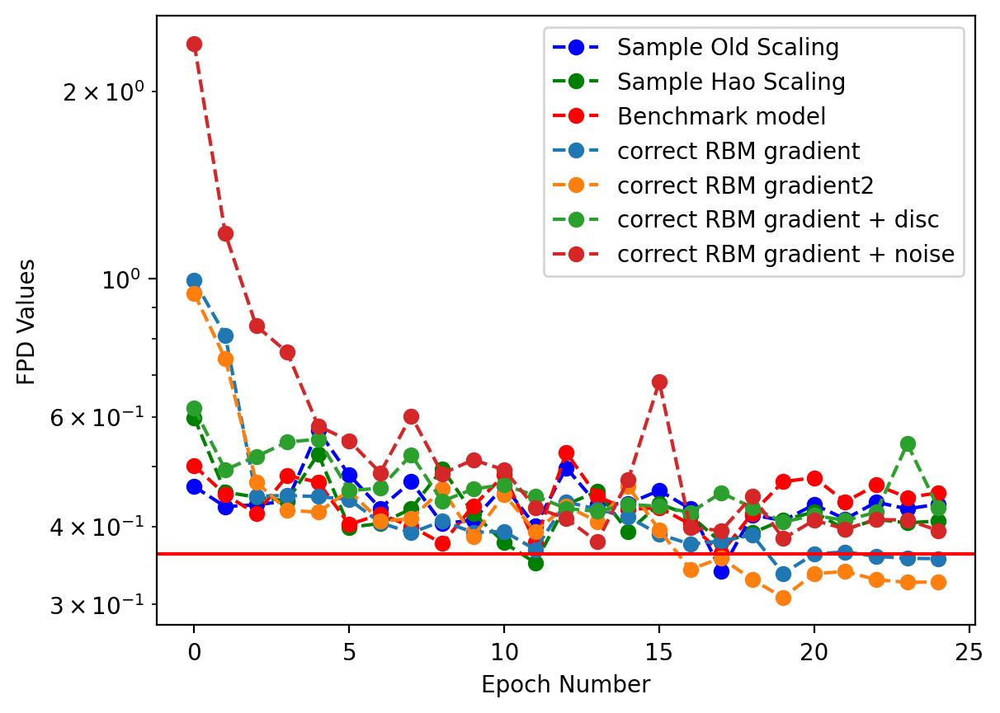

In [9]:
# # hfont = {'fontname':'Helvetica'}
# # ds = {'electron-ds2':'Dataset 2', 'pion1':'Dataset 1: π'}
plt.plot(f_rbmCentered["array4"], '--o', color='blue', label='Sample Old Scaling')
# plt.plot(f_rbmCentered2["array4"], '--o', color='blue', label='Sample Old Scaling2')
plt.plot(f_rbmCentered_HaoScaling["array4"], '--o', color='green', label='Sample Hao Scaling')
plt.plot(f_livelyeGrass["array4"], '--o', color='red', label='Benchmark model')
# plt.plot(f_fully["array4"], '--o', label='Fully')
# plt.plot(f_Centered["array4"], '--o', label='correct RBM gradient + centered')
plt.plot(f_rbm_correct["array4"], '--o', label='correct RBM gradient')
plt.plot(f_rbm_correct2["array4"], '--o', label='correct RBM gradient2')
plt.plot(f_rbm_disc1["array4"], '--o', label='correct RBM gradient + disc')

plt.plot(f_rbm_sa["array4"], '--o', label='correct RBM gradient + noise')
plt.xlabel('Epoch Number')
plt.ylabel('FPD Values')
plt.yscale('log')
plt.axhline(y=0.362, color='r', linestyle='-')
plt.legend()
plt.show()

In [38]:
xx = next(iter(train_loader))
in_data, true_energy, in_data_flat = engine._preprocess(xx[0],xx[1]) # input , label

torch.Size([1024, 2352])


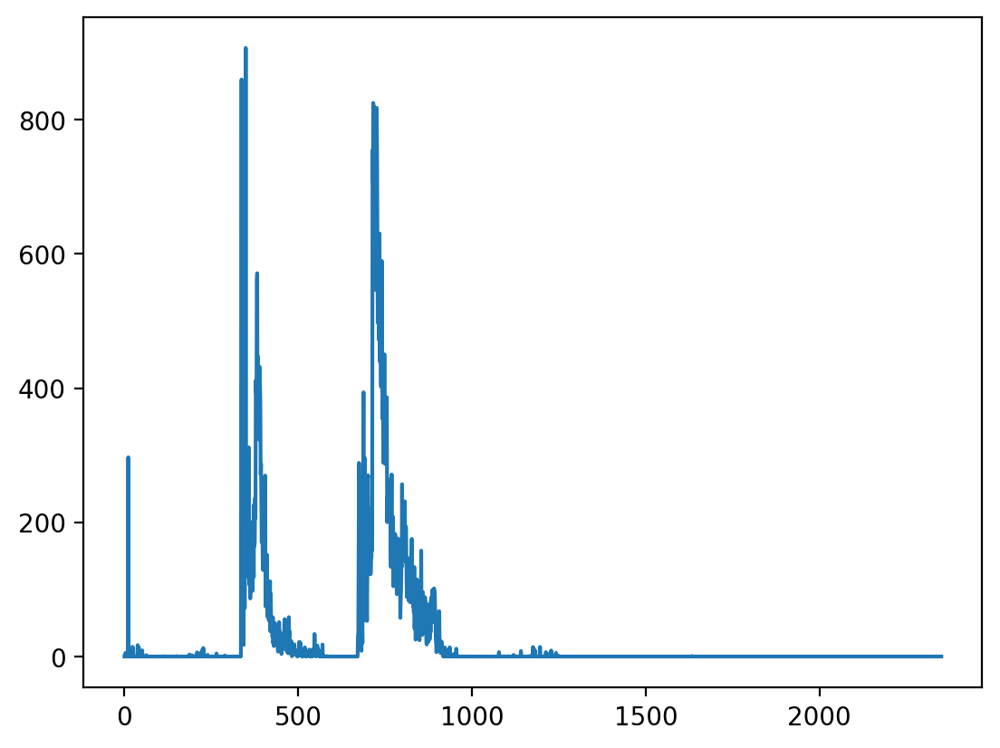

In [39]:
print(in_data.shape)
plt.plot(in_data.cpu().numpy()[3,:])

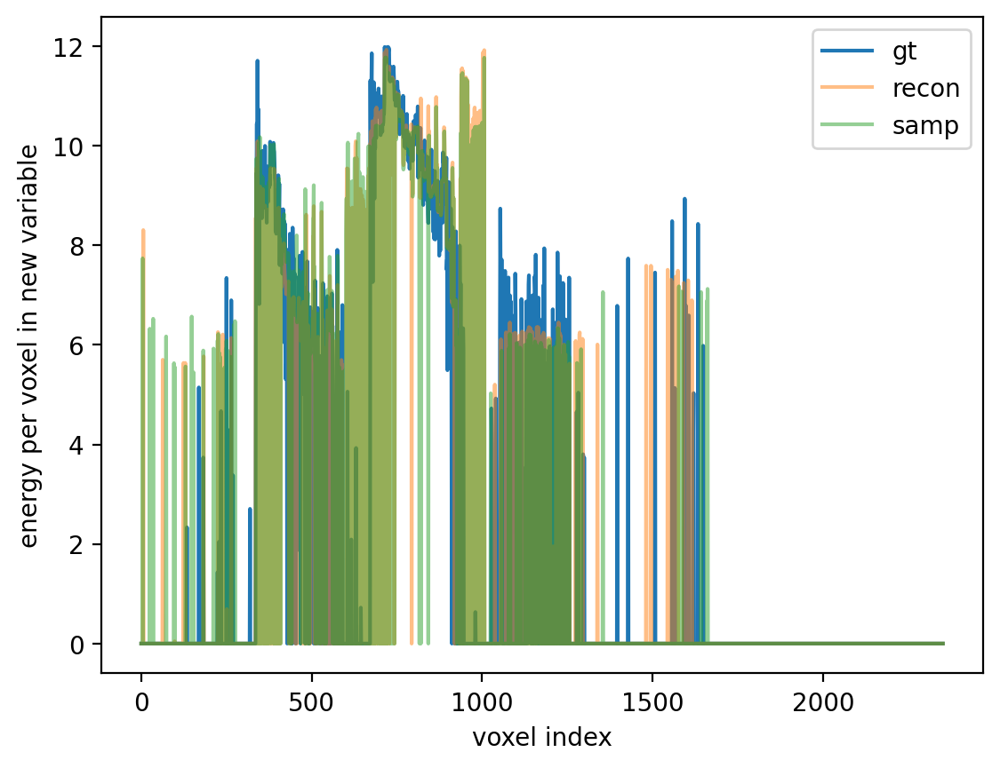

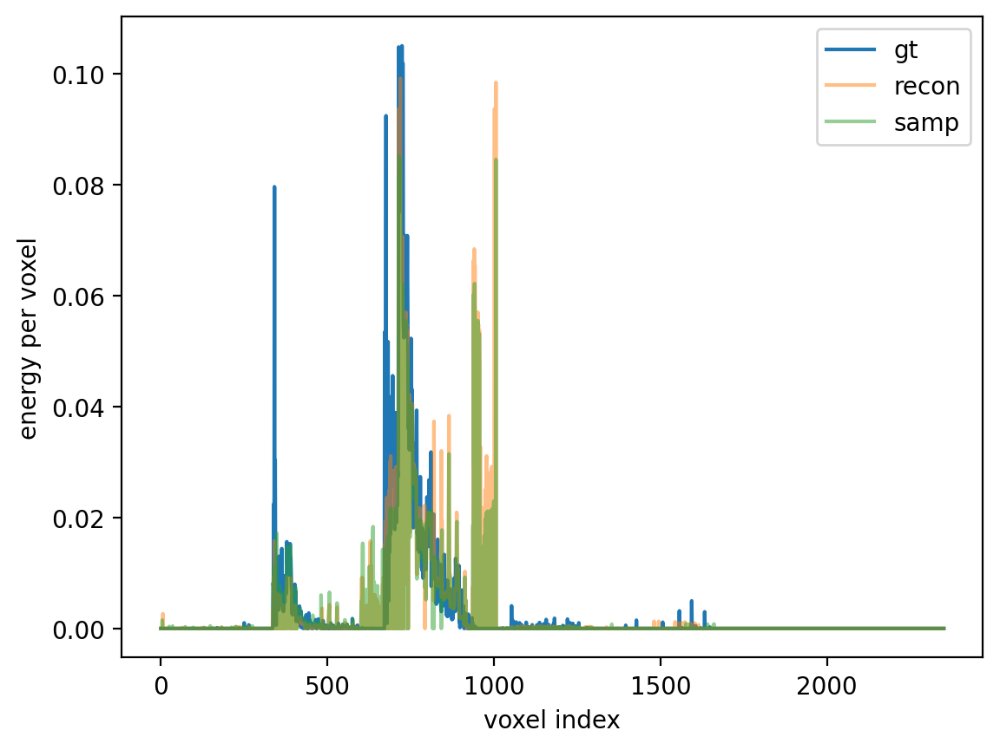

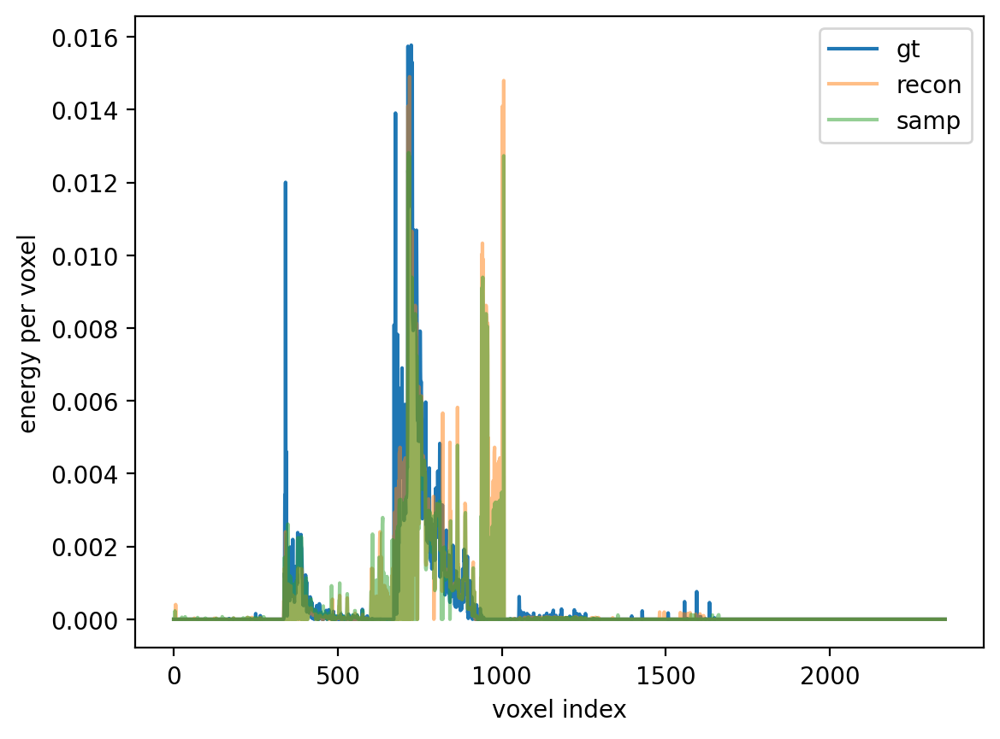

tensor([65536.], device='cuda:4') tensor(64555.1250, device='cuda:4')


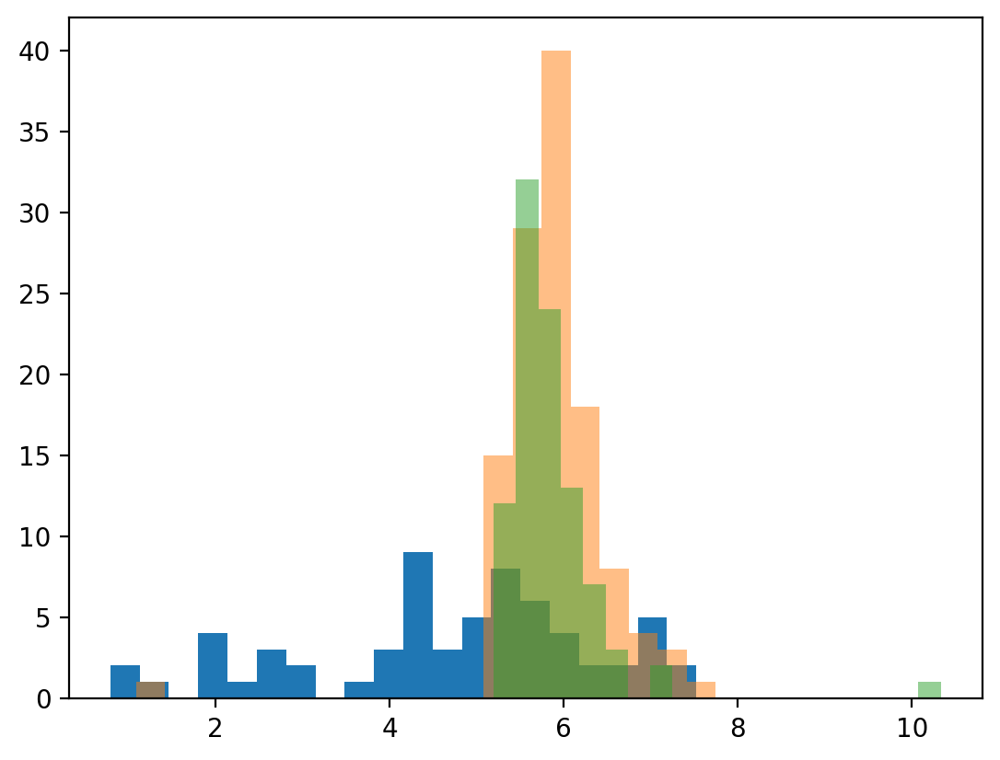

In [49]:
engine.model.eval()
with torch.no_grad():
    in_data, true_energy, in_data_flat = engine._preprocess(xx[0],xx[1])
    if True: #reducedata:
        in_data = engine._reduce(in_data, true_energy)
    fwd_output = engine.model((in_data, true_energy), True)
    engine._model.sampler._batch_size = true_energy.shape[0]
    if True : #cond:
        sample_energies, sample_data = engine._model.generate_samples_cond(num_samples=true_energy.shape[0], true_energy=true_energy)
    else:
        sample_energies, sample_data = engine._model.generate_samples(num_samples=true_energy.shape[0], true_energy=true_energy)
    engine._model.sampler._batch_size = engine._config.engine.rbm_batch_size
idx = 22
plt.plot(in_data.cpu().numpy()[idx,:])
plt.plot(fwd_output.output_activations.detach().cpu().numpy()[idx,:], alpha=0.5)
plt.plot(sample_data.detach().cpu().numpy()[idx,:], alpha=0.5)
plt.legend(["gt","recon","samp"])
plt.xlabel("voxel index")
plt.ylabel("energy per voxel in new variable")
plt.show()

plt.plot(engine._reduceinv(in_data,true_energy,1e-11).cpu().numpy()[idx,:])
plt.plot(engine._reduceinv(fwd_output.output_activations,true_energy,1e-11).detach().cpu().numpy()[idx,:], alpha=0.5)
plt.plot(engine._reduceinv(sample_data, true_energy,1e-11).detach().cpu().numpy()[idx,:], alpha=0.5)
plt.legend(["gt","recon","samp"])
plt.xlabel("voxel index")
plt.ylabel("energy per voxel")
plt.show()

plt.plot(engine._reduceinv(in_data,true_energy).cpu().numpy()[idx,:]/true_energy.cpu().numpy()[idx,0])
plt.plot(engine._reduceinv(fwd_output.output_activations,true_energy).detach().cpu().numpy()[idx,:]/true_energy.cpu().numpy()[idx,0], alpha=0.5)
plt.plot(engine._reduceinv(sample_data, true_energy).detach().cpu().numpy()[idx,:]/true_energy.cpu().numpy()[idx,0], alpha=0.5)
plt.legend(["gt","recon","samp"])
plt.xlabel("voxel index")
plt.ylabel("energy per voxel")
plt.show()

print(true_energy[idx,:], engine._reduceinv(in_data, true_energy)[idx,:].sum())

idx=144*10 + 9*3+1
plt.hist(in_data[:,idx][in_data[:,idx]>0].detach().cpu(), bins=20)
plt.hist(fwd_output.output_activations[:,idx][fwd_output.output_activations[:,idx]>0.1].detach().cpu(),bins=20, alpha=0.5)
plt.hist(sample_data[:,idx][sample_data[:,idx]>0].detach().cpu(),bins=20, alpha=0.5)
plt.show()


In [50]:
# fwd_output.post_samples[0][1,:]
# true_energy.max().log2()

3.62653 3.8620276 3.9146142
2.4472044 2.791882 2.7024486


(array([ 37., 205., 102.,  66.,  48.,  34., 108.,  96.,  77.,  41.]),
 array([ 4.39641857,  5.14768457,  5.8989501 ,  6.6502161 ,  7.40148163,
         8.15274811,  8.90401363,  9.65527916, 10.40654469, 11.15781116,
        11.90907669]),
 <BarContainer object of 10 artists>)

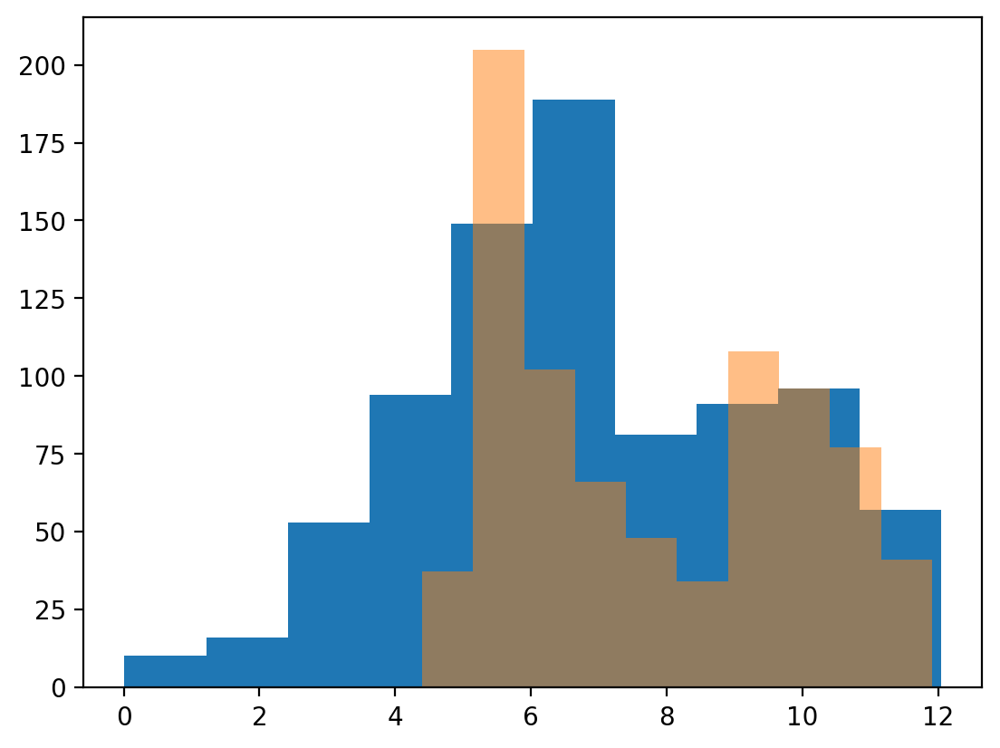

In [17]:
idx=21
print(in_data.cpu().numpy()[idx,:].std(), 
          fwd_output.output_activations.detach().cpu().numpy()[idx,:].std(), 
         sample_data.detach().cpu().numpy()[idx,:].std())
print(in_data.cpu().numpy()[idx,:].mean(), 
          fwd_output.output_activations.detach().cpu().numpy()[idx,:].mean(), 
         sample_data.detach().cpu().numpy()[idx,:].mean())
plt.hist(in_data[idx,:][in_data[idx,:]>0].cpu().numpy())
# plt.plot(fwd_output.output_activations.detach().cpu().std(axis=1).numpy(), alpha=0.5)
plt.hist(sample_data.detach()[idx,:][sample_data.detach()[idx,:]>0].cpu().numpy(), alpha=0.5)
# in_data.cpu().max(axis=1)


In [216]:
idx=21
# plt.plot(engine._reduceinv(in_data,true_energy).cpu().numpy()[idx,:])
# plt.plot(engine._reduceinv(fwd_output.output_activations,true_energy).detach().cpu().numpy()[idx,:], alpha=0.5)
print(engine._reduceinv(fwd_output.output_activations, true_energy).detach().cpu().numpy()[idx,:].argmax())
print(fwd_output.output_activations.detach().cpu().max(), fwd_output.output_activations.detach().cpu()[idx,:].argmax())
def sigmoid(z):
    return 1/(1 + np.exp(-z))

1980
tensor(15.2774) tensor(1980)


In [229]:
inp = torch.tensor([10.61])
(torch.sigmoid(inp + torch.log(torch.tensor([1e-7/(1-1e-7)])) ) - 1e-7)/(1-2*1e-7) 
# * true_energy
# x[torch.isclose(x, torch.tensor([0]).to(dtype=x.dtype, device=x.device)) ] = 0.0
sigmoid((10.61+np.log(1e-7/(1-1e-7))))
print(in_data.max() + np.log(1e-7/(1-1e-7)))
fwd_output.output_activations.detach().cpu().max() + np.log(1e-9/(1-1e-9))
in_data.max()

tensor(-0.8445, device='cuda:4')


tensor(15.2774)

(array([101473.,   7547.,   3855.,   2821.,   2650.,   2500.,   4950.,
          5535.,   8878., 169039.]),
 array([5.17999794e-25, 1.00000001e-01, 2.00000003e-01, 3.00000012e-01,
        4.00000006e-01, 5.00000000e-01, 6.00000024e-01, 6.99999988e-01,
        8.00000012e-01, 8.99999976e-01, 1.00000000e+00]),
 <BarContainer object of 10 artists>)

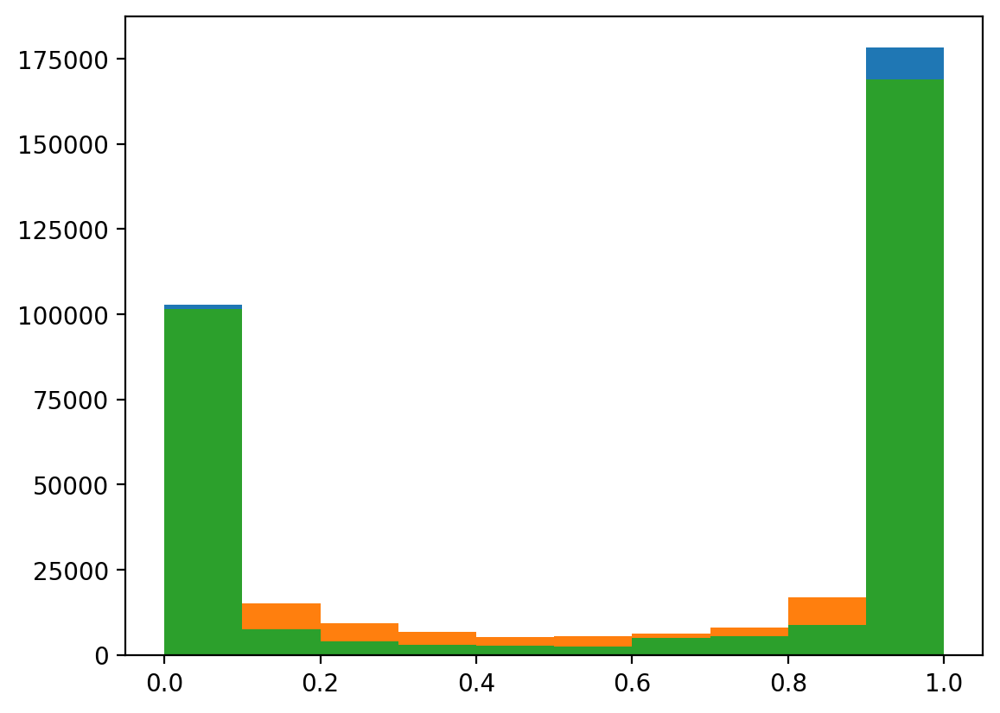

In [18]:
plt.hist(nn.Sigmoid()(fwd_output.post_logits[0]).view(-1).detach().cpu())
plt.hist(nn.Sigmoid()(fwd_output.post_logits[1]).view(-1).detach().cpu())
plt.hist(nn.Sigmoid()(fwd_output.post_logits[2]).view(-1).detach().cpu())

In [81]:
decoder_time = []
with torch.no_grad():
    for j,xx in enumerate(val_loader):
    # for xx in train_loader:
        in_data, true_energy, in_data_flat = engine._preprocess(xx[0],xx[1])
        #################################################
        # true_energy = true_energy[:n_samples4_qpu,:]
        # in_data = in_data[:n_samples4_qpu,:]
        #################################################
        if reducedata:
            in_data = engine._reduce(in_data, true_energy, R=R)
        # enIn = torch.cat((in_data, true_energy), dim=1)
        # beta, post_logits, post_samples = engine.model.encoder(enIn, False)
        beta, post_logits, post_samples = engine.model.encoder(in_data, true_energy, False)
        post_samples = torch.cat(post_samples, 1)
        
        
        for i in range(100):
            # start = time.process_time()
            start = time.time()
            output_hits, output_activations = engine.model.decoder(post_samples, true_energy)
            torch.cuda.current_stream().synchronize()
            t1 = time.time()
            decoder_time.append(t1 - start)
            # decoder_time.append(time.process_time() - start)
            
        if j>1:
            break

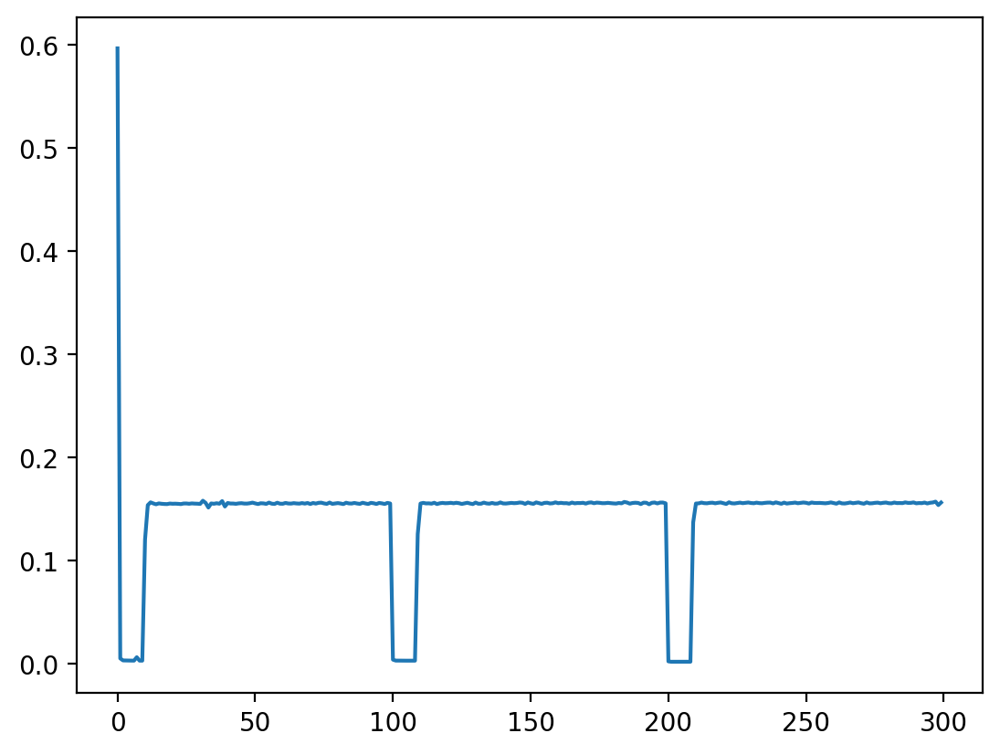

torch.Size([1024, 1208])


0.00015032058581709862

In [86]:
plt.plot(decoder_time)
plt.show()
print(post_samples.shape)
# decoder_time
0.15392827987670898/1024

In [204]:
modelname = 'stilted-disco-503_two'

In [51]:
directory_path = f'/home/javier/Projects/CaloQVAE/figs/{modelname}'
if not os.path.isdir(directory_path):
    os.mkdir(directory_path) 
    print(modelname)
else:
    pass

dainty-tree-106


In [62]:
# #experiment 1
# beta_last = []
# itr = []
# for i in range(1000):
#     beta, beta_list, rbm_energy_list, dwave_energy_list, thrsh_met = engine.model.find_beta( num_reads=256, beta_init=beta0, lr=0.01, num_epochs = 30, delta = 4.0, method = 2, 
#                                                                                         TOL=True, const = 1.0, adaptive = True)
#     beta0 = beta
#     beta_last.append(beta0)
#     itr.append(len(beta_list))
    
# #experiment 2
# beta_last_cond = []
# itr_cond = []
# for i in range(1000):
#     beta, beta_list, rbm_energy_list, dwave_energy_list, thrsh_met = engine.model.find_beta_cond([50000], dev, 20, num_reads=256, beta_init=beta0, lr=0.01, num_epochs = 30, delta = 4.0, method = 1, TOL=True, const = 1.0, adaptive = False)
#     beta0 = beta
#     beta_last_cond.append(beta0)
#     itr_cond.append(len(beta_list))

In [64]:
print(np.std(beta_last_cond)/np.mean(beta_last_cond))
print(np.std(beta_last)/np.mean(beta_last))

0.032444947101024454
0.029668771027021503


In [64]:
beta, beta_list, rbm_energy_list, dwave_energy_list, thrsh_met = engine.model.find_beta( num_reads=1028, beta_init=27.29, lr=0.01, num_epochs = 30, delta = 4.0, method = 2, 
                                                                                        TOL=True, const = 1.0, adaptive = True)
beta0 = beta

[14:24:21.692] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 27.29, RBM s_E = 25.03087615966797, DW s_E = 55.50874328613281
[14:24:24.231] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 2.0, RBM s_E = 25.03087615966797, DW s_E = 8.486051559448242
[14:24:26.830] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 122.70414121549486, RBM s_E = 25.03087615966797, DW s_E = 57.983158111572266
[14:24:29.670] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 2.0, RBM s_E = 25.03087615966797, DW s_E = 8.723799705505371
[14:24:32.235] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 93.15749386760523, RBM s_E = 25.03087615966797, DW s_E = 58.66809844970703
[14:24:34.226] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 2.0, RBM s_E = 25.03087615966797, DW s_E = 8.82117748260498
[14:24:36.347] INFO   models.autoencoders.AtlasConditionalQVAE          Epo

KeyboardInterrupt: 

In [18]:
beta, beta_list, rbm_energy_list, dwave_energy_list, thrsh_met = engine.model.find_beta_cond([1499], dev, 20, num_reads=1028, beta_init=7.29, lr=0.01, num_epochs = 30, delta = 4.0, method = 2, TOL=True, const = 1.0, adaptive = True)
beta0 = beta

[12:44:45.979] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.29, RBM s_E = 15.118021965026855, DW s_E = 12.642029762268066
[12:44:48.211] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 8.629909074266834, RBM s_E = 15.118021965026855, DW s_E = 15.51934814453125
[12:44:50.385] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 8.476401536078171, RBM s_E = 15.118021965026855, DW s_E = 15.938573837280273
[12:44:52.257] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 8.352623939619624, RBM s_E = 15.118021965026855, DW s_E = 15.41100788116455
[12:44:54.149] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 8.415898340200236, RBM s_E = 15.118021965026855, DW s_E = 15.944143295288086
[12:44:55.694] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 8.348242120173449, RBM s_E = 15.118021965026855, DW s_E = 15.899394989013672
[12:44:56.969] INFO   mod

In [38]:
beta, beta_list, rbm_energy_list, dwave_energy_list, thrsh_met = engine.model.find_beta_condv2([50000], dev, 20, num_reads=256, beta_init=4.29, lr=0.01, num_epochs = 30, delta = 4.0, method = 1, TOL=True, const = 1.0, adaptive = False)
# beta, beta_list, rbm_energy_list, dwave_energy_list, thrsh_met = engine.model.find_beta_condv2(None, dev, 16, num_reads=512, beta_init=5.29, lr=0.01, num_epochs = 30, delta = 4.0, method = 2, TOL=True, const = 1.0, adaptive = True)
beta0 = beta

[15:56:26.614] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 4.29, RBM s_E = 13.18724536895752, DW s_E = 9.763916969299316
[15:56:36.056] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 4.552626953125, RBM s_E = 13.18724536895752, DW s_E = 10.452006340026855
[15:56:45.760] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 4.757772216796876, RBM s_E = 13.18724536895752, DW s_E = 12.206669807434082
[15:56:55.288] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 4.90465576171875, RBM s_E = 13.18724536895752, DW s_E = 12.748692512512207
[15:57:04.683] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 5.014658203125, RBM s_E = 13.18724536895752, DW s_E = 12.000612258911133
[15:57:14.384] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 5.100288085937501, RBM s_E = 13.18724536895752, DW s_E = 12.417542457580566
[15:57:23.941] INFO   models.autoenco

In [19]:

idx = torch.multinomial(torch.arange(true_energy.shape[0]).to(dtype=torch.float), true_energy.shape[0], replacement=False).to(dtype=torch.int).numpy()
true_energy[1:2,:]

tensor([[12282.0645]], device='cuda:4')

In [21]:
beta_l, stdRBM, stdDW, mRBM, mDW = [],[],[],[],[]
# beta0=7.29

with torch.no_grad():
    for i,xx in enumerate(val_loader):
        in_data, true_energy, in_data_flat = engine._preprocess(xx[0],xx[1])
        for ii in range(true_energy.shape[0]):
            print(i,ii)
            tr1 = true_energy[ii:ii+1,:]

            beta, beta_list, rbm_energy_list, dwave_energy_list, thrsh_met = engine.model.find_beta_cond([tr1.item()], dev, 20, num_reads=256, beta_init=beta0, lr=0.01, num_epochs = 30, delta = 4.0, method = 2, TOL=True, const = 1.0, adaptive = True)
            beta0 = beta
            sample_energies_qpu, sample_data_qpu = engine.model.generate_samples_qpu_cond(true_energy=tr1, num_samples=tr1.shape[0], thrsh=16, beta=1/beta0, t=0.0, est_beta=False)
            beta_l.append(beta_list[-1])
            stdDW.append(np.std(dwave_energy_list[-1]))
            stdRBM.append(np.std(rbm_energy_list[-1]))
            mDW.append(np.mean(dwave_energy_list[-1]))
            mRBM.append(np.mean(rbm_energy_list[-1]))
            
        if i>=0:
            break

0 0


[18:11:15.665] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.509676828329932, RBM s_E = 13.02674674987793, DW s_E = 11.382624626159668
[18:11:17.108] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.716137446033346, RBM s_E = 13.02674674987793, DW s_E = 13.949356079101562
[18:11:18.530] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.669246961681043, RBM s_E = 13.02674674987793, DW s_E = 14.835844993591309
[18:11:19.497] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.616742435824867, RBM s_E = 13.02674674987793, DW s_E = 15.038008689880371
[18:11:20.439] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.541186278767326, RBM s_E = 13.02674674987793, DW s_E = 14.013373374938965
[18:11:21.357] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.619340041807806, RBM s_E = 13.02674674987793, DW s_E = 14.56013011932373


0 1


[18:11:23.398] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.619340041807806, RBM s_E = 13.981860160827637, DW s_E = 14.280534744262695
[18:11:24.308] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.527209635119446, RBM s_E = 13.981860160827637, DW s_E = 14.382463455200195


0 2


[18:11:26.302] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.527209635119446, RBM s_E = 13.314979553222656, DW s_E = 14.17557144165039
[18:11:27.233] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.590873727536955, RBM s_E = 13.314979553222656, DW s_E = 15.562695503234863
[18:11:28.158] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.536515962056723, RBM s_E = 13.314979553222656, DW s_E = 14.458948135375977
[18:11:29.135] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.582487579270924, RBM s_E = 13.314979553222656, DW s_E = 14.359917640686035


0 3


[18:11:31.121] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.582487579270924, RBM s_E = 13.516364097595215, DW s_E = 14.050646781921387


0 4


[18:11:33.135] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.582487579270924, RBM s_E = 13.084107398986816, DW s_E = 12.62438678741455


0 5


[18:11:35.130] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.582487579270924, RBM s_E = 13.126502990722656, DW s_E = 14.74988842010498
[18:11:36.048] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.495837663114279, RBM s_E = 13.126502990722656, DW s_E = 15.215073585510254
[18:11:37.184] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.4236177766777045, RBM s_E = 13.126502990722656, DW s_E = 14.86751937866211
[18:11:38.126] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.491819061521159, RBM s_E = 13.126502990722656, DW s_E = 13.631609916687012


0 6


[18:11:40.160] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.491819061521159, RBM s_E = 14.237629890441895, DW s_E = 13.406651496887207


0 7


[18:11:42.154] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.491819061521159, RBM s_E = 12.620864868164062, DW s_E = 15.046801567077637


0 8


[18:11:44.180] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.491819061521159, RBM s_E = 13.412256240844727, DW s_E = 15.308616638183594
[18:11:45.141] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.432866393234971, RBM s_E = 13.412256240844727, DW s_E = 14.006709098815918
[18:11:46.092] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.549547323221739, RBM s_E = 13.412256240844727, DW s_E = 13.915176391601562


0 9


[18:11:48.144] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.549547323221739, RBM s_E = 13.510059356689453, DW s_E = 15.102648735046387
[18:11:49.106] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.515237488734689, RBM s_E = 13.510059356689453, DW s_E = 15.414534568786621
[18:11:50.036] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.370339888307388, RBM s_E = 13.510059356689453, DW s_E = 13.720938682556152
[18:11:50.979] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.490567708650756, RBM s_E = 13.510059356689453, DW s_E = 15.607620239257812
[18:11:51.901] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.441150672967386, RBM s_E = 13.510059356689453, DW s_E = 14.049293518066406


0 10


[18:11:53.954] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.441150672967386, RBM s_E = 13.166633605957031, DW s_E = 15.54299259185791


0 11


[18:11:55.897] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.441150672967386, RBM s_E = 13.146079063415527, DW s_E = 14.374865531921387
[18:11:56.829] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.475924153313163, RBM s_E = 13.146079063415527, DW s_E = 12.629266738891602
[18:11:57.751] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.665923312191236, RBM s_E = 13.146079063415527, DW s_E = 13.135958671569824
[18:11:58.680] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.581263105204277, RBM s_E = 13.146079063415527, DW s_E = 13.832345008850098
[18:11:59.596] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.441115908615065, RBM s_E = 13.146079063415527, DW s_E = 14.031733512878418
[18:12:00.532] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.543231333309039, RBM s_E = 13.146079063415527, DW s_E = 13.99261474609375


0 12


[18:12:02.505] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.543231333309039, RBM s_E = 12.583984375, DW s_E = 13.756567001342773


0 13


[18:12:04.492] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.543231333309039, RBM s_E = 13.349961280822754, DW s_E = 15.449615478515625


0 14


[18:12:06.522] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.543231333309039, RBM s_E = 13.397908210754395, DW s_E = 14.213363647460938
[18:12:07.440] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.580388120474586, RBM s_E = 13.397908210754395, DW s_E = 15.580801963806152
[18:12:08.370] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.446606672411458, RBM s_E = 13.397908210754395, DW s_E = 14.277637481689453
[18:12:09.405] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.5958726608712395, RBM s_E = 13.397908210754395, DW s_E = 15.100814819335938
[18:12:10.364] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.563186427791549, RBM s_E = 13.397908210754395, DW s_E = 14.541847229003906
[18:12:11.316] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.495893315873392, RBM s_E = 13.397908210754395, DW s_E = 14.777708053588867
[18:12:12

0 15


[18:12:14.250] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.55784400965074, RBM s_E = 12.960565567016602, DW s_E = 13.515313148498535
[18:12:15.169] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.614197926881342, RBM s_E = 12.960565567016602, DW s_E = 14.864185333251953
[18:12:16.089] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.464371776637199, RBM s_E = 12.960565567016602, DW s_E = 14.26645565032959
[18:12:17.040] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.642733128455936, RBM s_E = 12.960565567016602, DW s_E = 15.960533142089844
[18:12:17.987] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.4975152136727665, RBM s_E = 12.960565567016602, DW s_E = 13.750868797302246
[18:12:18.916] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.594161486131533, RBM s_E = 12.960565567016602, DW s_E = 13.961626052856445


0 16


[18:12:20.955] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.594161486131533, RBM s_E = 12.600658416748047, DW s_E = 14.731250762939453


0 17


[18:12:22.976] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.594161486131533, RBM s_E = 13.297008514404297, DW s_E = 15.726003646850586
[18:12:23.897] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.633926225554995, RBM s_E = 13.297008514404297, DW s_E = 14.770986557006836


0 18


[18:12:25.872] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.633926225554995, RBM s_E = 13.146408081054688, DW s_E = 14.791791915893555
[18:12:26.793] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.52782003614137, RBM s_E = 13.146408081054688, DW s_E = 14.0274076461792
[18:12:27.717] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.471515314842888, RBM s_E = 13.146408081054688, DW s_E = 13.547325134277344
[18:12:28.647] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.561725401208805, RBM s_E = 13.146408081054688, DW s_E = 13.695687294006348
[18:12:29.581] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.430653313243898, RBM s_E = 13.146408081054688, DW s_E = 14.239441871643066
[18:12:30.522] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.515778419146215, RBM s_E = 13.146408081054688, DW s_E = 14.743724822998047
[18:12:31.469

0 19


[18:12:34.390] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.57340300258971, RBM s_E = 13.028877258300781, DW s_E = 14.3056640625
[18:12:35.300] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.645089007347911, RBM s_E = 13.028877258300781, DW s_E = 15.226305961608887
[18:12:36.221] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.538842827042518, RBM s_E = 13.028877258300781, DW s_E = 14.876203536987305
[18:12:37.150] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.607969512639906, RBM s_E = 13.028877258300781, DW s_E = 14.70959186553955
[18:12:38.183] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.503920382401571, RBM s_E = 13.028877258300781, DW s_E = 13.219253540039062
[18:12:39.121] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.3980997895232585, RBM s_E = 13.028877258300781, DW s_E = 13.88132381439209
[18:12:40.040] IN

0 20


[18:12:49.263] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.51732367774198, RBM s_E = 12.457535743713379, DW s_E = 14.226219177246094
[18:12:50.179] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.597165044715292, RBM s_E = 12.457535743713379, DW s_E = 14.414412498474121
[18:12:51.097] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.539085439526965, RBM s_E = 12.457535743713379, DW s_E = 14.398180961608887


0 21


[18:12:53.115] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.539085439526965, RBM s_E = 13.583273887634277, DW s_E = 15.011885643005371
[18:12:54.057] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.485607616724405, RBM s_E = 13.583273887634277, DW s_E = 14.4400634765625


0 22


[18:12:56.089] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.485607616724405, RBM s_E = 13.670174598693848, DW s_E = 16.038253784179688
[18:12:57.020] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.379010232264401, RBM s_E = 13.670174598693848, DW s_E = 14.443170547485352
[18:12:57.933] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.478876790734143, RBM s_E = 13.670174598693848, DW s_E = 15.018216133117676


0 23


[18:12:59.929] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.478876790734143, RBM s_E = 13.249382972717285, DW s_E = 13.228652000427246


0 24


[18:13:01.926] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.478876790734143, RBM s_E = 13.53242301940918, DW s_E = 13.510318756103516


0 25


[18:13:03.916] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.478876790734143, RBM s_E = 13.472558975219727, DW s_E = 13.967513084411621
[18:13:04.838] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.442260239643808, RBM s_E = 13.472558975219727, DW s_E = 14.773825645446777
[18:13:05.762] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.3816556830839275, RBM s_E = 13.472558975219727, DW s_E = 14.07079029083252
[18:13:06.692] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.511315551770706, RBM s_E = 13.472558975219727, DW s_E = 14.834385871887207


0 26


[18:13:08.712] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.511315551770706, RBM s_E = 13.864313125610352, DW s_E = 15.245585441589355
[18:13:09.620] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.415570046437554, RBM s_E = 13.864313125610352, DW s_E = 13.476253509521484


0 27


[18:13:11.620] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.415570046437554, RBM s_E = 13.03647232055664, DW s_E = 14.29704475402832


0 28


[18:13:13.557] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.415570046437554, RBM s_E = 14.133162498474121, DW s_E = 13.992881774902344
[18:13:14.495] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.353628268852132, RBM s_E = 14.133162498474121, DW s_E = 13.446300506591797
[18:13:15.422] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.556954766368674, RBM s_E = 14.133162498474121, DW s_E = 15.488070487976074
[18:13:16.361] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.453818773006787, RBM s_E = 14.133162498474121, DW s_E = 15.261839866638184
[18:13:17.311] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.409040563908376, RBM s_E = 14.133162498474121, DW s_E = 14.558727264404297
[18:13:18.241] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.323064893068758, RBM s_E = 14.133162498474121, DW s_E = 13.395136833190918


0 29


[18:13:20.228] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.323064893068758, RBM s_E = 13.145713806152344, DW s_E = 12.87534236907959
[18:13:21.143] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.523924599320954, RBM s_E = 13.145713806152344, DW s_E = 15.185945510864258
[18:13:22.086] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.409348247477977, RBM s_E = 13.145713806152344, DW s_E = 14.670052528381348
[18:13:23.029] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.504464115442124, RBM s_E = 13.145713806152344, DW s_E = 14.23326301574707


0 30


[18:13:25.032] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.504464115442124, RBM s_E = 13.263152122497559, DW s_E = 15.485503196716309
[18:13:25.944] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.435422520987415, RBM s_E = 13.263152122497559, DW s_E = 13.811067581176758
[18:13:26.861] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.5043409468036275, RBM s_E = 13.263152122497559, DW s_E = 16.295316696166992
[18:13:27.780] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.230608805990619, RBM s_E = 13.263152122497559, DW s_E = 13.845355987548828
[18:13:28.720] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.268754168946605, RBM s_E = 13.263152122497559, DW s_E = 13.133625030517578


0 31


[18:13:30.701] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.268754168946605, RBM s_E = 13.334492683410645, DW s_E = 13.90600299835205
[18:13:31.611] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.335227485752872, RBM s_E = 13.334492683410645, DW s_E = 14.742356300354004


0 32


[18:13:33.638] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.335227485752872, RBM s_E = 14.036355972290039, DW s_E = 14.452628135681152
[18:13:34.559] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.4353771890563785, RBM s_E = 14.036355972290039, DW s_E = 14.942387580871582
[18:13:35.473] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.397808075979729, RBM s_E = 14.036355972290039, DW s_E = 13.12604808807373
[18:13:36.403] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.4783203297919725, RBM s_E = 14.036355972290039, DW s_E = 14.516817092895508
[18:13:37.319] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.435219600184906, RBM s_E = 14.036355972290039, DW s_E = 14.163655281066895
[18:13:38.270] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.513479403280115, RBM s_E = 14.036355972290039, DW s_E = 15.116377830505371
[18:13:39

0 33


[18:13:45.871] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.476187429518873, RBM s_E = 13.318159103393555, DW s_E = 13.443314552307129
[18:13:46.795] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.565443692198917, RBM s_E = 13.318159103393555, DW s_E = 14.364656448364258
[18:13:47.718] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.487477441531161, RBM s_E = 13.318159103393555, DW s_E = 15.749616622924805
[18:13:48.688] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.384653208401669, RBM s_E = 13.318159103393555, DW s_E = 13.80209732055664
[18:13:49.639] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.456332622679176, RBM s_E = 13.318159103393555, DW s_E = 13.396408081054688


0 34


[18:13:51.632] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.456332622679176, RBM s_E = 13.953126907348633, DW s_E = 12.406235694885254
[18:13:52.624] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.591100471926896, RBM s_E = 13.953126907348633, DW s_E = 15.395877838134766
[18:13:53.543] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.4708956680304865, RBM s_E = 13.953126907348633, DW s_E = 12.966081619262695
[18:13:54.460] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.589270694286423, RBM s_E = 13.953126907348633, DW s_E = 14.482111930847168
[18:13:55.386] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.475998862488227, RBM s_E = 13.953126907348633, DW s_E = 14.07339859008789
[18:13:56.307] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.607817352421618, RBM s_E = 13.953126907348633, DW s_E = 14.122668266296387
[18:13:57.

0 35


[18:13:59.259] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.517310350648421, RBM s_E = 13.627531051635742, DW s_E = 15.248574256896973
[18:14:00.191] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.412780670537532, RBM s_E = 13.627531051635742, DW s_E = 14.531190872192383
[18:14:01.115] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.476027078383336, RBM s_E = 13.627531051635742, DW s_E = 13.940227508544922


0 36


[18:14:03.165] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.476027078383336, RBM s_E = 13.801410675048828, DW s_E = 14.228859901428223


0 37


[18:14:05.172] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.476027078383336, RBM s_E = 13.779409408569336, DW s_E = 13.01486873626709
[18:14:06.120] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.621140801025887, RBM s_E = 13.779409408569336, DW s_E = 15.864361763000488
[18:14:07.086] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.45338809554949, RBM s_E = 13.779409408569336, DW s_E = 13.542842864990234
[18:14:08.035] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.507306652600175, RBM s_E = 13.779409408569336, DW s_E = 13.91097354888916
[18:14:09.033] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.555642737889001, RBM s_E = 13.779409408569336, DW s_E = 15.755182266235352
[18:14:09.996] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.38367349636188, RBM s_E = 13.779409408569336, DW s_E = 14.091536521911621
[18:14:10.930]

0 38


[18:14:16.911] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.507778572858225, RBM s_E = 13.034053802490234, DW s_E = 14.552275657653809
[18:14:17.841] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.539588135284248, RBM s_E = 13.034053802490234, DW s_E = 14.136462211608887
[18:14:18.768] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.47752874744285, RBM s_E = 13.034053802490234, DW s_E = 12.252100944519043


0 39


[18:14:20.783] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.47752874744285, RBM s_E = 13.809501647949219, DW s_E = 14.046378135681152
[18:14:21.694] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.44398282640403, RBM s_E = 13.809501647949219, DW s_E = 12.390007019042969
[18:14:22.615] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.6472372670399436, RBM s_E = 13.809501647949219, DW s_E = 14.676139831542969
[18:14:23.542] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.516142240224704, RBM s_E = 13.809501647949219, DW s_E = 14.787670135498047


0 40


[18:14:25.562] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.516142240224704, RBM s_E = 13.636370658874512, DW s_E = 13.909022331237793
[18:14:26.469] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.423584442654223, RBM s_E = 13.636370658874512, DW s_E = 13.91122817993164
[18:14:27.382] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.559869432284979, RBM s_E = 13.636370658874512, DW s_E = 15.120895385742188
[18:14:28.303] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.485067926497802, RBM s_E = 13.636370658874512, DW s_E = 13.352924346923828


0 41


[18:14:30.297] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.485067926497802, RBM s_E = 12.88020133972168, DW s_E = 13.87244987487793
[18:14:31.261] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.59776143646178, RBM s_E = 12.88020133972168, DW s_E = 14.620194435119629


0 42


[18:14:33.278] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.59776143646178, RBM s_E = 14.074707984924316, DW s_E = 14.46998405456543
[18:14:34.196] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.52124992240798, RBM s_E = 14.074707984924316, DW s_E = 15.532027244567871
[18:14:35.114] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.4419293450251605, RBM s_E = 14.074707984924316, DW s_E = 13.795808792114258


0 43


[18:14:37.121] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.4419293450251605, RBM s_E = 13.017610549926758, DW s_E = 14.411904335021973


0 44


[18:14:39.122] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.4419293450251605, RBM s_E = 13.8506441116333, DW s_E = 14.965723037719727


0 45


[18:14:41.142] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.4419293450251605, RBM s_E = 14.068357467651367, DW s_E = 13.315393447875977
[18:14:42.086] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.529610802139657, RBM s_E = 14.068357467651367, DW s_E = 15.024334907531738
[18:14:43.020] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.4092295419588865, RBM s_E = 14.068357467651367, DW s_E = 14.094843864440918
[18:14:43.937] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.495407758369334, RBM s_E = 14.068357467651367, DW s_E = 14.652961730957031
[18:14:44.874] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.414365791280484, RBM s_E = 14.068357467651367, DW s_E = 14.34365177154541
[18:14:45.817] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.502693180158594, RBM s_E = 14.068357467651367, DW s_E = 14.192357063293457


0 46


[18:14:47.928] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.502693180158594, RBM s_E = 13.322707176208496, DW s_E = 14.032012939453125


0 47


[18:14:50.040] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.502693180158594, RBM s_E = 13.734307289123535, DW s_E = 12.479769706726074
[18:14:50.972] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.6228165470648985, RBM s_E = 13.734307289123535, DW s_E = 14.535905838012695


0 48


[18:14:52.997] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.6228165470648985, RBM s_E = 13.589452743530273, DW s_E = 14.1046781539917
[18:14:53.914] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.542727063421335, RBM s_E = 13.589452743530273, DW s_E = 14.567046165466309
[18:14:54.846] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.417385694254618, RBM s_E = 13.589452743530273, DW s_E = 13.881333351135254
[18:14:55.779] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.475638277806435, RBM s_E = 13.589452743530273, DW s_E = 13.352831840515137


0 49


[18:14:57.817] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.475638277806435, RBM s_E = 13.019147872924805, DW s_E = 14.202286720275879
[18:14:58.786] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.629833553206426, RBM s_E = 13.019147872924805, DW s_E = 14.193132400512695
[18:14:59.733] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.539818069486959, RBM s_E = 13.019147872924805, DW s_E = 13.768916130065918
[18:15:00.665] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.601391634862905, RBM s_E = 13.019147872924805, DW s_E = 14.319634437561035
[18:15:01.585] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.534352719823339, RBM s_E = 13.019147872924805, DW s_E = 14.193204879760742
[18:15:02.504] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.625503746332521, RBM s_E = 13.019147872924805, DW s_E = 14.536224365234375


0 50


[18:15:04.520] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.625503746332521, RBM s_E = 13.716976165771484, DW s_E = 14.288887023925781
[18:15:05.439] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.509389503334256, RBM s_E = 13.716976165771484, DW s_E = 14.587864875793457


0 51


[18:15:07.482] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.509389503334256, RBM s_E = 13.187612533569336, DW s_E = 16.018089294433594


0 52


[18:15:09.475] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.509389503334256, RBM s_E = 13.053751945495605, DW s_E = 14.102239608764648
[18:15:10.400] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.611964107047413, RBM s_E = 13.053751945495605, DW s_E = 14.866375923156738
[18:15:11.313] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.554876710178466, RBM s_E = 13.053751945495605, DW s_E = 14.166946411132812
[18:15:12.249] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.702786562985957, RBM s_E = 13.053751945495605, DW s_E = 14.515843391418457
[18:15:13.250] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.625606175176628, RBM s_E = 13.053751945495605, DW s_E = 15.696191787719727
[18:15:14.178] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.483220896814793, RBM s_E = 13.053751945495605, DW s_E = 12.87631607055664
[18:15:15.0

0 53


[18:15:20.906] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.631564010273135, RBM s_E = 14.060263633728027, DW s_E = 13.899652481079102
[18:15:21.830] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.538747568084309, RBM s_E = 14.060263633728027, DW s_E = 13.951622009277344
[18:15:22.751] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.426004092288455, RBM s_E = 14.060263633728027, DW s_E = 14.328417778015137
[18:15:23.673] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.554092183593889, RBM s_E = 14.060263633728027, DW s_E = 13.963096618652344
[18:15:24.630] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.3969200518645914, RBM s_E = 14.060263633728027, DW s_E = 13.159696578979492
[18:15:25.566] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.539372911132184, RBM s_E = 14.060263633728027, DW s_E = 14.358242988586426
[18:15:26

0 54


[18:15:29.518] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.418065103943884, RBM s_E = 13.058379173278809, DW s_E = 15.156209945678711
[18:15:30.486] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.4537601285799395, RBM s_E = 13.058379173278809, DW s_E = 14.31579303741455
[18:15:31.438] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.505362450999413, RBM s_E = 13.058379173278809, DW s_E = 14.648383140563965
[18:15:32.352] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.401257525197464, RBM s_E = 13.058379173278809, DW s_E = 14.637834548950195
[18:15:33.392] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.4467231199156165, RBM s_E = 13.058379173278809, DW s_E = 14.128787994384766
[18:15:34.438] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.406508155063646, RBM s_E = 13.058379173278809, DW s_E = 13.586491584777832
[18:15:35

0 55


[18:15:37.418] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.523671121192793, RBM s_E = 13.222707748413086, DW s_E = 14.579766273498535


0 56


[18:15:39.375] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.523671121192793, RBM s_E = 13.53041934967041, DW s_E = 13.936835289001465


0 57


[18:15:41.374] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.523671121192793, RBM s_E = 12.9381742477417, DW s_E = 14.832999229431152
[18:15:42.288] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.342482864361227, RBM s_E = 12.9381742477417, DW s_E = 13.269094467163086
[18:15:43.213] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.499457300559587, RBM s_E = 12.9381742477417, DW s_E = 14.727636337280273
[18:15:44.156] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.450801358197592, RBM s_E = 12.9381742477417, DW s_E = 14.009299278259277
[18:15:45.088] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.484234077172908, RBM s_E = 12.9381742477417, DW s_E = 14.243322372436523
[18:15:46.014] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.424507527570504, RBM s_E = 12.9381742477417, DW s_E = 12.832674980163574
[18:15:46.939] INFO   

0 58


[18:15:58.306] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.382234554250213, RBM s_E = 13.49365234375, DW s_E = 15.259453773498535


0 59


[18:16:00.328] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.382234554250213, RBM s_E = 13.506257057189941, DW s_E = 13.245437622070312
[18:16:01.253] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.529915553796975, RBM s_E = 13.506257057189941, DW s_E = 14.04854965209961
[18:16:02.165] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.327689051660438, RBM s_E = 13.506257057189941, DW s_E = 14.773863792419434
[18:16:03.086] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.371346308288482, RBM s_E = 13.506257057189941, DW s_E = 13.279742240905762


0 60


[18:16:05.110] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.371346308288482, RBM s_E = 13.474136352539062, DW s_E = 13.641919136047363
[18:16:06.036] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.550090138008881, RBM s_E = 13.474136352539062, DW s_E = 14.728046417236328
[18:16:06.963] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.444019568691856, RBM s_E = 13.474136352539062, DW s_E = 14.776272773742676


0 61


[18:16:09.001] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.444019568691856, RBM s_E = 13.103141784667969, DW s_E = 14.396967887878418
[18:16:09.932] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.517001581306794, RBM s_E = 13.103141784667969, DW s_E = 13.657848358154297


0 62


[18:16:11.976] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.517001581306794, RBM s_E = 13.162140846252441, DW s_E = 13.452089309692383
[18:16:13.055] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.555237936100389, RBM s_E = 13.162140846252441, DW s_E = 13.803000450134277


0 63


[18:16:15.101] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.555237936100389, RBM s_E = 12.648390769958496, DW s_E = 14.41405963897705
[18:16:16.053] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.69903973676557, RBM s_E = 12.648390769958496, DW s_E = 15.197349548339844
[18:16:16.975] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.633737696051863, RBM s_E = 12.648390769958496, DW s_E = 14.451977729797363
[18:16:17.923] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.687389407165126, RBM s_E = 12.648390769958496, DW s_E = 14.67467212677002
[18:16:18.853] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.631091910303481, RBM s_E = 12.648390769958496, DW s_E = 13.871356010437012
[18:16:19.909] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.675580430524835, RBM s_E = 12.648390769958496, DW s_E = 14.19546127319336


0 64


[18:16:21.932] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.675580430524835, RBM s_E = 13.427775382995605, DW s_E = 14.838994026184082
[18:16:22.858] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.5948882967754585, RBM s_E = 13.427775382995605, DW s_E = 15.507712364196777
[18:16:23.778] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.562994155107117, RBM s_E = 13.427775382995605, DW s_E = 14.812125205993652
[18:16:24.708] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.449721926592033, RBM s_E = 13.427775382995605, DW s_E = 13.652676582336426
[18:16:25.652] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.5474433432960915, RBM s_E = 13.427775382995605, DW s_E = 14.193521499633789
[18:16:26.574] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.443948455695736, RBM s_E = 13.427775382995605, DW s_E = 13.784146308898926
[18:16:2

0 65


[18:16:32.986] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.436488922340987, RBM s_E = 13.27046012878418, DW s_E = 14.042632102966309
[18:16:33.919] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.599608071887037, RBM s_E = 13.27046012878418, DW s_E = 14.296099662780762


0 66


[18:16:35.940] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.599608071887037, RBM s_E = 13.634551048278809, DW s_E = 12.875489234924316


0 67


[18:16:38.079] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.599608071887037, RBM s_E = 12.73400592803955, DW s_E = 13.726397514343262
[18:16:39.021] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.651935471861216, RBM s_E = 12.73400592803955, DW s_E = 14.342247009277344
[18:16:39.972] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.616307808636099, RBM s_E = 12.73400592803955, DW s_E = 15.271120071411133
[18:16:40.909] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.485611805377783, RBM s_E = 12.73400592803955, DW s_E = 13.228772163391113
[18:16:41.835] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.689159025505175, RBM s_E = 12.73400592803955, DW s_E = 15.783097267150879
[18:16:42.753] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.59834138356906, RBM s_E = 12.73400592803955, DW s_E = 12.906840324401855


0 68


[18:16:44.973] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.59834138356906, RBM s_E = 13.586756706237793, DW s_E = 15.790724754333496
[18:16:45.935] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.431458871425086, RBM s_E = 13.586756706237793, DW s_E = 13.268233299255371
[18:16:46.853] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.510302017636141, RBM s_E = 13.586756706237793, DW s_E = 14.370960235595703
[18:16:47.773] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.433724989446055, RBM s_E = 13.586756706237793, DW s_E = 12.97217845916748


0 69


[18:16:49.822] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.433724989446055, RBM s_E = 13.559317588806152, DW s_E = 15.370166778564453
[18:16:50.780] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.392109340294106, RBM s_E = 13.559317588806152, DW s_E = 14.177528381347656
[18:16:51.725] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.461827287735642, RBM s_E = 13.559317588806152, DW s_E = 14.153833389282227
[18:16:52.679] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.515414500037081, RBM s_E = 13.559317588806152, DW s_E = 13.93170166015625
[18:16:53.643] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.596803889592644, RBM s_E = 13.559317588806152, DW s_E = 14.185062408447266
[18:16:54.569] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.487798970296587, RBM s_E = 13.559317588806152, DW s_E = 14.030753135681152
[18:16:55.5

0 70


[18:16:57.561] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.525820628062105, RBM s_E = 12.997830390930176, DW s_E = 13.583551406860352
[18:16:58.504] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.641807847537612, RBM s_E = 12.997830390930176, DW s_E = 14.324238777160645
[18:16:59.450] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.533169810094743, RBM s_E = 12.997830390930176, DW s_E = 13.142183303833008
[18:17:00.372] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.612714039775824, RBM s_E = 12.997830390930176, DW s_E = 15.671530723571777
[18:17:01.333] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.521129299401799, RBM s_E = 12.997830390930176, DW s_E = 14.550872802734375
[18:17:02.250] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.3682290512170034, RBM s_E = 12.997830390930176, DW s_E = 14.693680763244629
[18:17:03

0 71


[18:17:07.013] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.513527866501007, RBM s_E = 13.458619117736816, DW s_E = 14.639577865600586


0 72


[18:17:09.025] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.513527866501007, RBM s_E = 13.090569496154785, DW s_E = 14.27883529663086
[18:17:09.939] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.601968889079591, RBM s_E = 13.090569496154785, DW s_E = 14.415046691894531
[18:17:10.857] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.521313349919114, RBM s_E = 13.090569496154785, DW s_E = 14.279217720031738
[18:17:11.792] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.570164562477553, RBM s_E = 13.090569496154785, DW s_E = 13.574634552001953


0 73


[18:17:13.828] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.570164562477553, RBM s_E = 13.644204139709473, DW s_E = 14.19518756866455


0 74


[18:17:15.877] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.570164562477553, RBM s_E = 12.827486038208008, DW s_E = 13.3600492477417
[18:17:16.812] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.614062530032059, RBM s_E = 12.827486038208008, DW s_E = 15.891608238220215
[18:17:17.770] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.556236458389828, RBM s_E = 12.827486038208008, DW s_E = 13.724710464477539
[18:17:18.769] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.415473933084827, RBM s_E = 12.827486038208008, DW s_E = 13.194952011108398
[18:17:19.722] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.46238404128553, RBM s_E = 12.827486038208008, DW s_E = 15.301836967468262
[18:17:20.754] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.4288783232593, RBM s_E = 12.827486038208008, DW s_E = 14.321699142456055
[18:17:21.798] 

0 75


[18:17:35.637] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.490350685998757, RBM s_E = 13.397258758544922, DW s_E = 13.2194242477417
[18:17:36.615] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.637337963933647, RBM s_E = 13.397258758544922, DW s_E = 13.868454933166504
[18:17:37.576] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.544165392916732, RBM s_E = 13.397258758544922, DW s_E = 15.080816268920898
[18:17:38.619] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.4530213482046195, RBM s_E = 13.397258758544922, DW s_E = 13.844579696655273
[18:17:39.660] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.579321123770691, RBM s_E = 13.397258758544922, DW s_E = 14.586735725402832
[18:17:40.621] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.523749001859957, RBM s_E = 13.397258758544922, DW s_E = 14.04122257232666


0 76


[18:17:42.637] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.523749001859957, RBM s_E = 13.013592720031738, DW s_E = 13.694408416748047
[18:17:43.663] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.465566117563584, RBM s_E = 13.013592720031738, DW s_E = 13.979415893554688
[18:17:44.594] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.622872338439227, RBM s_E = 13.013592720031738, DW s_E = 14.616378784179688
[18:17:45.519] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.569976606782665, RBM s_E = 13.013592720031738, DW s_E = 14.595650672912598
[18:17:46.447] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.61078594528219, RBM s_E = 13.013592720031738, DW s_E = 14.308796882629395


0 77


[18:17:48.468] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.61078594528219, RBM s_E = 13.100241661071777, DW s_E = 14.715831756591797


0 78


[18:17:50.466] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.61078594528219, RBM s_E = 13.206846237182617, DW s_E = 13.277305603027344


0 79


[18:17:52.476] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.61078594528219, RBM s_E = 13.993640899658203, DW s_E = 14.273609161376953
[18:17:53.402] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.4527537272685995, RBM s_E = 13.993640899658203, DW s_E = 13.862415313720703
[18:17:54.374] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.544018585504076, RBM s_E = 13.993640899658203, DW s_E = 14.65653133392334
[18:17:55.339] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.472637228414262, RBM s_E = 13.993640899658203, DW s_E = 14.598779678344727
[18:17:56.302] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.571182081384757, RBM s_E = 13.993640899658203, DW s_E = 14.065925598144531
[18:17:57.236] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.502167759100548, RBM s_E = 13.993640899658203, DW s_E = 13.634255409240723
[18:17:58.1

0 80


[18:18:05.783] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.478259096927442, RBM s_E = 13.585367202758789, DW s_E = 15.207711219787598
[18:18:06.709] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.436088375392022, RBM s_E = 13.585367202758789, DW s_E = 14.118806838989258
[18:18:07.700] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.599450659709555, RBM s_E = 13.585367202758789, DW s_E = 15.171600341796875
[18:18:08.629] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.544924297398642, RBM s_E = 13.585367202758789, DW s_E = 13.727073669433594


0 81


[18:18:10.622] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.544924297398642, RBM s_E = 13.265238761901855, DW s_E = 14.88293170928955
[18:18:11.577] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.46379502409067, RBM s_E = 13.265238761901855, DW s_E = 13.783246040344238
[18:18:12.503] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.6487382251148315, RBM s_E = 13.265238761901855, DW s_E = 14.694172859191895
[18:18:13.401] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.561814829285056, RBM s_E = 13.265238761901855, DW s_E = 14.803505897521973


0 82


[18:18:15.415] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.561814829285056, RBM s_E = 13.930187225341797, DW s_E = 14.273917198181152


0 83


[18:18:17.443] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.561814829285056, RBM s_E = 13.5166654586792, DW s_E = 14.296710968017578
[18:18:18.491] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.485210447565683, RBM s_E = 13.5166654586792, DW s_E = 13.901570320129395
[18:18:19.479] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.5760330109275795, RBM s_E = 13.5166654586792, DW s_E = 13.274467468261719


0 84


[18:18:21.506] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.5760330109275795, RBM s_E = 13.04759693145752, DW s_E = 13.912369728088379


0 85


[18:18:23.499] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.5760330109275795, RBM s_E = 13.29415512084961, DW s_E = 14.193378448486328
[18:18:24.442] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.640236927837406, RBM s_E = 13.29415512084961, DW s_E = 15.971634864807129
[18:18:25.354] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.539233663296396, RBM s_E = 13.29415512084961, DW s_E = 13.340078353881836
[18:18:26.275] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.593056784686533, RBM s_E = 13.29415512084961, DW s_E = 15.429203033447266
[18:18:27.214] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.557112981171134, RBM s_E = 13.29415512084961, DW s_E = 15.273345947265625
[18:18:28.132] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.420172590598249, RBM s_E = 13.29415512084961, DW s_E = 13.418496131896973
[18:18:29.071] 

0 86


[18:18:33.983] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.5208418912451975, RBM s_E = 12.873412132263184, DW s_E = 14.609477043151855


0 87


[18:18:35.978] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.5208418912451975, RBM s_E = 13.79145336151123, DW s_E = 15.277169227600098
[18:18:36.900] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.453100596104821, RBM s_E = 13.79145336151123, DW s_E = 14.387136459350586
[18:18:37.835] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.5048081770206405, RBM s_E = 13.79145336151123, DW s_E = 14.99609088897705
[18:18:38.788] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.578446140025962, RBM s_E = 13.79145336151123, DW s_E = 15.37990951538086
[18:18:39.713] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.338043988402087, RBM s_E = 13.79145336151123, DW s_E = 13.346405029296875
[18:18:40.645] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.4431049561440155, RBM s_E = 13.79145336151123, DW s_E = 14.822410583496094
[18:18:41.569] 

0 88


[18:18:44.503] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.500210744747717, RBM s_E = 13.24915885925293, DW s_E = 14.91353702545166


0 89


[18:18:46.503] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.500210744747717, RBM s_E = 13.342419624328613, DW s_E = 13.45931625366211
[18:18:47.427] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.549936004859476, RBM s_E = 13.342419624328613, DW s_E = 15.119346618652344
[18:18:48.348] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.440090036834405, RBM s_E = 13.342419624328613, DW s_E = 14.026097297668457
[18:18:49.288] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.50482723480884, RBM s_E = 13.342419624328613, DW s_E = 14.664198875427246


0 90


[18:18:51.305] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.50482723480884, RBM s_E = 13.204654693603516, DW s_E = 13.122455596923828
[18:18:52.220] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.584987942939708, RBM s_E = 13.204654693603516, DW s_E = 13.805688858032227


0 91


[18:18:54.239] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.584987942939708, RBM s_E = 13.214669227600098, DW s_E = 14.734137535095215
[18:18:55.158] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.4535529028831755, RBM s_E = 13.214669227600098, DW s_E = 13.87189769744873
[18:18:56.092] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.531451545985775, RBM s_E = 13.214669227600098, DW s_E = 14.709582328796387
[18:18:57.060] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.461333311583964, RBM s_E = 13.214669227600098, DW s_E = 14.23080062866211


0 92


[18:18:59.095] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.461333311583964, RBM s_E = 13.605966567993164, DW s_E = 13.248623847961426
[18:19:00.001] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.527953669382695, RBM s_E = 13.605966567993164, DW s_E = 13.637765884399414
[18:19:00.917] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.579647162262795, RBM s_E = 13.605966567993164, DW s_E = 14.582918167114258


0 93


[18:19:02.927] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.579647162262795, RBM s_E = 12.967584609985352, DW s_E = 13.035991668701172
[18:19:03.876] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.619545259221434, RBM s_E = 12.967584609985352, DW s_E = 14.506804466247559
[18:19:04.796] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.551716964188012, RBM s_E = 12.967584609985352, DW s_E = 13.901029586791992
[18:19:05.715] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.662266149005491, RBM s_E = 12.967584609985352, DW s_E = 14.211950302124023
[18:19:06.650] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.605894984630274, RBM s_E = 12.967584609985352, DW s_E = 13.58916187286377
[18:19:07.564] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.642578311185536, RBM s_E = 12.967584609985352, DW s_E = 14.1189603805542


0 94


[18:19:09.590] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.642578311185536, RBM s_E = 13.636536598205566, DW s_E = 13.859049797058105
[18:19:10.493] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.596020446915821, RBM s_E = 13.636536598205566, DW s_E = 14.019659996032715
[18:19:11.406] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.466590284225804, RBM s_E = 13.636536598205566, DW s_E = 13.891877174377441
[18:19:12.323] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.5080898452072296, RBM s_E = 13.636536598205566, DW s_E = 13.985727310180664


0 95


[18:19:14.329] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.5080898452072296, RBM s_E = 13.171195983886719, DW s_E = 13.515897750854492
[18:19:15.303] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.631623258226895, RBM s_E = 13.171195983886719, DW s_E = 14.330880165100098
[18:19:16.214] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.509097119633418, RBM s_E = 13.171195983886719, DW s_E = 14.178879737854004
[18:19:17.178] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.602974447395591, RBM s_E = 13.171195983886719, DW s_E = 15.33586311340332


0 96


[18:19:19.177] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.602974447395591, RBM s_E = 12.874372482299805, DW s_E = 12.811690330505371
[18:19:20.103] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.543217098119652, RBM s_E = 12.874372482299805, DW s_E = 14.479610443115234
[18:19:21.302] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.584072428195424, RBM s_E = 12.874372482299805, DW s_E = 13.846417427062988
[18:19:22.223] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.645086593742721, RBM s_E = 12.874372482299805, DW s_E = 15.302847862243652
[18:19:23.141] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.562048035520025, RBM s_E = 12.874372482299805, DW s_E = 13.631553649902344
[18:19:24.073] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.639982076985349, RBM s_E = 12.874372482299805, DW s_E = 13.375944137573242


0 97


[18:19:26.105] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.639982076985349, RBM s_E = 13.655107498168945, DW s_E = 13.976032257080078
[18:19:27.018] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.595303685411128, RBM s_E = 13.655107498168945, DW s_E = 16.054044723510742
[18:19:27.937] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.321854691802731, RBM s_E = 13.655107498168945, DW s_E = 13.522478103637695
[18:19:28.856] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.428708472504927, RBM s_E = 13.655107498168945, DW s_E = 14.71607494354248


0 98


[18:19:30.865] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.428708472504927, RBM s_E = 13.253320693969727, DW s_E = 12.841211318969727
[18:19:31.804] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.6944647583157275, RBM s_E = 13.253320693969727, DW s_E = 16.1896915435791
[18:19:32.726] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.5627353953971195, RBM s_E = 13.253320693969727, DW s_E = 13.953869819641113
[18:19:33.652] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.637207051375677, RBM s_E = 13.253320693969727, DW s_E = 15.183636665344238
[18:19:34.557] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.5514623375699, RBM s_E = 13.253320693969727, DW s_E = 13.793489456176758
[18:19:35.477] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.669842401957434, RBM s_E = 13.253320693969727, DW s_E = 13.85631275177002
[18:19:36.386

0 99


[18:19:41.172] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.6053921097549075, RBM s_E = 13.491044044494629, DW s_E = 13.405119895935059
[18:19:42.084] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.540037173357442, RBM s_E = 13.491044044494629, DW s_E = 14.200057029724121
[18:19:43.002] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.410928686459992, RBM s_E = 13.491044044494629, DW s_E = 14.798633575439453
[18:19:43.920] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.441163349548381, RBM s_E = 13.491044044494629, DW s_E = 15.239876747131348
[18:19:44.825] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.501326579617422, RBM s_E = 13.491044044494629, DW s_E = 13.922307968139648
[18:19:45.745] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.631277056186534, RBM s_E = 13.491044044494629, DW s_E = 13.814323425292969
[18:19:46

0 100


[18:19:51.618] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.415194535246809, RBM s_E = 13.311687469482422, DW s_E = 14.41927719116211


0 101


[18:19:53.615] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.415194535246809, RBM s_E = 12.896882057189941, DW s_E = 13.51956558227539
[18:19:54.533] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.57270843740461, RBM s_E = 12.896882057189941, DW s_E = 13.471162796020508


0 102


[18:19:56.555] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.57270843740461, RBM s_E = 13.107221603393555, DW s_E = 14.438450813293457
[18:19:57.471] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.284165406858751, RBM s_E = 13.107221603393555, DW s_E = 12.884142875671387
[18:19:58.384] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.418860008727434, RBM s_E = 13.107221603393555, DW s_E = 14.170557975769043
[18:19:59.481] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.331301083160138, RBM s_E = 13.107221603393555, DW s_E = 13.88528823852539
[18:20:00.700] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.103275335711712, RBM s_E = 13.107221603393555, DW s_E = 14.500800132751465
[18:20:02.596] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 6.789688591681079, RBM s_E = 13.107221603393555, DW s_E = 14.604207038879395
[18:20:03.89

0 103


[18:20:15.856] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.6401634664594695, RBM s_E = 13.302172660827637, DW s_E = 13.442059516906738
[18:20:17.186] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.735890621347189, RBM s_E = 13.302172660827637, DW s_E = 14.488125801086426
[18:20:18.517] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.7785611940691215, RBM s_E = 13.302172660827637, DW s_E = 14.493417739868164
[18:20:19.873] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 6.745077789194153, RBM s_E = 13.302172660827637, DW s_E = 13.810461044311523
[18:20:21.237] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 6.7999418243375365, RBM s_E = 13.302172660827637, DW s_E = 13.17563247680664


0 104


[18:20:23.892] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.7999418243375365, RBM s_E = 13.085739135742188, DW s_E = 14.19199275970459
[18:20:25.222] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.648669109687808, RBM s_E = 13.085739135742188, DW s_E = 13.494927406311035


0 105


[18:20:27.996] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.648669109687808, RBM s_E = 12.911335945129395, DW s_E = 13.420520782470703
[18:20:29.325] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.74074661564723, RBM s_E = 12.911335945129395, DW s_E = 14.220977783203125
[18:20:30.512] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.769730213310382, RBM s_E = 12.911335945129395, DW s_E = 13.960758209228516


0 106


[18:20:33.191] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.769730213310382, RBM s_E = 13.02331256866455, DW s_E = 13.405362129211426
[18:20:34.546] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.8236771588752605, RBM s_E = 13.02331256866455, DW s_E = 14.349867820739746
[18:20:35.848] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.768789722498911, RBM s_E = 13.02331256866455, DW s_E = 12.789237022399902


0 107


[18:20:38.675] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.768789722498911, RBM s_E = 12.92611312866211, DW s_E = 13.531872749328613
[18:20:39.855] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.6794176448165965, RBM s_E = 12.92611312866211, DW s_E = 14.034974098205566
[18:20:41.129] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.604005125081698, RBM s_E = 12.92611312866211, DW s_E = 14.460342407226562
[18:20:42.460] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 6.518539096505943, RBM s_E = 12.92611312866211, DW s_E = 14.590665817260742
[18:20:43.785] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 6.6048370091313595, RBM s_E = 12.92611312866211, DW s_E = 14.565281867980957


0 108


[18:20:46.558] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.6048370091313595, RBM s_E = 12.74647045135498, DW s_E = 13.833659172058105
[18:20:47.734] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.721815827316616, RBM s_E = 12.74647045135498, DW s_E = 14.73691463470459
[18:20:49.130] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.770032480395571, RBM s_E = 12.74647045135498, DW s_E = 14.293292045593262
[18:20:50.460] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 6.742129168307226, RBM s_E = 12.74647045135498, DW s_E = 14.866779327392578
[18:20:51.787] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 6.786250704281096, RBM s_E = 12.74647045135498, DW s_E = 14.094921112060547
[18:20:53.114] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 6.756845698246718, RBM s_E = 12.74647045135498, DW s_E = 14.670825004577637
[18:20:54.445] I

0 109


[18:20:56.742] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.796525582117539, RBM s_E = 13.575117111206055, DW s_E = 16.830793380737305
[18:20:57.668] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.527790320671714, RBM s_E = 13.575117111206055, DW s_E = 15.515826225280762
[18:20:58.602] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.386173022524841, RBM s_E = 13.575117111206055, DW s_E = 15.191564559936523
[18:20:59.581] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 6.329236773489443, RBM s_E = 13.575117111206055, DW s_E = 14.27334976196289
[18:21:00.522] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 6.219658145427009, RBM s_E = 13.575117111206055, DW s_E = 13.340518951416016
[18:21:01.451] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 6.271827577614689, RBM s_E = 13.575117111206055, DW s_E = 14.344428062438965
[18:21:02.3

0 110


[18:21:04.420] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.209467341756236, RBM s_E = 13.186574935913086, DW s_E = 13.183389663696289
[18:21:05.343] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.303862631654313, RBM s_E = 13.186574935913086, DW s_E = 14.549097061157227
[18:21:06.254] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.257252660614391, RBM s_E = 13.186574935913086, DW s_E = 14.848471641540527
[18:21:07.291] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 6.222020264052797, RBM s_E = 13.186574935913086, DW s_E = 14.531815528869629
[18:21:08.235] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 6.14560384664619, RBM s_E = 13.186574935913086, DW s_E = 14.380282402038574
[18:21:09.236] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 6.176863407740153, RBM s_E = 13.186574935913086, DW s_E = 14.932268142700195
[18:21:10.1

0 111


[18:21:13.093] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.1885097253692285, RBM s_E = 12.721610069274902, DW s_E = 13.407732009887695
[18:21:14.018] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.237444806986451, RBM s_E = 12.721610069274902, DW s_E = 12.8014497756958
[18:21:15.031] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.376487550566022, RBM s_E = 12.721610069274902, DW s_E = 14.807961463928223
[18:21:15.961] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 6.314007486450636, RBM s_E = 12.721610069274902, DW s_E = 14.43472957611084


0 112


[18:21:17.952] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.314007486450636, RBM s_E = 14.098251342773438, DW s_E = 12.600179672241211
[18:21:18.873] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.833130258409326, RBM s_E = 14.098251342773438, DW s_E = 14.787771224975586
[18:21:19.791] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.944017153833261, RBM s_E = 14.098251342773438, DW s_E = 12.580726623535156
[18:21:20.723] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.233800159367509, RBM s_E = 14.098251342773438, DW s_E = 14.271371841430664


0 113


[18:21:22.733] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.233800159367509, RBM s_E = 13.106222152709961, DW s_E = 13.090211868286133
[18:21:23.662] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.30000425058595, RBM s_E = 13.106222152709961, DW s_E = 15.148031234741211
[18:21:24.604] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.192942521650447, RBM s_E = 13.106222152709961, DW s_E = 14.665871620178223
[18:21:25.562] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.31538682665304, RBM s_E = 13.106222152709961, DW s_E = 13.642210960388184
[18:21:26.525] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.257059035683364, RBM s_E = 13.106222152709961, DW s_E = 13.74390697479248
[18:21:27.439] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.14361095497042, RBM s_E = 13.106222152709961, DW s_E = 12.630172729492188
[18:21:28.365]

0 114


[18:21:32.249] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.285772764554503, RBM s_E = 12.934630393981934, DW s_E = 13.17617416381836
[18:21:33.371] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.433011525054285, RBM s_E = 12.934630393981934, DW s_E = 14.916244506835938
[18:21:34.289] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.395661248369508, RBM s_E = 12.934630393981934, DW s_E = 13.918036460876465
[18:21:35.205] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.478520209983574, RBM s_E = 12.934630393981934, DW s_E = 13.44197940826416


0 115


[18:21:37.207] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.478520209983574, RBM s_E = 13.211323738098145, DW s_E = 13.787813186645508


0 116


[18:21:39.152] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.478520209983574, RBM s_E = 13.316481590270996, DW s_E = 13.848686218261719
[18:21:40.146] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.411656569928111, RBM s_E = 13.316481590270996, DW s_E = 14.994925498962402
[18:21:41.086] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.341898420774601, RBM s_E = 13.316481590270996, DW s_E = 14.28602409362793
[18:21:42.014] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.3757464005723605, RBM s_E = 13.316481590270996, DW s_E = 15.078241348266602


0 117


[18:21:44.048] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.3757464005723605, RBM s_E = 13.241602897644043, DW s_E = 13.257232666015625
[18:21:45.087] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.434167535546519, RBM s_E = 13.241602897644043, DW s_E = 14.886408805847168
[18:21:46.034] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.395977524841864, RBM s_E = 13.241602897644043, DW s_E = 13.754962921142578


0 118


[18:21:48.041] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.395977524841864, RBM s_E = 13.399931907653809, DW s_E = 13.68039608001709
[18:21:48.965] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.344968027645783, RBM s_E = 13.399931907653809, DW s_E = 14.278961181640625
[18:21:49.878] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.418586656638967, RBM s_E = 13.399931907653809, DW s_E = 13.495538711547852


0 119


[18:21:58.628] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.418586656638967, RBM s_E = 13.114630699157715, DW s_E = 12.30633544921875
[18:21:59.548] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 8.069204090513335, RBM s_E = 13.114630699157715, DW s_E = 14.361749649047852
[18:22:00.506] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.92576727785623, RBM s_E = 13.114630699157715, DW s_E = 15.04769515991211
[18:22:01.422] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.77913204838022, RBM s_E = 13.114630699157715, DW s_E = 14.719623565673828


0 120


[18:22:03.439] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.77913204838022, RBM s_E = 13.518071174621582, DW s_E = 15.351183891296387
[18:22:04.367] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.7069190127488, RBM s_E = 13.518071174621582, DW s_E = 13.280515670776367
[18:22:05.343] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.584295905990491, RBM s_E = 13.518071174621582, DW s_E = 14.30402946472168
[18:22:06.281] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.400356397937935, RBM s_E = 13.518071174621582, DW s_E = 12.768668174743652
[18:22:07.333] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.6003697312822105, RBM s_E = 13.518071174621582, DW s_E = 13.132012367248535
[18:22:08.324] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.505105091277045, RBM s_E = 13.518071174621582, DW s_E = 13.088038444519043
[18:22:09.346

0 121


[18:22:11.357] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.552721903663698, RBM s_E = 13.400915145874023, DW s_E = 14.696484565734863


0 122


[18:22:13.329] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.552721903663698, RBM s_E = 13.458048820495605, DW s_E = 14.116212844848633
[18:22:14.250] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.604309688828288, RBM s_E = 13.458048820495605, DW s_E = 14.881346702575684
[18:22:15.198] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.4875021115929306, RBM s_E = 13.458048820495605, DW s_E = 14.147714614868164
[18:22:16.121] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.6146025201778835, RBM s_E = 13.458048820495605, DW s_E = 14.262923240661621
[18:22:17.089] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.568787120168009, RBM s_E = 13.458048820495605, DW s_E = 15.266308784484863
[18:22:18.012] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.433353675200428, RBM s_E = 13.458048820495605, DW s_E = 13.269105911254883
[18:22:1

0 123


[18:22:22.028] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.444575014774497, RBM s_E = 13.264090538024902, DW s_E = 14.777091026306152
[18:22:22.960] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.4882774933461675, RBM s_E = 13.264090538024902, DW s_E = 14.252132415771484
[18:22:23.897] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.578058332040191, RBM s_E = 13.264090538024902, DW s_E = 14.917404174804688


0 124


[18:22:25.930] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.578058332040191, RBM s_E = 13.432839393615723, DW s_E = 14.22921085357666
[18:22:26.849] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.509616857422923, RBM s_E = 13.432839393615723, DW s_E = 13.517187118530273
[18:22:27.778] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.354771056374128, RBM s_E = 13.432839393615723, DW s_E = 14.636533737182617
[18:22:28.709] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.188910234098189, RBM s_E = 13.432839393615723, DW s_E = 13.361513137817383
[18:22:29.630] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.321535349239027, RBM s_E = 13.432839393615723, DW s_E = 12.614808082580566
[18:22:30.557] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.487716864983742, RBM s_E = 13.432839393615723, DW s_E = 13.372286796569824


0 125


[18:22:32.588] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.487716864983742, RBM s_E = 12.955756187438965, DW s_E = 13.972485542297363
[18:22:33.507] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.525132702212621, RBM s_E = 12.955756187438965, DW s_E = 14.716336250305176
[18:22:34.429] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.324346434332913, RBM s_E = 12.955756187438965, DW s_E = 14.423519134521484
[18:22:35.354] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.490199444234702, RBM s_E = 12.955756187438965, DW s_E = 14.379794120788574


0 126


[18:22:37.342] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.490199444234702, RBM s_E = 13.206827163696289, DW s_E = 13.748213768005371
[18:22:38.331] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.4443819974806145, RBM s_E = 13.206827163696289, DW s_E = 13.849058151245117
[18:22:39.257] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.372726484337909, RBM s_E = 13.206827163696289, DW s_E = 13.368446350097656
[18:22:40.161] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.436411869575375, RBM s_E = 13.206827163696289, DW s_E = 13.349076271057129


0 127


[18:22:42.148] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.436411869575375, RBM s_E = 13.074958801269531, DW s_E = 14.369059562683105
[18:22:43.077] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.388898397086443, RBM s_E = 13.074958801269531, DW s_E = 14.331238746643066
[18:22:44.004] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.462076302847826, RBM s_E = 13.074958801269531, DW s_E = 14.011184692382812
[18:22:44.926] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.423584017791481, RBM s_E = 13.074958801269531, DW s_E = 16.37723731994629
[18:22:45.866] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.305254573883665, RBM s_E = 13.074958801269531, DW s_E = 14.705535888671875
[18:22:46.808] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.3648964068186356, RBM s_E = 13.074958801269531, DW s_E = 13.501971244812012
[18:22:47.

0 128


[18:22:55.593] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.378771276761386, RBM s_E = 13.143085479736328, DW s_E = 13.00876235961914
[18:22:56.524] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.510630608113267, RBM s_E = 13.143085479736328, DW s_E = 13.598751068115234
[18:22:57.441] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.403139769724617, RBM s_E = 13.143085479736328, DW s_E = 14.184613227844238
[18:22:58.359] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.486473621278653, RBM s_E = 13.143085479736328, DW s_E = 14.302633285522461


0 129


[18:23:00.391] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.486473621278653, RBM s_E = 13.119563102722168, DW s_E = 15.81214714050293
[18:23:01.349] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.433852906477114, RBM s_E = 13.119563102722168, DW s_E = 14.975736618041992
[18:23:02.275] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.377550183103652, RBM s_E = 13.119563102722168, DW s_E = 14.313409805297852
[18:23:03.219] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.438592539325325, RBM s_E = 13.119563102722168, DW s_E = 14.352324485778809


0 130


[18:23:05.236] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.438592539325325, RBM s_E = 13.278942108154297, DW s_E = 15.256071090698242
[18:23:06.157] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.490233012482661, RBM s_E = 13.278942108154297, DW s_E = 14.770844459533691
[18:23:07.079] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.574301052195579, RBM s_E = 13.278942108154297, DW s_E = 15.07005500793457
[18:23:07.992] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.5070697774624175, RBM s_E = 13.278942108154297, DW s_E = 14.467496871948242
[18:23:08.903] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.409696729424577, RBM s_E = 13.278942108154297, DW s_E = 13.416037559509277
[18:23:09.836] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.611563331879648, RBM s_E = 13.278942108154297, DW s_E = 14.288869857788086
[18:23:10.

0 131


[18:23:13.724] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.558915608832927, RBM s_E = 12.609931945800781, DW s_E = 12.946715354919434


0 132


[18:23:15.721] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.558915608832927, RBM s_E = 13.459941864013672, DW s_E = 14.353911399841309


0 133


[18:23:17.772] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.558915608832927, RBM s_E = 13.805207252502441, DW s_E = 15.418075561523438
[18:23:18.696] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.4062712962781845, RBM s_E = 13.805207252502441, DW s_E = 13.24352741241455
[18:23:19.610] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.554591817130863, RBM s_E = 13.805207252502441, DW s_E = 15.25185775756836
[18:23:20.533] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.416325695102217, RBM s_E = 13.805207252502441, DW s_E = 13.569252967834473
[18:23:21.505] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.485075087955461, RBM s_E = 13.805207252502441, DW s_E = 14.79333209991455
[18:23:22.429] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.439916796866123, RBM s_E = 13.805207252502441, DW s_E = 13.843341827392578
[18:23:23.35

0 134


[18:23:25.383] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.495949468611486, RBM s_E = 13.233007431030273, DW s_E = 14.671921730041504


0 135


[18:23:27.409] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.495949468611486, RBM s_E = 12.985651016235352, DW s_E = 14.54727554321289


0 136


[18:23:29.461] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.495949468611486, RBM s_E = 13.301734924316406, DW s_E = 13.930403709411621


0 137


[18:23:31.468] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.495949468611486, RBM s_E = 13.36439323425293, DW s_E = 14.050007820129395
[18:23:32.536] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.545400483708937, RBM s_E = 13.36439323425293, DW s_E = 14.109170913696289


0 138


[18:23:34.652] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.545400483708937, RBM s_E = 13.506769180297852, DW s_E = 14.813011169433594
[18:23:35.580] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.493673993103417, RBM s_E = 13.506769180297852, DW s_E = 14.56137466430664
[18:23:36.518] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.539109413566389, RBM s_E = 13.506769180297852, DW s_E = 13.589144706726074
[18:23:37.537] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.478284927463774, RBM s_E = 13.506769180297852, DW s_E = 14.686930656433105
[18:23:38.461] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.3644112351050515, RBM s_E = 13.506769180297852, DW s_E = 14.07688045501709
[18:23:39.398] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.4345837646746675, RBM s_E = 13.506769180297852, DW s_E = 14.201557159423828


0 139


[18:23:41.449] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.4345837646746675, RBM s_E = 13.190473556518555, DW s_E = 14.782732009887695


0 140


[18:23:43.556] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.4345837646746675, RBM s_E = 13.599922180175781, DW s_E = 13.826004981994629
[18:23:44.553] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.589155625172771, RBM s_E = 13.599922180175781, DW s_E = 13.799847602844238
[18:23:45.477] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.506008191896041, RBM s_E = 13.599922180175781, DW s_E = 12.159097671508789
[18:23:46.409] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.610767505439361, RBM s_E = 13.599922180175781, DW s_E = 14.622801780700684
[18:23:47.368] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.496407136983139, RBM s_E = 13.599922180175781, DW s_E = 14.63475513458252
[18:23:48.294] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.414201578066538, RBM s_E = 13.599922180175781, DW s_E = 13.767007827758789
[18:23:49.

0 141


[18:23:59.720] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.500752936241867, RBM s_E = 13.150321006774902, DW s_E = 13.473847389221191


0 142


[18:24:01.827] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.500752936241867, RBM s_E = 13.286540031433105, DW s_E = 14.233331680297852


0 143


[18:24:03.845] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.500752936241867, RBM s_E = 13.252157211303711, DW s_E = 14.3710298538208


0 144


[18:24:05.962] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.500752936241867, RBM s_E = 13.638154983520508, DW s_E = 14.656637191772461


0 145


[18:24:07.953] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.500752936241867, RBM s_E = 12.99578857421875, DW s_E = 13.536081314086914
[18:24:08.886] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.549572502333753, RBM s_E = 12.99578857421875, DW s_E = 15.402381896972656
[18:24:09.802] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.481381932902012, RBM s_E = 12.99578857421875, DW s_E = 14.178523063659668
[18:24:10.854] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.530132726877604, RBM s_E = 12.99578857421875, DW s_E = 14.750703811645508
[18:24:11.837] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.3768009611928544, RBM s_E = 12.99578857421875, DW s_E = 13.856864929199219
[18:24:12.893] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.45180476489621, RBM s_E = 12.99578857421875, DW s_E = 14.595355987548828


0 146


[18:24:14.905] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.45180476489621, RBM s_E = 13.740225791931152, DW s_E = 14.51318359375
[18:24:15.829] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.501662181562621, RBM s_E = 13.740225791931152, DW s_E = 13.678956985473633
[18:24:16.862] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.411002318417007, RBM s_E = 13.740225791931152, DW s_E = 14.781304359436035


0 147


[18:24:18.986] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.411002318417007, RBM s_E = 12.839301109313965, DW s_E = 14.970381736755371
[18:24:19.903] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.3710484224557415, RBM s_E = 12.839301109313965, DW s_E = 13.512704849243164
[18:24:20.861] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.473355971458788, RBM s_E = 12.839301109313965, DW s_E = 13.72996997833252


0 148


[18:24:22.876] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.473355971458788, RBM s_E = 13.161931991577148, DW s_E = 13.38469123840332
[18:24:23.845] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.563582494835633, RBM s_E = 13.161931991577148, DW s_E = 16.10379409790039
[18:24:24.762] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.403258002575946, RBM s_E = 13.161931991577148, DW s_E = 13.950860977172852
[18:24:25.692] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.470290464996961, RBM s_E = 13.161931991577148, DW s_E = 13.911123275756836


0 149


[18:24:27.737] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.470290464996961, RBM s_E = 13.22240161895752, DW s_E = 13.251555442810059


0 150


[18:24:29.750] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.470290464996961, RBM s_E = 12.977959632873535, DW s_E = 14.655604362487793
[18:24:30.672] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.554594194461073, RBM s_E = 12.977959632873535, DW s_E = 14.038814544677734
[18:24:31.596] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.493862496387945, RBM s_E = 12.977959632873535, DW s_E = 14.083907127380371
[18:24:32.527] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.578394872568641, RBM s_E = 12.977959632873535, DW s_E = 14.442849159240723


0 151


[18:24:34.576] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.578394872568641, RBM s_E = 13.196429252624512, DW s_E = 13.443156242370605
[18:24:35.536] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.534605257698603, RBM s_E = 13.196429252624512, DW s_E = 14.799883842468262
[18:24:36.461] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.441706966821107, RBM s_E = 13.196429252624512, DW s_E = 14.577669143676758
[18:24:37.475] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.487081486178838, RBM s_E = 13.196429252624512, DW s_E = 14.402803421020508
[18:24:38.406] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.456075333709154, RBM s_E = 13.196429252624512, DW s_E = 13.895075798034668
[18:24:39.326] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.549555404159088, RBM s_E = 13.196429252624512, DW s_E = 14.28607177734375
[18:24:40.3

0 152


[18:24:44.207] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.471216840987388, RBM s_E = 13.804443359375, DW s_E = 13.582186698913574


0 153


[18:24:46.173] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.471216840987388, RBM s_E = 13.232200622558594, DW s_E = 13.291006088256836
[18:24:47.104] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.559441084541397, RBM s_E = 13.232200622558594, DW s_E = 14.361790657043457
[18:24:48.122] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.441518436185594, RBM s_E = 13.232200622558594, DW s_E = 13.843233108520508
[18:24:49.121] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.572506056937381, RBM s_E = 13.232200622558594, DW s_E = 13.991987228393555


0 154


[18:24:51.149] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.572506056937381, RBM s_E = 13.214341163635254, DW s_E = 14.615055084228516


0 155


[18:24:53.278] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.572506056937381, RBM s_E = 13.95315933227539, DW s_E = 13.42798137664795


0 156


[18:24:55.278] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.572506056937381, RBM s_E = 12.971786499023438, DW s_E = 14.539910316467285
[18:24:56.182] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.4457453211707385, RBM s_E = 12.971786499023438, DW s_E = 13.527148246765137
[18:24:57.089] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.379402421534451, RBM s_E = 12.971786499023438, DW s_E = 14.015605926513672
[18:24:58.026] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.2817154028213755, RBM s_E = 12.971786499023438, DW s_E = 13.395894050598145
[18:24:58.953] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.385414091063221, RBM s_E = 12.971786499023438, DW s_E = 13.566638946533203
[18:24:59.872] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.350370940850921, RBM s_E = 12.971786499023438, DW s_E = 14.083870887756348
[18:25:0

0 157


[18:25:02.873] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.451439769654652, RBM s_E = 13.514384269714355, DW s_E = 14.053465843200684
[18:25:03.792] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.56949311020022, RBM s_E = 13.514384269714355, DW s_E = 14.828676223754883
[18:25:04.717] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.485886864734553, RBM s_E = 13.514384269714355, DW s_E = 14.318732261657715


0 158


[18:25:06.724] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.485886864734553, RBM s_E = 13.39764404296875, DW s_E = 14.080388069152832
[18:25:07.650] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.341308011539721, RBM s_E = 13.39764404296875, DW s_E = 13.5310697555542
[18:25:08.568] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.470000480994465, RBM s_E = 13.39764404296875, DW s_E = 14.029373168945312
[18:25:09.490] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.524115829596219, RBM s_E = 13.39764404296875, DW s_E = 15.002480506896973


0 159


[18:25:11.568] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.524115829596219, RBM s_E = 13.261946678161621, DW s_E = 13.967967987060547


0 160


[18:25:13.560] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.524115829596219, RBM s_E = 13.958453178405762, DW s_E = 13.381991386413574


0 161


[18:25:15.552] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.524115829596219, RBM s_E = 12.927389144897461, DW s_E = 13.699714660644531
[18:25:16.611] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.57303365240456, RBM s_E = 12.927389144897461, DW s_E = 13.722225189208984


0 162


[18:25:18.773] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.57303365240456, RBM s_E = 13.679163932800293, DW s_E = 14.790629386901855
[18:25:19.755] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.498335073080374, RBM s_E = 13.679163932800293, DW s_E = 14.17387580871582
[18:25:20.686] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.591975864304229, RBM s_E = 13.679163932800293, DW s_E = 14.754865646362305
[18:25:21.618] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.508731238373954, RBM s_E = 13.679163932800293, DW s_E = 14.54194450378418
[18:25:22.548] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.392419795757677, RBM s_E = 13.679163932800293, DW s_E = 13.177811622619629
[18:25:23.594] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.458820972874722, RBM s_E = 13.679163932800293, DW s_E = 14.202921867370605
[18:25:24.525

0 163


[18:25:29.529] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.433982697773961, RBM s_E = 13.732586860656738, DW s_E = 14.312529563903809
[18:25:30.447] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.544037283549306, RBM s_E = 13.732586860656738, DW s_E = 14.263806343078613


0 164


[18:25:32.454] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.544037283549306, RBM s_E = 12.955772399902344, DW s_E = 15.090654373168945


0 165


[18:25:34.456] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.544037283549306, RBM s_E = 13.912705421447754, DW s_E = 13.994219779968262
[18:25:35.372] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.448279141035609, RBM s_E = 13.912705421447754, DW s_E = 13.249810218811035


0 166


[18:25:37.393] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.448279141035609, RBM s_E = 13.380876541137695, DW s_E = 14.047463417053223
[18:25:38.302] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.5205356790018385, RBM s_E = 13.380876541137695, DW s_E = 15.044669151306152
[18:25:39.223] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.443620151610963, RBM s_E = 13.380876541137695, DW s_E = 14.601174354553223
[18:25:40.138] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.567125921392212, RBM s_E = 13.380876541137695, DW s_E = 14.871234893798828


0 167


[18:25:42.130] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.567125921392212, RBM s_E = 13.125600814819336, DW s_E = 13.323511123657227


0 168


[18:25:44.120] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.567125921392212, RBM s_E = 13.098650932312012, DW s_E = 13.726279258728027
[18:25:45.054] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.602609459370893, RBM s_E = 13.098650932312012, DW s_E = 15.395431518554688
[18:25:45.977] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.518237990599708, RBM s_E = 13.098650932312012, DW s_E = 13.718873023986816
[18:25:46.903] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.556012068552706, RBM s_E = 13.098650932312012, DW s_E = 14.5347261428833


0 169


[18:25:48.921] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.556012068552706, RBM s_E = 13.116493225097656, DW s_E = 14.079774856567383
[18:25:49.851] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.636346761213381, RBM s_E = 13.116493225097656, DW s_E = 13.836677551269531
[18:25:50.818] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.432124199435646, RBM s_E = 13.116493225097656, DW s_E = 14.05272102355957
[18:25:51.741] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.503313484844165, RBM s_E = 13.116493225097656, DW s_E = 13.728249549865723


0 170


[18:25:53.852] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.503313484844165, RBM s_E = 13.433682441711426, DW s_E = 14.60485553741455


0 171


[18:25:55.838] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.503313484844165, RBM s_E = 13.571998596191406, DW s_E = 13.801769256591797
[18:25:56.766] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.548942912833357, RBM s_E = 13.571998596191406, DW s_E = 14.345168113708496
[18:25:57.798] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.516793286585733, RBM s_E = 13.571998596191406, DW s_E = 15.287757873535156
[18:25:58.832] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.444496813857342, RBM s_E = 13.571998596191406, DW s_E = 14.925023078918457
[18:25:59.803] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.543143411115699, RBM s_E = 13.571998596191406, DW s_E = 15.045936584472656
[18:26:00.738] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.496919191386752, RBM s_E = 13.571998596191406, DW s_E = 14.667116165161133


0 172


[18:26:02.866] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.496919191386752, RBM s_E = 14.258617401123047, DW s_E = 14.245155334472656
[18:26:03.906] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.4438059807677845, RBM s_E = 14.258617401123047, DW s_E = 14.538474082946777
[18:26:04.843] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.576747266925182, RBM s_E = 14.258617401123047, DW s_E = 14.965325355529785
[18:26:05.764] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.456354674640976, RBM s_E = 14.258617401123047, DW s_E = 14.920677185058594
[18:26:06.674] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.536820322462847, RBM s_E = 14.258617401123047, DW s_E = 14.994596481323242
[18:26:07.576] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.417898895338084, RBM s_E = 14.258617401123047, DW s_E = 14.438056945800781
[18:26:08

0 173


[18:26:11.458] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.4607940295922965, RBM s_E = 13.38005542755127, DW s_E = 15.320989608764648


0 174


[18:26:13.524] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.4607940295922965, RBM s_E = 13.420621871948242, DW s_E = 13.356890678405762
[18:26:14.437] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.591417239940516, RBM s_E = 13.420621871948242, DW s_E = 15.31391429901123
[18:26:15.354] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.50510080741269, RBM s_E = 13.420621871948242, DW s_E = 14.101397514343262
[18:26:16.269] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.574059853039918, RBM s_E = 13.420621871948242, DW s_E = 15.239767074584961
[18:26:17.193] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.494481055929696, RBM s_E = 13.420621871948242, DW s_E = 13.079495429992676
[18:26:18.121] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.614426221070867, RBM s_E = 13.420621871948242, DW s_E = 15.186203002929688
[18:26:19.0

0 175


[18:26:28.573] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.604278034834445, RBM s_E = 13.180340766906738, DW s_E = 14.920814514160156
[18:26:29.628] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.554717155121629, RBM s_E = 13.180340766906738, DW s_E = 14.477448463439941


0 176


[18:26:31.806] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.554717155121629, RBM s_E = 12.95337963104248, DW s_E = 13.707416534423828
[18:26:32.737] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.612574301297613, RBM s_E = 12.95337963104248, DW s_E = 14.611296653747559
[18:26:33.669] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.510554612192668, RBM s_E = 12.95337963104248, DW s_E = 13.62082576751709


0 177


[18:26:35.675] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.510554612192668, RBM s_E = 13.006789207458496, DW s_E = 12.345852851867676
[18:26:36.608] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.6178731426947754, RBM s_E = 13.006789207458496, DW s_E = 13.162590026855469
[18:26:37.559] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.714417332749764, RBM s_E = 13.006789207458496, DW s_E = 13.695661544799805
[18:26:38.501] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.569276357661418, RBM s_E = 13.006789207458496, DW s_E = 13.440978050231934
[18:26:39.424] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.728125749593792, RBM s_E = 13.006789207458496, DW s_E = 15.115691184997559
[18:26:40.354] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.633320193310095, RBM s_E = 13.006789207458496, DW s_E = 15.249675750732422


0 178


[18:26:42.428] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.633320193310095, RBM s_E = 13.305667877197266, DW s_E = 16.78810691833496
[18:26:43.442] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.217630928375575, RBM s_E = 13.305667877197266, DW s_E = 16.150230407714844
[18:26:44.514] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.081928811193422, RBM s_E = 13.305667877197266, DW s_E = 15.074378967285156
[18:26:45.499] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 6.8297445527528255, RBM s_E = 13.305667877197266, DW s_E = 12.894183158874512
[18:26:46.424] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 6.983643464760248, RBM s_E = 13.305667877197266, DW s_E = 12.898640632629395
[18:26:47.413] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.318011475797594, RBM s_E = 13.305667877197266, DW s_E = 14.414435386657715


0 179


[18:26:49.400] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.318011475797594, RBM s_E = 13.342497825622559, DW s_E = 14.284384727478027
[18:26:50.442] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.3703174748780285, RBM s_E = 13.342497825622559, DW s_E = 13.755758285522461
[18:26:51.382] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.472742038274836, RBM s_E = 13.342497825622559, DW s_E = 14.149297714233398


0 180


[18:26:53.398] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.472742038274836, RBM s_E = 13.031641006469727, DW s_E = 14.850217819213867
[18:26:54.297] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.519674269481061, RBM s_E = 13.031641006469727, DW s_E = 14.006352424621582


0 181


[18:26:56.292] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.519674269481061, RBM s_E = 12.817429542541504, DW s_E = 14.354405403137207


0 182


[18:26:58.481] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.519674269481061, RBM s_E = 13.490403175354004, DW s_E = 13.377583503723145
[18:26:59.389] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.456114696982382, RBM s_E = 13.490403175354004, DW s_E = 12.771939277648926
[18:27:00.312] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.526916864468476, RBM s_E = 13.490403175354004, DW s_E = 13.468576431274414


0 183


[18:27:02.292] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.526916864468476, RBM s_E = 13.577485084533691, DW s_E = 16.782638549804688
[18:27:03.216] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.399670666325408, RBM s_E = 13.577485084533691, DW s_E = 14.592135429382324
[18:27:04.157] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.4796670948100346, RBM s_E = 13.577485084533691, DW s_E = 14.595894813537598


0 184


[18:27:06.154] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.4796670948100346, RBM s_E = 12.646117210388184, DW s_E = 13.471383094787598
[18:27:07.076] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.531422548208583, RBM s_E = 12.646117210388184, DW s_E = 14.367171287536621
[18:27:07.995] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.607367606214554, RBM s_E = 12.646117210388184, DW s_E = 14.865389823913574
[18:27:08.926] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.514412118420925, RBM s_E = 12.646117210388184, DW s_E = 15.5014009475708
[18:27:09.838] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.41510650765491, RBM s_E = 12.646117210388184, DW s_E = 13.802624702453613
[18:27:10.761] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.454613872593599, RBM s_E = 12.646117210388184, DW s_E = 14.232160568237305


0 185


[18:27:12.764] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.454613872593599, RBM s_E = 14.13360595703125, DW s_E = 14.422038078308105


0 186


[18:27:14.753] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.454613872593599, RBM s_E = 13.700862884521484, DW s_E = 14.113225936889648
[18:27:15.666] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.539234277719215, RBM s_E = 13.700862884521484, DW s_E = 15.310222625732422
[18:27:16.602] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.431865423978293, RBM s_E = 13.700862884521484, DW s_E = 14.135932922363281
[18:27:17.528] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.574647332854545, RBM s_E = 13.700862884521484, DW s_E = 14.021488189697266
[18:27:18.440] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.446103513945426, RBM s_E = 13.700862884521484, DW s_E = 12.860002517700195
[18:27:19.372] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.5980046053802495, RBM s_E = 13.700862884521484, DW s_E = 14.999470710754395


0 187


[18:27:21.427] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.5980046053802495, RBM s_E = 13.31948184967041, DW s_E = 15.034078598022461
[18:27:22.349] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.490577737679396, RBM s_E = 13.31948184967041, DW s_E = 15.20358657836914
[18:27:23.266] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.358917545478626, RBM s_E = 13.31948184967041, DW s_E = 13.991178512573242
[18:27:24.188] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.445614618443969, RBM s_E = 13.31948184967041, DW s_E = 14.323685646057129
[18:27:25.094] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.410558716875977, RBM s_E = 13.31948184967041, DW s_E = 13.557685852050781
[18:27:26.017] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.458850204024476, RBM s_E = 13.31948184967041, DW s_E = 14.119078636169434
[18:27:26.943] I

0 188


[18:27:32.691] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.421754228851013, RBM s_E = 13.832072257995605, DW s_E = 13.557659149169922
[18:27:33.609] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.477281033808109, RBM s_E = 13.832072257995605, DW s_E = 15.270122528076172
[18:27:34.529] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.4096979681583495, RBM s_E = 13.832072257995605, DW s_E = 13.941327095031738


0 189


[18:27:36.515] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.4096979681583495, RBM s_E = 13.578876495361328, DW s_E = 13.795373916625977
[18:27:37.439] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.481579631990943, RBM s_E = 13.578876495361328, DW s_E = 14.868546485900879


0 190


[18:27:39.450] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.481579631990943, RBM s_E = 12.904486656188965, DW s_E = 14.412354469299316
[18:27:40.359] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.519162856422474, RBM s_E = 12.904486656188965, DW s_E = 15.296133041381836
[18:27:41.278] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.4154988471105865, RBM s_E = 12.904486656188965, DW s_E = 14.454809188842773
[18:27:42.193] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.495273165053749, RBM s_E = 12.904486656188965, DW s_E = 14.760744094848633


0 191


[18:27:44.178] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.495273165053749, RBM s_E = 13.149128913879395, DW s_E = 13.350770950317383
[18:27:45.098] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.581066618274532, RBM s_E = 13.149128913879395, DW s_E = 14.619096755981445
[18:27:46.026] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.492076515770993, RBM s_E = 13.149128913879395, DW s_E = 14.99441909790039
[18:27:46.949] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.422787405656072, RBM s_E = 13.149128913879395, DW s_E = 12.905128479003906
[18:27:47.869] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.26094713295776, RBM s_E = 13.149128913879395, DW s_E = 13.717794418334961
[18:27:48.788] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.377374564456376, RBM s_E = 13.149128913879395, DW s_E = 13.61833667755127
[18:27:49.714

0 192


[18:27:55.478] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.5083148800622235, RBM s_E = 13.521400451660156, DW s_E = 12.966943740844727


0 193


[18:27:57.459] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.5083148800622235, RBM s_E = 13.610047340393066, DW s_E = 14.156920433044434
[18:27:58.370] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.392701959849342, RBM s_E = 13.610047340393066, DW s_E = 14.638280868530273
[18:27:59.325] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.343609317658237, RBM s_E = 13.610047340393066, DW s_E = 14.278042793273926
[18:28:00.262] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.218464431232232, RBM s_E = 13.610047340393066, DW s_E = 14.064349174499512
[18:28:01.183] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.400631471185577, RBM s_E = 13.610047340393066, DW s_E = 12.91451644897461
[18:28:02.118] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.443979750685524, RBM s_E = 13.610047340393066, DW s_E = 14.07584285736084


0 194


[18:28:04.117] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.443979750685524, RBM s_E = 13.01008415222168, DW s_E = 14.526057243347168


0 195


[18:28:06.115] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.443979750685524, RBM s_E = 13.812813758850098, DW s_E = 14.635934829711914
[18:28:07.042] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.476240755724753, RBM s_E = 13.812813758850098, DW s_E = 15.168288230895996
[18:28:07.959] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.426504834878281, RBM s_E = 13.812813758850098, DW s_E = 15.382610321044922
[18:28:08.896] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.377159303224525, RBM s_E = 13.812813758850098, DW s_E = 13.516253471374512
[18:28:09.820] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.439695405690311, RBM s_E = 13.812813758850098, DW s_E = 13.595062255859375
[18:28:10.736] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.4757757376055975, RBM s_E = 13.812813758850098, DW s_E = 16.64596939086914
[18:28:11.

0 196


[18:28:15.604] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.438238548112791, RBM s_E = 13.356861114501953, DW s_E = 14.241004943847656


0 197


[18:28:17.608] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.438238548112791, RBM s_E = 12.985902786254883, DW s_E = 14.864261627197266
[18:28:18.525] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.524479245980895, RBM s_E = 12.985902786254883, DW s_E = 14.023045539855957


0 198


[18:28:20.555] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.524479245980895, RBM s_E = 12.960015296936035, DW s_E = 14.39216423034668
[18:28:21.476] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.630192229658461, RBM s_E = 12.960015296936035, DW s_E = 15.412938117980957
[18:28:22.394] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.518474983540809, RBM s_E = 12.960015296936035, DW s_E = 13.62147045135498
[18:28:23.319] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.64634592271284, RBM s_E = 12.960015296936035, DW s_E = 15.208429336547852
[18:28:24.260] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.555579641644499, RBM s_E = 12.960015296936035, DW s_E = 14.394867897033691
[18:28:25.189] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.647255566711959, RBM s_E = 12.960015296936035, DW s_E = 14.000043869018555
[18:28:26.111

0 199


[18:28:50.653] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.436276326754659, RBM s_E = 13.729070663452148, DW s_E = 14.329123497009277
[18:28:51.576] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.492653177284031, RBM s_E = 13.729070663452148, DW s_E = 14.623758316040039
[18:28:52.506] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.536586244926945, RBM s_E = 13.729070663452148, DW s_E = 14.23475456237793
[18:28:53.442] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.390150047455191, RBM s_E = 13.729070663452148, DW s_E = 14.464611053466797
[18:28:54.368] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.496072247704295, RBM s_E = 13.729070663452148, DW s_E = 13.387434959411621
[18:28:55.316] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.449378810870631, RBM s_E = 13.729070663452148, DW s_E = 14.278881072998047
[18:28:56.2

0 200


[18:29:08.521] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.490548948868044, RBM s_E = 13.169732093811035, DW s_E = 13.606661796569824
[18:29:09.455] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.581345460053304, RBM s_E = 13.169732093811035, DW s_E = 14.328593254089355
[18:29:10.378] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.442574217085637, RBM s_E = 13.169732093811035, DW s_E = 13.010612487792969
[18:29:11.292] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.548051581201698, RBM s_E = 13.169732093811035, DW s_E = 14.478494644165039
[18:29:12.218] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.447793762759237, RBM s_E = 13.169732093811035, DW s_E = 13.446150779724121
[18:29:13.146] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.610891625107011, RBM s_E = 13.169732093811035, DW s_E = 15.090117454528809
[18:29:14.

0 201


[18:29:18.845] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.646577611788813, RBM s_E = 13.088888168334961, DW s_E = 14.51729965209961
[18:29:19.768] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.61040157210385, RBM s_E = 13.088888168334961, DW s_E = 15.623699188232422
[18:29:20.683] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.543739991371599, RBM s_E = 13.088888168334961, DW s_E = 14.678110122680664


0 202


[18:29:22.694] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.543739991371599, RBM s_E = 13.243938446044922, DW s_E = 15.221303939819336
[18:29:23.626] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.40785678894882, RBM s_E = 13.243938446044922, DW s_E = 13.022958755493164


0 203


[18:29:25.660] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.40785678894882, RBM s_E = 13.023992538452148, DW s_E = 14.251148223876953
[18:29:26.632] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.581554658383079, RBM s_E = 13.023992538452148, DW s_E = 14.320030212402344


0 204


[18:29:28.673] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.581554658383079, RBM s_E = 13.024296760559082, DW s_E = 13.197696685791016
[18:29:29.604] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.679734968801544, RBM s_E = 13.024296760559082, DW s_E = 14.331380844116211
[18:29:30.525] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.570051280158621, RBM s_E = 13.024296760559082, DW s_E = 13.981781959533691
[18:29:31.439] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.644382266012656, RBM s_E = 13.024296760559082, DW s_E = 14.444594383239746
[18:29:32.421] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.592476000309913, RBM s_E = 13.024296760559082, DW s_E = 13.695423126220703


0 205


[18:29:34.421] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.592476000309913, RBM s_E = 12.711077690124512, DW s_E = 13.7351655960083


0 206


[18:29:36.400] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.592476000309913, RBM s_E = 13.6757173538208, DW s_E = 14.323129653930664
[18:29:37.320] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.542511751547889, RBM s_E = 13.6757173538208, DW s_E = 14.764387130737305
[18:29:38.254] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.61555623635518, RBM s_E = 13.6757173538208, DW s_E = 14.756905555725098


0 207


[18:29:40.249] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.61555623635518, RBM s_E = 12.924294471740723, DW s_E = 13.257099151611328
[18:29:41.169] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.54913373046788, RBM s_E = 12.924294471740723, DW s_E = 15.552310943603516
[18:29:42.085] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.405655780511984, RBM s_E = 12.924294471740723, DW s_E = 13.293706893920898


0 208


[18:29:44.074] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.405655780511984, RBM s_E = 13.311155319213867, DW s_E = 15.801752090454102
[18:29:44.993] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.261646786171279, RBM s_E = 13.311155319213867, DW s_E = 12.897255897521973
[18:29:45.923] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.4024559697874075, RBM s_E = 13.311155319213867, DW s_E = 13.761331558227539
[18:29:46.852] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.326513057345742, RBM s_E = 13.311155319213867, DW s_E = 13.220085144042969
[18:29:47.777] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.454947490585336, RBM s_E = 13.311155319213867, DW s_E = 13.991535186767578
[18:29:48.704] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.406641980334643, RBM s_E = 13.311155319213867, DW s_E = 15.130577087402344


0 209


[18:29:50.694] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.406641980334643, RBM s_E = 12.712956428527832, DW s_E = 14.509032249450684


0 210


[18:29:52.647] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.406641980334643, RBM s_E = 14.063081741333008, DW s_E = 14.370071411132812


0 211


[18:29:54.646] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.406641980334643, RBM s_E = 13.490599632263184, DW s_E = 14.056573867797852
[18:29:55.624] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.534751951554287, RBM s_E = 13.490599632263184, DW s_E = 14.477245330810547
[18:29:56.537] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.428773729134628, RBM s_E = 13.490599632263184, DW s_E = 14.246426582336426
[18:29:57.458] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.587553227182786, RBM s_E = 13.490599632263184, DW s_E = 14.517274856567383
[18:29:58.390] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.466712460418594, RBM s_E = 13.490599632263184, DW s_E = 14.431854248046875
[18:29:59.310] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.54577272303191, RBM s_E = 13.490599632263184, DW s_E = 13.808337211608887
[18:30:00.3

0 212


[18:30:06.173] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.572272258998514, RBM s_E = 13.727662086486816, DW s_E = 14.575072288513184
[18:30:07.167] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.501540564996451, RBM s_E = 13.727662086486816, DW s_E = 14.252847671508789


0 213


[18:30:09.169] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.501540564996451, RBM s_E = 13.7278470993042, DW s_E = 14.662075996398926
[18:30:10.139] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.412443241665813, RBM s_E = 13.7278470993042, DW s_E = 13.560647010803223


0 214


[18:30:12.260] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.412443241665813, RBM s_E = 13.248215675354004, DW s_E = 14.015867233276367
[18:30:13.201] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.290238332800515, RBM s_E = 13.248215675354004, DW s_E = 13.127324104309082
[18:30:14.154] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.425932002700797, RBM s_E = 13.248215675354004, DW s_E = 14.331357955932617
[18:30:15.101] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 6.311739442170354, RBM s_E = 13.248215675354004, DW s_E = 13.779708862304688


0 215


[18:30:17.161] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.311739442170354, RBM s_E = 12.907678604125977, DW s_E = 13.341043472290039
[18:30:18.109] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.348709820076276, RBM s_E = 12.907678604125977, DW s_E = 13.015600204467773
[18:30:19.074] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.3015881102531015, RBM s_E = 12.907678604125977, DW s_E = 13.045856475830078


0 216


[18:30:21.087] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.3015881102531015, RBM s_E = 12.712730407714844, DW s_E = 14.784979820251465


0 217


[18:30:23.229] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.3015881102531015, RBM s_E = 13.68877124786377, DW s_E = 13.79896354675293


0 218


[18:30:25.284] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.3015881102531015, RBM s_E = 12.926791191101074, DW s_E = 12.991118431091309
[18:30:26.456] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.365567146166937, RBM s_E = 12.926791191101074, DW s_E = 12.03654670715332
[18:30:27.383] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.969782643537807, RBM s_E = 12.926791191101074, DW s_E = 12.96402645111084
[18:30:28.321] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.100871188187772, RBM s_E = 12.926791191101074, DW s_E = 14.058730125427246
[18:30:29.236] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.3080661965552185, RBM s_E = 12.926791191101074, DW s_E = 13.977437019348145
[18:30:30.152] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.360821436955587, RBM s_E = 12.926791191101074, DW s_E = 14.671374320983887
[18:30:31.

0 219


[18:30:35.147] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.545440202229304, RBM s_E = 14.047451972961426, DW s_E = 14.556135177612305


0 220


[18:30:37.229] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.545440202229304, RBM s_E = 12.978156089782715, DW s_E = 14.515871047973633
[18:30:38.156] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.364928593275883, RBM s_E = 12.978156089782715, DW s_E = 13.267133712768555
[18:30:39.081] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.4553462178298355, RBM s_E = 12.978156089782715, DW s_E = 16.23723030090332
[18:30:39.997] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.232538500704604, RBM s_E = 12.978156089782715, DW s_E = 13.472794532775879
[18:30:40.961] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.3485966825960345, RBM s_E = 12.978156089782715, DW s_E = 13.153135299682617


0 221


[18:30:42.975] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.3485966825960345, RBM s_E = 13.066597938537598, DW s_E = 14.171469688415527
[18:30:43.896] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.433578407843277, RBM s_E = 13.066597938537598, DW s_E = 14.969599723815918
[18:30:44.816] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.32671658787036, RBM s_E = 13.066597938537598, DW s_E = 11.950444221496582
[18:30:45.762] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.485443996380992, RBM s_E = 13.066597938537598, DW s_E = 13.717239379882812
[18:30:46.682] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.420494694428213, RBM s_E = 13.066597938537598, DW s_E = 13.643898010253906
[18:30:47.708] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.464826509577936, RBM s_E = 13.066597938537598, DW s_E = 15.302251815795898
[18:30:48.

0 222


[18:30:52.701] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.343043892967295, RBM s_E = 12.79063892364502, DW s_E = 12.628007888793945
[18:30:53.634] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.566595140196358, RBM s_E = 12.79063892364502, DW s_E = 13.397688865661621
[18:30:54.565] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.626336678182509, RBM s_E = 12.79063892364502, DW s_E = 14.633017539978027


0 223


[18:30:56.573] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.626336678182509, RBM s_E = 13.564258575439453, DW s_E = 15.109190940856934
[18:30:57.495] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.55277931880271, RBM s_E = 13.564258575439453, DW s_E = 13.905091285705566
[18:30:58.432] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.498479308421647, RBM s_E = 13.564258575439453, DW s_E = 13.87388801574707
[18:30:59.351] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.549545594898426, RBM s_E = 13.564258575439453, DW s_E = 13.452317237854004
[18:31:00.284] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.433056248948492, RBM s_E = 13.564258575439453, DW s_E = 14.082005500793457
[18:31:01.213] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.526080848750669, RBM s_E = 13.564258575439453, DW s_E = 14.790661811828613


0 224


[18:31:03.231] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.526080848750669, RBM s_E = 12.583212852478027, DW s_E = 13.244109153747559
[18:31:04.145] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.478344699911623, RBM s_E = 12.583212852478027, DW s_E = 15.141650199890137
[18:31:05.086] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.3808481939915165, RBM s_E = 12.583212852478027, DW s_E = 14.703816413879395
[18:31:06.119] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.417821170171399, RBM s_E = 12.583212852478027, DW s_E = 13.45368480682373
[18:31:07.039] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.347828158415556, RBM s_E = 12.583212852478027, DW s_E = 15.337712287902832
[18:31:07.978] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.318352055569837, RBM s_E = 12.583212852478027, DW s_E = 13.843568801879883
[18:31:08.

0 225


[18:31:19.265] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.467604842254749, RBM s_E = 13.544405937194824, DW s_E = 13.866085052490234


0 226


[18:31:21.253] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.467604842254749, RBM s_E = 13.550639152526855, DW s_E = 14.511786460876465


0 227


[18:31:23.258] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.467604842254749, RBM s_E = 12.70495891571045, DW s_E = 14.81853199005127
[18:31:24.215] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.583418913919474, RBM s_E = 12.70495891571045, DW s_E = 14.245277404785156


0 228


[18:31:26.257] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.583418913919474, RBM s_E = 13.065339088439941, DW s_E = 13.187826156616211
[18:31:27.177] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.535544177003863, RBM s_E = 13.065339088439941, DW s_E = 15.646892547607422
[18:31:28.093] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.468027566957421, RBM s_E = 13.065339088439941, DW s_E = 16.445165634155273
[18:31:29.033] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.397260253445841, RBM s_E = 13.065339088439941, DW s_E = 15.102668762207031
[18:31:29.954] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.2618463593951725, RBM s_E = 13.065339088439941, DW s_E = 14.923373222351074
[18:31:30.886] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.399683957189363, RBM s_E = 13.065339088439941, DW s_E = 14.689098358154297


0 229


[18:31:32.929] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.399683957189363, RBM s_E = 13.352015495300293, DW s_E = 12.982818603515625
[18:31:33.963] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.4922998465285335, RBM s_E = 13.352015495300293, DW s_E = 14.409902572631836


0 230


[18:31:36.036] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.4922998465285335, RBM s_E = 12.938066482543945, DW s_E = 15.361323356628418
[18:31:36.974] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.461166920395171, RBM s_E = 12.938066482543945, DW s_E = 13.48258113861084
[18:31:37.901] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.385802363769365, RBM s_E = 12.938066482543945, DW s_E = 13.587559700012207
[18:31:38.818] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.535571469170719, RBM s_E = 12.938066482543945, DW s_E = 14.819093704223633
[18:31:39.730] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.384255538925871, RBM s_E = 12.938066482543945, DW s_E = 13.171823501586914
[18:31:40.676] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.43752632669924, RBM s_E = 12.938066482543945, DW s_E = 14.379437446594238


0 231


[18:31:42.712] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.43752632669924, RBM s_E = 13.498228073120117, DW s_E = 13.336283683776855


0 232


[18:31:44.640] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.43752632669924, RBM s_E = 13.161299705505371, DW s_E = 13.260990142822266
[18:31:45.568] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.514867265204949, RBM s_E = 13.161299705505371, DW s_E = 14.826302528381348
[18:31:46.489] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.473996428019247, RBM s_E = 13.161299705505371, DW s_E = 13.405168533325195
[18:31:47.401] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.567770655356507, RBM s_E = 13.161299705505371, DW s_E = 13.701860427856445
[18:31:48.339] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.51413084165932, RBM s_E = 13.161299705505371, DW s_E = 15.399291038513184
[18:31:49.266] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.35169816408217, RBM s_E = 13.161299705505371, DW s_E = 14.484797477722168
[18:31:50.191

0 233


[18:31:59.697] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.424577020637681, RBM s_E = 13.052495002746582, DW s_E = 13.804157257080078
[18:32:00.675] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.609760328753771, RBM s_E = 13.052495002746582, DW s_E = 13.471537590026855


0 234


[18:32:02.688] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.609760328753771, RBM s_E = 13.616920471191406, DW s_E = 14.149950981140137
[18:32:03.618] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.547493859918983, RBM s_E = 13.616920471191406, DW s_E = 13.870537757873535
[18:32:04.812] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.513140882598257, RBM s_E = 13.616920471191406, DW s_E = 15.108882904052734
[18:32:05.858] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.46409817443974, RBM s_E = 13.616920471191406, DW s_E = 14.2037935256958
[18:32:06.878] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.576451838492819, RBM s_E = 13.616920471191406, DW s_E = 14.146870613098145
[18:32:07.811] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.507421640566801, RBM s_E = 13.616920471191406, DW s_E = 14.31027603149414
[18:32:08.856]

0 235


[18:32:11.957] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.578163981684073, RBM s_E = 13.48425579071045, DW s_E = 14.635869979858398
[18:32:12.877] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.449549572772458, RBM s_E = 13.48425579071045, DW s_E = 14.382325172424316


0 236


[18:32:14.975] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.449549572772458, RBM s_E = 12.97471809387207, DW s_E = 13.912300109863281
[18:32:15.957] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.6026232402574205, RBM s_E = 12.97471809387207, DW s_E = 14.583311080932617


0 237


[18:32:18.040] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.6026232402574205, RBM s_E = 12.972498893737793, DW s_E = 14.462474822998047


0 238


[18:32:20.066] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.6026232402574205, RBM s_E = 13.387030601501465, DW s_E = 15.155374526977539
[18:32:21.135] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.514671652950014, RBM s_E = 13.387030601501465, DW s_E = 14.127025604248047


0 239


[18:32:23.159] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.514671652950014, RBM s_E = 13.305127143859863, DW s_E = 14.389169692993164


0 240


[18:32:25.140] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.514671652950014, RBM s_E = 12.914609909057617, DW s_E = 15.140480995178223
[18:32:26.055] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.385916378342976, RBM s_E = 12.914609909057617, DW s_E = 14.129629135131836
[18:32:26.961] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.454044890034716, RBM s_E = 12.914609909057617, DW s_E = 13.311442375183105


0 241


[18:32:28.926] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.454044890034716, RBM s_E = 13.715816497802734, DW s_E = 13.843323707580566
[18:32:29.921] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.516023595053301, RBM s_E = 13.715816497802734, DW s_E = 15.329458236694336
[18:32:30.846] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.422902787289671, RBM s_E = 13.715816497802734, DW s_E = 14.669864654541016
[18:32:31.774] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.503940908414626, RBM s_E = 13.715816497802734, DW s_E = 14.134690284729004


0 242


[18:32:33.801] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.503940908414626, RBM s_E = 13.386336326599121, DW s_E = 14.290746688842773


0 243


[18:32:35.803] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.503940908414626, RBM s_E = 12.519448280334473, DW s_E = 15.479957580566406


0 244


[18:32:37.802] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.503940908414626, RBM s_E = 13.17835521697998, DW s_E = 13.982264518737793
[18:32:38.728] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.445515909431481, RBM s_E = 13.17835521697998, DW s_E = 13.269460678100586
[18:32:39.741] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.513696250249228, RBM s_E = 13.17835521697998, DW s_E = 14.763447761535645


0 245


[18:32:41.788] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.513696250249228, RBM s_E = 13.813310623168945, DW s_E = 13.418144226074219


0 246


[18:32:43.801] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.513696250249228, RBM s_E = 13.015595436096191, DW s_E = 13.478093147277832
[18:32:44.746] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.609843833996575, RBM s_E = 13.015595436096191, DW s_E = 14.74742603302002
[18:32:45.665] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.458198085917379, RBM s_E = 13.015595436096191, DW s_E = 14.794471740722656
[18:32:46.629] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.53062570720316, RBM s_E = 13.015595436096191, DW s_E = 14.383989334106445


0 247


[18:32:48.676] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.53062570720316, RBM s_E = 13.711195945739746, DW s_E = 15.091150283813477
[18:32:49.606] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.457352805475142, RBM s_E = 13.711195945739746, DW s_E = 14.156314849853516
[18:32:50.513] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.61639023490705, RBM s_E = 13.711195945739746, DW s_E = 14.791934967041016
[18:32:51.454] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.569135978993705, RBM s_E = 13.711195945739746, DW s_E = 14.606191635131836
[18:32:52.409] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.446506779991325, RBM s_E = 13.711195945739746, DW s_E = 13.9093017578125
[18:32:53.440] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.623383241052355, RBM s_E = 13.711195945739746, DW s_E = 14.642524719238281
[18:32:54.497]

0 248


[18:33:08.822] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.5627951589954, RBM s_E = 13.453574180603027, DW s_E = 14.573735237121582


0 249


[18:33:10.845] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.5627951589954, RBM s_E = 13.230607986450195, DW s_E = 13.680429458618164


0 250


[18:33:12.853] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.5627951589954, RBM s_E = 13.534866333007812, DW s_E = 14.062655448913574
[18:33:13.781] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.616169116407919, RBM s_E = 13.534866333007812, DW s_E = 13.042489051818848
[18:33:14.753] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.563246895622968, RBM s_E = 13.534866333007812, DW s_E = 14.144166946411133
[18:33:15.679] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.515998269687402, RBM s_E = 13.534866333007812, DW s_E = 13.991109848022461
[18:33:16.617] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.642187418358504, RBM s_E = 13.534866333007812, DW s_E = 14.454071044921875
[18:33:17.557] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.544618860470557, RBM s_E = 13.534866333007812, DW s_E = 13.193323135375977
[18:33:18.47

0 251


[18:33:21.565] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.6180787724383405, RBM s_E = 13.352474212646484, DW s_E = 15.442950248718262
[18:33:22.520] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.442869449983058, RBM s_E = 13.352474212646484, DW s_E = 13.262603759765625
[18:33:23.441] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.5427158206576435, RBM s_E = 13.352474212646484, DW s_E = 15.23446273803711
[18:33:24.372] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.46752888745091, RBM s_E = 13.352474212646484, DW s_E = 12.930695533752441
[18:33:25.302] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.612604417848048, RBM s_E = 13.352474212646484, DW s_E = 14.398033142089844
[18:33:26.246] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.516924650594154, RBM s_E = 13.352474212646484, DW s_E = 15.41760540008545
[18:33:27.1

0 252


[18:33:31.225] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.443523739646854, RBM s_E = 12.64938735961914, DW s_E = 14.400810241699219
[18:33:32.156] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.489691578699825, RBM s_E = 12.64938735961914, DW s_E = 13.822940826416016


0 253


[18:33:34.148] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.489691578699825, RBM s_E = 13.319744110107422, DW s_E = 14.17467212677002
[18:33:35.189] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.698804094779482, RBM s_E = 13.319744110107422, DW s_E = 14.046331405639648
[18:33:36.206] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.635373021848568, RBM s_E = 13.319744110107422, DW s_E = 14.934843063354492
[18:33:37.133] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.591300829249261, RBM s_E = 13.319744110107422, DW s_E = 13.987436294555664
[18:33:38.057] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.6381784295791375, RBM s_E = 13.319744110107422, DW s_E = 14.398331642150879


0 254


[18:33:40.165] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.6381784295791375, RBM s_E = 12.761474609375, DW s_E = 14.739333152770996
[18:33:41.132] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.503353070064189, RBM s_E = 12.761474609375, DW s_E = 14.419510841369629
[18:33:42.053] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.351032406628494, RBM s_E = 12.761474609375, DW s_E = 12.585700035095215
[18:33:42.982] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.543111554963245, RBM s_E = 12.761474609375, DW s_E = 14.205153465270996
[18:33:43.907] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.495726924593961, RBM s_E = 12.761474609375, DW s_E = 14.461042404174805
[18:33:44.839] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.556982788061002, RBM s_E = 12.761474609375, DW s_E = 14.081330299377441
[18:33:45.768] INFO   model

0 255


[18:33:52.459] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.489567331046028, RBM s_E = 13.333450317382812, DW s_E = 13.52882194519043


0 256


[18:33:54.453] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.489567331046028, RBM s_E = 13.532158851623535, DW s_E = 13.912395477294922
[18:33:55.382] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.327706473809576, RBM s_E = 13.532158851623535, DW s_E = 13.827600479125977


0 257


[18:33:57.362] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.327706473809576, RBM s_E = 12.726200103759766, DW s_E = 13.930028915405273
[18:33:58.299] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.543544534840697, RBM s_E = 12.726200103759766, DW s_E = 13.525598526000977


0 258


[18:34:00.385] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.543544534840697, RBM s_E = 13.28509521484375, DW s_E = 14.072057723999023
[18:34:01.290] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.616429957529904, RBM s_E = 13.28509521484375, DW s_E = 14.206318855285645
[18:34:02.198] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.495824457281464, RBM s_E = 13.28509521484375, DW s_E = 14.380046844482422


0 259


[18:34:04.191] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.495824457281464, RBM s_E = 13.3409423828125, DW s_E = 13.717440605163574
[18:34:05.114] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.628032679710037, RBM s_E = 13.3409423828125, DW s_E = 15.027555465698242
[18:34:06.029] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.5876344974403755, RBM s_E = 13.3409423828125, DW s_E = 14.160102844238281
[18:34:06.943] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.481304755160077, RBM s_E = 13.3409423828125, DW s_E = 14.830903053283691
[18:34:07.861] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.5303253144395725, RBM s_E = 13.3409423828125, DW s_E = 14.562073707580566


0 260


[18:34:09.857] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.5303253144395725, RBM s_E = 13.143792152404785, DW s_E = 14.22325611114502


0 261


[18:34:11.849] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.5303253144395725, RBM s_E = 12.937383651733398, DW s_E = 14.302497863769531
[18:34:12.773] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.577214074383404, RBM s_E = 12.937383651733398, DW s_E = 13.91187572479248
[18:34:13.686] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.512742443670604, RBM s_E = 12.937383651733398, DW s_E = 13.806907653808594
[18:34:14.611] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.660328393813097, RBM s_E = 12.937383651733398, DW s_E = 14.31938362121582
[18:34:15.530] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.578211247440228, RBM s_E = 12.937383651733398, DW s_E = 13.631200790405273
[18:34:16.454] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.645330589116656, RBM s_E = 12.937383651733398, DW s_E = 13.881387710571289
[18:34:17.3

0 262


[18:34:20.300] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.64702242620916, RBM s_E = 13.006630897521973, DW s_E = 14.294466018676758


0 263


[18:34:22.290] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.64702242620916, RBM s_E = 13.664501190185547, DW s_E = 13.874762535095215


0 264


[18:34:24.291] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.64702242620916, RBM s_E = 13.814985275268555, DW s_E = 15.72407341003418
[18:34:25.218] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.475497904863904, RBM s_E = 13.814985275268555, DW s_E = 14.068560600280762


0 265


[18:34:27.240] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.475497904863904, RBM s_E = 13.087126731872559, DW s_E = 15.030637741088867
[18:34:28.157] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.443865111151439, RBM s_E = 13.087126731872559, DW s_E = 15.214472770690918
[18:34:29.071] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.283392079011831, RBM s_E = 13.087126731872559, DW s_E = 13.562148094177246
[18:34:29.997] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.240738108459753, RBM s_E = 13.087126731872559, DW s_E = 14.73287296295166
[18:34:30.914] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.379561773759419, RBM s_E = 13.087126731872559, DW s_E = 15.867445945739746
[18:34:31.866] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.258939142058766, RBM s_E = 13.087126731872559, DW s_E = 13.186010360717773
[18:34:32.7

0 266


[18:34:45.189] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.496180280966457, RBM s_E = 13.826408386230469, DW s_E = 14.174511909484863
[18:34:46.112] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.575216650467333, RBM s_E = 13.826408386230469, DW s_E = 14.164591789245605
[18:34:47.082] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.473255557390544, RBM s_E = 13.826408386230469, DW s_E = 13.94356918334961
[18:34:48.020] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.633169733571602, RBM s_E = 13.826408386230469, DW s_E = 13.886059761047363
[18:34:48.937] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.565444629816085, RBM s_E = 13.826408386230469, DW s_E = 13.896106719970703
[18:34:49.866] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.6223873016350865, RBM s_E = 13.826408386230469, DW s_E = 15.119231224060059
[18:34:50.

0 267


[18:34:52.762] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.5132336891149745, RBM s_E = 13.389845848083496, DW s_E = 14.40733814239502
[18:34:53.676] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.407784579166227, RBM s_E = 13.389845848083496, DW s_E = 14.786364555358887


0 268


[18:34:55.721] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.407784579166227, RBM s_E = 13.14510440826416, DW s_E = 14.388705253601074
[18:34:56.641] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.363116770491338, RBM s_E = 13.14510440826416, DW s_E = 14.672737121582031
[18:34:57.553] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.494412268694232, RBM s_E = 13.14510440826416, DW s_E = 13.61952018737793


0 269


[18:34:59.559] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.494412268694232, RBM s_E = 13.704207420349121, DW s_E = 14.50466537475586
[18:35:00.477] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.557353034508257, RBM s_E = 13.704207420349121, DW s_E = 16.09705924987793
[18:35:01.393] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.509786805104623, RBM s_E = 13.704207420349121, DW s_E = 13.9303617477417
[18:35:02.327] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.554621153896164, RBM s_E = 13.704207420349121, DW s_E = 14.387139320373535


0 270


[18:35:04.350] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.554621153896164, RBM s_E = 13.03508472442627, DW s_E = 14.022194862365723
[18:35:05.269] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.3932907364260485, RBM s_E = 13.03508472442627, DW s_E = 14.320363998413086
[18:35:06.218] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.509788994499122, RBM s_E = 13.03508472442627, DW s_E = 14.784501075744629


0 271


[18:35:08.210] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.509788994499122, RBM s_E = 13.7139310836792, DW s_E = 14.84473991394043
[18:35:09.169] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.37329460912144, RBM s_E = 13.7139310836792, DW s_E = 14.992521286010742
[18:35:10.086] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.283152960661501, RBM s_E = 13.7139310836792, DW s_E = 13.83726978302002
[18:35:11.010] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.338612216159423, RBM s_E = 13.7139310836792, DW s_E = 13.099947929382324


0 272


[18:35:13.021] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.338612216159423, RBM s_E = 12.772461891174316, DW s_E = 14.968887329101562


0 273


[18:35:15.010] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.338612216159423, RBM s_E = 13.119087219238281, DW s_E = 12.927714347839355
[18:35:15.922] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.515167672410291, RBM s_E = 13.119087219238281, DW s_E = 14.817667961120605
[18:35:16.835] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.4718121017276005, RBM s_E = 13.119087219238281, DW s_E = 14.590226173400879
[18:35:17.781] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.43440278085736, RBM s_E = 13.119087219238281, DW s_E = 13.062143325805664
[18:35:18.708] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.631500719680467, RBM s_E = 13.119087219238281, DW s_E = 13.305813789367676
[18:35:19.634] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.55354242704921, RBM s_E = 13.119087219238281, DW s_E = 13.658838272094727
[18:35:20.5

0 274


[18:35:25.325] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.564878392311239, RBM s_E = 13.250811576843262, DW s_E = 14.193007469177246
[18:35:26.242] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.525714588066899, RBM s_E = 13.250811576843262, DW s_E = 13.198945999145508
[18:35:27.152] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.441945467409824, RBM s_E = 13.250811576843262, DW s_E = 14.70891284942627


0 275


[18:35:29.175] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.441945467409824, RBM s_E = 13.585938453674316, DW s_E = 14.10806941986084
[18:35:30.089] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.363361130865837, RBM s_E = 13.585938453674316, DW s_E = 14.094374656677246
[18:35:31.006] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.530480445349338, RBM s_E = 13.585938453674316, DW s_E = 14.15162181854248
[18:35:31.940] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.478913164574797, RBM s_E = 13.585938453674316, DW s_E = 13.866048812866211
[18:35:32.866] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.410555344951848, RBM s_E = 13.585938453674316, DW s_E = 14.953924179077148
[18:35:33.787] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.496471231706073, RBM s_E = 13.585938453674316, DW s_E = 14.069255828857422
[18:35:34.71

0 276


[18:35:41.376] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.505333579699827, RBM s_E = 13.461342811584473, DW s_E = 14.270830154418945


0 277


[18:35:43.337] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.505333579699827, RBM s_E = 13.282160758972168, DW s_E = 13.496319770812988


0 278


[18:35:45.289] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.505333579699827, RBM s_E = 13.432181358337402, DW s_E = 13.689387321472168
[18:35:46.211] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.561838677265435, RBM s_E = 13.432181358337402, DW s_E = 15.168645858764648
[18:35:47.132] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.4701482267987895, RBM s_E = 13.432181358337402, DW s_E = 14.258002281188965
[18:35:48.053] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.609424433678366, RBM s_E = 13.432181358337402, DW s_E = 14.159771919250488
[18:35:49.034] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.536945577018495, RBM s_E = 13.432181358337402, DW s_E = 14.034313201904297
[18:35:49.961] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.447565920392845, RBM s_E = 13.432181358337402, DW s_E = 14.832454681396484


0 279


[18:35:51.941] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.447565920392845, RBM s_E = 13.620863914489746, DW s_E = 13.399006843566895
[18:35:52.861] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.527802625622447, RBM s_E = 13.620863914489746, DW s_E = 13.534431457519531


0 280


[18:35:54.884] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.527802625622447, RBM s_E = 13.257234573364258, DW s_E = 14.215364456176758


0 281


[18:35:56.877] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.527802625622447, RBM s_E = 13.997110366821289, DW s_E = 14.268789291381836


0 282


[18:35:58.836] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.527802625622447, RBM s_E = 13.343420028686523, DW s_E = 15.331385612487793


0 283


[18:36:00.787] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.527802625622447, RBM s_E = 13.708399772644043, DW s_E = 14.633742332458496
[18:36:01.703] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.475218451968747, RBM s_E = 13.708399772644043, DW s_E = 15.529117584228516
[18:36:02.618] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.525150404527086, RBM s_E = 13.708399772644043, DW s_E = 14.329367637634277
[18:36:03.548] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.413727840129337, RBM s_E = 13.708399772644043, DW s_E = 14.142671585083008
[18:36:04.466] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.50424820420967, RBM s_E = 13.708399772644043, DW s_E = 14.667489051818848
[18:36:05.373] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.472058334844622, RBM s_E = 13.708399772644043, DW s_E = 14.206850051879883


0 284


[18:36:07.393] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.472058334844622, RBM s_E = 13.81938362121582, DW s_E = 15.670228004455566
[18:36:08.295] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.437316174499081, RBM s_E = 13.81938362121582, DW s_E = 14.11266040802002


0 285


[18:36:10.304] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.437316174499081, RBM s_E = 13.72889518737793, DW s_E = 14.819880485534668
[18:36:11.221] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.486547690490933, RBM s_E = 13.72889518737793, DW s_E = 15.13662052154541
[18:36:12.125] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.400327405886978, RBM s_E = 13.72889518737793, DW s_E = 14.738045692443848
[18:36:13.059] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.5214789891839855, RBM s_E = 13.72889518737793, DW s_E = 14.202703475952148
[18:36:13.975] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.401201927169801, RBM s_E = 13.72889518737793, DW s_E = 15.813529014587402
[18:36:14.926] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.275036619590133, RBM s_E = 13.72889518737793, DW s_E = 14.741264343261719
[18:36:16.234] I

0 286


[18:36:23.505] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.52828173125108, RBM s_E = 13.29122257232666, DW s_E = 13.094539642333984
[18:36:24.417] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.704314795039001, RBM s_E = 13.29122257232666, DW s_E = 13.875454902648926
[18:36:25.332] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.6412077193467525, RBM s_E = 13.29122257232666, DW s_E = 14.152910232543945
[18:36:26.260] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.590988406957873, RBM s_E = 13.29122257232666, DW s_E = 13.7701997756958
[18:36:27.197] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.631161385768671, RBM s_E = 13.29122257232666, DW s_E = 14.483295440673828
[18:36:28.130] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.569184827615424, RBM s_E = 13.29122257232666, DW s_E = 12.614828109741211
[18:36:29.067] INF

0 287


[18:36:45.054] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.453127405624984, RBM s_E = 13.844816207885742, DW s_E = 12.153499603271484
[18:36:45.984] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.705352596695451, RBM s_E = 13.844816207885742, DW s_E = 14.234525680541992
[18:36:46.974] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.613256935972614, RBM s_E = 13.844816207885742, DW s_E = 15.35168743133545
[18:36:47.954] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.492545100981804, RBM s_E = 13.844816207885742, DW s_E = 14.648715019226074
[18:36:48.882] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.53119836108099, RBM s_E = 13.844816207885742, DW s_E = 14.63587474822998
[18:36:49.807] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.470996339883585, RBM s_E = 13.844816207885742, DW s_E = 13.837188720703125
[18:36:50.725

0 288


[18:37:00.209] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.544887016896051, RBM s_E = 12.898980140686035, DW s_E = 14.499391555786133


0 289


[18:37:02.279] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.544887016896051, RBM s_E = 13.152199745178223, DW s_E = 14.342710494995117
[18:37:03.203] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.4813275601334235, RBM s_E = 13.152199745178223, DW s_E = 14.330368041992188
[18:37:04.122] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.584827495789327, RBM s_E = 13.152199745178223, DW s_E = 14.393230438232422
[18:37:05.076] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.493956978466247, RBM s_E = 13.152199745178223, DW s_E = 14.093302726745605
[18:37:06.007] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.366506711787378, RBM s_E = 13.152199745178223, DW s_E = 14.893052101135254
[18:37:06.925] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.4501773647966605, RBM s_E = 13.152199745178223, DW s_E = 15.359469413757324


0 290


[18:37:08.925] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.4501773647966605, RBM s_E = 13.438997268676758, DW s_E = 13.754862785339355


0 291


[18:37:10.865] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.4501773647966605, RBM s_E = 13.00784683227539, DW s_E = 12.978327751159668
[18:37:11.782] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.597688754720675, RBM s_E = 13.00784683227539, DW s_E = 15.019887924194336
[18:37:12.698] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.456930324584317, RBM s_E = 13.00784683227539, DW s_E = 13.337212562561035
[18:37:13.718] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.622850791916764, RBM s_E = 13.00784683227539, DW s_E = 14.432340621948242
[18:37:14.740] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.531374603536704, RBM s_E = 13.00784683227539, DW s_E = 13.679716110229492
[18:37:15.725] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.6199380712054685, RBM s_E = 13.00784683227539, DW s_E = 15.124167442321777
[18:37:16.675]

0 292


[18:37:26.112] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.648469494185186, RBM s_E = 13.55594539642334, DW s_E = 14.885771751403809


0 293


[18:37:28.153] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.648469494185186, RBM s_E = 12.860725402832031, DW s_E = 14.67232608795166


0 294


[18:37:30.162] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.648469494185186, RBM s_E = 13.302694320678711, DW s_E = 14.8240327835083
[18:37:31.096] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.394789782977231, RBM s_E = 13.302694320678711, DW s_E = 14.531970977783203
[18:37:32.018] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.47828408405506, RBM s_E = 13.302694320678711, DW s_E = 14.399726867675781
[18:37:32.921] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.369068553003628, RBM s_E = 13.302694320678711, DW s_E = 14.141202926635742
[18:37:33.845] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.466156107579065, RBM s_E = 13.302694320678711, DW s_E = 15.248407363891602


0 295


[18:37:35.860] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.466156107579065, RBM s_E = 12.734261512756348, DW s_E = 12.923097610473633
[18:37:36.895] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.623545514511433, RBM s_E = 12.734261512756348, DW s_E = 13.196330070495605


0 296


[18:37:39.112] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.623545514511433, RBM s_E = 13.081347465515137, DW s_E = 15.036164283752441


0 297


[18:37:41.096] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.623545514511433, RBM s_E = 13.822806358337402, DW s_E = 14.510881423950195


0 298


[18:37:43.189] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.623545514511433, RBM s_E = 13.539591789245605, DW s_E = 16.344589233398438
[18:37:44.105] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.444158553759282, RBM s_E = 13.539591789245605, DW s_E = 13.791871070861816
[18:37:45.020] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.557050663469949, RBM s_E = 13.539591789245605, DW s_E = 16.372180938720703
[18:37:45.937] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.45197345508839, RBM s_E = 13.539591789245605, DW s_E = 14.398171424865723
[18:37:46.861] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.531725411499142, RBM s_E = 13.539591789245605, DW s_E = 15.100886344909668
[18:37:47.787] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.462837474341995, RBM s_E = 13.539591789245605, DW s_E = 14.77527904510498
[18:37:48.71

0 299


[18:37:50.733] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.50928435584393, RBM s_E = 12.47978687286377, DW s_E = 13.366674423217773
[18:37:51.643] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.673261944341859, RBM s_E = 12.47978687286377, DW s_E = 14.931795120239258
[18:37:52.557] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.561007443526228, RBM s_E = 12.47978687286377, DW s_E = 12.706332206726074
[18:37:53.485] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.7077396602026225, RBM s_E = 12.47978687286377, DW s_E = 15.813126564025879
[18:37:54.401] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.568909553316693, RBM s_E = 12.47978687286377, DW s_E = 13.61664867401123
[18:37:55.318] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.660348629240573, RBM s_E = 12.47978687286377, DW s_E = 14.539219856262207
[18:37:56.242] IN

0 300


[18:38:01.015] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.641974471726337, RBM s_E = 13.255556106567383, DW s_E = 14.618063926696777
[18:38:01.936] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.569139924502772, RBM s_E = 13.255556106567383, DW s_E = 12.852293968200684
[18:38:02.849] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.436853720353036, RBM s_E = 13.255556106567383, DW s_E = 14.60343074798584
[18:38:03.770] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.498276729778449, RBM s_E = 13.255556106567383, DW s_E = 14.824378967285156


0 301


[18:38:05.773] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.498276729778449, RBM s_E = 12.893010139465332, DW s_E = 14.326583862304688
[18:38:06.692] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.592218949981001, RBM s_E = 12.893010139465332, DW s_E = 15.248348236083984
[18:38:07.633] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.480355849172469, RBM s_E = 12.893010139465332, DW s_E = 13.438586235046387
[18:38:08.552] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.611682545767935, RBM s_E = 12.893010139465332, DW s_E = 14.955437660217285
[18:38:09.471] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.488622421734718, RBM s_E = 12.893010139465332, DW s_E = 13.075942993164062
[18:38:10.393] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.661855004836667, RBM s_E = 12.893010139465332, DW s_E = 14.616935729980469
[18:38:11.

0 302


[18:38:16.076] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.61118123503036, RBM s_E = 13.700115203857422, DW s_E = 15.793275833129883
[18:38:17.008] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.5787415191623575, RBM s_E = 13.700115203857422, DW s_E = 13.988237380981445
[18:38:17.938] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.4358285375783995, RBM s_E = 13.700115203857422, DW s_E = 14.441306114196777
[18:38:18.853] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.5109970872362455, RBM s_E = 13.700115203857422, DW s_E = 14.533477783203125


0 303


[18:38:20.862] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.5109970872362455, RBM s_E = 14.151025772094727, DW s_E = 14.403268814086914


0 304


[18:38:22.805] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.5109970872362455, RBM s_E = 13.430953979492188, DW s_E = 13.24467945098877


0 305


[18:38:24.835] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.5109970872362455, RBM s_E = 13.29728889465332, DW s_E = 14.522163391113281
[18:38:25.780] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.411084302863274, RBM s_E = 13.29728889465332, DW s_E = 14.016653060913086
[18:38:26.705] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.5092288972635375, RBM s_E = 13.29728889465332, DW s_E = 13.528735160827637
[18:38:27.622] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.564275286077723, RBM s_E = 13.29728889465332, DW s_E = 14.133456230163574


0 306


[18:38:29.621] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.564275286077723, RBM s_E = 13.4258451461792, DW s_E = 14.407683372497559
[18:38:30.536] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.679647982811649, RBM s_E = 13.4258451461792, DW s_E = 14.422163009643555


0 307


[18:38:32.579] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.679647982811649, RBM s_E = 13.3931303024292, DW s_E = 13.952823638916016
[18:38:33.500] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.581879717353094, RBM s_E = 13.3931303024292, DW s_E = 14.552901268005371
[18:38:34.427] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.51140129601421, RBM s_E = 13.3931303024292, DW s_E = 13.543357849121094
[18:38:35.381] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.623648125151881, RBM s_E = 13.3931303024292, DW s_E = 15.080626487731934
[18:38:36.381] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.514421474568802, RBM s_E = 13.3931303024292, DW s_E = 14.505563735961914
[18:38:37.413] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.4628550707518455, RBM s_E = 13.3931303024292, DW s_E = 13.72848892211914
[18:38:38.471] INFO   m

0 308


[18:38:40.536] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.506548423051002, RBM s_E = 13.26732349395752, DW s_E = 14.59046459197998
[18:38:41.454] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.567775726399568, RBM s_E = 13.26732349395752, DW s_E = 15.443466186523438
[18:38:42.377] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.43728896436368, RBM s_E = 13.26732349395752, DW s_E = 14.192506790161133
[18:38:43.295] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.53080946041568, RBM s_E = 13.26732349395752, DW s_E = 13.936810493469238
[18:38:44.305] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.474616843323677, RBM s_E = 13.26732349395752, DW s_E = 13.620543479919434
[18:38:45.222] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.54469264078681, RBM s_E = 13.26732349395752, DW s_E = 15.334348678588867
[18:38:46.139] INFO 

0 309


[18:38:54.725] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.507487541971923, RBM s_E = 12.787700653076172, DW s_E = 13.864067077636719
[18:38:55.663] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.545262278314685, RBM s_E = 12.787700653076172, DW s_E = 13.468914031982422
[18:38:56.577] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.591979807041731, RBM s_E = 12.787700653076172, DW s_E = 15.386466979980469
[18:38:57.502] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.529412914736959, RBM s_E = 12.787700653076172, DW s_E = 13.941322326660156
[18:38:58.549] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.63049736779347, RBM s_E = 12.787700653076172, DW s_E = 14.055856704711914
[18:38:59.629] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.574546615577305, RBM s_E = 12.787700653076172, DW s_E = 15.176602363586426
[18:39:00.6

0 310


[18:39:03.649] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.6023076346653085, RBM s_E = 13.521384239196777, DW s_E = 14.573840141296387
[18:39:04.565] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.505422971332265, RBM s_E = 13.521384239196777, DW s_E = 14.887961387634277
[18:39:05.487] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.403827529699171, RBM s_E = 13.521384239196777, DW s_E = 14.545793533325195


0 311


[18:39:07.563] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.403827529699171, RBM s_E = 13.153438568115234, DW s_E = 13.18642807006836
[18:39:08.493] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.568789137927391, RBM s_E = 13.153438568115234, DW s_E = 13.721375465393066
[18:39:09.446] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.516403554699687, RBM s_E = 13.153438568115234, DW s_E = 15.126111030578613
[18:39:10.361] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.39685784906884, RBM s_E = 13.153438568115234, DW s_E = 13.277127265930176
[18:39:11.282] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.464816988124239, RBM s_E = 13.153438568115234, DW s_E = 14.100713729858398
[18:39:12.331] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.42205845299471, RBM s_E = 13.153438568115234, DW s_E = 13.438749313354492
[18:39:13.386

0 312


[18:39:16.636] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.4532814698398555, RBM s_E = 12.860655784606934, DW s_E = 14.37555980682373


0 313


[18:39:18.656] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.4532814698398555, RBM s_E = 13.163971900939941, DW s_E = 13.33304214477539
[18:39:19.569] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.4997386323520825, RBM s_E = 13.163971900939941, DW s_E = 14.28105354309082
[18:39:20.490] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.45253093947932, RBM s_E = 13.163971900939941, DW s_E = 13.739916801452637
[18:39:21.409] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.574785415549295, RBM s_E = 13.163971900939941, DW s_E = 14.283531188964844
[18:39:22.337] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.519101383709229, RBM s_E = 13.163971900939941, DW s_E = 13.808417320251465
[18:39:23.273] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.564882504770863, RBM s_E = 13.163971900939941, DW s_E = 13.799273490905762


0 314


[18:39:25.363] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.564882504770863, RBM s_E = 13.578703880310059, DW s_E = 13.912604331970215
[18:39:26.294] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.625060923294201, RBM s_E = 13.578703880310059, DW s_E = 15.154133796691895


0 315


[18:39:28.313] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.625060923294201, RBM s_E = 12.708086967468262, DW s_E = 13.571843147277832


0 316


[18:39:30.258] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.625060923294201, RBM s_E = 13.335984230041504, DW s_E = 14.928934097290039
[18:39:31.180] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.584051569228329, RBM s_E = 13.335984230041504, DW s_E = 15.36207389831543
[18:39:32.093] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.469378265319977, RBM s_E = 13.335984230041504, DW s_E = 15.008795738220215
[18:39:33.017] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.563712149000924, RBM s_E = 13.335984230041504, DW s_E = 14.97208309173584
[18:39:33.952] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.424076641377333, RBM s_E = 13.335984230041504, DW s_E = 14.206089973449707
[18:39:34.953] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.470813429357822, RBM s_E = 13.335984230041504, DW s_E = 14.256231307983398
[18:39:35.89

0 317


[18:39:39.016] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.443216931751983, RBM s_E = 13.535516738891602, DW s_E = 13.671403884887695
[18:39:39.925] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.544485372183494, RBM s_E = 13.535516738891602, DW s_E = 15.189209938049316
[18:39:40.864] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.2978508593608495, RBM s_E = 13.535516738891602, DW s_E = 15.092730522155762


0 318


[18:39:42.964] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.2978508593608495, RBM s_E = 12.966432571411133, DW s_E = 14.352754592895508
[18:39:43.892] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.419682074791, RBM s_E = 12.966432571411133, DW s_E = 14.343825340270996
[18:39:44.890] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.491295025863203, RBM s_E = 12.966432571411133, DW s_E = 14.640054702758789
[18:39:45.941] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.456740284561715, RBM s_E = 12.966432571411133, DW s_E = 13.905983924865723
[18:39:46.885] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.393033487322679, RBM s_E = 12.966432571411133, DW s_E = 12.713800430297852
[18:39:47.809] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.544839419974109, RBM s_E = 12.966432571411133, DW s_E = 12.83186149597168


0 319


[18:39:49.917] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.544839419974109, RBM s_E = 13.09774398803711, DW s_E = 14.719307899475098
[18:39:50.895] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.583994516555543, RBM s_E = 13.09774398803711, DW s_E = 15.29576301574707
[18:39:51.817] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.533530292530916, RBM s_E = 13.09774398803711, DW s_E = 12.899750709533691
[18:39:52.747] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.626205866441707, RBM s_E = 13.09774398803711, DW s_E = 14.171359062194824
[18:39:53.674] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.528089054785422, RBM s_E = 13.09774398803711, DW s_E = 13.718378067016602
[18:39:54.678] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.579500070069656, RBM s_E = 13.09774398803711, DW s_E = 14.324509620666504
[18:39:55.612] IN

0 320


[18:40:09.174] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.512066732862898, RBM s_E = 12.84715747833252, DW s_E = 14.704974174499512
[18:40:10.133] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.447244586885413, RBM s_E = 12.84715747833252, DW s_E = 12.793669700622559


0 321


[18:40:12.204] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.447244586885413, RBM s_E = 12.675589561462402, DW s_E = 14.020148277282715


0 322


[18:40:14.249] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.447244586885413, RBM s_E = 13.276050567626953, DW s_E = 14.073357582092285
[18:40:15.195] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.397077899682218, RBM s_E = 13.276050567626953, DW s_E = 14.292470932006836
[18:40:16.170] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.3457853799547514, RBM s_E = 13.276050567626953, DW s_E = 13.94832992553711
[18:40:17.225] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 6.241546007192709, RBM s_E = 13.276050567626953, DW s_E = 14.527073860168457


0 323


[18:40:19.237] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.241546007192709, RBM s_E = 13.539321899414062, DW s_E = 12.814416885375977
[18:40:20.165] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.430986995177661, RBM s_E = 13.539321899414062, DW s_E = 13.978911399841309
[18:40:21.113] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.396297524380017, RBM s_E = 13.539321899414062, DW s_E = 14.425398826599121
[18:40:22.149] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 6.365923247645578, RBM s_E = 13.539321899414062, DW s_E = 15.152138710021973
[18:40:23.097] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 6.3113211525032655, RBM s_E = 13.539321899414062, DW s_E = 14.100994110107422


0 324


[18:40:25.188] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.3113211525032655, RBM s_E = 13.535046577453613, DW s_E = 14.976409912109375
[18:40:26.241] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.347606817631006, RBM s_E = 13.535046577453613, DW s_E = 13.194052696228027
[18:40:27.248] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.579622179026458, RBM s_E = 13.535046577453613, DW s_E = 12.896013259887695
[18:40:28.205] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.067511514936462, RBM s_E = 13.535046577453613, DW s_E = 14.028757095336914
[18:40:29.127] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.2199489836254065, RBM s_E = 13.535046577453613, DW s_E = 13.480528831481934


0 325


[18:40:31.127] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.2199489836254065, RBM s_E = 13.041325569152832, DW s_E = 15.258583068847656
[18:40:32.052] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.268847569958309, RBM s_E = 13.041325569152832, DW s_E = 13.651998519897461
[18:40:32.989] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.456938121770231, RBM s_E = 13.041325569152832, DW s_E = 14.019401550292969


0 326


[18:40:35.085] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.456938121770231, RBM s_E = 13.346161842346191, DW s_E = 14.982403755187988


0 327


[18:40:37.077] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.456938121770231, RBM s_E = 12.616332054138184, DW s_E = 15.459415435791016
[18:40:38.036] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.514396158635735, RBM s_E = 12.616332054138184, DW s_E = 12.713961601257324


0 328


[18:40:40.056] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.514396158635735, RBM s_E = 13.065801620483398, DW s_E = 15.559150695800781


0 329


[18:40:42.070] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.514396158635735, RBM s_E = 13.132118225097656, DW s_E = 13.931739807128906


0 330


[18:40:44.195] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.514396158635735, RBM s_E = 12.96214771270752, DW s_E = 14.40173625946045
[18:40:45.132] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.456798503800807, RBM s_E = 12.96214771270752, DW s_E = 12.508661270141602
[18:40:46.057] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.661598094832846, RBM s_E = 12.96214771270752, DW s_E = 13.382969856262207
[18:40:47.000] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.539664716539411, RBM s_E = 12.96214771270752, DW s_E = 13.212440490722656
[18:40:47.945] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.651927580399995, RBM s_E = 12.96214771270752, DW s_E = 15.68517780303955
[18:40:48.990] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.278458372875298, RBM s_E = 12.96214771270752, DW s_E = 17.659832000732422
[18:40:50.028] INF

0 331


[18:40:54.988] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.360386729458471, RBM s_E = 13.328803062438965, DW s_E = 13.494485855102539
[18:40:55.906] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.471319508574883, RBM s_E = 13.328803062438965, DW s_E = 14.996842384338379


0 332


[18:40:57.941] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.471319508574883, RBM s_E = 12.839335441589355, DW s_E = 14.092486381530762
[18:40:58.870] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.55595505445309, RBM s_E = 12.839335441589355, DW s_E = 14.37319278717041
[18:40:59.784] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.5968663002067345, RBM s_E = 12.839335441589355, DW s_E = 14.872549057006836


0 333


[18:41:01.828] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.5968663002067345, RBM s_E = 13.877700805664062, DW s_E = 15.072732925415039
[18:41:02.756] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.554810314644542, RBM s_E = 13.877700805664062, DW s_E = 14.333516120910645
[18:41:03.686] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.444195413364824, RBM s_E = 13.877700805664062, DW s_E = 14.651507377624512
[18:41:04.600] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.524417580802299, RBM s_E = 13.877700805664062, DW s_E = 13.503127098083496
[18:41:05.521] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.445828919001345, RBM s_E = 13.877700805664062, DW s_E = 13.50602912902832
[18:41:06.437] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.522269571776059, RBM s_E = 13.877700805664062, DW s_E = 15.745192527770996


0 334


[18:41:08.462] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.522269571776059, RBM s_E = 13.472432136535645, DW s_E = 14.989612579345703


0 335


[18:41:10.461] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.522269571776059, RBM s_E = 12.836014747619629, DW s_E = 13.97557258605957
[18:41:11.585] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.5857793313513415, RBM s_E = 12.836014747619629, DW s_E = 13.669439315795898


0 336


[18:41:13.589] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.5857793313513415, RBM s_E = 13.451408386230469, DW s_E = 14.339973449707031
[18:41:14.601] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.414991803768209, RBM s_E = 13.451408386230469, DW s_E = 14.017958641052246
[18:41:15.589] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.363697153848998, RBM s_E = 13.451408386230469, DW s_E = 15.123024940490723
[18:41:16.526] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.262951274600318, RBM s_E = 13.451408386230469, DW s_E = 13.921485900878906
[18:41:17.456] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.33711118652856, RBM s_E = 13.451408386230469, DW s_E = 14.900904655456543


0 337


[18:41:19.480] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.33711118652856, RBM s_E = 12.730392456054688, DW s_E = 13.063178062438965
[18:41:20.452] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.540638550207429, RBM s_E = 12.730392456054688, DW s_E = 15.065962791442871
[18:41:21.435] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.496272672606844, RBM s_E = 12.730392456054688, DW s_E = 15.129883766174316
[18:41:22.373] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.536441970275736, RBM s_E = 12.730392456054688, DW s_E = 15.2900390625
[18:41:23.313] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.492364972746275, RBM s_E = 12.730392456054688, DW s_E = 15.20145320892334
[18:41:24.237] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.543750868854062, RBM s_E = 12.730392456054688, DW s_E = 14.525385856628418
[18:41:25.181] IN

0 338


[18:41:28.351] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.528655278786443, RBM s_E = 13.927483558654785, DW s_E = 14.528833389282227
[18:41:29.383] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.598393557054236, RBM s_E = 13.927483558654785, DW s_E = 14.301010131835938


0 339


[18:41:31.412] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.598393557054236, RBM s_E = 13.538350105285645, DW s_E = 14.230815887451172
[18:41:32.334] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.688663854234278, RBM s_E = 13.538350105285645, DW s_E = 13.080357551574707
[18:41:33.241] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.47521902050039, RBM s_E = 13.538350105285645, DW s_E = 14.329460144042969
[18:41:34.198] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.576858138797795, RBM s_E = 13.538350105285645, DW s_E = 14.48938274383545
[18:41:35.137] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.518396275078532, RBM s_E = 13.538350105285645, DW s_E = 13.897173881530762
[18:41:36.066] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.61442366917975, RBM s_E = 13.538350105285645, DW s_E = 13.504167556762695
[18:41:36.995

0 340


[18:41:42.939] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.562364016664788, RBM s_E = 13.731839179992676, DW s_E = 13.695343017578125


0 341


[18:41:44.963] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.562364016664788, RBM s_E = 13.809685707092285, DW s_E = 14.521027565002441
[18:41:45.882] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.652275371939598, RBM s_E = 13.809685707092285, DW s_E = 15.652099609375
[18:41:46.849] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.569547903564989, RBM s_E = 13.809685707092285, DW s_E = 15.983732223510742
[18:41:47.892] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.401625437965992, RBM s_E = 13.809685707092285, DW s_E = 13.589061737060547
[18:41:48.942] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.44980470334036, RBM s_E = 13.809685707092285, DW s_E = 14.91817855834961


0 342


[18:41:51.092] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.44980470334036, RBM s_E = 13.434704780578613, DW s_E = 13.710063934326172
[18:41:52.072] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.524590864623238, RBM s_E = 13.434704780578613, DW s_E = 14.44521713256836


0 343


[18:41:54.108] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.524590864623238, RBM s_E = 13.100744247436523, DW s_E = 13.753193855285645


0 344


[18:41:56.045] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.524590864623238, RBM s_E = 13.75385856628418, DW s_E = 14.838277816772461


0 345


[18:41:58.045] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.524590864623238, RBM s_E = 13.726415634155273, DW s_E = 13.76343822479248
[18:41:58.962] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.480088581849921, RBM s_E = 13.726415634155273, DW s_E = 12.755355834960938


0 346


[18:42:01.034] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.480088581849921, RBM s_E = 13.68881607055664, DW s_E = 14.860088348388672


0 347


[18:42:03.177] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.480088581849921, RBM s_E = 13.57153606414795, DW s_E = 14.291362762451172


0 348


[18:42:05.312] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.480088581849921, RBM s_E = 13.033452987670898, DW s_E = 13.898280143737793


0 349


[18:42:07.283] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.480088581849921, RBM s_E = 13.12267780303955, DW s_E = 13.862794876098633
[18:42:08.198] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.604363431868641, RBM s_E = 13.12267780303955, DW s_E = 14.484888076782227
[18:42:09.110] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.441859107584586, RBM s_E = 13.12267780303955, DW s_E = 12.99206256866455
[18:42:10.024] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.588500313945373, RBM s_E = 13.12267780303955, DW s_E = 14.641230583190918
[18:42:10.956] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.53185429312583, RBM s_E = 13.12267780303955, DW s_E = 13.7545166015625
[18:42:11.877] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.6126733189154825, RBM s_E = 13.12267780303955, DW s_E = 14.321675300598145
[18:42:12.794] INFO

0 350


[18:42:36.163] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.392335325701349, RBM s_E = 13.723156929016113, DW s_E = 14.519003868103027
[18:42:38.234] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.258537237854101, RBM s_E = 13.723156929016113, DW s_E = 13.643187522888184
[18:42:39.635] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.223758456993972, RBM s_E = 13.723156929016113, DW s_E = 13.487103462219238
[18:42:40.554] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.123443468277714, RBM s_E = 13.723156929016113, DW s_E = 13.918598175048828
[18:42:41.473] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.277486235367457, RBM s_E = 13.723156929016113, DW s_E = 13.779457092285156
[18:42:42.393] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.314384348232999, RBM s_E = 13.723156929016113, DW s_E = 13.799036026000977
[18:42:43.

0 351


[18:42:48.321] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.542850313655854, RBM s_E = 13.635878562927246, DW s_E = 14.158269882202148
[18:42:49.247] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.462290851266468, RBM s_E = 13.635878562927246, DW s_E = 14.746633529663086
[18:42:50.156] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.589710335222387, RBM s_E = 13.635878562927246, DW s_E = 14.129646301269531


0 352


[18:42:56.954] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.589710335222387, RBM s_E = 13.684867858886719, DW s_E = 15.002148628234863
[18:42:58.454] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.530936019801054, RBM s_E = 13.684867858886719, DW s_E = 12.716255187988281
[18:43:00.150] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.7677663123355085, RBM s_E = 13.684867858886719, DW s_E = 13.717742919921875
[18:43:01.836] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.672572721819923, RBM s_E = 13.684867858886719, DW s_E = 13.803194999694824
[18:43:03.541] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.708178223209229, RBM s_E = 13.684867858886719, DW s_E = 14.440413475036621
[18:43:05.215] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.749830712591097, RBM s_E = 13.684867858886719, DW s_E = 15.694541931152344
[18:43:06

0 353


[18:43:14.493] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.794377138065866, RBM s_E = 13.044188499450684, DW s_E = 15.324399948120117
[18:43:16.120] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.617026897917072, RBM s_E = 13.044188499450684, DW s_E = 13.08351993560791
[18:43:17.846] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.755342096742974, RBM s_E = 13.044188499450684, DW s_E = 13.966660499572754


0 354


[18:43:21.173] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.755342096742974, RBM s_E = 13.660412788391113, DW s_E = 13.543432235717773
[18:43:22.902] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.810303060394841, RBM s_E = 13.660412788391113, DW s_E = 14.703191757202148


0 355


[18:43:26.233] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.810303060394841, RBM s_E = 14.019320487976074, DW s_E = 13.41730785369873


0 356


[18:43:29.714] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.810303060394841, RBM s_E = 13.213735580444336, DW s_E = 16.84859275817871
[18:43:31.357] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.402402403479608, RBM s_E = 13.213735580444336, DW s_E = 14.055926322937012
[18:43:33.074] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.686131806268848, RBM s_E = 13.213735580444336, DW s_E = 12.388310432434082
[18:43:34.799] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.773104624732629, RBM s_E = 13.213735580444336, DW s_E = 13.860156059265137
[18:43:36.436] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.60883605663034, RBM s_E = 13.213735580444336, DW s_E = 13.825345993041992
[18:43:38.161] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.737981605026253, RBM s_E = 13.213735580444336, DW s_E = 14.426712036132812


0 357


[18:43:40.152] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.737981605026253, RBM s_E = 13.099369049072266, DW s_E = 14.376561164855957
[18:43:41.064] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.886382281420537, RBM s_E = 13.099369049072266, DW s_E = 13.845215797424316


0 358


[18:43:43.067] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.886382281420537, RBM s_E = 13.553717613220215, DW s_E = 14.126201629638672
[18:43:43.975] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.7575934553357735, RBM s_E = 13.553717613220215, DW s_E = 16.14391326904297
[18:43:44.887] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.636960913527277, RBM s_E = 13.553717613220215, DW s_E = 14.581426620483398
[18:43:45.806] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.756060735340504, RBM s_E = 13.553717613220215, DW s_E = 14.470892906188965
[18:43:46.725] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.7059076722286095, RBM s_E = 13.553717613220215, DW s_E = 14.991491317749023


0 359


[18:43:48.740] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.7059076722286095, RBM s_E = 13.26823616027832, DW s_E = 14.826083183288574
[18:43:54.678] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.806133796992923, RBM s_E = 13.26823616027832, DW s_E = 14.224876403808594


0 360


[18:43:58.521] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.806133796992923, RBM s_E = 13.94143009185791, DW s_E = 15.282319068908691
[18:43:59.836] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.683859880655758, RBM s_E = 13.94143009185791, DW s_E = 14.610685348510742
[18:44:01.277] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.451549490715365, RBM s_E = 13.94143009185791, DW s_E = 13.923894882202148
[18:44:02.768] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.623154107948802, RBM s_E = 13.94143009185791, DW s_E = 14.61838150024414
[18:44:04.939] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.535010601505889, RBM s_E = 13.94143009185791, DW s_E = 12.399941444396973
[18:44:06.472] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.652545593957289, RBM s_E = 13.94143009185791, DW s_E = 14.559455871582031
[18:44:08.638] IN

0 361


[18:44:11.522] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.46932996169358, RBM s_E = 13.263298034667969, DW s_E = 13.368400573730469
[18:44:13.031] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.653126472834676, RBM s_E = 13.263298034667969, DW s_E = 14.606474876403809
[18:44:14.446] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.488613190334878, RBM s_E = 13.263298034667969, DW s_E = 13.722243309020996
[18:44:16.632] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.636287887456483, RBM s_E = 13.263298034667969, DW s_E = 14.376351356506348


0 362


[18:44:19.607] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.636287887456483, RBM s_E = 13.919610023498535, DW s_E = 14.847095489501953
[18:44:21.018] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.559377207778062, RBM s_E = 13.919610023498535, DW s_E = 13.325702667236328
[18:44:22.531] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.75803739686433, RBM s_E = 13.919610023498535, DW s_E = 13.726664543151855
[18:44:24.714] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.578931591673525, RBM s_E = 13.919610023498535, DW s_E = 13.295853614807129
[18:44:26.217] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.6583109047930655, RBM s_E = 13.919610023498535, DW s_E = 14.147527694702148
[18:44:28.319] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.515974710021968, RBM s_E = 13.919610023498535, DW s_E = 14.361222267150879
[18:44:29.

0 363


[18:44:32.801] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.701795664791097, RBM s_E = 13.118488311767578, DW s_E = 14.122552871704102
[18:44:34.216] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.480456766182697, RBM s_E = 13.118488311767578, DW s_E = 13.007311820983887
[18:44:35.721] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.659703861742425, RBM s_E = 13.118488311767578, DW s_E = 13.066186904907227
[18:44:37.908] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.622948641381363, RBM s_E = 13.118488311767578, DW s_E = 13.889118194580078
[18:44:39.405] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.57355027849586, RBM s_E = 13.118488311767578, DW s_E = 14.114751815795898
[18:44:41.594] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.495134902941115, RBM s_E = 13.118488311767578, DW s_E = 12.720234870910645


0 364


[18:44:44.481] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.495134902941115, RBM s_E = 13.050655364990234, DW s_E = 13.817386627197266
[18:44:45.983] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.61606156980872, RBM s_E = 13.050655364990234, DW s_E = 14.08872127532959
[18:44:47.409] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.527713404723992, RBM s_E = 13.050655364990234, DW s_E = 12.732885360717773
[18:44:49.596] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.711438902927362, RBM s_E = 13.050655364990234, DW s_E = 14.430453300476074
[18:44:51.093] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.7676372440656385, RBM s_E = 13.050655364990234, DW s_E = 14.089771270751953


0 365


[18:44:54.759] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.7676372440656385, RBM s_E = 13.590778350830078, DW s_E = 16.3724365234375
[18:44:56.168] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.592002323739437, RBM s_E = 13.590778350830078, DW s_E = 13.354399681091309
[18:44:57.687] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.810613100763097, RBM s_E = 13.590778350830078, DW s_E = 14.044886589050293


0 366


[18:45:01.257] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.810613100763097, RBM s_E = 13.607730865478516, DW s_E = 13.056780815124512


0 367


[18:45:04.219] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.810613100763097, RBM s_E = 13.867030143737793, DW s_E = 14.711694717407227
[18:45:05.724] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.728245661110487, RBM s_E = 13.867030143737793, DW s_E = 14.309552192687988
[18:45:07.149] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.543582099272097, RBM s_E = 13.867030143737793, DW s_E = 13.723966598510742
[18:45:08.643] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.658699486266746, RBM s_E = 13.867030143737793, DW s_E = 14.479830741882324


0 368


[18:45:12.304] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.658699486266746, RBM s_E = 13.60205364227295, DW s_E = 14.764366149902344
[18:45:13.714] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.5951519691917975, RBM s_E = 13.60205364227295, DW s_E = 12.858943939208984
[18:45:15.228] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.77060177926936, RBM s_E = 13.60205364227295, DW s_E = 14.804130554199219
[18:45:17.409] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.715567231108579, RBM s_E = 13.60205364227295, DW s_E = 14.075691223144531


0 369


[18:45:21.130] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.715567231108579, RBM s_E = 12.976664543151855, DW s_E = 13.653399467468262
[18:45:22.488] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.840862030321635, RBM s_E = 12.976664543151855, DW s_E = 14.712552070617676
[18:45:23.986] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.793991214216259, RBM s_E = 12.976664543151855, DW s_E = 14.309409141540527
[18:45:25.493] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.712888827291501, RBM s_E = 12.976664543151855, DW s_E = 14.86397933959961
[18:45:27.681] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.5826129854251425, RBM s_E = 12.976664543151855, DW s_E = 13.906225204467773


0 370


[18:45:30.564] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.5826129854251425, RBM s_E = 13.342938423156738, DW s_E = 13.150721549987793
[18:45:32.070] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.753244538878808, RBM s_E = 13.342938423156738, DW s_E = 13.949459075927734
[18:45:33.489] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.583992434731622, RBM s_E = 13.342938423156738, DW s_E = 13.724169731140137
[18:45:35.693] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.756686421427727, RBM s_E = 13.342938423156738, DW s_E = 14.091453552246094


0 371


[18:45:38.648] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.756686421427727, RBM s_E = 12.888744354248047, DW s_E = 14.510046005249023
[18:45:40.075] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.4890021878648, RBM s_E = 12.888744354248047, DW s_E = 12.0106201171875
[18:45:41.595] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.822742141063967, RBM s_E = 12.888744354248047, DW s_E = 14.361299514770508
[18:45:43.773] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.707630567360894, RBM s_E = 12.888744354248047, DW s_E = 15.79627799987793
[18:45:45.277] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.660934361103188, RBM s_E = 12.888744354248047, DW s_E = 15.295841217041016
[18:45:47.469] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.593898270803246, RBM s_E = 12.888744354248047, DW s_E = 15.33965015411377


0 372


[18:45:50.346] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.593898270803246, RBM s_E = 13.500861167907715, DW s_E = 14.228988647460938
[18:45:51.856] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.656763303526376, RBM s_E = 13.500861167907715, DW s_E = 14.407769203186035
[18:45:53.275] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.595660871455338, RBM s_E = 13.500861167907715, DW s_E = 13.93637466430664
[18:45:55.462] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.815273871352755, RBM s_E = 13.500861167907715, DW s_E = 14.44797134399414
[18:45:56.969] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.76889117283962, RBM s_E = 13.500861167907715, DW s_E = 14.092602729797363


0 373


[18:46:00.641] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.76889117283962, RBM s_E = 13.418591499328613, DW s_E = 14.836037635803223
[18:46:02.044] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.633757133353902, RBM s_E = 13.418591499328613, DW s_E = 13.749750137329102


0 374


[18:46:05.012] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.633757133353902, RBM s_E = 13.244895935058594, DW s_E = 14.485384941101074


0 375


[18:46:08.578] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.633757133353902, RBM s_E = 12.936649322509766, DW s_E = 13.569724082946777
[18:46:10.085] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.748732646106135, RBM s_E = 12.936649322509766, DW s_E = 14.763001441955566
[18:46:11.590] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.711778830120699, RBM s_E = 12.936649322509766, DW s_E = 14.421212196350098
[18:46:13.007] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.539115936552026, RBM s_E = 12.936649322509766, DW s_E = 13.008702278137207
[18:46:15.190] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.673574722519974, RBM s_E = 12.936649322509766, DW s_E = 12.618542671203613
[18:46:16.702] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.7653616900991755, RBM s_E = 12.936649322509766, DW s_E = 13.444576263427734
[18:46:18

0 376


[18:46:23.295] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.572735781394229, RBM s_E = 13.081489562988281, DW s_E = 13.792588233947754
[18:46:24.778] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.717095951645282, RBM s_E = 13.081489562988281, DW s_E = 13.922332763671875
[18:46:26.200] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.573102493859224, RBM s_E = 13.081489562988281, DW s_E = 13.027652740478516
[18:46:28.386] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.812724197000481, RBM s_E = 13.081489562988281, DW s_E = 13.648553848266602


0 377


[18:46:31.400] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.812724197000481, RBM s_E = 13.384285926818848, DW s_E = 15.876282691955566
[18:46:32.818] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.517355058751012, RBM s_E = 13.384285926818848, DW s_E = 13.518287658691406
[18:46:33.741] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.686851032577832, RBM s_E = 13.384285926818848, DW s_E = 14.179689407348633


0 378


[18:46:35.777] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.686851032577832, RBM s_E = 13.437658309936523, DW s_E = 13.213844299316406
[18:46:36.687] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.906921802207073, RBM s_E = 13.437658309936523, DW s_E = 13.134418487548828
[18:46:37.616] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.842371779193132, RBM s_E = 13.437658309936523, DW s_E = 13.998786926269531
[18:46:38.593] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.938409779859266, RBM s_E = 13.437658309936523, DW s_E = 14.62416934967041
[18:46:39.527] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.857470478039978, RBM s_E = 13.437658309936523, DW s_E = 14.306526184082031
[18:46:40.539] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.915301918317704, RBM s_E = 13.437658309936523, DW s_E = 13.26408863067627


0 379


[18:46:42.536] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.915301918317704, RBM s_E = 12.986706733703613, DW s_E = 13.99095344543457


0 380


[18:46:50.071] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.915301918317704, RBM s_E = 13.706003189086914, DW s_E = 15.428810119628906
[18:46:51.958] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.7632713782189136, RBM s_E = 13.706003189086914, DW s_E = 14.306900978088379
[18:46:53.764] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.6093524840648525, RBM s_E = 13.706003189086914, DW s_E = 13.480240821838379
[18:46:55.651] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.709182160942901, RBM s_E = 13.706003189086914, DW s_E = 12.503401756286621


0 381


[18:46:59.304] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.709182160942901, RBM s_E = 13.411437034606934, DW s_E = 13.768414497375488
[18:47:01.194] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.8836858919807185, RBM s_E = 13.411437034606934, DW s_E = 13.370941162109375


0 382


[18:47:04.849] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.8836858919807185, RBM s_E = 13.843621253967285, DW s_E = 14.372008323669434


0 383


[18:47:08.592] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.8836858919807185, RBM s_E = 13.191929817199707, DW s_E = 14.298720359802246
[18:47:10.398] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.738043066334672, RBM s_E = 13.191929817199707, DW s_E = 14.309017181396484
[18:47:12.282] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.85753610919914, RBM s_E = 13.191929817199707, DW s_E = 13.885635375976562
[18:47:14.169] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.923077487883731, RBM s_E = 13.191929817199707, DW s_E = 14.052072525024414
[18:47:15.975] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.79965109579697, RBM s_E = 13.191929817199707, DW s_E = 14.987394332885742
[18:47:17.862] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.910751648595532, RBM s_E = 13.191929817199707, DW s_E = 13.629626274108887
[18:47:19.6

0 384


[18:47:43.833] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.895765554788615, RBM s_E = 13.820413589477539, DW s_E = 15.047341346740723
[18:47:45.722] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.93151460328683, RBM s_E = 13.820413589477539, DW s_E = 13.6024169921875
[18:47:47.517] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.879440057651198, RBM s_E = 13.820413589477539, DW s_E = 13.966882705688477
[18:47:49.407] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.945540437393055, RBM s_E = 13.820413589477539, DW s_E = 13.341080665588379
[18:47:51.300] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.9974521200228, RBM s_E = 13.820413589477539, DW s_E = 14.697854995727539
[18:47:53.184] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.85597146656085, RBM s_E = 13.820413589477539, DW s_E = 14.54626178741455
[18:47:54.992] IN

0 385


[18:48:06.132] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.9375836145437795, RBM s_E = 13.119531631469727, DW s_E = 13.41063404083252
[18:48:08.064] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.989801036183459, RBM s_E = 13.119531631469727, DW s_E = 14.408658981323242
[18:48:09.945] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.892895285290657, RBM s_E = 13.119531631469727, DW s_E = 13.464534759521484
[18:48:11.774] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.721751009704481, RBM s_E = 13.119531631469727, DW s_E = 14.514660835266113
[18:48:13.703] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.943602154777864, RBM s_E = 13.119531631469727, DW s_E = 13.047317504882812


0 386


[18:48:17.371] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.943602154777864, RBM s_E = 13.682485580444336, DW s_E = 14.240487098693848
[18:48:19.256] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.875144557398592, RBM s_E = 13.682485580444336, DW s_E = 14.59580135345459
[18:48:21.142] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.960639297304185, RBM s_E = 13.682485580444336, DW s_E = 14.35902214050293
[18:48:22.953] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.737503455402672, RBM s_E = 13.682485580444336, DW s_E = 13.822163581848145
[18:48:24.833] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.826995930535328, RBM s_E = 13.682485580444336, DW s_E = 15.249716758728027


0 387


[18:48:28.494] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.826995930535328, RBM s_E = 13.193950653076172, DW s_E = 12.554160118103027
[18:48:30.389] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 8.009138519409273, RBM s_E = 13.193950653076172, DW s_E = 13.516276359558105
[18:48:32.266] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.925819389594781, RBM s_E = 13.193950653076172, DW s_E = 14.666877746582031
[18:48:34.074] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.814229373725287, RBM s_E = 13.193950653076172, DW s_E = 12.560677528381348
[18:48:35.955] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 8.021098959608453, RBM s_E = 13.193950653076172, DW s_E = 13.582501411437988
[18:48:37.862] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.9092754493365724, RBM s_E = 13.193950653076172, DW s_E = 14.501581192016602
[18:48:39

0 388


[18:48:54.477] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 8.02833762055376, RBM s_E = 12.804892539978027, DW s_E = 13.894682884216309
[18:48:56.369] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.938716281505322, RBM s_E = 12.804892539978027, DW s_E = 14.828970909118652
[18:48:58.275] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.896412717429893, RBM s_E = 12.804892539978027, DW s_E = 14.349478721618652
[18:49:00.149] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.856139360024475, RBM s_E = 12.804892539978027, DW s_E = 14.536684036254883
[18:49:01.950] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.750320931793871, RBM s_E = 12.804892539978027, DW s_E = 12.376413345336914
[18:49:03.882] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.991798542795415, RBM s_E = 12.804892539978027, DW s_E = 13.914101600646973
[18:49:05.7

0 389


[18:49:13.082] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.874929921884588, RBM s_E = 13.350760459899902, DW s_E = 13.23427963256836
[18:49:14.983] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.996560656917773, RBM s_E = 13.350760459899902, DW s_E = 14.570850372314453


0 390


[18:49:18.619] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.996560656917773, RBM s_E = 13.215742111206055, DW s_E = 14.304100036621094
[18:49:20.502] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 8.057707852338309, RBM s_E = 13.215742111206055, DW s_E = 14.717754364013672
[18:49:22.308] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.9707125030101995, RBM s_E = 13.215742111206055, DW s_E = 13.155229568481445


0 391


[18:49:26.050] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.9707125030101995, RBM s_E = 13.665014266967773, DW s_E = 14.118622779846191


0 392


[18:49:29.711] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.9707125030101995, RBM s_E = 13.244291305541992, DW s_E = 14.630145072937012
[18:49:31.783] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 8.03984859039918, RBM s_E = 13.244291305541992, DW s_E = 15.918435096740723
[18:49:33.556] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.890217290444144, RBM s_E = 13.244291305541992, DW s_E = 14.230034828186035
[18:49:35.369] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.753429416165848, RBM s_E = 13.244291305541992, DW s_E = 13.806432723999023
[18:49:37.245] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.988757179794452, RBM s_E = 13.244291305541992, DW s_E = 14.747024536132812


0 393


[18:49:40.912] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.988757179794452, RBM s_E = 13.618823051452637, DW s_E = 13.598575592041016
[18:49:42.794] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.926837999293442, RBM s_E = 13.618823051452637, DW s_E = 14.413557052612305


0 394


[18:49:46.463] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.926837999293442, RBM s_E = 13.694522857666016, DW s_E = 12.775673866271973
[18:49:48.337] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 8.019912447707815, RBM s_E = 13.694522857666016, DW s_E = 15.531363487243652
[18:49:50.231] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.971266262051902, RBM s_E = 13.694522857666016, DW s_E = 14.70717716217041
[18:49:52.028] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.825560740996577, RBM s_E = 13.694522857666016, DW s_E = 13.621883392333984
[18:49:53.926] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.953887905381395, RBM s_E = 13.694522857666016, DW s_E = 13.917145729064941
[18:49:55.811] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 8.00758778743631, RBM s_E = 13.694522857666016, DW s_E = 14.804719924926758
[18:49:57.60

0 395


[18:50:14.764] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.532216752866048, RBM s_E = 13.109923362731934, DW s_E = 13.577924728393555
[18:50:16.825] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.451411681127922, RBM s_E = 13.109923362731934, DW s_E = 15.095769882202148
[18:50:18.637] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.377697664484952, RBM s_E = 13.109923362731934, DW s_E = 14.779842376708984


0 396


[18:50:22.535] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.377697664484952, RBM s_E = 13.687553405761719, DW s_E = 13.727643966674805
[18:50:24.384] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.336084232642544, RBM s_E = 13.687553405761719, DW s_E = 14.284077644348145
[18:50:26.449] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.294635678212063, RBM s_E = 13.687553405761719, DW s_E = 14.468634605407715
[18:50:28.201] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.390313392887338, RBM s_E = 13.687553405761719, DW s_E = 13.964055061340332
[18:50:30.269] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.318847974817817, RBM s_E = 13.687553405761719, DW s_E = 14.660357475280762


0 397


[18:50:33.924] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.318847974817817, RBM s_E = 13.045047760009766, DW s_E = 13.892949104309082
[18:50:36.001] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.39686405851969, RBM s_E = 13.045047760009766, DW s_E = 13.547182083129883
[18:50:37.731] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.355360495021774, RBM s_E = 13.045047760009766, DW s_E = 13.249181747436523
[18:50:39.800] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.457804008804191, RBM s_E = 13.045047760009766, DW s_E = 14.251080513000488


0 398


[18:50:43.465] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.457804008804191, RBM s_E = 13.541706085205078, DW s_E = 13.07699203491211
[18:50:45.527] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.54198945403246, RBM s_E = 13.541706085205078, DW s_E = 13.472814559936523
[18:50:47.278] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.443919865409485, RBM s_E = 13.541706085205078, DW s_E = 14.668559074401855
[18:50:49.357] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.491889839146197, RBM s_E = 13.541706085205078, DW s_E = 13.529425621032715
[18:50:51.160] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.548469502182004, RBM s_E = 13.541706085205078, DW s_E = 14.224209785461426


0 399


[18:50:54.956] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.548469502182004, RBM s_E = 13.117103576660156, DW s_E = 14.052395820617676
[18:50:57.011] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.508180738867812, RBM s_E = 13.117103576660156, DW s_E = 15.182853698730469
[18:50:58.749] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.414895040742125, RBM s_E = 13.117103576660156, DW s_E = 13.247747421264648


0 400


[18:51:02.615] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.414895040742125, RBM s_E = 13.39734172821045, DW s_E = 14.77364730834961
[18:51:04.477] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.462576420798772, RBM s_E = 13.39734172821045, DW s_E = 12.211235046386719
[18:51:06.569] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.578587236853834, RBM s_E = 13.39734172821045, DW s_E = 15.082720756530762


0 401


[18:51:10.285] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.578587236853834, RBM s_E = 12.844347953796387, DW s_E = 16.024524688720703
[18:51:12.149] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.458222715027726, RBM s_E = 12.844347953796387, DW s_E = 14.657111167907715
[18:51:14.208] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.519135147528785, RBM s_E = 12.844347953796387, DW s_E = 16.030893325805664


0 402


[18:51:17.950] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.519135147528785, RBM s_E = 13.351670265197754, DW s_E = 14.15847396850586
[18:51:20.009] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.40023121742275, RBM s_E = 13.351670265197754, DW s_E = 13.047765731811523


0 403


[18:51:23.665] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.40023121742275, RBM s_E = 12.866394996643066, DW s_E = 14.646219253540039
[18:51:25.723] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.4492383168345535, RBM s_E = 12.866394996643066, DW s_E = 13.31326675415039


0 404


[18:51:29.390] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.4492383168345535, RBM s_E = 13.268305778503418, DW s_E = 15.162550926208496


0 405


[18:51:33.253] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.4492383168345535, RBM s_E = 13.70340633392334, DW s_E = 15.09291934967041
[18:51:35.117] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.3680548703024655, RBM s_E = 13.70340633392334, DW s_E = 13.75455379486084
[18:51:37.185] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.532183577317708, RBM s_E = 13.70340633392334, DW s_E = 15.045775413513184
[18:51:38.922] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.426492100997064, RBM s_E = 13.70340633392334, DW s_E = 14.480612754821777
[18:51:40.985] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.475519905006163, RBM s_E = 13.70340633392334, DW s_E = 14.289331436157227
[18:51:42.822] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.5808219406228385, RBM s_E = 13.70340633392334, DW s_E = 13.597771644592285
[18:51:44.704] 

0 406


[18:51:48.564] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.532692901459262, RBM s_E = 12.635799407958984, DW s_E = 14.10255241394043


0 407


[18:51:59.521] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.532692901459262, RBM s_E = 13.541805267333984, DW s_E = 12.535465240478516
[18:52:07.821] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 8.049100745954355, RBM s_E = 13.541805267333984, DW s_E = 14.766310691833496
[18:52:09.661] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.609649498875668, RBM s_E = 13.541805267333984, DW s_E = 14.601487159729004


0 408


[18:52:13.523] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.609649498875668, RBM s_E = 13.305989265441895, DW s_E = 15.286378860473633
[18:52:15.385] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.41440455547763, RBM s_E = 13.305989265441895, DW s_E = 13.807498931884766


0 409


[18:52:19.247] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.41440455547763, RBM s_E = 13.375597953796387, DW s_E = 13.942517280578613
[18:52:21.108] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.309385900251505, RBM s_E = 13.375597953796387, DW s_E = 13.012214660644531
[18:52:23.179] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.4119141975948155, RBM s_E = 13.375597953796387, DW s_E = 14.513524055480957
[18:52:24.920] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.462757334291661, RBM s_E = 13.375597953796387, DW s_E = 14.0487699508667


0 410


[18:52:28.784] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.462757334291661, RBM s_E = 13.355914115905762, DW s_E = 14.736671447753906


0 411


[18:52:32.672] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.462757334291661, RBM s_E = 13.953315734863281, DW s_E = 14.140750885009766
[18:52:34.557] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.278990296844317, RBM s_E = 13.953315734863281, DW s_E = 13.59541130065918
[18:52:36.613] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.421879479669426, RBM s_E = 13.953315734863281, DW s_E = 13.757868766784668


0 412


[18:52:40.284] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.421879479669426, RBM s_E = 13.603713035583496, DW s_E = 12.902554512023926


0 413


[18:52:44.069] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.421879479669426, RBM s_E = 13.250758171081543, DW s_E = 13.39766788482666
[18:52:46.132] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.492514167015068, RBM s_E = 13.250758171081543, DW s_E = 13.627564430236816


0 414


[18:52:49.791] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.492514167015068, RBM s_E = 13.101859092712402, DW s_E = 14.035260200500488


0 415


[18:52:53.646] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.492514167015068, RBM s_E = 12.823285102844238, DW s_E = 14.80260944366455
[18:52:55.583] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.433615085488267, RBM s_E = 12.823285102844238, DW s_E = 14.204252243041992
[18:52:57.458] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.498057111544626, RBM s_E = 12.823285102844238, DW s_E = 14.757624626159668


0 416


[18:53:01.230] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.498057111544626, RBM s_E = 13.201395988464355, DW s_E = 14.156232833862305
[18:53:03.301] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.547194455200712, RBM s_E = 13.201395988464355, DW s_E = 14.274333953857422
[18:53:05.037] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.502064978510809, RBM s_E = 13.201395988464355, DW s_E = 15.133954048156738
[18:53:07.108] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.562762862046523, RBM s_E = 13.201395988464355, DW s_E = 14.429487228393555
[18:53:09.297] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.626437493529351, RBM s_E = 13.201395988464355, DW s_E = 13.16186237335205
[18:53:11.101] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.579018047711455, RBM s_E = 13.201395988464355, DW s_E = 13.658646583557129
[18:53:13.1

0 417


[18:53:16.845] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.512683484863591, RBM s_E = 12.741456985473633, DW s_E = 14.736886978149414
[18:53:18.910] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.569621435122546, RBM s_E = 12.741456985473633, DW s_E = 14.310303688049316


0 418


[18:53:22.655] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.569621435122546, RBM s_E = 13.180689811706543, DW s_E = 14.847187995910645
[18:53:24.543] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.340686962311124, RBM s_E = 13.180689811706543, DW s_E = 12.700699806213379
[18:53:26.613] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.463274278930669, RBM s_E = 13.180689811706543, DW s_E = 14.031633377075195


0 419


[18:53:30.410] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.463274278930669, RBM s_E = 13.1187744140625, DW s_E = 14.84986400604248
[18:53:32.474] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.33897161537322, RBM s_E = 13.1187744140625, DW s_E = 14.477017402648926
[18:53:34.220] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.387028892674984, RBM s_E = 13.1187744140625, DW s_E = 14.081270217895508
[18:53:36.296] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.515112683933324, RBM s_E = 13.1187744140625, DW s_E = 15.125070571899414
[18:53:38.361] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.372581797655861, RBM s_E = 13.1187744140625, DW s_E = 16.308530807495117


0 420


[18:53:42.057] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.372581797655861, RBM s_E = 13.633023262023926, DW s_E = 14.644950866699219
[18:53:44.160] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.324706654505146, RBM s_E = 13.633023262023926, DW s_E = 13.513535499572754
[18:53:46.032] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.360703735822022, RBM s_E = 13.633023262023926, DW s_E = 14.611654281616211
[18:53:48.143] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.290252520691438, RBM s_E = 13.633023262023926, DW s_E = 12.970739364624023
[18:53:49.909] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.368257542817035, RBM s_E = 13.633023262023926, DW s_E = 13.713582992553711
[18:53:51.767] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.248031873653916, RBM s_E = 13.633023262023926, DW s_E = 12.493829727172852
[18:53:52.

0 421


[18:53:54.800] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.480211282538208, RBM s_E = 12.709592819213867, DW s_E = 13.891302108764648


0 422


[18:53:56.785] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.480211282538208, RBM s_E = 12.930344581604004, DW s_E = 13.61768627166748
[18:53:57.702] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.707286427829869, RBM s_E = 12.930344581604004, DW s_E = 14.016379356384277
[18:53:58.619] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.65791542727519, RBM s_E = 12.930344581604004, DW s_E = 13.262611389160156
[18:53:59.533] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.725517701055059, RBM s_E = 12.930344581604004, DW s_E = 14.92383861541748
[18:54:00.453] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.631316046812925, RBM s_E = 12.930344581604004, DW s_E = 13.284296989440918
[18:54:01.374] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.778605529828877, RBM s_E = 12.930344581604004, DW s_E = 14.2881441116333
[18:54:02.313] 

0 423


[18:54:10.428] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.720076298512736, RBM s_E = 13.437952995300293, DW s_E = 13.099848747253418
[18:54:12.488] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.818694650725562, RBM s_E = 13.437952995300293, DW s_E = 15.043939590454102
[18:54:14.205] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.6910813101239635, RBM s_E = 13.437952995300293, DW s_E = 13.391793251037598
[18:54:16.269] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.745921359251923, RBM s_E = 13.437952995300293, DW s_E = 14.594520568847656
[18:54:18.080] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.620232460673368, RBM s_E = 13.437952995300293, DW s_E = 14.331390380859375
[18:54:19.874] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.540330253804341, RBM s_E = 13.437952995300293, DW s_E = 13.234663009643555
[18:54:21

0 424


[18:54:38.560] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.7894581657895845, RBM s_E = 13.341764450073242, DW s_E = 12.421048164367676
[18:54:40.387] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.905963160108616, RBM s_E = 13.341764450073242, DW s_E = 13.460638046264648


0 425


[18:54:44.130] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.905963160108616, RBM s_E = 13.451154708862305, DW s_E = 13.735142707824707


0 426


[18:54:47.806] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.905963160108616, RBM s_E = 13.654080390930176, DW s_E = 14.066099166870117
[18:54:49.629] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.695697240399923, RBM s_E = 13.654080390930176, DW s_E = 13.053339004516602
[18:54:51.530] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.790183471061594, RBM s_E = 13.654080390930176, DW s_E = 14.34455680847168
[18:54:53.406] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.921706298564881, RBM s_E = 13.654080390930176, DW s_E = 16.215974807739258
[18:54:55.208] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.746154768079283, RBM s_E = 13.654080390930176, DW s_E = 13.063370704650879
[18:54:57.100] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.895189993933696, RBM s_E = 13.654080390930176, DW s_E = 13.739056587219238


0 427


[18:55:00.753] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.895189993933696, RBM s_E = 13.188982009887695, DW s_E = 14.00950813293457


0 428


[18:55:04.413] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.895189993933696, RBM s_E = 12.657913208007812, DW s_E = 13.987622261047363
[18:55:06.298] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 8.062708251467937, RBM s_E = 12.657913208007812, DW s_E = 14.518956184387207
[18:55:08.194] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 8.095500999453572, RBM s_E = 12.657913208007812, DW s_E = 14.710336685180664
[18:55:10.072] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 8.027427025761495, RBM s_E = 12.657913208007812, DW s_E = 13.936983108520508
[18:55:11.893] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.952163139239686, RBM s_E = 12.657913208007812, DW s_E = 13.834938049316406
[18:55:13.836] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 8.065115147423233, RBM s_E = 12.657913208007812, DW s_E = 15.751265525817871
[18:55:15.

0 429


[18:55:34.204] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 8.051267843519483, RBM s_E = 12.673916816711426, DW s_E = 15.467920303344727
[18:55:36.098] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.8445994945296285, RBM s_E = 12.673916816711426, DW s_E = 14.617097854614258


0 430


[18:55:39.750] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.8445994945296285, RBM s_E = 13.08992862701416, DW s_E = 15.171884536743164
[18:55:41.642] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.934337793378287, RBM s_E = 13.08992862701416, DW s_E = 13.28964614868164


0 431


[18:55:45.301] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.934337793378287, RBM s_E = 13.381823539733887, DW s_E = 13.826851844787598


0 432


[18:55:48.953] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.934337793378287, RBM s_E = 13.217341423034668, DW s_E = 14.276375770568848
[18:55:50.846] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.975653155443486, RBM s_E = 13.217341423034668, DW s_E = 14.90050983428955
[18:55:52.736] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.9262586435469125, RBM s_E = 13.217341423034668, DW s_E = 14.183131217956543


0 433


[18:55:56.391] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.9262586435469125, RBM s_E = 13.443516731262207, DW s_E = 13.83736801147461


0 434


[18:56:00.159] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.9262586435469125, RBM s_E = 13.792825698852539, DW s_E = 13.992620468139648
[18:56:01.938] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.7579315177123, RBM s_E = 13.792825698852539, DW s_E = 13.9666748046875
[18:56:03.825] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.89207676636639, RBM s_E = 13.792825698852539, DW s_E = 14.325155258178711


0 435


[18:56:07.480] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.89207676636639, RBM s_E = 13.288978576660156, DW s_E = 15.29111099243164


0 436


[18:56:11.228] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.89207676636639, RBM s_E = 13.992477416992188, DW s_E = 14.533855438232422
[18:56:13.030] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.756135727173579, RBM s_E = 13.992477416992188, DW s_E = 13.729921340942383
[18:56:14.925] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.888324281233692, RBM s_E = 13.992477416992188, DW s_E = 15.03557300567627


0 437


[18:56:18.574] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.888324281233692, RBM s_E = 13.211664199829102, DW s_E = 13.326698303222656
[18:56:20.462] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 8.054973326407826, RBM s_E = 13.211664199829102, DW s_E = 13.759651184082031


0 438


[18:56:24.122] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 8.054973326407826, RBM s_E = 13.19338321685791, DW s_E = 14.856040000915527
[18:56:26.009] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.997987356846406, RBM s_E = 13.19338321685791, DW s_E = 14.782815933227539
[18:56:27.858] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.905839186406717, RBM s_E = 13.19338321685791, DW s_E = 14.027107238769531
[18:56:29.702] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.9401614719541636, RBM s_E = 13.19338321685791, DW s_E = 13.761176109313965
[18:56:31.588] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.8696647863097935, RBM s_E = 13.19338321685791, DW s_E = 14.272567749023438


0 439


[18:56:35.275] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.8696647863097935, RBM s_E = 13.708045959472656, DW s_E = 13.28627872467041
[18:56:37.143] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 8.013695332233086, RBM s_E = 13.708045959472656, DW s_E = 13.522346496582031
[18:56:39.032] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.945551062523615, RBM s_E = 13.708045959472656, DW s_E = 14.451193809509277
[18:56:40.820] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.790163028879072, RBM s_E = 13.708045959472656, DW s_E = 12.849526405334473
[18:56:42.721] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.987339051269485, RBM s_E = 13.708045959472656, DW s_E = 12.838083267211914
[18:56:44.512] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.923373529082188, RBM s_E = 13.708045959472656, DW s_E = 14.533828735351562
[18:56:46.

0 440


[18:56:50.158] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.99891544568625, RBM s_E = 12.827863693237305, DW s_E = 15.21868896484375
[18:56:51.965] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.870088730648296, RBM s_E = 12.827863693237305, DW s_E = 13.441542625427246
[18:56:53.832] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 8.044738761397406, RBM s_E = 12.827863693237305, DW s_E = 13.13216495513916


0 441


[18:56:57.498] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 8.044738761397406, RBM s_E = 13.702645301818848, DW s_E = 14.696612358093262
[18:56:59.375] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.9909150881482205, RBM s_E = 13.702645301818848, DW s_E = 14.690877914428711
[18:57:01.263] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.881339010572033, RBM s_E = 13.702645301818848, DW s_E = 14.628247261047363
[18:57:03.065] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.773554457762444, RBM s_E = 13.702645301818848, DW s_E = 13.4188871383667
[18:57:05.023] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.8637165307431705, RBM s_E = 13.702645301818848, DW s_E = 14.209504127502441
[18:57:06.857] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.826159378218598, RBM s_E = 13.702645301818848, DW s_E = 12.865333557128906
[18:57:08.

0 442


[18:57:14.205] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.880290102176851, RBM s_E = 13.185770988464355, DW s_E = 13.888136863708496
[18:57:16.148] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.979515139715738, RBM s_E = 13.185770988464355, DW s_E = 13.5263090133667


0 443


[18:57:19.743] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.979515139715738, RBM s_E = 13.367969512939453, DW s_E = 13.966999053955078
[18:57:21.622] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 8.050285992523994, RBM s_E = 13.367969512939453, DW s_E = 14.408945083618164
[18:57:23.429] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.920641877961809, RBM s_E = 13.367969512939453, DW s_E = 15.157915115356445
[18:57:25.314] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 8.046575270708738, RBM s_E = 13.367969512939453, DW s_E = 13.441184043884277


0 444


[18:57:29.060] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 8.046575270708738, RBM s_E = 13.895038604736328, DW s_E = 15.07793140411377
[18:57:30.865] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.724902804840855, RBM s_E = 13.895038604736328, DW s_E = 13.253098487854004
[18:57:32.752] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.941626761870708, RBM s_E = 13.895038604736328, DW s_E = 14.249712944030762


0 445


[18:57:36.407] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.941626761870708, RBM s_E = 12.466151237487793, DW s_E = 14.434321403503418


0 446


[18:57:40.153] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.941626761870708, RBM s_E = 13.031014442443848, DW s_E = 14.792237281799316
[18:57:41.952] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.8183169535734995, RBM s_E = 13.031014442443848, DW s_E = 14.647148132324219
[18:57:43.846] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.984883796045588, RBM s_E = 13.031014442443848, DW s_E = 14.824382781982422


0 447


[18:57:47.546] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.984883796045588, RBM s_E = 13.554343223571777, DW s_E = 14.775148391723633


0 448


[18:57:51.342] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.984883796045588, RBM s_E = 13.420379638671875, DW s_E = 14.265847206115723
[18:57:53.066] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.782508423911477, RBM s_E = 13.420379638671875, DW s_E = 12.13645076751709
[18:57:54.952] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 8.001309848098352, RBM s_E = 13.420379638671875, DW s_E = 14.972033500671387


0 449


[18:57:58.607] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 8.001309848098352, RBM s_E = 13.301436424255371, DW s_E = 14.02637767791748


0 450


[18:58:02.412] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 8.001309848098352, RBM s_E = 13.32607364654541, DW s_E = 13.805742263793945
[18:58:04.160] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.829685526834647, RBM s_E = 13.32607364654541, DW s_E = 13.65672779083252
[18:58:06.040] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.93615541163409, RBM s_E = 13.32607364654541, DW s_E = 14.544937133789062
[18:58:08.109] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 8.019946711938575, RBM s_E = 13.32607364654541, DW s_E = 15.834990501403809
[18:58:09.799] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.863478622858706, RBM s_E = 13.32607364654541, DW s_E = 14.054970741271973
[18:58:11.862] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.94614431850915, RBM s_E = 13.32607364654541, DW s_E = 15.21363639831543
[18:58:13.647] INFO 

0 451


[18:58:24.890] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 8.028063248407177, RBM s_E = 13.814435005187988, DW s_E = 15.032163619995117
[18:58:26.577] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.762561854752712, RBM s_E = 13.814435005187988, DW s_E = 14.11963176727295
[18:58:28.468] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.8736331939537205, RBM s_E = 13.814435005187988, DW s_E = 12.762215614318848
[18:58:30.275] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.925319800279912, RBM s_E = 13.814435005187988, DW s_E = 14.204827308654785
[18:58:32.157] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.859465666669288, RBM s_E = 13.814435005187988, DW s_E = 13.016111373901367
[18:58:34.178] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.912185716727553, RBM s_E = 13.814435005187988, DW s_E = 14.232980728149414
[18:58:35.

0 452


[18:58:56.366] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.868750053250607, RBM s_E = 13.157039642333984, DW s_E = 13.936392784118652


0 453


[18:59:00.020] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.868750053250607, RBM s_E = 12.830575942993164, DW s_E = 12.597912788391113
[18:59:02.071] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 8.088021239949603, RBM s_E = 12.830575942993164, DW s_E = 15.082887649536133
[18:59:03.730] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 8.018045551659942, RBM s_E = 12.830575942993164, DW s_E = 13.847740173339844
[18:59:05.607] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 8.079233223625913, RBM s_E = 12.830575942993164, DW s_E = 13.624200820922852


0 454


[18:59:09.438] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 8.079233223625913, RBM s_E = 13.190011024475098, DW s_E = 14.621679306030273
[18:59:11.146] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.931452623675988, RBM s_E = 13.190011024475098, DW s_E = 14.449542045593262
[18:59:13.067] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 8.067720624396294, RBM s_E = 13.190011024475098, DW s_E = 15.792397499084473


0 455


[18:59:16.694] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 8.067720624396294, RBM s_E = 13.288443565368652, DW s_E = 13.356440544128418
[18:59:18.582] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.954779330292012, RBM s_E = 13.288443565368652, DW s_E = 13.459097862243652
[18:59:20.403] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.910434845281001, RBM s_E = 13.288443565368652, DW s_E = 13.725664138793945
[18:59:22.278] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 8.010093517758747, RBM s_E = 13.288443565368652, DW s_E = 13.952978134155273


0 456


[18:59:26.044] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 8.010093517758747, RBM s_E = 12.707741737365723, DW s_E = 14.457429885864258
[18:59:27.816] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.838551241192457, RBM s_E = 12.707741737365723, DW s_E = 13.760879516601562
[18:59:29.736] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.896128674474083, RBM s_E = 12.707741737365723, DW s_E = 14.310791015625
[18:59:31.596] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.972592539253086, RBM s_E = 12.707741737365723, DW s_E = 14.47981071472168
[18:59:33.396] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.8275909620571404, RBM s_E = 12.707741737365723, DW s_E = 14.538969993591309
[18:59:35.290] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.903897859430981, RBM s_E = 12.707741737365723, DW s_E = 13.729835510253906
[18:59:37.171

0 457


[18:59:44.525] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.948810533508433, RBM s_E = 13.266773223876953, DW s_E = 13.955940246582031
[18:59:46.409] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 8.03503767598198, RBM s_E = 13.266773223876953, DW s_E = 14.000855445861816


0 458


[18:59:50.069] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 8.03503767598198, RBM s_E = 13.203104019165039, DW s_E = 12.673662185668945
[18:59:51.956] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 8.107361588217005, RBM s_E = 13.203104019165039, DW s_E = 14.242581367492676
[18:59:53.758] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 8.045539631261317, RBM s_E = 13.203104019165039, DW s_E = 14.998164176940918


0 459


[18:59:57.498] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 8.045539631261317, RBM s_E = 14.272171974182129, DW s_E = 14.988993644714355


0 460


[19:00:01.272] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 8.045539631261317, RBM s_E = 13.325301170349121, DW s_E = 14.24692153930664
[19:00:03.621] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.97500252690593, RBM s_E = 13.325301170349121, DW s_E = 15.170295715332031
[19:00:05.191] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.738931744755304, RBM s_E = 13.325301170349121, DW s_E = 14.414709091186523
[19:00:07.256] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.449891290473746, RBM s_E = 13.325301170349121, DW s_E = 13.635790824890137
[19:00:09.101] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.507517941605817, RBM s_E = 13.325301170349121, DW s_E = 14.243892669677734


0 461


[19:00:12.956] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.507517941605817, RBM s_E = 13.531792640686035, DW s_E = 14.07617473602295


0 462


[19:00:16.837] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.507517941605817, RBM s_E = 13.465245246887207, DW s_E = 13.645359992980957
[19:00:18.977] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.450775379378283, RBM s_E = 13.465245246887207, DW s_E = 14.188785552978516
[19:00:20.820] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.521700747674295, RBM s_E = 13.465245246887207, DW s_E = 14.959190368652344


0 463


[19:00:24.686] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.521700747674295, RBM s_E = 13.34330940246582, DW s_E = 13.523305892944336


0 464


[19:00:28.591] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.521700747674295, RBM s_E = 13.036705017089844, DW s_E = 15.022336959838867
[19:00:30.388] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.563071282384335, RBM s_E = 13.036705017089844, DW s_E = 12.111820220947266
[19:00:32.278] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.89800114542478, RBM s_E = 13.036705017089844, DW s_E = 13.184757232666016


0 465


[19:00:35.935] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.89800114542478, RBM s_E = 13.147012710571289, DW s_E = 13.151134490966797
[19:00:37.825] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 8.09177025624373, RBM s_E = 13.147012710571289, DW s_E = 15.478730201721191
[19:00:39.711] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 8.052678807839877, RBM s_E = 13.147012710571289, DW s_E = 13.153441429138184
[19:00:41.512] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.841323744905227, RBM s_E = 13.147012710571289, DW s_E = 11.981593132019043
[19:00:43.589] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 8.101136273958627, RBM s_E = 13.147012710571289, DW s_E = 14.502218246459961
[19:00:45.686] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.8552021296427545, RBM s_E = 13.147012710571289, DW s_E = 16.36727523803711
[19:00:47.65

0 466


[19:00:53.670] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.598820156216534, RBM s_E = 13.809062004089355, DW s_E = 14.414074897766113
[19:00:55.617] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.440481160333851, RBM s_E = 13.809062004089355, DW s_E = 13.36083698272705


0 467


[19:00:59.578] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.440481160333851, RBM s_E = 13.239046096801758, DW s_E = 13.838196754455566
[19:01:01.644] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.323492775044763, RBM s_E = 13.239046096801758, DW s_E = 14.028963088989258
[19:01:02.633] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.465240423188875, RBM s_E = 13.239046096801758, DW s_E = 15.501123428344727
[19:01:03.604] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.038946305767576, RBM s_E = 13.239046096801758, DW s_E = 14.249290466308594
[19:01:08.055] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 6.996804408626778, RBM s_E = 13.239046096801758, DW s_E = 11.108749389648438
[19:01:10.159] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 8.181296799760323, RBM s_E = 13.239046096801758, DW s_E = 20.80021858215332
[19:01:11.4

0 468


[19:01:15.994] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.47392094883093, RBM s_E = 13.926981925964355, DW s_E = 13.345794677734375
[19:01:17.078] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.435384795764909, RBM s_E = 13.926981925964355, DW s_E = 13.075091361999512
[19:01:18.228] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.57170538320685, RBM s_E = 13.926981925964355, DW s_E = 12.92795467376709


0 469


[19:01:20.557] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.57170538320685, RBM s_E = 13.131884574890137, DW s_E = 12.904223442077637
[19:01:21.748] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.6763485472167154, RBM s_E = 13.131884574890137, DW s_E = 13.69906997680664
[19:01:22.699] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.5244615055883814, RBM s_E = 13.131884574890137, DW s_E = 14.372065544128418
[19:01:24.030] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.715428190683201, RBM s_E = 13.131884574890137, DW s_E = 13.391911506652832


0 470


[19:01:26.313] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.715428190683201, RBM s_E = 13.249314308166504, DW s_E = 14.857894897460938
[19:01:27.537] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.637420057681937, RBM s_E = 13.249314308166504, DW s_E = 13.409625053405762


0 471


[19:01:29.808] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.637420057681937, RBM s_E = 13.651291847229004, DW s_E = 15.246153831481934
[19:01:30.998] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.545801343392202, RBM s_E = 13.651291847229004, DW s_E = 14.830903053283691
[19:01:32.098] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.403437810118707, RBM s_E = 13.651291847229004, DW s_E = 12.410676956176758
[19:01:33.245] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.62361746392857, RBM s_E = 13.651291847229004, DW s_E = 14.610262870788574
[19:01:34.628] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.522537573378604, RBM s_E = 13.651291847229004, DW s_E = 14.297335624694824
[19:01:35.561] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.336041075370949, RBM s_E = 13.651291847229004, DW s_E = 12.687153816223145
[19:01:36.4

0 472


[19:01:41.490] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.84331372186753, RBM s_E = 13.261496543884277, DW s_E = 14.543331146240234
[19:01:42.502] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.737952679624335, RBM s_E = 13.261496543884277, DW s_E = 12.217745780944824
[19:01:43.517] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.695438625701664, RBM s_E = 13.261496543884277, DW s_E = 14.38703727722168
[19:01:44.467] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 6.64909524258261, RBM s_E = 13.261496543884277, DW s_E = 13.215531349182129
[19:01:45.421] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 6.714639330412743, RBM s_E = 13.261496543884277, DW s_E = 14.56479263305664
[19:01:46.347] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 6.6634765493520165, RBM s_E = 13.261496543884277, DW s_E = 14.278462409973145


0 473


[19:01:48.429] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.6634765493520165, RBM s_E = 14.058366775512695, DW s_E = 14.864628791809082
[19:01:49.429] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.70838971459646, RBM s_E = 14.058366775512695, DW s_E = 14.688691139221191
[19:01:50.399] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.7552810398299, RBM s_E = 14.058366775512695, DW s_E = 13.558246612548828
[19:01:51.358] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 6.794594030179992, RBM s_E = 14.058366775512695, DW s_E = 14.991202354431152
[19:01:52.299] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 6.832456140129508, RBM s_E = 14.058366775512695, DW s_E = 14.23658275604248
[19:01:53.224] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 6.773050498540271, RBM s_E = 14.058366775512695, DW s_E = 13.849114418029785


0 474


[19:01:55.265] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.773050498540271, RBM s_E = 13.011049270629883, DW s_E = 14.963600158691406
[19:01:56.254] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.745377436791004, RBM s_E = 13.011049270629883, DW s_E = 14.404114723205566


0 475


[19:01:58.251] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.745377436791004, RBM s_E = 13.964736938476562, DW s_E = 15.143342971801758


0 476


[19:02:00.356] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.745377436791004, RBM s_E = 13.720535278320312, DW s_E = 13.325923919677734
[19:02:01.313] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.68601216320287, RBM s_E = 13.720535278320312, DW s_E = 14.051156044006348


0 477


[19:02:03.444] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.68601216320287, RBM s_E = 12.63892936706543, DW s_E = 13.533778190612793
[19:02:04.438] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.746220313435606, RBM s_E = 12.63892936706543, DW s_E = 14.0669584274292
[19:02:05.377] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.678901801310419, RBM s_E = 12.63892936706543, DW s_E = 13.845212936401367
[19:02:06.362] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 6.561533143075632, RBM s_E = 12.63892936706543, DW s_E = 13.700350761413574
[19:02:07.316] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 6.677804089567499, RBM s_E = 12.63892936706543, DW s_E = 13.83632755279541
[19:02:08.242] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 6.624724610255045, RBM s_E = 12.63892936706543, DW s_E = 13.779611587524414
[19:02:09.199] INFO 

0 478


[19:02:15.122] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.629663631849456, RBM s_E = 13.661905288696289, DW s_E = 12.183135986328125
[19:02:16.042] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.2771302689219155, RBM s_E = 13.661905288696289, DW s_E = 14.065553665161133


0 479


[19:02:18.053] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.2771302689219155, RBM s_E = 13.345758438110352, DW s_E = 16.620187759399414
[19:02:19.001] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.818434455797823, RBM s_E = 13.345758438110352, DW s_E = 15.240891456604004
[19:02:19.957] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.567808102766848, RBM s_E = 13.345758438110352, DW s_E = 15.44737434387207
[19:02:20.901] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 6.390567216139886, RBM s_E = 13.345758438110352, DW s_E = 14.733896255493164
[19:02:21.851] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 6.266720733208545, RBM s_E = 13.345758438110352, DW s_E = 14.715110778808594
[19:02:22.788] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 6.16720133538988, RBM s_E = 13.345758438110352, DW s_E = 14.008051872253418
[19:02:23.7

0 480


[19:02:30.519] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.211909317369935, RBM s_E = 12.904533386230469, DW s_E = 13.252856254577637
[19:02:31.471] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.32735448474921, RBM s_E = 12.904533386230469, DW s_E = 15.419082641601562
[19:02:32.423] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.231275422542003, RBM s_E = 12.904533386230469, DW s_E = 14.922037124633789


0 481


[19:02:34.461] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.231275422542003, RBM s_E = 13.680119514465332, DW s_E = 14.240279197692871


0 482


[19:02:36.552] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.231275422542003, RBM s_E = 13.449472427368164, DW s_E = 13.845327377319336
[19:02:37.481] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.264294200769472, RBM s_E = 13.449472427368164, DW s_E = 12.923924446105957


0 483


[19:02:39.513] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.264294200769472, RBM s_E = 13.186728477478027, DW s_E = 14.542506217956543


0 484


[19:02:41.828] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.264294200769472, RBM s_E = 13.140414237976074, DW s_E = 12.761628150939941
[19:02:43.169] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.628249734596017, RBM s_E = 13.140414237976074, DW s_E = 14.736970901489258
[19:02:44.397] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.571434438367739, RBM s_E = 13.140414237976074, DW s_E = 14.969637870788574
[19:02:45.717] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 6.620384270869641, RBM s_E = 13.140414237976074, DW s_E = 12.84791374206543


0 485


[19:02:48.539] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.620384270869641, RBM s_E = 12.847556114196777, DW s_E = 12.39490032196045
[19:02:49.860] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.78318128363814, RBM s_E = 12.847556114196777, DW s_E = 14.700434684753418


0 486


[19:02:52.545] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.78318128363814, RBM s_E = 13.474769592285156, DW s_E = 15.106636047363281
[19:02:53.906] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.720035166946713, RBM s_E = 13.474769592285156, DW s_E = 14.421439170837402
[19:02:55.234] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.678917636000533, RBM s_E = 13.474769592285156, DW s_E = 13.827762603759766


0 487


[19:02:57.560] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.678917636000533, RBM s_E = 13.499398231506348, DW s_E = 16.231456756591797
[19:02:58.562] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.337625708797329, RBM s_E = 13.499398231506348, DW s_E = 12.472503662109375
[19:02:59.484] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.771004939659678, RBM s_E = 13.499398231506348, DW s_E = 12.102460861206055
[19:03:00.413] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.270348405397692, RBM s_E = 13.499398231506348, DW s_E = 14.845439910888672


0 488


[19:03:02.442] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.270348405397692, RBM s_E = 13.241076469421387, DW s_E = 14.121318817138672
[19:03:03.362] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.383179178508901, RBM s_E = 13.241076469421387, DW s_E = 14.349361419677734
[19:03:04.272] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.347249333289407, RBM s_E = 13.241076469421387, DW s_E = 13.677488327026367
[19:03:05.251] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.431860620622277, RBM s_E = 13.241076469421387, DW s_E = 15.10494327545166


0 489


[19:03:07.331] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.431860620622277, RBM s_E = 13.809911727905273, DW s_E = 14.599797248840332


0 490


[19:03:09.353] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.431860620622277, RBM s_E = 13.698747634887695, DW s_E = 14.45952033996582
[19:03:10.312] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.4884389013710155, RBM s_E = 13.698747634887695, DW s_E = 15.220318794250488
[19:03:11.509] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.37633732444024, RBM s_E = 13.698747634887695, DW s_E = 13.356508255004883
[19:03:12.455] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.454500456770755, RBM s_E = 13.698747634887695, DW s_E = 13.5689058303833
[19:03:13.386] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.507514409249819, RBM s_E = 13.698747634887695, DW s_E = 14.415680885314941
[19:03:14.306] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.384472412097899, RBM s_E = 13.698747634887695, DW s_E = 15.043152809143066


0 491


[19:03:16.377] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.384472412097899, RBM s_E = 13.105313301086426, DW s_E = 13.217185974121094
[19:03:17.411] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.530417258090543, RBM s_E = 13.105313301086426, DW s_E = 13.55982494354248


0 492


[19:03:19.417] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.530417258090543, RBM s_E = 13.376165390014648, DW s_E = 14.964423179626465
[19:03:20.346] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.471515760540374, RBM s_E = 13.376165390014648, DW s_E = 13.766318321228027
[19:03:21.285] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.361069286400274, RBM s_E = 13.376165390014648, DW s_E = 14.765351295471191
[19:03:22.225] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.40838279198237, RBM s_E = 13.376165390014648, DW s_E = 13.547440528869629


0 493


[19:03:24.365] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.40838279198237, RBM s_E = 13.315011978149414, DW s_E = 13.955639839172363
[19:03:25.376] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.467146702709584, RBM s_E = 13.315011978149414, DW s_E = 14.278829574584961


0 494


[19:03:27.451] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.467146702709584, RBM s_E = 13.157343864440918, DW s_E = 13.23684024810791
[19:03:28.400] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.578347528232732, RBM s_E = 13.157343864440918, DW s_E = 14.863717079162598
[19:03:29.364] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.406764627259935, RBM s_E = 13.157343864440918, DW s_E = 13.521084785461426
[19:03:30.339] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.514345307859543, RBM s_E = 13.157343864440918, DW s_E = 14.802809715270996
[19:03:31.273] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.444460877208599, RBM s_E = 13.157343864440918, DW s_E = 13.807905197143555
[19:03:32.200] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.554887645116891, RBM s_E = 13.157343864440918, DW s_E = 14.20564079284668
[19:03:33.13

0 495


[19:03:35.161] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.500710340782069, RBM s_E = 13.411680221557617, DW s_E = 14.577836990356445
[19:03:36.096] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.368101264296726, RBM s_E = 13.411680221557617, DW s_E = 13.093612670898438
[19:03:37.025] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.490085947665234, RBM s_E = 13.411680221557617, DW s_E = 14.349313735961914
[19:03:37.962] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.426394685615069, RBM s_E = 13.411680221557617, DW s_E = 13.479995727539062
[19:03:38.893] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.501028733695582, RBM s_E = 13.411680221557617, DW s_E = 15.034320831298828


0 496


[19:03:40.932] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.501028733695582, RBM s_E = 13.657252311706543, DW s_E = 13.059412002563477
[19:03:41.864] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.560819146524338, RBM s_E = 13.657252311706543, DW s_E = 15.564446449279785
[19:03:42.804] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.451967774755699, RBM s_E = 13.657252311706543, DW s_E = 14.799905776977539
[19:03:43.722] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.507152840901237, RBM s_E = 13.657252311706543, DW s_E = 14.177255630493164
[19:03:44.729] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.418233203332239, RBM s_E = 13.657252311706543, DW s_E = 14.86196231842041
[19:03:45.724] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.508102311474459, RBM s_E = 13.657252311706543, DW s_E = 15.42988109588623
[19:03:46.68

0 497


[19:03:52.576] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.439946035479325, RBM s_E = 13.086151123046875, DW s_E = 13.61698055267334
[19:03:53.496] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.590531027393399, RBM s_E = 13.086151123046875, DW s_E = 13.426793098449707
[19:03:54.433] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.499005874647553, RBM s_E = 13.086151123046875, DW s_E = 13.9112548828125
[19:03:55.363] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.5504786739796375, RBM s_E = 13.086151123046875, DW s_E = 12.272945404052734
[19:03:56.386] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.634714009056851, RBM s_E = 13.086151123046875, DW s_E = 15.206428527832031
[19:03:57.333] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.5340007433218075, RBM s_E = 13.086151123046875, DW s_E = 14.665721893310547
[19:03:58.3

0 498


[19:04:02.335] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.498804517877716, RBM s_E = 13.820120811462402, DW s_E = 14.333335876464844
[19:04:03.261] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.4233577601928165, RBM s_E = 13.820120811462402, DW s_E = 13.42698860168457
[19:04:04.185] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.590368763204963, RBM s_E = 13.820120811462402, DW s_E = 15.477140426635742
[19:04:05.119] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.546874646046562, RBM s_E = 13.820120811462402, DW s_E = 14.824707984924316
[19:04:06.094] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.496612798540373, RBM s_E = 13.820120811462402, DW s_E = 15.09838581085205
[19:04:07.143] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.428464674443959, RBM s_E = 13.820120811462402, DW s_E = 13.32038688659668
[19:04:08.20

0 499


[19:04:10.362] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.574074082951518, RBM s_E = 12.850982666015625, DW s_E = 13.596964836120605


0 500


[19:04:12.431] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.574074082951518, RBM s_E = 13.3412504196167, DW s_E = 15.32288646697998
[19:04:13.361] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.526673793248858, RBM s_E = 13.3412504196167, DW s_E = 12.876662254333496
[19:04:14.318] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.646023777611925, RBM s_E = 13.3412504196167, DW s_E = 14.486539840698242
[19:04:15.255] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.613633173116848, RBM s_E = 13.3412504196167, DW s_E = 13.686946868896484
[19:04:16.209] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.494444873670775, RBM s_E = 13.3412504196167, DW s_E = 15.345788955688477
[19:04:17.149] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.461520781299348, RBM s_E = 13.3412504196167, DW s_E = 13.388843536376953
[19:04:18.913] INFO   m

0 501


[19:04:28.897] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.440099231405005, RBM s_E = 13.613771438598633, DW s_E = 14.117242813110352
[19:04:29.815] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.3322445181910965, RBM s_E = 13.613771438598633, DW s_E = 14.300755500793457
[19:04:30.759] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.430364264398037, RBM s_E = 13.613771438598633, DW s_E = 14.315483093261719
[19:04:31.705] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.4992688761947335, RBM s_E = 13.613771438598633, DW s_E = 14.671507835388184
[19:04:32.640] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.532225758420255, RBM s_E = 13.613771438598633, DW s_E = 14.697168350219727
[19:04:33.568] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.4465722846572735, RBM s_E = 13.613771438598633, DW s_E = 14.348509788513184
[19:04:

0 502


[19:04:48.476] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.061140923257117, RBM s_E = 12.786018371582031, DW s_E = 12.826638221740723
[19:04:50.261] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.246333102518597, RBM s_E = 12.786018371582031, DW s_E = 15.779953002929688
[19:04:51.963] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.032046021686537, RBM s_E = 12.786018371582031, DW s_E = 13.56179141998291


0 503


[19:04:55.672] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.032046021686537, RBM s_E = 12.963254928588867, DW s_E = 15.273465156555176
[19:04:57.290] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.912989048787518, RBM s_E = 12.963254928588867, DW s_E = 13.236045837402344
[19:04:58.997] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.082097611323909, RBM s_E = 12.963254928588867, DW s_E = 13.694059371948242


0 504


[19:05:01.997] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.082097611323909, RBM s_E = 13.170635223388672, DW s_E = 13.635644912719727
[19:05:03.033] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.002412371747058, RBM s_E = 13.170635223388672, DW s_E = 13.375065803527832
[19:05:04.086] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.14548178404859, RBM s_E = 13.170635223388672, DW s_E = 12.5586519241333
[19:05:05.140] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.402323765301376, RBM s_E = 13.170635223388672, DW s_E = 14.943939208984375
[19:05:06.111] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.181199316131809, RBM s_E = 13.170635223388672, DW s_E = 14.440757751464844


0 505


[19:05:08.156] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.181199316131809, RBM s_E = 13.63460636138916, DW s_E = 12.824796676635742
[19:05:09.080] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.113052896406241, RBM s_E = 13.63460636138916, DW s_E = 12.668354988098145
[19:05:10.033] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.272198992564417, RBM s_E = 13.63460636138916, DW s_E = 14.5077486038208
[19:05:11.082] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.0755234441839, RBM s_E = 13.63460636138916, DW s_E = 12.849944114685059
[19:05:12.096] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.158921601521574, RBM s_E = 13.63460636138916, DW s_E = 12.75434398651123
[19:05:17.858] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.233283767345748, RBM s_E = 13.63460636138916, DW s_E = 13.175481796264648
[19:05:19.393] INFO  

0 506


[19:05:25.346] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.363560417210789, RBM s_E = 13.23680305480957, DW s_E = 14.236465454101562
[19:05:26.834] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.262518197958835, RBM s_E = 13.23680305480957, DW s_E = 14.418150901794434
[19:05:28.398] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.192514748159517, RBM s_E = 13.23680305480957, DW s_E = 13.137868881225586
[19:05:29.876] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.370299771416246, RBM s_E = 13.23680305480957, DW s_E = 14.445939064025879
[19:05:32.116] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.243504731256687, RBM s_E = 13.23680305480957, DW s_E = 13.489056587219238
[19:05:33.631] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.290001387048751, RBM s_E = 13.23680305480957, DW s_E = 12.876073837280273


0 507


[19:05:37.078] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.290001387048751, RBM s_E = 13.495894432067871, DW s_E = 14.198115348815918
[19:05:38.862] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.212542008758933, RBM s_E = 13.495894432067871, DW s_E = 12.006701469421387
[19:05:40.400] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.591574710618726, RBM s_E = 13.495894432067871, DW s_E = 13.165738105773926


0 508


[19:05:44.245] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.591574710618726, RBM s_E = 13.297012329101562, DW s_E = 16.07335090637207
[19:05:45.757] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.464919547038841, RBM s_E = 13.297012329101562, DW s_E = 13.44723892211914
[19:05:47.828] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.612939217923244, RBM s_E = 13.297012329101562, DW s_E = 14.344921112060547
[19:05:49.637] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.514165018456661, RBM s_E = 13.297012329101562, DW s_E = 14.81141185760498
[19:05:51.958] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.57009666516583, RBM s_E = 13.297012329101562, DW s_E = 14.157798767089844


0 509


[19:05:55.975] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.57009666516583, RBM s_E = 13.395721435546875, DW s_E = 15.03719425201416
[19:05:57.805] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.36059854826499, RBM s_E = 13.395721435546875, DW s_E = 13.488879203796387
[19:05:59.713] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.404469061304799, RBM s_E = 13.395721435546875, DW s_E = 12.903631210327148
[19:06:01.328] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.493535725225193, RBM s_E = 13.395721435546875, DW s_E = 12.9613676071167
[19:06:03.935] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.541020162154633, RBM s_E = 13.395721435546875, DW s_E = 13.216585159301758


0 510


[19:06:07.302] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.541020162154633, RBM s_E = 12.874066352844238, DW s_E = 14.391194343566895
[19:06:09.098] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.443799906010892, RBM s_E = 12.874066352844238, DW s_E = 14.147618293762207
[19:06:11.167] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.514730286969507, RBM s_E = 12.874066352844238, DW s_E = 14.530648231506348
[19:06:12.661] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.4808500457810405, RBM s_E = 12.874066352844238, DW s_E = 13.614910125732422
[19:06:15.221] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.605616705908367, RBM s_E = 12.874066352844238, DW s_E = 14.033354759216309
[19:06:17.520] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.6562078100529, RBM s_E = 12.874066352844238, DW s_E = 13.963069915771484
[19:06:19.7

0 511


[19:06:41.284] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.525065012388385, RBM s_E = 13.826591491699219, DW s_E = 16.24727439880371
[19:06:42.725] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.993924130897628, RBM s_E = 13.826591491699219, DW s_E = 13.188581466674805
[19:06:44.373] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.0751482488172615, RBM s_E = 13.826591491699219, DW s_E = 12.366559982299805
[19:06:46.453] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.405366097242325, RBM s_E = 13.826591491699219, DW s_E = 12.76840591430664
[19:06:48.012] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.552590640235472, RBM s_E = 13.826591491699219, DW s_E = 14.293654441833496
[19:06:48.962] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.437906695571867, RBM s_E = 13.826591491699219, DW s_E = 12.677993774414062
[19:06:49.9

0 512


[19:07:11.566] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.825516742519384, RBM s_E = 13.569519996643066, DW s_E = 13.342843055725098
[19:07:13.458] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.89832088032786, RBM s_E = 13.569519996643066, DW s_E = 15.244457244873047
[19:07:15.337] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.828473580812553, RBM s_E = 13.569519996643066, DW s_E = 13.674837112426758
[19:07:17.140] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.657350607191924, RBM s_E = 13.569519996643066, DW s_E = 13.746204376220703
[19:07:19.032] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.796216859564102, RBM s_E = 13.569519996643066, DW s_E = 14.101966857910156


0 513


[19:07:22.697] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.796216859564102, RBM s_E = 13.287467956542969, DW s_E = 13.835356712341309
[19:07:24.576] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.745099921839739, RBM s_E = 13.287467956542969, DW s_E = 12.743297576904297
[19:07:26.464] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.865823894228427, RBM s_E = 13.287467956542969, DW s_E = 15.307882308959961
[19:07:28.263] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.638545849495164, RBM s_E = 13.287467956542969, DW s_E = 13.52786922454834
[19:07:30.170] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.775902141002013, RBM s_E = 13.287467956542969, DW s_E = 15.090375900268555
[19:07:31.963] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.712430063439779, RBM s_E = 13.287467956542969, DW s_E = 12.495356559753418
[19:07:33.8

0 514


[19:08:05.436] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.850631390609297, RBM s_E = 13.3231201171875, DW s_E = 13.803958892822266
[19:08:07.501] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.9617047374966186, RBM s_E = 13.3231201171875, DW s_E = 14.207956314086914


0 515


[19:08:11.146] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.9617047374966186, RBM s_E = 13.487279891967773, DW s_E = 15.20006275177002
[19:08:12.977] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.779269815324481, RBM s_E = 13.487279891967773, DW s_E = 13.451492309570312
[19:08:15.057] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.880547343933906, RBM s_E = 13.487279891967773, DW s_E = 13.303041458129883


0 516


[19:08:18.552] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.880547343933906, RBM s_E = 13.583502769470215, DW s_E = 14.186091423034668


0 517


[19:08:22.297] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.880547343933906, RBM s_E = 13.324052810668945, DW s_E = 14.61331844329834
[19:08:24.094] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.639266070282647, RBM s_E = 13.324052810668945, DW s_E = 14.434576988220215
[19:08:25.986] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.74664435549442, RBM s_E = 13.324052810668945, DW s_E = 13.271978378295898
[19:08:27.869] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.787541913799869, RBM s_E = 13.324052810668945, DW s_E = 14.55315113067627
[19:08:29.694] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.592141137431469, RBM s_E = 13.324052810668945, DW s_E = 13.779001235961914
[19:08:31.583] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.812807335136655, RBM s_E = 13.324052810668945, DW s_E = 12.906877517700195


0 518


[19:08:35.238] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.812807335136655, RBM s_E = 13.009984970092773, DW s_E = 13.09167194366455
[19:08:37.139] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 8.042523883691723, RBM s_E = 13.009984970092773, DW s_E = 14.639092445373535
[19:08:39.015] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.941033171105585, RBM s_E = 13.009984970092773, DW s_E = 14.465363502502441
[19:08:40.822] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.815180160908498, RBM s_E = 13.009984970092773, DW s_E = 13.006400108337402
[19:08:42.705] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 8.01444094875325, RBM s_E = 13.009984970092773, DW s_E = 14.29841423034668
[19:08:44.773] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.956130475478367, RBM s_E = 13.009984970092773, DW s_E = 14.29671573638916
[19:08:46.410]

0 519


[19:08:57.549] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 8.080151738050853, RBM s_E = 13.076820373535156, DW s_E = 13.241704940795898
[19:08:59.435] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.953961124758308, RBM s_E = 13.076820373535156, DW s_E = 13.979684829711914
[19:09:01.313] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.91921931011861, RBM s_E = 13.076820373535156, DW s_E = 14.529162406921387
[19:09:03.206] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.774577938820978, RBM s_E = 13.076820373535156, DW s_E = 14.042963027954102
[19:09:05.005] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.873282424706981, RBM s_E = 13.076820373535156, DW s_E = 14.379817008972168


0 520


[19:09:08.664] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.873282424706981, RBM s_E = 12.977872848510742, DW s_E = 13.837024688720703
[19:09:10.549] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.819511819579211, RBM s_E = 12.977872848510742, DW s_E = 13.480995178222656
[19:09:12.433] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.7838459255433365, RBM s_E = 12.977872848510742, DW s_E = 14.642834663391113
[19:09:14.237] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.640662232972028, RBM s_E = 12.977872848510742, DW s_E = 13.443915367126465
[19:09:16.126] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.773862822058884, RBM s_E = 12.977872848510742, DW s_E = 14.10885238647461


0 521


[19:09:19.796] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.773862822058884, RBM s_E = 13.475541114807129, DW s_E = 13.420730590820312
[19:09:21.692] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.888680572259585, RBM s_E = 13.475541114807129, DW s_E = 15.149984359741211
[19:09:23.576] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.761501841185005, RBM s_E = 13.475541114807129, DW s_E = 14.672822952270508
[19:09:25.380] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.55477704506917, RBM s_E = 13.475541114807129, DW s_E = 12.018691062927246
[19:09:27.269] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.951352122784598, RBM s_E = 13.475541114807129, DW s_E = 14.270998001098633
[19:09:29.157] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.825164658849135, RBM s_E = 13.475541114807129, DW s_E = 15.85540771484375
[19:09:30.95

0 522


[19:09:47.655] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.775315877167069, RBM s_E = 13.63730239868164, DW s_E = 13.297012329101562
[19:09:49.742] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.897736128693293, RBM s_E = 13.63730239868164, DW s_E = 14.227303504943848
[19:09:51.488] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.814673533150922, RBM s_E = 13.63730239868164, DW s_E = 16.11298942565918
[19:09:53.288] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.696032136589457, RBM s_E = 13.63730239868164, DW s_E = 13.225839614868164
[19:09:55.183] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.81961100287232, RBM s_E = 13.63730239868164, DW s_E = 13.73326301574707
[19:09:56.978] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.881254149877266, RBM s_E = 13.63730239868164, DW s_E = 13.296377182006836


0 523


[19:10:01.120] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.881254149877266, RBM s_E = 13.44247817993164, DW s_E = 13.586421966552734


0 524


[19:10:04.500] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.881254149877266, RBM s_E = 13.118393898010254, DW s_E = 14.92966079711914
[19:10:06.574] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.698554092135381, RBM s_E = 13.118393898010254, DW s_E = 14.852355003356934
[19:10:08.393] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.525933528259856, RBM s_E = 13.118393898010254, DW s_E = 14.440252304077148
[19:10:10.458] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.396120154776538, RBM s_E = 13.118393898010254, DW s_E = 14.307799339294434
[19:10:12.222] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.442871790757417, RBM s_E = 13.118393898010254, DW s_E = 13.756717681884766


0 525


[19:10:15.988] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.442871790757417, RBM s_E = 13.445101737976074, DW s_E = 13.518044471740723
[19:10:18.288] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.386885100080533, RBM s_E = 13.445101737976074, DW s_E = 13.785529136657715
[19:10:19.871] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.304828671521315, RBM s_E = 13.445101737976074, DW s_E = 14.467148780822754
[19:10:21.741] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.1464919732860865, RBM s_E = 13.445101737976074, DW s_E = 13.252280235290527
[19:10:23.708] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.24256179191739, RBM s_E = 13.445101737976074, DW s_E = 13.386514663696289
[19:10:25.783] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.183723452731444, RBM s_E = 13.445101737976074, DW s_E = 14.352250099182129


0 526


[19:10:27.776] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.183723452731444, RBM s_E = 13.404720306396484, DW s_E = 16.358367919921875
[19:10:29.297] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.847965906183557, RBM s_E = 13.404720306396484, DW s_E = 14.738314628601074
[19:10:30.775] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.626169536474691, RBM s_E = 13.404720306396484, DW s_E = 14.045982360839844
[19:10:31.825] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 6.587269127361308, RBM s_E = 13.404720306396484, DW s_E = 13.666942596435547
[19:10:32.771] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 6.497318639001745, RBM s_E = 13.404720306396484, DW s_E = 13.511161804199219
[19:10:33.764] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 6.567111244124677, RBM s_E = 13.404720306396484, DW s_E = 13.718016624450684


0 527


[19:10:35.816] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.567111244124677, RBM s_E = 13.28664493560791, DW s_E = 16.13384437561035
[19:10:36.728] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.429005949387635, RBM s_E = 13.28664493560791, DW s_E = 13.145098686218262
[19:10:42.850] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.559406002357937, RBM s_E = 13.28664493560791, DW s_E = 11.243377685546875
[19:10:44.925] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.469542000082491, RBM s_E = 13.28664493560791, DW s_E = 15.5573148727417
[19:10:46.713] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.378186267814271, RBM s_E = 13.28664493560791, DW s_E = 15.50460433959961
[19:10:48.574] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.2718548486152015, RBM s_E = 13.28664493560791, DW s_E = 14.290931701660156
[19:10:50.656] INFO

0 528


[19:10:54.300] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.381177074532721, RBM s_E = 13.121973037719727, DW s_E = 12.904735565185547
[19:10:56.379] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.4897204407602205, RBM s_E = 13.121973037719727, DW s_E = 13.210336685180664


0 529


[19:11:00.032] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.4897204407602205, RBM s_E = 13.231212615966797, DW s_E = 14.962138175964355
[19:11:02.096] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.40486794570715, RBM s_E = 13.231212615966797, DW s_E = 12.41202163696289
[19:11:03.930] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.291464980792556, RBM s_E = 13.231212615966797, DW s_E = 13.750035285949707
[19:11:05.800] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.246880436563346, RBM s_E = 13.231212615966797, DW s_E = 13.87280559539795
[19:11:07.873] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.346238905407403, RBM s_E = 13.231212615966797, DW s_E = 13.719139099121094


0 530


[19:11:11.517] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.346238905407403, RBM s_E = 13.177896499633789, DW s_E = 14.314186096191406
[19:11:13.580] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.421207096262402, RBM s_E = 13.177896499633789, DW s_E = 14.717228889465332


0 531


[19:11:17.240] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.421207096262402, RBM s_E = 13.641023635864258, DW s_E = 14.894124984741211


0 532


[19:11:21.102] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.421207096262402, RBM s_E = 13.022215843200684, DW s_E = 14.916581153869629
[19:11:22.974] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.356465945099586, RBM s_E = 13.022215843200684, DW s_E = 14.085999488830566
[19:11:25.036] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.511030229437453, RBM s_E = 13.022215843200684, DW s_E = 14.061371803283691


0 533


[19:11:28.998] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.511030229437453, RBM s_E = 13.593411445617676, DW s_E = 13.91879940032959
[19:11:30.929] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.469568626358093, RBM s_E = 13.593411445617676, DW s_E = 14.23957633972168
[19:11:32.964] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.413539665465879, RBM s_E = 13.593411445617676, DW s_E = 13.329668998718262


0 534


[19:11:36.369] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.413539665465879, RBM s_E = 13.932883262634277, DW s_E = 12.670056343078613
[19:11:38.358] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.537239576426235, RBM s_E = 13.932883262634277, DW s_E = 13.556890487670898
[19:11:40.192] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.620162758124497, RBM s_E = 13.932883262634277, DW s_E = 14.453240394592285
[19:11:42.264] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.561209542219676, RBM s_E = 13.932883262634277, DW s_E = 15.97902774810791


0 535


[19:11:45.928] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.561209542219676, RBM s_E = 12.742169380187988, DW s_E = 14.011752128601074
[19:11:47.995] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.399236311546703, RBM s_E = 12.742169380187988, DW s_E = 13.313237190246582
[19:11:49.818] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.363137161039207, RBM s_E = 12.742169380187988, DW s_E = 14.680562973022461
[19:11:51.674] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.297654823609114, RBM s_E = 12.742169380187988, DW s_E = 13.21551513671875
[19:11:53.735] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.356363828272855, RBM s_E = 12.742169380187988, DW s_E = 13.641404151916504


0 536


[19:11:57.397] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.356363828272855, RBM s_E = 12.727873802185059, DW s_E = 14.757817268371582


0 537


[19:12:01.266] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.356363828272855, RBM s_E = 13.383932113647461, DW s_E = 14.701523780822754
[19:12:03.122] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.316347515448404, RBM s_E = 13.383932113647461, DW s_E = 13.70859432220459
[19:12:05.195] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.476444030156718, RBM s_E = 13.383932113647461, DW s_E = 13.948466300964355
[19:12:07.021] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.53283886134516, RBM s_E = 13.383932113647461, DW s_E = 14.62204647064209
[19:12:08.896] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.385002040231999, RBM s_E = 13.383932113647461, DW s_E = 13.198274612426758
[19:12:10.972] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.565768492916518, RBM s_E = 13.383932113647461, DW s_E = 13.96957778930664


0 538


[19:12:14.615] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.565768492916518, RBM s_E = 13.335700988769531, DW s_E = 15.164642333984375
[19:12:16.681] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.525142181041247, RBM s_E = 13.335700988769531, DW s_E = 13.824688911437988
[19:12:18.506] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.464631135254601, RBM s_E = 13.335700988769531, DW s_E = 14.055658340454102
[19:12:20.374] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.425984924984094, RBM s_E = 13.335700988769531, DW s_E = 13.229267120361328
[19:12:22.454] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.54510898283778, RBM s_E = 13.335700988769531, DW s_E = 14.185386657714844


0 539


[19:12:26.088] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.54510898283778, RBM s_E = 13.369292259216309, DW s_E = 12.195636749267578
[19:12:27.974] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.902654176034204, RBM s_E = 13.369292259216309, DW s_E = 14.024493217468262


0 540


[19:12:31.642] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.902654176034204, RBM s_E = 13.652347564697266, DW s_E = 14.069623947143555


0 541


[19:12:35.380] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.902654176034204, RBM s_E = 13.302038192749023, DW s_E = 15.305571556091309
[19:12:37.181] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.722945283159276, RBM s_E = 13.302038192749023, DW s_E = 13.285216331481934
[19:12:39.077] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.87570869618099, RBM s_E = 13.302038192749023, DW s_E = 14.077467918395996
[19:12:40.875] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.808719150052601, RBM s_E = 13.302038192749023, DW s_E = 14.068425178527832
[19:12:42.758] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.8581775697095155, RBM s_E = 13.302038192749023, DW s_E = 13.980147361755371
[19:12:44.651] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.821014250494368, RBM s_E = 13.302038192749023, DW s_E = 14.482675552368164


0 542


[19:12:48.308] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.821014250494368, RBM s_E = 13.31042194366455, DW s_E = 13.691205978393555
[19:12:50.366] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.857010948903316, RBM s_E = 13.31042194366455, DW s_E = 13.410187721252441
[19:12:52.098] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.818646739185677, RBM s_E = 13.31042194366455, DW s_E = 14.447471618652344
[19:12:53.904] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.70222867235158, RBM s_E = 13.31042194366455, DW s_E = 13.847923278808594
[19:12:55.791] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.841815554102192, RBM s_E = 13.31042194366455, DW s_E = 14.417228698730469


0 543


[19:12:59.463] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.841815554102192, RBM s_E = 13.115461349487305, DW s_E = 14.164546012878418
[19:13:01.338] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.963904031893118, RBM s_E = 13.115461349487305, DW s_E = 14.6517915725708
[19:13:03.152] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.9312515255277445, RBM s_E = 13.115461349487305, DW s_E = 12.698307037353516
[19:13:05.101] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 8.048507752585335, RBM s_E = 13.115461349487305, DW s_E = 13.8118314743042


0 544


[19:13:08.731] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 8.048507752585335, RBM s_E = 13.630383491516113, DW s_E = 13.949272155761719


0 545


[19:13:12.548] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 8.048507752585335, RBM s_E = 13.290201187133789, DW s_E = 14.337117195129395
[19:13:14.608] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.8913446247480525, RBM s_E = 13.290201187133789, DW s_E = 15.068122863769531
[19:13:16.249] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.713625686599847, RBM s_E = 13.290201187133789, DW s_E = 13.725564956665039
[19:13:18.136] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.795878375678527, RBM s_E = 13.290201187133789, DW s_E = 14.187952995300293


0 546


[19:13:21.794] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.795878375678527, RBM s_E = 13.772444725036621, DW s_E = 13.982401847839355


0 547


[19:13:24.758] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.795878375678527, RBM s_E = 13.273115158081055, DW s_E = 14.348596572875977
[19:13:25.810] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.757272532308301, RBM s_E = 13.273115158081055, DW s_E = 13.777305603027344
[19:13:27.575] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.877569419494747, RBM s_E = 13.273115158081055, DW s_E = 13.630608558654785
[19:13:29.321] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.9443466101074485, RBM s_E = 13.273115158081055, DW s_E = 13.798616409301758
[19:13:30.315] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.904064842251316, RBM s_E = 13.273115158081055, DW s_E = 15.80634880065918
[19:13:31.234] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.861088356967763, RBM s_E = 13.273115158081055, DW s_E = 14.725057601928711
[19:13:32.

0 548


[19:13:45.077] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.855532395639998, RBM s_E = 13.227655410766602, DW s_E = 13.270139694213867


0 549


[19:13:48.793] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.855532395639998, RBM s_E = 13.613523483276367, DW s_E = 14.720762252807617
[19:13:50.636] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.7988717189476375, RBM s_E = 13.613523483276367, DW s_E = 13.597830772399902


0 550


[19:13:54.452] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.7988717189476375, RBM s_E = 13.11290454864502, DW s_E = 13.445234298706055
[19:13:56.343] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.838302002552711, RBM s_E = 13.11290454864502, DW s_E = 13.657144546508789
[19:13:58.145] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.643736707014795, RBM s_E = 13.11290454864502, DW s_E = 12.66682243347168
[19:13:59.934] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.861188415285949, RBM s_E = 13.11290454864502, DW s_E = 13.364240646362305
[19:14:01.841] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.898166236848226, RBM s_E = 13.11290454864502, DW s_E = 14.309028625488281
[19:14:03.605] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.754414668720616, RBM s_E = 13.11290454864502, DW s_E = 12.719525337219238
[19:14:05.497] I

0 551


[19:14:09.158] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.90057022591995, RBM s_E = 13.430282592773438, DW s_E = 13.16382122039795
[19:14:11.033] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.951511243420059, RBM s_E = 13.430282592773438, DW s_E = 15.074600219726562


0 552


[19:14:14.696] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.951511243420059, RBM s_E = 13.121213912963867, DW s_E = 13.3206787109375
[19:14:15.615] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.859344600180841, RBM s_E = 13.121213912963867, DW s_E = 13.67872428894043


0 553


[19:14:18.310] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.859344600180841, RBM s_E = 13.55392837524414, DW s_E = 13.560260772705078


0 554


[19:14:20.254] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.859344600180841, RBM s_E = 13.34836483001709, DW s_E = 13.694043159484863
[19:14:21.169] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.933199087608883, RBM s_E = 13.34836483001709, DW s_E = 14.733451843261719
[19:14:22.095] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.853969475332787, RBM s_E = 13.34836483001709, DW s_E = 15.354578018188477
[19:14:23.016] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.886479611018831, RBM s_E = 13.34836483001709, DW s_E = 14.090493202209473
[19:14:23.942] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.784838362692804, RBM s_E = 13.34836483001709, DW s_E = 15.278911590576172
[19:14:24.898] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.626399035836017, RBM s_E = 13.34836483001709, DW s_E = 14.376510620117188
[19:14:25.875] I

0 555


[19:14:34.568] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.6611804546681235, RBM s_E = 13.707684516906738, DW s_E = 13.37128734588623
[19:14:35.492] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.7531801513769505, RBM s_E = 13.707684516906738, DW s_E = 13.9927339553833
[19:14:36.427] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.552547686083321, RBM s_E = 13.707684516906738, DW s_E = 12.067740440368652
[19:14:37.386] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.709808853927235, RBM s_E = 13.707684516906738, DW s_E = 14.39172649383545
[19:14:38.320] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.529457244578541, RBM s_E = 13.707684516906738, DW s_E = 13.621262550354004
[19:14:39.250] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.693248308523898, RBM s_E = 13.707684516906738, DW s_E = 14.933713912963867
[19:14:40.18

0 556


[19:14:52.211] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.449031499803041, RBM s_E = 13.337778091430664, DW s_E = 13.799667358398438


0 557


[19:14:54.223] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.449031499803041, RBM s_E = 13.012120246887207, DW s_E = 14.405214309692383


0 558


[19:14:56.237] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.449031499803041, RBM s_E = 13.239171981811523, DW s_E = 13.87857723236084
[19:14:57.181] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.570858874616393, RBM s_E = 13.239171981811523, DW s_E = 14.66313362121582


0 559


[19:14:59.207] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.570858874616393, RBM s_E = 13.734747886657715, DW s_E = 15.390839576721191
[19:15:00.155] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.470395054803508, RBM s_E = 13.734747886657715, DW s_E = 13.990352630615234
[19:15:01.142] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.298130519996919, RBM s_E = 13.734747886657715, DW s_E = 13.909282684326172
[19:15:02.108] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.432823908716078, RBM s_E = 13.734747886657715, DW s_E = 13.716926574707031
[19:15:03.065] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.489585958703188, RBM s_E = 13.734747886657715, DW s_E = 14.324527740478516
[19:15:03.982] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.430163691393045, RBM s_E = 13.734747886657715, DW s_E = 13.671255111694336
[19:15:04.

0 560


[19:15:07.825] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.440378680158852, RBM s_E = 13.406275749206543, DW s_E = 13.654166221618652


0 561


[19:15:09.772] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.440378680158852, RBM s_E = 13.547224044799805, DW s_E = 14.01988410949707
[19:15:10.694] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.548712541469303, RBM s_E = 13.547224044799805, DW s_E = 13.816749572753906
[19:15:11.645] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.4799260929073075, RBM s_E = 13.547224044799805, DW s_E = 13.564412117004395
[19:15:12.604] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.4260508404133265, RBM s_E = 13.547224044799805, DW s_E = 13.435811042785645
[19:15:13.532] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.373518485128161, RBM s_E = 13.547224044799805, DW s_E = 13.065143585205078
[19:15:14.458] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.570081239812697, RBM s_E = 13.547224044799805, DW s_E = 14.887592315673828
[19:15:15

0 562


[19:15:22.109] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.43603637089775, RBM s_E = 13.131372451782227, DW s_E = 13.71856689453125
[19:15:23.017] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.534398075968608, RBM s_E = 13.131372451782227, DW s_E = 14.098886489868164


0 563


[19:15:25.035] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.534398075968608, RBM s_E = 13.577563285827637, DW s_E = 16.136289596557617
[19:15:25.957] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.3818882639889365, RBM s_E = 13.577563285827637, DW s_E = 13.916893005371094
[19:15:26.871] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.482495482842224, RBM s_E = 13.577563285827637, DW s_E = 14.80212116241455
[19:15:27.830] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.399863487428252, RBM s_E = 13.577563285827637, DW s_E = 14.314845085144043
[19:15:28.747] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.481598955143695, RBM s_E = 13.577563285827637, DW s_E = 14.71635627746582
[19:15:29.698] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.396841115409982, RBM s_E = 13.577563285827637, DW s_E = 13.789724349975586
[19:15:30.6

0 564


[19:15:37.331] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.440346409119593, RBM s_E = 13.182687759399414, DW s_E = 13.420137405395508
[19:15:38.261] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.636908509181932, RBM s_E = 13.182687759399414, DW s_E = 15.136699676513672
[19:15:39.194] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.519655651909631, RBM s_E = 13.182687759399414, DW s_E = 14.123712539672852
[19:15:40.121] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.623135816426941, RBM s_E = 13.182687759399414, DW s_E = 15.929451942443848
[19:15:41.033] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.5489486391651495, RBM s_E = 13.182687759399414, DW s_E = 13.848441123962402
[19:15:41.961] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.654112554374116, RBM s_E = 13.182687759399414, DW s_E = 13.967072486877441
[19:15:42

0 565


[19:15:44.995] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.604776236756477, RBM s_E = 14.289861679077148, DW s_E = 14.293158531188965


0 566


[19:15:47.000] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.604776236756477, RBM s_E = 13.104207038879395, DW s_E = 14.685688972473145
[19:15:47.932] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.563088446882156, RBM s_E = 13.104207038879395, DW s_E = 14.567987442016602
[19:15:48.952] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.636900466217673, RBM s_E = 13.104207038879395, DW s_E = 15.425963401794434
[19:15:49.897] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.486241076211473, RBM s_E = 13.104207038879395, DW s_E = 13.932998657226562


0 567


[19:15:51.868] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.486241076211473, RBM s_E = 13.226442337036133, DW s_E = 13.692414283752441
[19:15:52.775] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.543888297093986, RBM s_E = 13.226442337036133, DW s_E = 15.015155792236328
[19:15:53.691] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.577300789303335, RBM s_E = 13.226442337036133, DW s_E = 13.667502403259277
[19:15:54.638] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.516057925188233, RBM s_E = 13.226442337036133, DW s_E = 13.272504806518555
[19:15:55.591] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.417567494529348, RBM s_E = 13.226442337036133, DW s_E = 13.476493835449219
[19:15:56.499] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.540610615566419, RBM s_E = 13.226442337036133, DW s_E = 13.784812927246094
[19:15:57.

0 568


[19:16:02.305] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.625876101495961, RBM s_E = 13.068955421447754, DW s_E = 14.07541275024414
[19:16:03.225] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.660165157040744, RBM s_E = 13.068955421447754, DW s_E = 14.040742874145508
[19:16:04.155] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.589234907290968, RBM s_E = 13.068955421447754, DW s_E = 15.134288787841797


0 569


[19:16:06.197] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.589234907290968, RBM s_E = 12.999342918395996, DW s_E = 14.731049537658691
[19:16:07.126] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.395770228615714, RBM s_E = 12.999342918395996, DW s_E = 13.68794059753418
[19:16:08.044] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.434008730865168, RBM s_E = 12.999342918395996, DW s_E = 13.630358695983887
[19:16:08.961] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.3372188316209765, RBM s_E = 12.999342918395996, DW s_E = 13.36142349243164
[19:16:09.886] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.439118159903862, RBM s_E = 12.999342918395996, DW s_E = 14.770817756652832
[19:16:10.811] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.4770789257034584, RBM s_E = 12.999342918395996, DW s_E = 12.996366500854492


0 570


[19:16:12.814] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.4770789257034584, RBM s_E = 13.036947250366211, DW s_E = 12.671582221984863
[19:16:13.734] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.542846046834763, RBM s_E = 13.036947250366211, DW s_E = 14.575440406799316
[19:16:14.647] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.595272894467208, RBM s_E = 13.036947250366211, DW s_E = 13.60970687866211


0 571


[19:16:16.666] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.595272894467208, RBM s_E = 13.471465110778809, DW s_E = 13.540205001831055


0 572


[19:16:18.773] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.595272894467208, RBM s_E = 13.472929000854492, DW s_E = 13.648749351501465
[19:16:19.696] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.664157872357069, RBM s_E = 13.472929000854492, DW s_E = 15.660274505615234
[19:16:20.643] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.520223362265675, RBM s_E = 13.472929000854492, DW s_E = 12.908315658569336


0 573


[19:16:22.658] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.520223362265675, RBM s_E = 13.357529640197754, DW s_E = 14.200736999511719
[19:16:23.597] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.382814303114, RBM s_E = 13.357529640197754, DW s_E = 13.138079643249512
[19:16:24.520] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.437156120092371, RBM s_E = 13.357529640197754, DW s_E = 14.088905334472656
[19:16:25.453] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.375616669957479, RBM s_E = 13.357529640197754, DW s_E = 13.220431327819824
[19:16:26.379] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.518786581071524, RBM s_E = 13.357529640197754, DW s_E = 13.99499225616455
[19:16:27.303] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.41007380066908, RBM s_E = 13.357529640197754, DW s_E = 14.060896873474121
[19:16:28.230] 

0 574


[19:16:31.124] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.467856117953203, RBM s_E = 12.828352928161621, DW s_E = 14.530364036560059


0 575


[19:16:33.113] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.467856117953203, RBM s_E = 13.284156799316406, DW s_E = 13.49947452545166
[19:16:34.057] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.5591815646023255, RBM s_E = 13.284156799316406, DW s_E = 13.324627876281738


0 576


[19:16:36.178] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.5591815646023255, RBM s_E = 13.560746192932129, DW s_E = 12.740423202514648
[19:16:37.113] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.468965959605572, RBM s_E = 13.560746192932129, DW s_E = 14.096458435058594
[19:16:38.041] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.361609893205319, RBM s_E = 13.560746192932129, DW s_E = 14.799704551696777
[19:16:38.963] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.323631022103363, RBM s_E = 13.560746192932129, DW s_E = 13.989277839660645
[19:16:39.884] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.431677971331474, RBM s_E = 13.560746192932129, DW s_E = 15.038224220275879
[19:16:40.822] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.366007802641314, RBM s_E = 13.560746192932129, DW s_E = 14.018786430358887
[19:16:41

0 577


[19:16:46.002] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.5301145888705765, RBM s_E = 12.86996841430664, DW s_E = 15.099715232849121
[19:16:46.968] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.414072339866436, RBM s_E = 12.86996841430664, DW s_E = 14.190159797668457
[19:16:47.897] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.451373341867732, RBM s_E = 12.86996841430664, DW s_E = 13.18350601196289
[19:16:48.833] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.34367697467321, RBM s_E = 12.86996841430664, DW s_E = 13.730207443237305
[19:16:49.862] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.406530261598882, RBM s_E = 12.86996841430664, DW s_E = 13.556305885314941
[19:16:50.801] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.348853611542129, RBM s_E = 12.86996841430664, DW s_E = 13.700736045837402
[19:16:51.738] IN

0 578


[19:16:53.915] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.476588710297859, RBM s_E = 13.651129722595215, DW s_E = 14.86698055267334


0 579


[19:16:56.008] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.476588710297859, RBM s_E = 13.458545684814453, DW s_E = 13.908265113830566
[19:16:56.924] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.625408228402364, RBM s_E = 13.458545684814453, DW s_E = 14.643081665039062


0 580


[19:16:58.909] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.625408228402364, RBM s_E = 13.027121543884277, DW s_E = 14.041913986206055
[19:16:59.825] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.679989186810697, RBM s_E = 13.027121543884277, DW s_E = 14.827263832092285
[19:17:00.884] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.627280757313548, RBM s_E = 13.027121543884277, DW s_E = 13.827140808105469


0 581


[19:17:03.052] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.627280757313548, RBM s_E = 13.506399154663086, DW s_E = 14.065058708190918
[19:17:03.979] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.472413676762603, RBM s_E = 13.506399154663086, DW s_E = 13.042799949645996
[19:17:04.916] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.642490020544555, RBM s_E = 13.506399154663086, DW s_E = 14.305548667907715
[19:17:05.877] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.58856896520977, RBM s_E = 13.506399154663086, DW s_E = 15.602105140686035
[19:17:06.808] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.490275861653583, RBM s_E = 13.506399154663086, DW s_E = 13.431960105895996
[19:17:07.752] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.59157089123696, RBM s_E = 13.506399154663086, DW s_E = 14.972558975219727
[19:17:08.68

0 582


[19:17:11.617] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.4845879605918375, RBM s_E = 13.476533889770508, DW s_E = 13.67033576965332


0 583


[19:17:13.607] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.4845879605918375, RBM s_E = 13.06102466583252, DW s_E = 13.538827896118164
[19:17:14.513] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.519390740148224, RBM s_E = 13.06102466583252, DW s_E = 14.902402877807617
[19:17:15.469] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.464543727590062, RBM s_E = 13.06102466583252, DW s_E = 13.940155982971191
[19:17:16.426] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.514841323625621, RBM s_E = 13.06102466583252, DW s_E = 14.820727348327637
[19:17:17.362] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.448209715743467, RBM s_E = 13.06102466583252, DW s_E = 12.681180953979492
[19:17:18.284] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.494635294743157, RBM s_E = 13.06102466583252, DW s_E = 14.43879508972168
[19:17:19.284] I

0 584


[19:17:22.219] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.37861746485537, RBM s_E = 13.55237102508545, DW s_E = 14.4529447555542
[19:17:23.133] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.496197872545572, RBM s_E = 13.55237102508545, DW s_E = 14.693421363830566
[19:17:24.044] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.463906366490911, RBM s_E = 13.55237102508545, DW s_E = 13.214512825012207
[19:17:24.960] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.528871381066043, RBM s_E = 13.55237102508545, DW s_E = 13.706395149230957
[19:17:25.888] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.585700867154536, RBM s_E = 13.55237102508545, DW s_E = 15.882491111755371
[19:17:26.805] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.4419972059274, RBM s_E = 13.55237102508545, DW s_E = 14.651826858520508
[19:17:27.729] INFO  

0 585


[19:17:38.161] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.437079904396283, RBM s_E = 12.889973640441895, DW s_E = 12.718485832214355
[19:17:39.081] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.570198868619406, RBM s_E = 12.889973640441895, DW s_E = 14.62326717376709
[19:17:39.999] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.445206980631959, RBM s_E = 12.889973640441895, DW s_E = 13.637630462646484
[19:17:40.945] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.508444530506722, RBM s_E = 12.889973640441895, DW s_E = 14.631293296813965
[19:17:41.856] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.4219577918798105, RBM s_E = 12.889973640441895, DW s_E = 12.991064071655273
[19:17:42.840] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.492198526948707, RBM s_E = 12.889973640441895, DW s_E = 14.29863452911377


0 586


[19:17:44.849] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.492198526948707, RBM s_E = 14.097039222717285, DW s_E = 14.085792541503906


0 587


[19:17:47.337] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.492198526948707, RBM s_E = 13.55527400970459, DW s_E = 12.86605167388916
[19:17:48.286] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.643093438343943, RBM s_E = 13.55527400970459, DW s_E = 13.228963851928711


0 588


[19:17:50.289] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.643093438343943, RBM s_E = 13.507878303527832, DW s_E = 14.369270324707031
[19:17:51.284] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.516447266097085, RBM s_E = 13.507878303527832, DW s_E = 13.464365005493164
[19:17:52.225] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.440231630505746, RBM s_E = 13.507878303527832, DW s_E = 15.405274391174316
[19:17:53.139] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.556974833599213, RBM s_E = 13.507878303527832, DW s_E = 14.658246994018555


0 589


[19:17:55.129] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.556974833599213, RBM s_E = 13.316001892089844, DW s_E = 13.958836555480957


0 590


[19:17:57.189] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.556974833599213, RBM s_E = 13.237801551818848, DW s_E = 14.061042785644531


0 591


[19:17:59.170] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.556974833599213, RBM s_E = 13.978631973266602, DW s_E = 14.231855392456055
[19:18:00.194] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.452125975414681, RBM s_E = 13.978631973266602, DW s_E = 14.413329124450684
[19:18:01.123] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.524419550731171, RBM s_E = 13.978631973266602, DW s_E = 15.570819854736328


0 592


[19:18:03.124] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.524419550731171, RBM s_E = 13.337523460388184, DW s_E = 15.293865203857422
[19:18:04.058] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.487746197441344, RBM s_E = 13.337523460388184, DW s_E = 14.658499717712402
[19:18:05.016] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.410338403639507, RBM s_E = 13.337523460388184, DW s_E = 15.78525447845459
[19:18:05.961] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.485549850845449, RBM s_E = 13.337523460388184, DW s_E = 14.530121803283691
[19:18:06.891] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.443661998365375, RBM s_E = 13.337523460388184, DW s_E = 13.572999954223633


0 593


[19:18:08.951] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.443661998365375, RBM s_E = 13.342649459838867, DW s_E = 14.897799491882324
[19:18:09.889] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.390677364142975, RBM s_E = 13.342649459838867, DW s_E = 13.798978805541992
[19:18:10.805] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.517302349442855, RBM s_E = 13.342649459838867, DW s_E = 15.633015632629395


0 594


[19:18:12.820] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.517302349442855, RBM s_E = 12.59238338470459, DW s_E = 13.001805305480957
[19:18:13.981] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.641887264835552, RBM s_E = 12.59238338470459, DW s_E = 15.509207725524902
[19:18:14.911] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.573570091549296, RBM s_E = 12.59238338470459, DW s_E = 14.086051940917969
[19:18:15.830] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.657274213049176, RBM s_E = 12.59238338470459, DW s_E = 13.69965934753418
[19:18:16.741] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.491275636110684, RBM s_E = 12.59238338470459, DW s_E = 14.276111602783203
[19:18:17.661] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.608567029910963, RBM s_E = 12.59238338470459, DW s_E = 14.309921264648438
[19:18:18.595] IN

0 595


[19:18:21.490] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.596764263623779, RBM s_E = 13.054548263549805, DW s_E = 15.047470092773438
[19:18:22.400] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.4817087513607055, RBM s_E = 13.054548263549805, DW s_E = 14.485118865966797
[19:18:23.342] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.404775304363861, RBM s_E = 13.054548263549805, DW s_E = 13.332022666931152
[19:18:24.265] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.564915845462212, RBM s_E = 13.054548263549805, DW s_E = 13.34533977508545
[19:18:25.200] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.48881430225915, RBM s_E = 13.054548263549805, DW s_E = 12.888687133789062
[19:18:26.137] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.562090999776182, RBM s_E = 13.054548263549805, DW s_E = 13.311553001403809
[19:18:27.1

0 596


[19:18:29.122] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.4440347994040845, RBM s_E = 12.927867889404297, DW s_E = 14.89362907409668


0 597


[19:18:31.141] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.4440347994040845, RBM s_E = 13.71312427520752, DW s_E = 13.823344230651855


0 598


[19:18:33.224] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.4440347994040845, RBM s_E = 12.836165428161621, DW s_E = 12.856520652770996


0 599


[19:18:35.201] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.4440347994040845, RBM s_E = 13.45962142944336, DW s_E = 14.633566856384277
[19:18:36.153] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.517389179192674, RBM s_E = 13.45962142944336, DW s_E = 14.020149230957031
[19:18:37.209] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.550530998947423, RBM s_E = 13.45962142944336, DW s_E = 14.234516143798828
[19:18:38.161] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.40482066990384, RBM s_E = 13.45962142944336, DW s_E = 13.426240921020508
[19:18:39.107] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.526791288174897, RBM s_E = 13.45962142944336, DW s_E = 15.135055541992188
[19:18:40.050] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.474955033247062, RBM s_E = 13.45962142944336, DW s_E = 14.203869819641113
[19:18:40.967] I

0 600


[19:18:47.658] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.481178595999841, RBM s_E = 13.549616813659668, DW s_E = 13.662384986877441
[19:18:48.592] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.529317353385925, RBM s_E = 13.549616813659668, DW s_E = 15.641141891479492
[19:18:49.519] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.397733191752544, RBM s_E = 13.549616813659668, DW s_E = 15.221382141113281
[19:18:50.473] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.444943154062993, RBM s_E = 13.549616813659668, DW s_E = 15.005112648010254


0 601


[19:18:52.470] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.444943154062993, RBM s_E = 12.56096076965332, DW s_E = 13.535126686096191
[19:18:53.384] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.386061508363454, RBM s_E = 12.56096076965332, DW s_E = 13.238539695739746
[19:18:54.329] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.5412943875712095, RBM s_E = 12.56096076965332, DW s_E = 14.030128479003906
[19:18:55.336] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.430719713052499, RBM s_E = 12.56096076965332, DW s_E = 15.185769081115723
[19:18:56.269] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.389526464143249, RBM s_E = 12.56096076965332, DW s_E = 13.775248527526855
[19:18:57.187] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.513532455297271, RBM s_E = 12.56096076965332, DW s_E = 15.189048767089844
[19:18:58.111] 

0 602


[19:19:00.115] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.4493870463428555, RBM s_E = 12.63049030303955, DW s_E = 12.686897277832031
[19:19:01.075] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.652658954474813, RBM s_E = 12.63049030303955, DW s_E = 13.745619773864746
[19:19:02.012] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.58657192586356, RBM s_E = 12.63049030303955, DW s_E = 14.349479675292969
[19:19:02.990] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.419401361875538, RBM s_E = 12.63049030303955, DW s_E = 13.143570899963379
[19:19:03.920] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.564063287582881, RBM s_E = 12.63049030303955, DW s_E = 14.17408561706543
[19:19:04.852] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.504185427845119, RBM s_E = 12.63049030303955, DW s_E = 13.764978408813477
[19:19:05.797] IN

0 603


[19:19:14.988] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.5962765460694515, RBM s_E = 13.305819511413574, DW s_E = 14.819915771484375
[19:19:15.912] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.540507704293065, RBM s_E = 13.305819511413574, DW s_E = 15.112358093261719
[19:19:16.845] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.414182765131521, RBM s_E = 13.305819511413574, DW s_E = 14.649415016174316
[19:19:17.770] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.521845413511423, RBM s_E = 13.305819511413574, DW s_E = 14.857218742370605
[19:19:18.709] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.470783314036108, RBM s_E = 13.305819511413574, DW s_E = 12.760392189025879
[19:19:19.638] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.525422344969729, RBM s_E = 13.305819511413574, DW s_E = 14.152068138122559
[19:19:20

0 604


[19:19:30.144] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.472568414407042, RBM s_E = 13.146660804748535, DW s_E = 14.174276351928711
[19:19:31.073] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.638108543801581, RBM s_E = 13.146660804748535, DW s_E = 14.306892395019531


0 605


[19:19:33.283] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.638108543801581, RBM s_E = 12.912262916564941, DW s_E = 14.213949203491211


0 606


[19:19:35.352] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.638108543801581, RBM s_E = 13.152276992797852, DW s_E = 14.074638366699219


0 607


[19:19:37.411] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.638108543801581, RBM s_E = 13.333477020263672, DW s_E = 14.003931999206543
[19:19:38.530] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.3053093696151015, RBM s_E = 13.333477020263672, DW s_E = 13.657294273376465
[19:19:39.490] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.480551857145554, RBM s_E = 13.333477020263672, DW s_E = 14.271711349487305
[19:19:40.430] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.547995738820156, RBM s_E = 13.333477020263672, DW s_E = 14.84210205078125
[19:19:41.358] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.625265981321203, RBM s_E = 13.333477020263672, DW s_E = 15.018787384033203
[19:19:42.285] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.5794752187922585, RBM s_E = 13.333477020263672, DW s_E = 13.678417205810547
[19:19:43

0 608


[19:19:46.472] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.52412378767494, RBM s_E = 12.901572227478027, DW s_E = 14.383099555969238
[19:19:47.389] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.577085331738381, RBM s_E = 12.901572227478027, DW s_E = 15.27484130859375
[19:19:48.450] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.545541712295287, RBM s_E = 12.901572227478027, DW s_E = 14.300734519958496


0 609


[19:19:50.627] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.545541712295287, RBM s_E = 13.761739730834961, DW s_E = 16.551210403442383
[19:19:51.589] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.440412828753294, RBM s_E = 13.761739730834961, DW s_E = 14.503035545349121
[19:19:52.503] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.512570152903302, RBM s_E = 13.761739730834961, DW s_E = 14.632638931274414


0 610


[19:19:54.704] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.512570152903302, RBM s_E = 12.999760627746582, DW s_E = 12.622869491577148
[19:19:55.613] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.620024344552858, RBM s_E = 12.999760627746582, DW s_E = 14.868310928344727
[19:19:56.522] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.56803087034075, RBM s_E = 12.999760627746582, DW s_E = 13.807852745056152
[19:19:57.473] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.651213728126535, RBM s_E = 12.999760627746582, DW s_E = 15.777153015136719
[19:19:58.501] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.546467192076839, RBM s_E = 12.999760627746582, DW s_E = 13.501815795898438
[19:19:59.428] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.591149205885418, RBM s_E = 12.999760627746582, DW s_E = 15.653772354125977
[19:20:00.4

0 611


[19:20:05.568] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.64939065045598, RBM s_E = 13.36203384399414, DW s_E = 15.271032333374023
[19:20:06.501] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.423350593312119, RBM s_E = 13.36203384399414, DW s_E = 13.510032653808594
[19:20:07.492] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.330746610253333, RBM s_E = 13.36203384399414, DW s_E = 13.82091999053955
[19:20:08.524] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 6.301812837460674, RBM s_E = 13.36203384399414, DW s_E = 13.412220001220703
[19:20:09.519] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 6.435967499195675, RBM s_E = 13.36203384399414, DW s_E = 14.194343566894531
[19:20:10.462] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 6.373019851242665, RBM s_E = 13.36203384399414, DW s_E = 13.12160873413086


0 612


[19:20:12.486] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.373019851242665, RBM s_E = 13.005422592163086, DW s_E = 14.838642120361328
[19:20:13.520] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.281529756781621, RBM s_E = 13.005422592163086, DW s_E = 13.858187675476074
[19:20:14.468] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.385650169867737, RBM s_E = 13.005422592163086, DW s_E = 16.382789611816406
[19:20:15.469] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 6.31890883433685, RBM s_E = 13.005422592163086, DW s_E = 14.00778865814209
[19:20:16.458] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 6.375457608045124, RBM s_E = 13.005422592163086, DW s_E = 13.8070650100708
[19:20:17.391] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 6.291972567622468, RBM s_E = 13.005422592163086, DW s_E = 14.789620399475098
[19:20:18.355]

0 613


[19:20:21.609] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.32926378174709, RBM s_E = 13.325560569763184, DW s_E = 14.42109203338623
[19:20:22.714] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.282377612849499, RBM s_E = 13.325560569763184, DW s_E = 14.807358741760254
[19:20:23.708] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.243413794737938, RBM s_E = 13.325560569763184, DW s_E = 14.111051559448242
[19:20:24.678] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 6.347271992481074, RBM s_E = 13.325560569763184, DW s_E = 14.584883689880371


0 614


[19:20:26.705] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.347271992481074, RBM s_E = 12.93393325805664, DW s_E = 12.13354778289795
[19:20:27.784] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.074387121937901, RBM s_E = 12.93393325805664, DW s_E = 15.089890480041504
[19:20:28.888] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.039779870230205, RBM s_E = 12.93393325805664, DW s_E = 12.899648666381836
[19:20:30.302] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.262675949935244, RBM s_E = 12.93393325805664, DW s_E = 14.720431327819824
[19:20:32.815] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 6.920615355040089, RBM s_E = 12.93393325805664, DW s_E = 15.555475234985352
[19:20:34.159] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 6.716068111567206, RBM s_E = 12.93393325805664, DW s_E = 14.190335273742676
[19:20:35.427] IN

0 615


[19:20:38.050] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.562982225404981, RBM s_E = 13.67657470703125, DW s_E = 14.228071212768555
[19:20:39.302] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.610225939919499, RBM s_E = 13.67657470703125, DW s_E = 14.21700382232666


0 616


[19:20:42.263] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.610225939919499, RBM s_E = 13.391579627990723, DW s_E = 13.630997657775879


0 617


[19:20:46.223] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.610225939919499, RBM s_E = 13.575204849243164, DW s_E = 12.789117813110352
[19:20:47.879] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.677522329533084, RBM s_E = 13.575204849243164, DW s_E = 14.717266082763672


0 618


[19:20:50.716] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.677522329533084, RBM s_E = 13.825042724609375, DW s_E = 14.401119232177734


0 619


[19:20:53.485] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.677522329533084, RBM s_E = 12.99799919128418, DW s_E = 14.37071704864502
[19:20:54.742] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.718543871505106, RBM s_E = 12.99799919128418, DW s_E = 14.155131340026855


0 620


[19:20:57.504] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.718543871505106, RBM s_E = 13.733260154724121, DW s_E = 13.985282897949219
[19:20:58.766] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.65544407318, RBM s_E = 13.733260154724121, DW s_E = 13.514060020446777


0 621


[19:21:01.520] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.65544407318, RBM s_E = 13.120509147644043, DW s_E = 14.298307418823242
[19:21:02.770] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.627256676393752, RBM s_E = 13.120509147644043, DW s_E = 12.92197322845459
[19:21:04.093] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.5930910940563106, RBM s_E = 13.120509147644043, DW s_E = 13.334832191467285


0 622


[19:21:06.912] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.5930910940563106, RBM s_E = 13.253952026367188, DW s_E = 13.6691312789917
[19:21:08.314] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.685450414981538, RBM s_E = 13.253952026367188, DW s_E = 13.912069320678711
[19:21:09.589] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.73186908425787, RBM s_E = 13.253952026367188, DW s_E = 14.926851272583008


0 623


[19:21:12.471] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.73186908425787, RBM s_E = 14.05887222290039, DW s_E = 16.020713806152344
[19:21:13.801] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.703730097597803, RBM s_E = 14.05887222290039, DW s_E = 14.584517478942871
[19:21:14.984] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.6561457668694475, RBM s_E = 14.05887222290039, DW s_E = 14.091506958007812
[19:21:15.978] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 6.569428025398289, RBM s_E = 14.05887222290039, DW s_E = 14.360668182373047
[19:21:17.289] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 6.611205224527298, RBM s_E = 14.05887222290039, DW s_E = 13.731014251708984


0 624


[19:21:19.973] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.611205224527298, RBM s_E = 13.844562530517578, DW s_E = 12.514111518859863
[19:21:21.299] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.659863855348919, RBM s_E = 13.844562530517578, DW s_E = 15.321494102478027
[19:21:22.370] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.687448128846066, RBM s_E = 13.844562530517578, DW s_E = 15.41115951538086
[19:21:23.689] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 6.651234994710071, RBM s_E = 13.844562530517578, DW s_E = 14.74656867980957
[19:21:24.950] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 6.695150412675697, RBM s_E = 13.844562530517578, DW s_E = 14.63361644744873
[19:21:26.002] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 6.659604083336694, RBM s_E = 13.844562530517578, DW s_E = 13.341850280761719
[19:21:26.984

0 625


[19:21:31.997] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.239555044086474, RBM s_E = 13.27945613861084, DW s_E = 13.440129280090332
[19:21:32.917] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.354341446105761, RBM s_E = 13.27945613861084, DW s_E = 13.051605224609375
[19:21:33.856] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.446772246636711, RBM s_E = 13.27945613861084, DW s_E = 13.551802635192871


0 626


[19:21:35.879] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.446772246636711, RBM s_E = 13.153968811035156, DW s_E = 13.249446868896484
[19:21:36.800] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.539944871999205, RBM s_E = 13.153968811035156, DW s_E = 15.402915000915527
[19:21:37.741] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.3994087448661165, RBM s_E = 13.153968811035156, DW s_E = 13.579201698303223
[19:21:38.671] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.350359198811597, RBM s_E = 13.153968811035156, DW s_E = 13.708661079406738


0 627


[19:21:40.709] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.350359198811597, RBM s_E = 13.598575592041016, DW s_E = 15.022547721862793
[19:21:41.637] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.444549522588465, RBM s_E = 13.598575592041016, DW s_E = 15.656655311584473
[19:21:42.689] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.349563797678649, RBM s_E = 13.598575592041016, DW s_E = 13.989352226257324
[19:21:43.742] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.421720577728957, RBM s_E = 13.598575592041016, DW s_E = 14.735551834106445
[19:21:44.713] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.362873981523749, RBM s_E = 13.598575592041016, DW s_E = 15.565023422241211
[19:21:45.646] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.322853570986922, RBM s_E = 13.598575592041016, DW s_E = 14.243489265441895
[19:21:46.

0 628


[19:22:03.676] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.700262772418829, RBM s_E = 13.297381401062012, DW s_E = 14.9982271194458
[19:22:04.628] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.597454872354302, RBM s_E = 13.297381401062012, DW s_E = 15.695545196533203
[19:22:05.653] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.481301299765881, RBM s_E = 13.297381401062012, DW s_E = 13.883877754211426
[19:22:06.640] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.529212834654568, RBM s_E = 13.297381401062012, DW s_E = 12.620315551757812


0 629


[19:22:08.676] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.529212834654568, RBM s_E = 13.441261291503906, DW s_E = 14.249654769897461
[19:22:09.644] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.587115764966407, RBM s_E = 13.441261291503906, DW s_E = 15.26708984375
[19:22:10.571] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.549513163742878, RBM s_E = 13.441261291503906, DW s_E = 13.222198486328125
[19:22:11.507] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.495379349038682, RBM s_E = 13.441261291503906, DW s_E = 15.102590560913086


0 630


[19:22:13.513] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.495379349038682, RBM s_E = 12.993337631225586, DW s_E = 14.591312408447266
[19:22:14.452] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.5464525522814085, RBM s_E = 12.993337631225586, DW s_E = 12.975266456604004
[19:22:15.372] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.492493634009149, RBM s_E = 12.993337631225586, DW s_E = 14.184893608093262


0 631


[19:22:17.365] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.492493634009149, RBM s_E = 13.193607330322266, DW s_E = 13.871102333068848


0 632


[19:22:19.357] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.492493634009149, RBM s_E = 13.153541564941406, DW s_E = 14.084842681884766
[19:22:20.278] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.4199871830257225, RBM s_E = 13.153541564941406, DW s_E = 13.745985984802246
[19:22:21.296] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.262469150823063, RBM s_E = 13.153541564941406, DW s_E = 14.415229797363281
[19:22:22.222] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.223865171831533, RBM s_E = 13.153541564941406, DW s_E = 13.661967277526855
[19:22:23.150] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.372568020156486, RBM s_E = 13.153541564941406, DW s_E = 13.701924324035645


0 633


[19:22:25.160] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.372568020156486, RBM s_E = 13.202251434326172, DW s_E = 13.927688598632812
[19:22:26.078] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.3301732402920985, RBM s_E = 13.202251434326172, DW s_E = 13.777242660522461
[19:22:27.036] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.449474558314778, RBM s_E = 13.202251434326172, DW s_E = 13.120498657226562
[19:22:27.963] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.533344706398883, RBM s_E = 13.202251434326172, DW s_E = 13.454822540283203
[19:22:28.913] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.360004314302856, RBM s_E = 13.202251434326172, DW s_E = 14.84924030303955
[19:22:29.851] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.2925349274363525, RBM s_E = 13.202251434326172, DW s_E = 14.756612777709961
[19:22:30

0 634


[19:22:33.810] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.386159152530025, RBM s_E = 13.044953346252441, DW s_E = 13.864540100097656
[19:22:34.729] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.491125961970956, RBM s_E = 13.044953346252441, DW s_E = 15.021402359008789
[19:22:35.661] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.40181584748933, RBM s_E = 13.044953346252441, DW s_E = 13.772860527038574
[19:22:36.645] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.353573286287545, RBM s_E = 13.044953346252441, DW s_E = 15.078690528869629
[19:22:37.694] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.078519658158853, RBM s_E = 13.044953346252441, DW s_E = 13.447403907775879
[19:22:38.746] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.018630448218456, RBM s_E = 13.044953346252441, DW s_E = 13.745293617248535
[19:22:39.7

0 635


[19:22:44.735] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.149930058683286, RBM s_E = 13.227800369262695, DW s_E = 13.453858375549316
[19:22:45.655] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.408867226080977, RBM s_E = 13.227800369262695, DW s_E = 14.45727252960205


0 636


[19:22:47.728] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.408867226080977, RBM s_E = 13.773615837097168, DW s_E = 15.647879600524902
[19:22:48.768] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.251933058827823, RBM s_E = 13.773615837097168, DW s_E = 13.857813835144043
[19:22:49.703] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.374590254453064, RBM s_E = 13.773615837097168, DW s_E = 14.701242446899414
[19:22:50.613] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.412531360217791, RBM s_E = 13.773615837097168, DW s_E = 14.256028175354004
[19:22:51.606] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.3642411554559954, RBM s_E = 13.773615837097168, DW s_E = 14.290898323059082
[19:22:52.541] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.275477519050566, RBM s_E = 13.773615837097168, DW s_E = 13.872849464416504
[19:22:53

0 637


[19:23:06.000] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.377792472716121, RBM s_E = 13.546900749206543, DW s_E = 12.346893310546875
[19:23:06.926] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.466801553095947, RBM s_E = 13.546900749206543, DW s_E = 15.022843360900879
[19:23:07.847] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.5354960308598535, RBM s_E = 13.546900749206543, DW s_E = 14.464167594909668


0 638


[19:23:09.885] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.5354960308598535, RBM s_E = 13.021166801452637, DW s_E = 13.562657356262207
[19:23:10.796] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.480924976900688, RBM s_E = 13.021166801452637, DW s_E = 14.984644889831543


0 639


[19:23:12.777] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.480924976900688, RBM s_E = 13.193477630615234, DW s_E = 14.302430152893066


0 640


[19:23:14.709] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.480924976900688, RBM s_E = 12.944616317749023, DW s_E = 13.918940544128418
[19:23:15.643] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.435884983662074, RBM s_E = 12.944616317749023, DW s_E = 14.991487503051758
[19:23:16.620] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.375043245697145, RBM s_E = 12.944616317749023, DW s_E = 12.65095329284668
[19:23:17.556] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.46857465323002, RBM s_E = 12.944616317749023, DW s_E = 14.091672897338867
[19:23:18.482] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.364603391606287, RBM s_E = 12.944616317749023, DW s_E = 13.933207511901855
[19:23:19.417] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.436375910036359, RBM s_E = 12.944616317749023, DW s_E = 14.075112342834473


0 641


[19:23:21.386] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.436375910036359, RBM s_E = 13.792136192321777, DW s_E = 14.363479614257812
[19:23:22.326] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.392054432251678, RBM s_E = 13.792136192321777, DW s_E = 15.135406494140625
[19:23:23.276] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.336016867839335, RBM s_E = 13.792136192321777, DW s_E = 14.304298400878906


0 642


[19:23:25.343] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.336016867839335, RBM s_E = 13.096536636352539, DW s_E = 13.675803184509277
[19:23:26.275] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.4750462390426, RBM s_E = 13.096536636352539, DW s_E = 14.803933143615723
[19:23:27.191] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.426697197181207, RBM s_E = 13.096536636352539, DW s_E = 14.11742877960205
[19:23:28.127] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.327000643523836, RBM s_E = 13.096536636352539, DW s_E = 14.246952056884766
[19:23:29.056] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.430283338961719, RBM s_E = 13.096536636352539, DW s_E = 14.463082313537598
[19:23:29.985] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.358707952426006, RBM s_E = 13.096536636352539, DW s_E = 13.527501106262207
[19:23:30.944

0 643


[19:23:32.977] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.430644632682754, RBM s_E = 13.002346992492676, DW s_E = 13.5244779586792
[19:23:33.913] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.592925162455469, RBM s_E = 13.002346992492676, DW s_E = 14.352556228637695
[19:23:34.890] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.452857793552635, RBM s_E = 13.002346992492676, DW s_E = 12.763276100158691
[19:23:35.824] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.576494858021718, RBM s_E = 13.002346992492676, DW s_E = 14.663164138793945
[19:23:36.750] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.500597841373338, RBM s_E = 13.002346992492676, DW s_E = 14.468170166015625
[19:23:37.721] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.535791558000688, RBM s_E = 13.002346992492676, DW s_E = 13.071907997131348
[19:23:38.70

0 644


[19:23:44.534] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.542337375995968, RBM s_E = 13.22371768951416, DW s_E = 13.731565475463867


0 645


[19:23:46.561] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.542337375995968, RBM s_E = 12.694487571716309, DW s_E = 13.715206146240234


0 646


[19:23:48.561] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.542337375995968, RBM s_E = 13.54710578918457, DW s_E = 14.487434387207031
[19:23:49.474] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.358437688587317, RBM s_E = 13.54710578918457, DW s_E = 13.135354042053223
[19:23:50.405] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.494040764537713, RBM s_E = 13.54710578918457, DW s_E = 15.407939910888672
[19:23:51.327] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.4034968338369795, RBM s_E = 13.54710578918457, DW s_E = 13.725808143615723


0 647


[19:23:53.345] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.4034968338369795, RBM s_E = 13.110675811767578, DW s_E = 14.059311866760254
[19:23:54.263] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.443005286701031, RBM s_E = 13.110675811767578, DW s_E = 14.068336486816406
[19:23:55.221] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.408690655000491, RBM s_E = 13.110675811767578, DW s_E = 13.878594398498535
[19:23:56.212] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.243410768101138, RBM s_E = 13.110675811767578, DW s_E = 12.520438194274902
[19:23:57.168] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.45882302381267, RBM s_E = 13.110675811767578, DW s_E = 13.999214172363281
[19:23:58.100] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.389269959570666, RBM s_E = 13.110675811767578, DW s_E = 13.97464656829834


0 648


[19:24:00.147] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.389269959570666, RBM s_E = 13.10440731048584, DW s_E = 15.371997833251953
[19:24:01.142] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.298167365962963, RBM s_E = 13.10440731048584, DW s_E = 12.602039337158203
[19:24:02.092] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.519659359564389, RBM s_E = 13.10440731048584, DW s_E = 14.74653148651123
[19:24:03.031] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.388995745012098, RBM s_E = 13.10440731048584, DW s_E = 13.731056213378906
[19:24:03.950] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.42612404839793, RBM s_E = 13.10440731048584, DW s_E = 13.73084831237793


0 649


[19:24:05.944] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.42612404839793, RBM s_E = 13.676881790161133, DW s_E = 14.098007202148438


0 650


[19:24:07.901] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.42612404839793, RBM s_E = 13.383152961730957, DW s_E = 14.369072914123535
[19:24:08.818] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.460886911474338, RBM s_E = 13.383152961730957, DW s_E = 14.459735870361328


0 651


[19:24:10.842] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.460886911474338, RBM s_E = 13.130331993103027, DW s_E = 14.336141586303711
[19:24:11.765] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.428130902760752, RBM s_E = 13.130331993103027, DW s_E = 15.01352310180664
[19:24:12.679] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.281662185572591, RBM s_E = 13.130331993103027, DW s_E = 14.529898643493652
[19:24:13.590] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.317720270485143, RBM s_E = 13.130331993103027, DW s_E = 13.607912063598633
[19:24:14.514] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.4304020997143745, RBM s_E = 13.130331993103027, DW s_E = 13.248505592346191
[19:24:15.450] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.347056963424185, RBM s_E = 13.130331993103027, DW s_E = 14.278563499450684
[19:24:16.

0 652


[19:24:22.110] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.373072851878893, RBM s_E = 13.204472541809082, DW s_E = 15.050093650817871
[19:24:23.082] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.3444580882364985, RBM s_E = 13.204472541809082, DW s_E = 12.674217224121094
[19:24:24.004] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.416576407649263, RBM s_E = 13.204472541809082, DW s_E = 13.803881645202637
[19:24:24.933] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.355329914719543, RBM s_E = 13.204472541809082, DW s_E = 14.77978515625
[19:24:25.855] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.3182530440985225, RBM s_E = 13.204472541809082, DW s_E = 13.723278045654297
[19:24:26.790] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.363489950918381, RBM s_E = 13.204472541809082, DW s_E = 13.32242488861084
[19:24:27.726

0 653


[19:24:30.659] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.370279435660493, RBM s_E = 14.024734497070312, DW s_E = 14.827554702758789


0 654


[19:24:32.643] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.370279435660493, RBM s_E = 13.649189949035645, DW s_E = 14.124517440795898
[19:24:33.557] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.413552254030519, RBM s_E = 13.649189949035645, DW s_E = 14.232124328613281
[19:24:34.481] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.322345582980709, RBM s_E = 13.649189949035645, DW s_E = 14.236740112304688
[19:24:35.432] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.447705603802275, RBM s_E = 13.649189949035645, DW s_E = 14.611786842346191
[19:24:36.352] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.3793340337234525, RBM s_E = 13.649189949035645, DW s_E = 14.608503341674805
[19:24:37.284] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.4618533665552755, RBM s_E = 13.649189949035645, DW s_E = 14.142816543579102
[19:24:3

0 655


[19:24:49.035] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.385340539336769, RBM s_E = 13.505287170410156, DW s_E = 14.922979354858398
[19:24:49.979] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.312474901789925, RBM s_E = 13.505287170410156, DW s_E = 14.10052490234375
[19:24:50.927] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.276084212105323, RBM s_E = 13.505287170410156, DW s_E = 13.710893630981445
[19:24:51.849] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.46060479970304, RBM s_E = 13.505287170410156, DW s_E = 13.839820861816406
[19:24:52.769] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.405225169959774, RBM s_E = 13.505287170410156, DW s_E = 13.910612106323242
[19:24:53.695] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.536019966119275, RBM s_E = 13.505287170410156, DW s_E = 15.456092834472656


0 656


[19:24:55.712] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.536019966119275, RBM s_E = 13.271965980529785, DW s_E = 13.3560152053833
[19:24:56.629] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.594163993499306, RBM s_E = 13.271965980529785, DW s_E = 14.541770935058594
[19:24:57.553] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.482766206928266, RBM s_E = 13.271965980529785, DW s_E = 13.22651481628418
[19:24:58.491] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.655063841903357, RBM s_E = 13.271965980529785, DW s_E = 13.329131126403809
[19:24:59.414] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.465743383499398, RBM s_E = 13.271965980529785, DW s_E = 13.384445190429688
[19:25:00.353] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.605380214323512, RBM s_E = 13.271965980529785, DW s_E = 13.980274200439453
[19:25:01.299

0 657


[19:25:04.264] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.575865535207043, RBM s_E = 12.468465805053711, DW s_E = 13.596339225769043
[19:25:05.177] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.4975901131908795, RBM s_E = 12.468465805053711, DW s_E = 14.856583595275879
[19:25:06.107] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.388014393641787, RBM s_E = 12.468465805053711, DW s_E = 13.625683784484863
[19:25:07.027] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.4776130168269965, RBM s_E = 12.468465805053711, DW s_E = 13.34298038482666
[19:25:07.950] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.3164153803514305, RBM s_E = 12.468465805053711, DW s_E = 13.631231307983398
[19:25:08.870] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.402890669384883, RBM s_E = 12.468465805053711, DW s_E = 14.333942413330078


0 658


[19:25:10.904] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.402890669384883, RBM s_E = 13.893060684204102, DW s_E = 13.983442306518555
[19:25:11.833] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.48730936255689, RBM s_E = 13.893060684204102, DW s_E = 14.392967224121094
[19:25:12.751] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.422064648332555, RBM s_E = 13.893060684204102, DW s_E = 14.459942817687988


0 659


[19:25:14.789] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.422064648332555, RBM s_E = 13.006539344787598, DW s_E = 14.524707794189453
[19:25:15.753] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.325141933518278, RBM s_E = 13.006539344787598, DW s_E = 13.74011516571045
[19:25:16.677] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.379451105152645, RBM s_E = 13.006539344787598, DW s_E = 13.246321678161621
[19:25:17.619] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.308377321606042, RBM s_E = 13.006539344787598, DW s_E = 13.685981750488281
[19:25:18.535] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.373464759868619, RBM s_E = 13.006539344787598, DW s_E = 14.001251220703125


0 660


[19:25:20.541] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.373464759868619, RBM s_E = 13.15898609161377, DW s_E = 13.758773803710938
[19:25:21.517] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.49591807687126, RBM s_E = 13.15898609161377, DW s_E = 14.080031394958496
[19:25:22.433] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.3963432115348136, RBM s_E = 13.15898609161377, DW s_E = 13.272762298583984
[19:25:23.361] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.522242795636893, RBM s_E = 13.15898609161377, DW s_E = 15.491023063659668
[19:25:24.343] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.443849142159033, RBM s_E = 13.15898609161377, DW s_E = 13.601744651794434
[19:25:25.287] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.540515096575027, RBM s_E = 13.15898609161377, DW s_E = 13.491238594055176
[19:25:26.283] I

0 661


[19:25:44.653] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.471231536435583, RBM s_E = 13.205916404724121, DW s_E = 15.1115083694458
[19:25:45.575] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.367250451441178, RBM s_E = 13.205916404724121, DW s_E = 14.870657920837402
[19:25:46.503] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.431046660168665, RBM s_E = 13.205916404724121, DW s_E = 14.228096961975098
[19:25:47.436] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.3049471132127275, RBM s_E = 13.205916404724121, DW s_E = 13.478331565856934
[19:25:48.363] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.397041022545883, RBM s_E = 13.205916404724121, DW s_E = 14.205948829650879
[19:25:49.355] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.344329065144829, RBM s_E = 13.205916404724121, DW s_E = 13.743295669555664
[19:25:50.2

0 662


[19:25:53.269] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.365985531373265, RBM s_E = 12.941984176635742, DW s_E = 12.850669860839844
[19:25:54.295] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.46048543353702, RBM s_E = 12.941984176635742, DW s_E = 13.808259963989258
[19:25:55.221] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.384242571754459, RBM s_E = 12.941984176635742, DW s_E = 13.60349178314209


0 663


[19:25:57.260] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.384242571754459, RBM s_E = 13.653876304626465, DW s_E = 14.549162864685059
[19:25:58.184] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.489194172117252, RBM s_E = 13.653876304626465, DW s_E = 14.955157279968262
[19:25:59.255] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.4404987069468564, RBM s_E = 13.653876304626465, DW s_E = 14.437756538391113
[19:26:00.326] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.482642645041021, RBM s_E = 13.653876304626465, DW s_E = 14.658699989318848


0 664


[19:26:02.355] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.482642645041021, RBM s_E = 12.616738319396973, DW s_E = 13.783843040466309
[19:26:03.280] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.5230301794144845, RBM s_E = 12.616738319396973, DW s_E = 14.048493385314941
[19:26:04.218] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.487148068474855, RBM s_E = 12.616738319396973, DW s_E = 15.12494945526123
[19:26:05.162] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.351046850390712, RBM s_E = 12.616738319396973, DW s_E = 13.735182762145996
[19:26:06.081] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.502305010923792, RBM s_E = 12.616738319396973, DW s_E = 14.5810546875
[19:26:07.071] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.458748434008864, RBM s_E = 12.616738319396973, DW s_E = 14.152464866638184
[19:26:08.044] 

0 665


[19:26:14.790] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.449210532876093, RBM s_E = 13.356106758117676, DW s_E = 14.725881576538086


0 666


[19:26:16.790] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.449210532876093, RBM s_E = 12.89802074432373, DW s_E = 13.422643661499023
[19:26:17.704] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.546979992061039, RBM s_E = 12.89802074432373, DW s_E = 15.405853271484375
[19:26:18.612] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.445516261586636, RBM s_E = 12.89802074432373, DW s_E = 12.836434364318848
[19:26:19.535] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.539504063051432, RBM s_E = 12.89802074432373, DW s_E = 14.709977149963379
[19:26:20.460] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.493301903052997, RBM s_E = 12.89802074432373, DW s_E = 14.323585510253906
[19:26:21.384] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.5663413644198165, RBM s_E = 12.89802074432373, DW s_E = 14.763189315795898


0 667


[19:26:23.423] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.5663413644198165, RBM s_E = 13.190072059631348, DW s_E = 15.476231575012207
[19:26:24.397] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.506424783676883, RBM s_E = 13.190072059631348, DW s_E = 14.331110000610352
[19:26:25.321] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.432057754806719, RBM s_E = 13.190072059631348, DW s_E = 13.946538925170898


0 668


[19:26:27.416] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.432057754806719, RBM s_E = 13.597036361694336, DW s_E = 15.83936882019043
[19:26:28.340] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.326354103287659, RBM s_E = 13.597036361694336, DW s_E = 13.79858112335205
[19:26:29.289] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.518890595553254, RBM s_E = 13.597036361694336, DW s_E = 15.362167358398438
[19:26:30.214] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.397448513224415, RBM s_E = 13.597036361694336, DW s_E = 13.142072677612305
[19:26:31.158] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.4786341353123555, RBM s_E = 13.597036361694336, DW s_E = 13.894851684570312


0 669


[19:26:33.180] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.4786341353123555, RBM s_E = 13.352524757385254, DW s_E = 14.015613555908203
[19:26:34.096] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.39329300871768, RBM s_E = 13.352524757385254, DW s_E = 15.152624130249023
[19:26:35.141] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.325515396749687, RBM s_E = 13.352524757385254, DW s_E = 12.738897323608398
[19:26:36.132] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.406985714122551, RBM s_E = 13.352524757385254, DW s_E = 13.998327255249023
[19:26:37.058] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.2925151605613, RBM s_E = 13.352524757385254, DW s_E = 13.312747955322266
[19:26:38.034] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.3774115192957606, RBM s_E = 13.352524757385254, DW s_E = 15.124547958374023


0 670


[19:26:40.045] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.3774115192957606, RBM s_E = 13.558716773986816, DW s_E = 13.084403991699219
[19:26:41.097] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.524771582690864, RBM s_E = 13.558716773986816, DW s_E = 13.896843910217285
[19:26:42.152] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.384675583918496, RBM s_E = 13.558716773986816, DW s_E = 13.811761856079102
[19:26:43.144] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.447645282649507, RBM s_E = 13.558716773986816, DW s_E = 16.475862503051758
[19:26:44.099] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.002511352573584, RBM s_E = 13.558716773986816, DW s_E = 14.122243881225586
[19:26:45.041] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 6.859078576211924, RBM s_E = 13.558716773986816, DW s_E = 14.234834671020508


0 671


[19:26:47.129] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.859078576211924, RBM s_E = 13.58884048461914, DW s_E = 12.989130973815918
[19:26:48.041] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.171235930835908, RBM s_E = 13.58884048461914, DW s_E = 14.720492362976074
[19:26:48.969] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.21753230967062, RBM s_E = 13.58884048461914, DW s_E = 14.107050895690918
[19:26:50.034] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.115799343195097, RBM s_E = 13.58884048461914, DW s_E = 13.378474235534668
[19:26:51.090] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.316782487785385, RBM s_E = 13.58884048461914, DW s_E = 15.078869819641113
[19:26:52.132] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.272955006053434, RBM s_E = 13.58884048461914, DW s_E = 13.930219650268555
[19:26:53.071] IN

0 672


[19:26:57.922] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.286936934611073, RBM s_E = 13.506278038024902, DW s_E = 15.016874313354492
[19:26:58.848] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.382097669224304, RBM s_E = 13.506278038024902, DW s_E = 15.043502807617188


0 673


[19:27:00.853] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.382097669224304, RBM s_E = 13.422365188598633, DW s_E = 14.495471954345703


0 674


[19:27:02.863] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.382097669224304, RBM s_E = 13.552377700805664, DW s_E = 13.063334465026855
[19:27:03.799] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.516040670100723, RBM s_E = 13.552377700805664, DW s_E = 13.217658042907715
[19:27:04.726] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.457747776322972, RBM s_E = 13.552377700805664, DW s_E = 13.702442169189453
[19:27:05.641] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.656865817183317, RBM s_E = 13.552377700805664, DW s_E = 13.54647159576416
[19:27:06.570] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.471260178497044, RBM s_E = 13.552377700805664, DW s_E = 14.355396270751953
[19:27:07.499] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.5601336853210075, RBM s_E = 13.552377700805664, DW s_E = 15.923299789428711
[19:27:08.

0 675


[19:27:10.421] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.526184384319533, RBM s_E = 12.368257522583008, DW s_E = 14.969765663146973
[19:27:11.348] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.415109742348104, RBM s_E = 12.368257522583008, DW s_E = 12.972115516662598
[19:27:12.297] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.532463422052647, RBM s_E = 12.368257522583008, DW s_E = 15.978281021118164
[19:27:13.237] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.430870294351429, RBM s_E = 12.368257522583008, DW s_E = 13.08021068572998
[19:27:14.169] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.513144375831141, RBM s_E = 12.368257522583008, DW s_E = 14.436041831970215
[19:27:15.099] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.4592054957261595, RBM s_E = 12.368257522583008, DW s_E = 13.693530082702637
[19:27:16.

0 676


[19:27:18.038] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.504191477176569, RBM s_E = 13.915716171264648, DW s_E = 14.453253746032715


0 677


[19:27:20.048] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.504191477176569, RBM s_E = 13.221725463867188, DW s_E = 14.048882484436035
[19:27:21.025] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.452618686503029, RBM s_E = 13.221725463867188, DW s_E = 14.540287971496582
[19:27:21.983] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.3710989965881675, RBM s_E = 13.221725463867188, DW s_E = 14.91814136505127
[19:27:22.914] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.2775914224998655, RBM s_E = 13.221725463867188, DW s_E = 13.66922378540039
[19:27:23.838] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.364179452536941, RBM s_E = 13.221725463867188, DW s_E = 15.126058578491211
[19:27:24.777] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.319671792568906, RBM s_E = 13.221725463867188, DW s_E = 12.725393295288086
[19:27:25.

0 678


[19:27:27.756] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.3781677742982925, RBM s_E = 13.201512336730957, DW s_E = 13.7693510055542
[19:27:28.672] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.414642678234744, RBM s_E = 13.201512336730957, DW s_E = 14.596928596496582
[19:27:29.611] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.327730534049861, RBM s_E = 13.201512336730957, DW s_E = 14.100784301757812
[19:27:30.554] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.3915677729379725, RBM s_E = 13.201512336730957, DW s_E = 13.838053703308105
[19:27:31.487] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.3290758363547175, RBM s_E = 13.201512336730957, DW s_E = 13.669270515441895
[19:27:32.423] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.408427950124824, RBM s_E = 13.201512336730957, DW s_E = 14.692498207092285
[19:27:33

0 679


[19:27:35.427] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.358981974389952, RBM s_E = 13.550844192504883, DW s_E = 13.917323112487793


0 680


[19:27:37.424] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.358981974389952, RBM s_E = 13.0548677444458, DW s_E = 14.454239845275879


0 681


[19:27:39.459] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.358981974389952, RBM s_E = 13.076583862304688, DW s_E = 14.246477127075195
[19:27:40.402] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.462370781234328, RBM s_E = 13.076583862304688, DW s_E = 15.456613540649414
[19:27:41.320] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.333261820476906, RBM s_E = 13.076583862304688, DW s_E = 13.426743507385254
[19:27:42.252] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.463919529591962, RBM s_E = 13.076583862304688, DW s_E = 13.263562202453613
[19:27:43.201] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.3138966231913916, RBM s_E = 13.076583862304688, DW s_E = 14.517374038696289
[19:27:44.129] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.401435850258006, RBM s_E = 13.076583862304688, DW s_E = 15.125423431396484


0 682


[19:27:46.133] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.401435850258006, RBM s_E = 13.595853805541992, DW s_E = 14.298358917236328
[19:27:47.064] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.365280371739159, RBM s_E = 13.595853805541992, DW s_E = 13.92314338684082
[19:27:48.010] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.426084276424041, RBM s_E = 13.595853805541992, DW s_E = 14.095624923706055


0 683


[19:27:50.043] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.426084276424041, RBM s_E = 13.332555770874023, DW s_E = 13.829559326171875
[19:27:50.974] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.474635692364597, RBM s_E = 13.332555770874023, DW s_E = 12.291340827941895
[19:27:51.933] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.42882017106084, RBM s_E = 13.332555770874023, DW s_E = 13.717259407043457
[19:27:52.858] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.534043267269468, RBM s_E = 13.332555770874023, DW s_E = 13.527213096618652


0 684


[19:27:55.010] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.534043267269468, RBM s_E = 13.391965866088867, DW s_E = 14.978184700012207
[19:27:55.953] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.4582434259632056, RBM s_E = 13.391965866088867, DW s_E = 13.589733123779297


0 685


[19:27:57.961] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.4582434259632056, RBM s_E = 13.812370300292969, DW s_E = 14.585234642028809


0 686


[19:27:59.941] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.4582434259632056, RBM s_E = 13.026474952697754, DW s_E = 13.508279800415039
[19:28:01.001] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.504165305435364, RBM s_E = 13.026474952697754, DW s_E = 14.82230281829834
[19:28:02.087] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.391497472055316, RBM s_E = 13.026474952697754, DW s_E = 13.53239917755127
[19:28:03.055] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.4693719925108, RBM s_E = 13.026474952697754, DW s_E = 12.219598770141602
[19:28:04.047] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.4165063908139155, RBM s_E = 13.026474952697754, DW s_E = 14.234390258789062
[19:28:05.098] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.375165583552896, RBM s_E = 13.026474952697754, DW s_E = 13.17015266418457
[19:28:06.059

0 687


[19:28:08.089] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.441024131303463, RBM s_E = 13.443538665771484, DW s_E = 14.256528854370117


0 688


[19:28:10.148] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.441024131303463, RBM s_E = 13.173742294311523, DW s_E = 14.05076789855957
[19:28:11.075] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.583047272866976, RBM s_E = 13.173742294311523, DW s_E = 12.783517837524414


0 689


[19:28:13.090] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.583047272866976, RBM s_E = 13.407062530517578, DW s_E = 13.47721004486084
[19:28:14.052] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.5419214609269964, RBM s_E = 13.407062530517578, DW s_E = 13.485321998596191
[19:28:14.990] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.5030645615380225, RBM s_E = 13.407062530517578, DW s_E = 13.418519973754883
[19:28:15.914] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.595931439679642, RBM s_E = 13.407062530517578, DW s_E = 13.703996658325195
[19:28:16.866] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.426492111416059, RBM s_E = 13.407062530517578, DW s_E = 13.395895004272461
[19:28:17.869] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.532406780021223, RBM s_E = 13.407062530517578, DW s_E = 13.615031242370605


0 690


[19:28:19.855] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.532406780021223, RBM s_E = 12.885418891906738, DW s_E = 13.511070251464844
[19:28:20.793] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.576945901712581, RBM s_E = 12.885418891906738, DW s_E = 12.883088111877441
[19:28:21.721] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.488621756506926, RBM s_E = 12.885418891906738, DW s_E = 13.346297264099121
[19:28:22.673] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.561494208692125, RBM s_E = 12.885418891906738, DW s_E = 14.012149810791016
[19:28:23.605] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.493995371621613, RBM s_E = 12.885418891906738, DW s_E = 13.76891040802002
[19:28:24.536] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.599929279501522, RBM s_E = 12.885418891906738, DW s_E = 14.265153884887695
[19:28:25.5

0 691


[19:28:31.336] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.5552924990225, RBM s_E = 13.422627449035645, DW s_E = 13.027000427246094


0 692


[19:28:33.420] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.5552924990225, RBM s_E = 13.161571502685547, DW s_E = 13.127103805541992
[19:28:34.349] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.643795546308736, RBM s_E = 13.161571502685547, DW s_E = 14.973467826843262
[19:28:35.281] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.586351846204563, RBM s_E = 13.161571502685547, DW s_E = 13.982921600341797
[19:28:36.200] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.535038479673832, RBM s_E = 13.161571502685547, DW s_E = 13.483552932739258


0 693


[19:28:38.246] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.535038479673832, RBM s_E = 13.54926872253418, DW s_E = 15.173208236694336
[19:28:39.185] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.245213938647808, RBM s_E = 13.54926872253418, DW s_E = 14.29410171508789


0 694


[19:28:41.356] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.245213938647808, RBM s_E = 13.16232967376709, DW s_E = 14.064881324768066
[19:28:42.389] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.365396577421648, RBM s_E = 13.16232967376709, DW s_E = 14.890158653259277


0 695


[19:28:44.501] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.365396577421648, RBM s_E = 13.480408668518066, DW s_E = 13.901535987854004
[19:28:45.474] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.4255850026217125, RBM s_E = 13.480408668518066, DW s_E = 14.376049995422363
[19:28:46.403] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.354970659146929, RBM s_E = 13.480408668518066, DW s_E = 13.37755298614502
[19:28:47.419] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.477700853787604, RBM s_E = 13.480408668518066, DW s_E = 14.880766868591309
[19:28:48.359] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.351027279571781, RBM s_E = 13.480408668518066, DW s_E = 14.32580280303955
[19:28:49.303] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.479964657841603, RBM s_E = 13.480408668518066, DW s_E = 13.870988845825195


0 696


[19:28:51.345] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.479964657841603, RBM s_E = 13.352845191955566, DW s_E = 15.121987342834473


0 697


[19:28:53.310] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.479964657841603, RBM s_E = 13.337092399597168, DW s_E = 13.848664283752441


0 698


[19:28:55.337] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.479964657841603, RBM s_E = 13.595377922058105, DW s_E = 14.412917137145996
[19:28:56.276] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.44845695069302, RBM s_E = 13.595377922058105, DW s_E = 14.32235050201416
[19:28:57.197] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.538327574994258, RBM s_E = 13.595377922058105, DW s_E = 16.030181884765625
[19:28:58.117] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.449982169929393, RBM s_E = 13.595377922058105, DW s_E = 14.11181926727295
[19:28:59.036] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.506538236323034, RBM s_E = 13.595377922058105, DW s_E = 15.119006156921387
[19:29:00.091] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.41855157760358, RBM s_E = 13.595377922058105, DW s_E = 13.409830093383789
[19:29:01.027]

0 699


[19:29:08.765] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.486156307558814, RBM s_E = 13.740392684936523, DW s_E = 14.990285873413086
[19:29:09.699] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.410277379242421, RBM s_E = 13.740392684936523, DW s_E = 14.659624099731445
[19:29:10.638] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.476357568131242, RBM s_E = 13.740392684936523, DW s_E = 14.924579620361328
[19:29:11.573] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.417764305456899, RBM s_E = 13.740392684936523, DW s_E = 13.53079891204834
[19:29:12.598] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.542669035541529, RBM s_E = 13.740392684936523, DW s_E = 15.093480110168457
[19:29:13.598] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.393345404138661, RBM s_E = 13.740392684936523, DW s_E = 13.314485549926758
[19:29:14.5

0 700


[19:29:23.112] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.483611239118605, RBM s_E = 12.962910652160645, DW s_E = 14.158032417297363


0 701


[19:29:25.125] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.483611239118605, RBM s_E = 13.170952796936035, DW s_E = 13.744179725646973
[19:29:26.043] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.566046056707372, RBM s_E = 13.170952796936035, DW s_E = 13.724409103393555


0 702


[19:29:28.090] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.566046056707372, RBM s_E = 13.507922172546387, DW s_E = 14.979825973510742


0 703


[19:29:30.134] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.566046056707372, RBM s_E = 13.001708984375, DW s_E = 13.768181800842285


0 704


[19:29:32.130] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.566046056707372, RBM s_E = 13.260831832885742, DW s_E = 13.527270317077637


0 705


[19:29:34.140] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.566046056707372, RBM s_E = 13.21190071105957, DW s_E = 14.791242599487305
[19:29:35.066] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.421661864374059, RBM s_E = 13.21190071105957, DW s_E = 15.237258911132812
[19:29:35.994] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.307120090527349, RBM s_E = 13.21190071105957, DW s_E = 14.43085765838623
[19:29:36.948] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.408871507994742, RBM s_E = 13.21190071105957, DW s_E = 14.310602188110352


0 706


[19:29:38.961] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.408871507994742, RBM s_E = 13.16092586517334, DW s_E = 14.328923225402832


0 707


[19:29:40.973] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.408871507994742, RBM s_E = 13.056325912475586, DW s_E = 13.081364631652832
[19:29:41.909] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.542294660669527, RBM s_E = 13.056325912475586, DW s_E = 14.102022171020508
[19:29:42.839] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.462890378556019, RBM s_E = 13.056325912475586, DW s_E = 14.773111343383789
[19:29:43.758] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.416302761702115, RBM s_E = 13.056325912475586, DW s_E = 14.572674751281738
[19:29:44.697] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.328891296418626, RBM s_E = 13.056325912475586, DW s_E = 14.259366989135742
[19:29:45.677] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.406358382867037, RBM s_E = 13.056325912475586, DW s_E = 13.585722923278809
[19:29:46.

0 708


[19:29:53.311] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.50991961971277, RBM s_E = 13.283574104309082, DW s_E = 14.233708381652832
[19:29:54.343] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.45063791120379, RBM s_E = 13.283574104309082, DW s_E = 14.081103324890137
[19:29:55.273] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.383841414542659, RBM s_E = 13.283574104309082, DW s_E = 14.022518157958984
[19:29:56.221] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.523612943052195, RBM s_E = 13.283574104309082, DW s_E = 14.020986557006836


0 709


[19:29:58.277] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.523612943052195, RBM s_E = 13.499673843383789, DW s_E = 14.621977806091309
[19:29:59.202] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.395886001927892, RBM s_E = 13.499673843383789, DW s_E = 14.955877304077148
[19:30:00.128] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.252621437900899, RBM s_E = 13.499673843383789, DW s_E = 14.78222942352295
[19:30:01.201] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.428866634057741, RBM s_E = 13.499673843383789, DW s_E = 17.210851669311523
[19:30:02.177] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 6.9881043351984795, RBM s_E = 13.499673843383789, DW s_E = 14.845757484436035
[19:30:03.132] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 6.553869295294073, RBM s_E = 13.499673843383789, DW s_E = 16.041704177856445
[19:30:04.

0 710


[19:30:11.162] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.253697729621829, RBM s_E = 12.635921478271484, DW s_E = 14.855587005615234
[19:30:12.083] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.177294694112421, RBM s_E = 12.635921478271484, DW s_E = 13.314656257629395
[19:30:13.012] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.266281984041118, RBM s_E = 12.635921478271484, DW s_E = 13.15024471282959
[19:30:13.973] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 6.15532119605448, RBM s_E = 12.635921478271484, DW s_E = 14.427300453186035


0 711


[19:30:16.064] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.15532119605448, RBM s_E = 12.987340927124023, DW s_E = 12.563997268676758
[19:30:17.009] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.268667072305012, RBM s_E = 12.987340927124023, DW s_E = 14.282444953918457
[19:30:17.970] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.31047381056718, RBM s_E = 12.987340927124023, DW s_E = 13.817739486694336
[19:30:18.903] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 6.279778582477338, RBM s_E = 12.987340927124023, DW s_E = 14.103151321411133
[19:30:19.840] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 6.220723991744391, RBM s_E = 12.987340927124023, DW s_E = 14.313950538635254
[19:30:20.795] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 6.30166017770313, RBM s_E = 12.987340927124023, DW s_E = 14.491530418395996
[19:30:21.752

0 712


[19:30:25.728] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.178848409223567, RBM s_E = 13.036151885986328, DW s_E = 11.963318824768066
[19:30:26.665] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.725605919024118, RBM s_E = 13.036151885986328, DW s_E = 13.428728103637695
[19:30:27.657] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.033688269658952, RBM s_E = 13.036151885986328, DW s_E = 13.02601146697998
[19:30:28.587] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 6.980363454312979, RBM s_E = 13.036151885986328, DW s_E = 12.374040603637695
[19:30:29.525] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.331230395187208, RBM s_E = 13.036151885986328, DW s_E = 14.722951889038086
[19:30:30.543] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.292904918745636, RBM s_E = 13.036151885986328, DW s_E = 14.08157730102539
[19:30:31.49

0 713


[19:30:38.240] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.411841378097264, RBM s_E = 13.42261791229248, DW s_E = 13.919573783874512


0 714


[19:30:40.242] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.411841378097264, RBM s_E = 13.71716594696045, DW s_E = 14.59197998046875


0 715


[19:30:42.248] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.411841378097264, RBM s_E = 13.297211647033691, DW s_E = 14.284417152404785


0 716


[19:30:44.273] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.411841378097264, RBM s_E = 12.763277053833008, DW s_E = 14.815914154052734
[19:30:45.205] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.331849006814754, RBM s_E = 12.763277053833008, DW s_E = 14.922093391418457
[19:30:46.176] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.422700879041194, RBM s_E = 12.763277053833008, DW s_E = 14.924884796142578
[19:30:47.097] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.326684869407285, RBM s_E = 12.763277053833008, DW s_E = 13.876044273376465
[19:30:48.016] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.436345344346424, RBM s_E = 12.763277053833008, DW s_E = 14.567432403564453


0 717


[19:30:50.045] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.436345344346424, RBM s_E = 13.508777618408203, DW s_E = 13.786067962646484
[19:30:50.969] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.290797257901576, RBM s_E = 13.508777618408203, DW s_E = 14.838191986083984
[19:30:51.891] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.1862349072283855, RBM s_E = 13.508777618408203, DW s_E = 13.328367233276367
[19:30:52.863] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.277862849972001, RBM s_E = 13.508777618408203, DW s_E = 13.479260444641113


0 718


[19:30:54.885] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.277862849972001, RBM s_E = 13.589518547058105, DW s_E = 13.708054542541504
[19:30:55.821] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.396060339852116, RBM s_E = 13.589518547058105, DW s_E = 14.956713676452637
[19:30:56.753] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.320447452819041, RBM s_E = 13.589518547058105, DW s_E = 14.200289726257324
[19:30:57.672] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.428411748859692, RBM s_E = 13.589518547058105, DW s_E = 13.911593437194824
[19:30:58.624] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.31482083962279, RBM s_E = 13.589518547058105, DW s_E = 15.249731063842773
[19:30:59.548] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.35624965454488, RBM s_E = 13.589518547058105, DW s_E = 13.647174835205078
[19:31:00.47

0 719


[19:31:07.214] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.39189480628485, RBM s_E = 13.724701881408691, DW s_E = 13.946418762207031
[19:31:08.142] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.479333976856821, RBM s_E = 13.724701881408691, DW s_E = 13.408736228942871
[19:31:09.066] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.56304368202341, RBM s_E = 13.724701881408691, DW s_E = 15.897909164428711
[19:31:09.981] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.425125009644197, RBM s_E = 13.724701881408691, DW s_E = 14.835376739501953


0 720


[19:31:11.996] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.425125009644197, RBM s_E = 13.549744606018066, DW s_E = 13.192424774169922
[19:31:12.957] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.54638890538685, RBM s_E = 13.549744606018066, DW s_E = 15.251080513000488
[19:31:13.966] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.461265480524126, RBM s_E = 13.549744606018066, DW s_E = 15.755691528320312
[19:31:14.888] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.292904106223202, RBM s_E = 13.549744606018066, DW s_E = 13.394935607910156
[19:31:15.822] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.440252570954489, RBM s_E = 13.549744606018066, DW s_E = 14.6993408203125
[19:31:16.765] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.374154683334963, RBM s_E = 13.549744606018066, DW s_E = 14.120830535888672
[19:31:17.695

0 721


[19:31:22.477] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.431067143437793, RBM s_E = 13.559760093688965, DW s_E = 14.314006805419922
[19:31:23.400] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.371729125688234, RBM s_E = 13.559760093688965, DW s_E = 14.903995513916016
[19:31:24.324] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.433598536044355, RBM s_E = 13.559760093688965, DW s_E = 14.06860637664795


0 722


[19:31:26.339] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.433598536044355, RBM s_E = 13.237269401550293, DW s_E = 14.4069185256958
[19:31:27.271] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.509920850631998, RBM s_E = 13.237269401550293, DW s_E = 15.78612995147705
[19:31:28.201] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.393149819387325, RBM s_E = 13.237269401550293, DW s_E = 13.578171730041504
[19:31:29.129] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.478160432105964, RBM s_E = 13.237269401550293, DW s_E = 14.503320693969727


0 723


[19:31:31.149] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.478160432105964, RBM s_E = 12.901311874389648, DW s_E = 14.834932327270508


0 724


[19:31:33.137] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.478160432105964, RBM s_E = 13.468986511230469, DW s_E = 14.91999626159668


0 725


[19:31:35.138] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.478160432105964, RBM s_E = 14.05805492401123, DW s_E = 14.96460247039795
[19:31:36.056] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.512951326350406, RBM s_E = 14.05805492401123, DW s_E = 14.63479232788086
[19:31:36.977] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.463103248539829, RBM s_E = 14.05805492401123, DW s_E = 13.660490036010742


0 726


[19:31:39.026] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.463103248539829, RBM s_E = 13.623568534851074, DW s_E = 14.185651779174805
[19:31:39.949] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.28660159679141, RBM s_E = 13.623568534851074, DW s_E = 13.810117721557617
[19:31:40.881] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.385981378801158, RBM s_E = 13.623568534851074, DW s_E = 14.44575023651123
[19:31:41.813] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.3258451384938255, RBM s_E = 13.623568534851074, DW s_E = 13.371137619018555
[19:31:42.733] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.452601580286541, RBM s_E = 13.623568534851074, DW s_E = 15.572476387023926
[19:31:43.724] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.420468353681184, RBM s_E = 13.623568534851074, DW s_E = 14.011683464050293
[19:31:44.6

0 727


[19:31:50.398] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.426615969012483, RBM s_E = 13.298201560974121, DW s_E = 13.57028865814209
[19:31:51.612] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.518593141356147, RBM s_E = 13.298201560974121, DW s_E = 13.886140823364258
[19:31:52.552] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.603067812492724, RBM s_E = 13.298201560974121, DW s_E = 14.373196601867676


0 728


[19:31:54.555] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.603067812492724, RBM s_E = 13.24952507019043, DW s_E = 14.255282402038574
[19:31:55.463] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.539635897822547, RBM s_E = 13.24952507019043, DW s_E = 15.16775131225586
[19:31:56.376] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.454760259263534, RBM s_E = 13.24952507019043, DW s_E = 14.13375186920166
[19:31:57.319] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.544783102677454, RBM s_E = 13.24952507019043, DW s_E = 15.299593925476074
[19:31:58.249] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.485221897167555, RBM s_E = 13.24952507019043, DW s_E = 14.99360466003418
[19:31:59.183] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.44429962531792, RBM s_E = 13.24952507019043, DW s_E = 15.233945846557617
[19:32:00.110] INFO 

0 729


[19:32:09.651] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.535263169367342, RBM s_E = 13.140450477600098, DW s_E = 14.482349395751953


0 730


[19:32:11.734] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.535263169367342, RBM s_E = 13.47939682006836, DW s_E = 14.47612190246582


0 731


[19:32:13.703] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.535263169367342, RBM s_E = 13.055070877075195, DW s_E = 14.220128059387207
[19:32:14.620] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.330164091780636, RBM s_E = 13.055070877075195, DW s_E = 14.399626731872559


0 732


[19:32:16.663] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.330164091780636, RBM s_E = 12.821134567260742, DW s_E = 12.910984992980957
[19:32:17.573] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.5191304069992695, RBM s_E = 12.821134567260742, DW s_E = 15.03451919555664
[19:32:18.501] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.444906989411852, RBM s_E = 12.821134567260742, DW s_E = 13.733781814575195
[19:32:19.434] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.344443736033742, RBM s_E = 12.821134567260742, DW s_E = 14.745020866394043
[19:32:20.373] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.470528200072756, RBM s_E = 12.821134567260742, DW s_E = 14.367926597595215
[19:32:21.294] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.395370734949728, RBM s_E = 12.821134567260742, DW s_E = 13.740506172180176
[19:32:22.

0 733


[19:32:29.021] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.46281669074604, RBM s_E = 13.272473335266113, DW s_E = 13.352544784545898


0 734


[19:32:31.024] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.46281669074604, RBM s_E = 14.061156272888184, DW s_E = 13.489559173583984


0 735


[19:32:33.014] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.46281669074604, RBM s_E = 13.072293281555176, DW s_E = 13.740212440490723
[19:32:33.932] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.569732506610428, RBM s_E = 13.072293281555176, DW s_E = 15.247946739196777
[19:32:34.855] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.521160936210349, RBM s_E = 13.072293281555176, DW s_E = 13.477721214294434
[19:32:35.777] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.591773501456488, RBM s_E = 13.072293281555176, DW s_E = 13.49173355102539


0 736


[19:32:37.801] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.591773501456488, RBM s_E = 13.75900650024414, DW s_E = 15.438729286193848
[19:32:38.724] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.4486707436872255, RBM s_E = 13.75900650024414, DW s_E = 13.531973838806152
[19:32:39.683] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.359441690727353, RBM s_E = 13.75900650024414, DW s_E = 13.109474182128906
[19:32:40.629] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.412221294213531, RBM s_E = 13.75900650024414, DW s_E = 15.314016342163086
[19:32:41.544] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.308308739055801, RBM s_E = 13.75900650024414, DW s_E = 12.623150825500488
[19:32:42.518] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.47315009677964, RBM s_E = 13.75900650024414, DW s_E = 15.326562881469727
[19:32:43.482] I

0 737


[19:32:45.532] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.397620593492074, RBM s_E = 12.830087661743164, DW s_E = 14.233903884887695
[19:32:46.465] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.465872112326948, RBM s_E = 12.830087661743164, DW s_E = 14.145769119262695
[19:32:47.388] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.572264733915364, RBM s_E = 12.830087661743164, DW s_E = 14.531172752380371
[19:32:48.345] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.479307527180255, RBM s_E = 12.830087661743164, DW s_E = 14.133706092834473
[19:32:49.304] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.531812224452155, RBM s_E = 12.830087661743164, DW s_E = 14.743438720703125
[19:32:50.243] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.4690925619322135, RBM s_E = 12.830087661743164, DW s_E = 13.871530532836914
[19:32:51

0 738


[19:32:57.006] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.5227485419237885, RBM s_E = 13.7991361618042, DW s_E = 14.912678718566895
[19:32:57.936] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.349060617966645, RBM s_E = 13.7991361618042, DW s_E = 13.925768852233887
[19:32:58.866] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.449378121396814, RBM s_E = 13.7991361618042, DW s_E = 13.127983093261719


0 739


[19:33:00.872] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.449378121396814, RBM s_E = 13.289989471435547, DW s_E = 14.979676246643066
[19:33:01.838] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.412934794344321, RBM s_E = 13.289989471435547, DW s_E = 14.36590576171875
[19:33:02.770] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.339546190673093, RBM s_E = 13.289989471435547, DW s_E = 13.92699909210205
[19:33:03.712] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.426037241109593, RBM s_E = 13.289989471435547, DW s_E = 14.265146255493164


0 740


[19:33:05.881] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.426037241109593, RBM s_E = 13.72669792175293, DW s_E = 13.553637504577637
[19:33:06.929] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.384949046597759, RBM s_E = 13.72669792175293, DW s_E = 15.287138938903809
[19:33:07.911] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.25707169743709, RBM s_E = 13.72669792175293, DW s_E = 12.380680084228516
[19:33:08.831] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.460352535516776, RBM s_E = 13.72669792175293, DW s_E = 14.993616104125977
[19:33:09.774] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.39682288514081, RBM s_E = 13.72669792175293, DW s_E = 13.161412239074707
[19:33:10.706] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.508639153547095, RBM s_E = 13.72669792175293, DW s_E = 15.965375900268555


0 741


[19:33:12.756] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.508639153547095, RBM s_E = 13.207130432128906, DW s_E = 14.394858360290527


0 742


[19:33:14.697] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.508639153547095, RBM s_E = 13.925045013427734, DW s_E = 15.503676414489746


0 743


[19:33:16.834] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.508639153547095, RBM s_E = 12.913522720336914, DW s_E = 13.566488265991211
[19:33:17.954] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.444896512564233, RBM s_E = 12.913522720336914, DW s_E = 14.513270378112793
[19:33:19.011] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.520988399525029, RBM s_E = 12.913522720336914, DW s_E = 13.974201202392578
[19:33:20.065] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.4845530298769445, RBM s_E = 12.913522720336914, DW s_E = 15.397486686706543
[19:33:21.098] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.386660012281638, RBM s_E = 12.913522720336914, DW s_E = 13.364236831665039
[19:33:22.155] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.491865038609451, RBM s_E = 12.913522720336914, DW s_E = 15.337797164916992
[19:33:23

0 744


[19:33:26.183] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.578736384803153, RBM s_E = 13.520526885986328, DW s_E = 14.637624740600586


0 745


[19:33:28.205] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.578736384803153, RBM s_E = 13.415414810180664, DW s_E = 15.07457160949707
[19:33:29.149] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.393791815048412, RBM s_E = 13.415414810180664, DW s_E = 12.876588821411133
[19:33:30.075] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.477276938265296, RBM s_E = 13.415414810180664, DW s_E = 14.742173194885254
[19:33:31.131] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.434835628365453, RBM s_E = 13.415414810180664, DW s_E = 14.034893035888672
[19:33:32.196] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.497753985708185, RBM s_E = 13.415414810180664, DW s_E = 13.57612419128418
[19:33:33.295] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.539944463672385, RBM s_E = 13.415414810180664, DW s_E = 12.802796363830566
[19:33:34.33

0 746


[19:33:39.221] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.503414737813742, RBM s_E = 13.514168739318848, DW s_E = 14.75090217590332
[19:33:40.157] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.561098344286589, RBM s_E = 13.514168739318848, DW s_E = 14.525137901306152
[19:33:41.105] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.491035113437903, RBM s_E = 13.514168739318848, DW s_E = 14.278165817260742
[19:33:42.151] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.569550682077611, RBM s_E = 13.514168739318848, DW s_E = 15.262201309204102
[19:33:43.216] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.534583986444248, RBM s_E = 13.514168739318848, DW s_E = 14.519161224365234
[19:33:44.261] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.394777210341339, RBM s_E = 13.514168739318848, DW s_E = 14.178533554077148
[19:33:45.2

0 747


[19:33:49.198] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.571531116736377, RBM s_E = 13.114704132080078, DW s_E = 14.415528297424316
[19:33:50.109] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.527037422564805, RBM s_E = 13.114704132080078, DW s_E = 15.0282564163208
[19:33:51.050] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.381254787360567, RBM s_E = 13.114704132080078, DW s_E = 15.075586318969727


0 748


[19:33:53.085] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.381254787360567, RBM s_E = 13.131386756896973, DW s_E = 15.189496040344238
[19:33:54.010] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.311672955578625, RBM s_E = 13.131386756896973, DW s_E = 12.637357711791992
[19:33:54.958] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.551289174101426, RBM s_E = 13.131386756896973, DW s_E = 13.756279945373535
[19:33:55.893] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.4764931822569025, RBM s_E = 13.131386756896973, DW s_E = 13.684083938598633
[19:33:56.833] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.545108674614016, RBM s_E = 13.131386756896973, DW s_E = 15.81733512878418
[19:33:57.774] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.42413831537435, RBM s_E = 13.131386756896973, DW s_E = 14.404274940490723
[19:33:58.7

0 749


[19:34:05.583] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.470273559701237, RBM s_E = 13.216658592224121, DW s_E = 14.471631050109863
[19:34:06.519] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.510266832187771, RBM s_E = 13.216658592224121, DW s_E = 13.454231262207031
[19:34:07.447] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.393308065518741, RBM s_E = 13.216658592224121, DW s_E = 14.014411926269531
[19:34:08.386] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.487906247125107, RBM s_E = 13.216658592224121, DW s_E = 14.1966552734375
[19:34:09.347] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.451812759951267, RBM s_E = 13.216658592224121, DW s_E = 13.638678550720215
[19:34:10.288] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.524221137043104, RBM s_E = 13.216658592224121, DW s_E = 14.3290376663208


0 750


[19:34:12.408] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.524221137043104, RBM s_E = 13.095057487487793, DW s_E = 14.285234451293945


0 751


[19:34:14.453] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.524221137043104, RBM s_E = 13.354090690612793, DW s_E = 14.785895347595215
[19:34:15.391] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.584978043749065, RBM s_E = 13.354090690612793, DW s_E = 14.20000171661377
[19:34:16.320] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.469837584224117, RBM s_E = 13.354090690612793, DW s_E = 14.910127639770508
[19:34:17.252] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.3873115692406275, RBM s_E = 13.354090690612793, DW s_E = 15.129535675048828
[19:34:18.185] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.433271666405549, RBM s_E = 13.354090690612793, DW s_E = 14.246650695800781
[19:34:19.106] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.375084028473337, RBM s_E = 13.354090690612793, DW s_E = 14.072067260742188
[19:34:20.

0 752


[19:34:22.116] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.472543945904604, RBM s_E = 13.648787498474121, DW s_E = 15.42894458770752


0 753


[19:34:24.127] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.472543945904604, RBM s_E = 13.833834648132324, DW s_E = 13.773394584655762
[19:34:25.062] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.605997190085002, RBM s_E = 13.833834648132324, DW s_E = 14.453864097595215
[19:34:25.980] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.4902413561894745, RBM s_E = 13.833834648132324, DW s_E = 13.864009857177734
[19:34:26.902] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.584696265219115, RBM s_E = 13.833834648132324, DW s_E = 15.222719192504883
[19:34:28.117] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.487985600541044, RBM s_E = 13.833834648132324, DW s_E = 15.038389205932617
[19:34:29.029] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.382521057231993, RBM s_E = 13.833834648132324, DW s_E = 14.752721786499023
[19:34:29

0 754


[19:34:32.006] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.452309029622791, RBM s_E = 13.148614883422852, DW s_E = 14.914332389831543
[19:34:32.977] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.416369458207754, RBM s_E = 13.148614883422852, DW s_E = 15.369999885559082
[19:34:33.953] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.537385293095074, RBM s_E = 13.148614883422852, DW s_E = 15.016303062438965
[19:34:34.869] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.452045244973398, RBM s_E = 13.148614883422852, DW s_E = 15.341469764709473
[19:34:35.800] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.399674257797046, RBM s_E = 13.148614883422852, DW s_E = 14.012561798095703


0 755


[19:34:37.844] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.399674257797046, RBM s_E = 13.339933395385742, DW s_E = 13.55895709991455
[19:34:38.761] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.301273997292578, RBM s_E = 13.339933395385742, DW s_E = 14.092782020568848


0 756


[19:34:40.885] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.301273997292578, RBM s_E = 13.476104736328125, DW s_E = 14.093156814575195
[19:34:41.808] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.425784832942906, RBM s_E = 13.476104736328125, DW s_E = 13.39027214050293
[19:34:42.742] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.354086671524013, RBM s_E = 13.476104736328125, DW s_E = 13.42042350769043
[19:34:43.783] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.4329352239700786, RBM s_E = 13.476104736328125, DW s_E = 14.259703636169434
[19:34:44.749] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.371038502362281, RBM s_E = 13.476104736328125, DW s_E = 14.71277904510498
[19:34:45.686] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.452447974227508, RBM s_E = 13.476104736328125, DW s_E = 14.266728401184082


0 757


[19:34:47.727] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.452447974227508, RBM s_E = 13.862282752990723, DW s_E = 13.916810035705566
[19:34:48.653] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.495641741350425, RBM s_E = 13.862282752990723, DW s_E = 13.535523414611816
[19:34:49.591] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.424618128230487, RBM s_E = 13.862282752990723, DW s_E = 13.610471725463867


0 758


[19:34:51.596] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.424618128230487, RBM s_E = 12.795619010925293, DW s_E = 13.677227020263672
[19:34:52.614] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.3774483746489565, RBM s_E = 12.795619010925293, DW s_E = 13.19766902923584
[19:34:53.544] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.563584154431627, RBM s_E = 12.795619010925293, DW s_E = 13.982538223266602
[19:34:54.466] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.4973798163682135, RBM s_E = 12.795619010925293, DW s_E = 13.702595710754395
[19:34:55.403] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.53609331981959, RBM s_E = 12.795619010925293, DW s_E = 14.41848373413086
[19:34:56.338] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.469761200930622, RBM s_E = 12.795619010925293, DW s_E = 14.22352123260498
[19:34:57.27

0 759


[19:34:59.276] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.523776382138448, RBM s_E = 13.413589477539062, DW s_E = 13.794515609741211
[19:35:00.190] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.480825758576104, RBM s_E = 13.413589477539062, DW s_E = 15.938929557800293
[19:35:01.140] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.397259972943544, RBM s_E = 13.413589477539062, DW s_E = 13.278464317321777
[19:35:02.130] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.552521339891625, RBM s_E = 13.413589477539062, DW s_E = 14.383223533630371
[19:35:03.135] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.499478275291945, RBM s_E = 13.413589477539062, DW s_E = 16.2093563079834
[19:35:04.058] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.394778009044507, RBM s_E = 13.413589477539062, DW s_E = 14.614204406738281
[19:35:04.99

0 760


[19:35:07.928] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.391677362951009, RBM s_E = 13.131206512451172, DW s_E = 12.509536743164062
[19:35:08.843] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.519951662092001, RBM s_E = 13.131206512451172, DW s_E = 13.929457664489746


0 761


[19:35:10.861] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.519951662092001, RBM s_E = 13.71860122680664, DW s_E = 14.31523609161377


0 762


[19:35:12.880] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.519951662092001, RBM s_E = 12.68470287322998, DW s_E = 14.178312301635742


0 763


[19:35:14.876] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.519951662092001, RBM s_E = 12.940126419067383, DW s_E = 15.149748802185059
[19:35:15.784] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.3790602758571655, RBM s_E = 12.940126419067383, DW s_E = 13.83409309387207
[19:35:16.719] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.482458559216014, RBM s_E = 12.940126419067383, DW s_E = 15.00927734375
[19:35:17.641] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.387237127579088, RBM s_E = 12.940126419067383, DW s_E = 13.710071563720703
[19:35:18.576] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.509732251954701, RBM s_E = 12.940126419067383, DW s_E = 14.202240943908691
[19:35:19.525] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.470568379037256, RBM s_E = 12.940126419067383, DW s_E = 13.603096008300781
[19:35:20.461]

0 764


[19:35:34.070] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.497436366490151, RBM s_E = 13.374966621398926, DW s_E = 13.909266471862793
[19:35:34.988] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.440011487017228, RBM s_E = 13.374966621398926, DW s_E = 14.665574073791504
[19:35:35.916] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.38925672359137, RBM s_E = 13.374966621398926, DW s_E = 13.801005363464355
[19:35:36.851] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.4558852573210475, RBM s_E = 13.374966621398926, DW s_E = 14.990006446838379
[19:35:37.796] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.404549529178818, RBM s_E = 13.374966621398926, DW s_E = 12.949419975280762
[19:35:38.725] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.455402569259132, RBM s_E = 13.374966621398926, DW s_E = 14.32072925567627
[19:35:39.6

0 765


[19:35:42.722] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.506928356933983, RBM s_E = 13.34937858581543, DW s_E = 13.06814956665039
[19:35:43.648] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.587810424000141, RBM s_E = 13.34937858581543, DW s_E = 14.05892562866211


0 766


[19:35:45.667] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.587810424000141, RBM s_E = 13.68679141998291, DW s_E = 14.988317489624023
[19:35:46.721] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.448239232663094, RBM s_E = 13.68679141998291, DW s_E = 15.142988204956055
[19:35:47.663] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.338440008840827, RBM s_E = 13.68679141998291, DW s_E = 14.848151206970215
[19:35:48.617] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.388904546437872, RBM s_E = 13.68679141998291, DW s_E = 14.301006317138672
[19:35:49.590] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.314947425867103, RBM s_E = 13.68679141998291, DW s_E = 14.64057731628418
[19:35:50.546] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.410691185416511, RBM s_E = 13.68679141998291, DW s_E = 13.130353927612305


0 767


[19:35:52.581] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.410691185416511, RBM s_E = 13.47378921508789, DW s_E = 13.624234199523926
[19:35:53.539] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.558243915977572, RBM s_E = 13.47378921508789, DW s_E = 14.997535705566406
[19:35:54.505] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.494909307259422, RBM s_E = 13.47378921508789, DW s_E = 13.01351261138916
[19:35:55.471] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.571354919161274, RBM s_E = 13.47378921508789, DW s_E = 14.11037540435791
[19:35:56.422] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.445858751692512, RBM s_E = 13.47378921508789, DW s_E = 13.906365394592285
[19:35:57.405] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.572486233183195, RBM s_E = 13.47378921508789, DW s_E = 14.594496726989746
[19:35:58.334] INF

0 768


[19:36:02.310] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.476326087752388, RBM s_E = 13.221953392028809, DW s_E = 13.614068984985352
[19:36:03.257] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.510809283545425, RBM s_E = 13.221953392028809, DW s_E = 14.392389297485352
[19:36:04.188] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.3302151331618, RBM s_E = 13.221953392028809, DW s_E = 13.311079025268555
[19:36:05.130] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.539565468971017, RBM s_E = 13.221953392028809, DW s_E = 14.3880615234375
[19:36:06.073] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.418925543110998, RBM s_E = 13.221953392028809, DW s_E = 13.8292236328125
[19:36:07.020] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.525732318610931, RBM s_E = 13.221953392028809, DW s_E = 14.354105949401855
[19:36:07.949] I

0 769


[19:36:09.992] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.457497325661173, RBM s_E = 12.625441551208496, DW s_E = 14.96987533569336
[19:36:10.925] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.372792517454043, RBM s_E = 12.625441551208496, DW s_E = 12.472227096557617
[19:36:11.862] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.51708800485589, RBM s_E = 12.625441551208496, DW s_E = 14.92162036895752
[19:36:12.806] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.394513629872091, RBM s_E = 12.625441551208496, DW s_E = 13.378918647766113
[19:36:13.777] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.4718904560132415, RBM s_E = 12.625441551208496, DW s_E = 15.322866439819336
[19:36:14.866] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.439029283617279, RBM s_E = 12.625441551208496, DW s_E = 12.838449478149414
[19:36:15.93

0 770


[19:36:23.394] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.671425648649781, RBM s_E = 13.259072303771973, DW s_E = 13.537458419799805


0 771


[19:36:25.389] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.671425648649781, RBM s_E = 13.306376457214355, DW s_E = 14.962531089782715
[19:36:26.311] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.582284730095377, RBM s_E = 13.306376457214355, DW s_E = 15.178081512451172
[19:36:27.310] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.546539907424735, RBM s_E = 13.306376457214355, DW s_E = 15.009145736694336
[19:36:28.253] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.42827376911927, RBM s_E = 13.306376457214355, DW s_E = 14.618802070617676
[19:36:29.177] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.522529226867305, RBM s_E = 13.306376457214355, DW s_E = 14.524438858032227
[19:36:30.160] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.465670354333957, RBM s_E = 13.306376457214355, DW s_E = 13.917295455932617
[19:36:31.1

0 772


[19:36:37.988] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.4163038856992225, RBM s_E = 13.156045913696289, DW s_E = 14.476480484008789
[19:36:38.992] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.4783042698030915, RBM s_E = 13.156045913696289, DW s_E = 13.819968223571777
[19:36:39.930] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.3527539571877, RBM s_E = 13.156045913696289, DW s_E = 12.881690979003906
[19:36:40.873] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.515775477120664, RBM s_E = 13.156045913696289, DW s_E = 13.753141403198242
[19:36:41.813] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.4514892020803885, RBM s_E = 13.156045913696289, DW s_E = 14.757458686828613


0 773


[19:36:43.948] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.4514892020803885, RBM s_E = 13.269403457641602, DW s_E = 14.456067085266113
[19:36:44.909] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.399847980625512, RBM s_E = 13.269403457641602, DW s_E = 14.564948081970215
[19:36:45.847] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.537735976826202, RBM s_E = 13.269403457641602, DW s_E = 14.231302261352539
[19:36:46.768] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.464217729086207, RBM s_E = 13.269403457641602, DW s_E = 13.824651718139648
[19:36:47.696] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.568804788465025, RBM s_E = 13.269403457641602, DW s_E = 14.41577434539795
[19:36:48.616] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.4715314150782834, RBM s_E = 13.269403457641602, DW s_E = 13.795024871826172
[19:36:49

0 774


[19:36:54.515] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.403794242106773, RBM s_E = 13.183552742004395, DW s_E = 14.614436149597168
[19:36:55.486] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.486742308787382, RBM s_E = 13.183552742004395, DW s_E = 13.138288497924805


0 775


[19:36:57.569] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.486742308787382, RBM s_E = 13.460512161254883, DW s_E = 15.02765941619873
[19:36:58.568] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.42035063003107, RBM s_E = 13.460512161254883, DW s_E = 14.43049144744873
[19:36:59.546] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.2896507098427294, RBM s_E = 13.460512161254883, DW s_E = 14.694842338562012
[19:37:00.855] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.366608361414864, RBM s_E = 13.460512161254883, DW s_E = 13.311360359191895
[19:37:01.794] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.545986951728959, RBM s_E = 13.460512161254883, DW s_E = 15.370983123779297
[19:37:02.711] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.391892264370058, RBM s_E = 13.460512161254883, DW s_E = 14.305840492248535


0 776


[19:37:04.728] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.391892264370058, RBM s_E = 13.777311325073242, DW s_E = 12.858315467834473
[19:37:05.653] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.563497658988944, RBM s_E = 13.777311325073242, DW s_E = 15.167642593383789


0 777


[19:37:07.726] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.563497658988944, RBM s_E = 13.321868896484375, DW s_E = 13.339604377746582
[19:37:08.666] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.4655077386353295, RBM s_E = 13.321868896484375, DW s_E = 13.508524894714355
[19:37:09.592] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.290083145168267, RBM s_E = 13.321868896484375, DW s_E = 12.89022159576416
[19:37:10.525] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.403498290262147, RBM s_E = 13.321868896484375, DW s_E = 14.967107772827148


0 778


[19:37:12.563] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.403498290262147, RBM s_E = 13.044183731079102, DW s_E = 13.884917259216309
[19:37:13.476] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.319805202668061, RBM s_E = 13.044183731079102, DW s_E = 15.169909477233887
[19:37:14.440] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.40551706250211, RBM s_E = 13.044183731079102, DW s_E = 15.22979736328125
[19:37:15.421] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.363773311663596, RBM s_E = 13.044183731079102, DW s_E = 13.461308479309082
[19:37:16.481] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.428021498581752, RBM s_E = 13.044183731079102, DW s_E = 14.769227027893066
[19:37:17.531] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.297761373012295, RBM s_E = 13.044183731079102, DW s_E = 14.077364921569824


0 779


[19:37:19.577] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.297761373012295, RBM s_E = 12.923293113708496, DW s_E = 14.347386360168457
[19:37:20.517] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.510799856195251, RBM s_E = 12.923293113708496, DW s_E = 13.883386611938477
[19:37:21.476] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.40095440404731, RBM s_E = 12.923293113708496, DW s_E = 13.916043281555176


0 780


[19:37:23.592] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.40095440404731, RBM s_E = 12.943202018737793, DW s_E = 14.334168434143066


0 781


[19:37:25.595] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.40095440404731, RBM s_E = 12.946171760559082, DW s_E = 13.646278381347656
[19:37:26.518] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.531852700653642, RBM s_E = 12.946171760559082, DW s_E = 13.353036880493164
[19:37:27.513] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.477822453676292, RBM s_E = 12.946171760559082, DW s_E = 13.901007652282715
[19:37:28.449] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.370749514205118, RBM s_E = 12.946171760559082, DW s_E = 14.007437705993652
[19:37:29.386] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.529768735439912, RBM s_E = 12.946171760559082, DW s_E = 14.030065536499023


0 782


[19:37:31.393] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.529768735439912, RBM s_E = 13.291180610656738, DW s_E = 15.008462905883789


0 783


[19:37:33.321] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.529768735439912, RBM s_E = 12.693413734436035, DW s_E = 13.596331596374512


0 784


[19:37:35.397] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.529768735439912, RBM s_E = 12.773279190063477, DW s_E = 14.90619945526123
[19:37:36.335] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.449202758184275, RBM s_E = 12.773279190063477, DW s_E = 14.079941749572754
[19:37:37.249] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.536752805007089, RBM s_E = 12.773279190063477, DW s_E = 15.527318000793457
[19:37:38.172] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.438615515847877, RBM s_E = 12.773279190063477, DW s_E = 13.445749282836914
[19:37:39.097] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.473891542013636, RBM s_E = 12.773279190063477, DW s_E = 14.472553253173828
[19:37:40.021] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.3752288874397935, RBM s_E = 12.773279190063477, DW s_E = 13.282952308654785
[19:37:40.

0 785


[19:37:43.122] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.448705288457489, RBM s_E = 13.951991081237793, DW s_E = 14.376989364624023
[19:37:44.090] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.360625759074467, RBM s_E = 13.951991081237793, DW s_E = 13.040166854858398
[19:37:45.088] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.2952472278144365, RBM s_E = 13.951991081237793, DW s_E = 13.117386817932129
[19:37:46.026] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.3743542309955386, RBM s_E = 13.951991081237793, DW s_E = 13.524996757507324


0 786


[19:37:48.062] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.3743542309955386, RBM s_E = 13.3849515914917, DW s_E = 13.091361045837402
[19:37:49.137] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.443178503689593, RBM s_E = 13.3849515914917, DW s_E = 13.71642780303955
[19:37:50.225] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.290299931673851, RBM s_E = 13.3849515914917, DW s_E = 13.775545120239258
[19:37:51.227] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.401016469877838, RBM s_E = 13.3849515914917, DW s_E = 12.989357948303223
[19:37:52.183] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.437591179945808, RBM s_E = 13.3849515914917, DW s_E = 14.14955997467041
[19:37:53.117] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.32256012338068, RBM s_E = 13.3849515914917, DW s_E = 13.756608009338379
[19:37:54.172] INFO   mo

0 787


[19:38:00.241] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.375860776471417, RBM s_E = 12.823873519897461, DW s_E = 13.414436340332031
[19:38:01.177] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.533949477047338, RBM s_E = 12.823873519897461, DW s_E = 14.405484199523926
[19:38:02.117] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.4873044801640685, RBM s_E = 12.823873519897461, DW s_E = 14.85033893585205
[19:38:03.042] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.383263495603862, RBM s_E = 12.823873519897461, DW s_E = 13.457813262939453
[19:38:04.009] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.483990850150465, RBM s_E = 12.823873519897461, DW s_E = 14.572861671447754
[19:38:04.941] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.447460327886867, RBM s_E = 12.823873519897461, DW s_E = 13.142720222473145
[19:38:05.

0 788


[19:38:07.972] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.507052639094907, RBM s_E = 12.95702838897705, DW s_E = 13.908183097839355
[19:38:08.891] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.586156241425917, RBM s_E = 12.95702838897705, DW s_E = 14.376239776611328
[19:38:09.844] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.552927791641784, RBM s_E = 12.95702838897705, DW s_E = 13.310772895812988


0 789


[19:38:11.850] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.552927791641784, RBM s_E = 12.91932201385498, DW s_E = 15.35356616973877
[19:38:12.798] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.472892697733918, RBM s_E = 12.91932201385498, DW s_E = 15.050178527832031


0 790


[19:38:14.826] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.472892697733918, RBM s_E = 13.600939750671387, DW s_E = 14.189774513244629
[19:38:15.928] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.5148722278443145, RBM s_E = 13.600939750671387, DW s_E = 15.043609619140625
[19:38:17.029] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.44788758056844, RBM s_E = 13.600939750671387, DW s_E = 14.389333724975586
[19:38:17.960] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.499132622799568, RBM s_E = 13.600939750671387, DW s_E = 15.263574600219727
[19:38:19.038] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.468202534257883, RBM s_E = 13.600939750671387, DW s_E = 14.892373085021973
[19:38:20.005] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.407558578537675, RBM s_E = 13.600939750671387, DW s_E = 13.231781005859375
[19:38:20.

0 791


[19:38:29.880] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.54051518348295, RBM s_E = 12.756820678710938, DW s_E = 15.460143089294434


0 792


[19:38:31.888] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.54051518348295, RBM s_E = 13.321566581726074, DW s_E = 14.382190704345703
[19:38:32.803] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.477580747324303, RBM s_E = 13.321566581726074, DW s_E = 14.238442420959473
[19:38:33.727] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.438645755868363, RBM s_E = 13.321566581726074, DW s_E = 14.268080711364746
[19:38:34.674] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.577961428215344, RBM s_E = 13.321566581726074, DW s_E = 14.748291969299316
[19:38:35.614] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.451540678765274, RBM s_E = 13.321566581726074, DW s_E = 14.57726001739502
[19:38:36.540] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.326527697660422, RBM s_E = 13.321566581726074, DW s_E = 14.021257400512695
[19:38:37.49

0 793


[19:38:41.403] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.46952461241056, RBM s_E = 14.016465187072754, DW s_E = 13.250171661376953


0 794


[19:38:43.397] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.46952461241056, RBM s_E = 12.939717292785645, DW s_E = 14.771331787109375
[19:38:44.331] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.544672954081737, RBM s_E = 12.939717292785645, DW s_E = 14.734121322631836
[19:38:45.248] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.481517726031327, RBM s_E = 12.939717292785645, DW s_E = 13.632552146911621
[19:38:46.184] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.517399273826162, RBM s_E = 12.939717292785645, DW s_E = 13.631132125854492


0 795


[19:38:48.179] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.517399273826162, RBM s_E = 13.03154468536377, DW s_E = 14.471949577331543


0 796


[19:38:50.175] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.517399273826162, RBM s_E = 13.005241394042969, DW s_E = 14.340024948120117
[19:38:51.112] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.472505517583652, RBM s_E = 13.005241394042969, DW s_E = 14.386589050292969


0 797


[19:38:53.099] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.472505517583652, RBM s_E = 13.136631965637207, DW s_E = 13.544772148132324
[19:38:54.019] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.622981819004224, RBM s_E = 13.136631965637207, DW s_E = 14.883269309997559
[19:38:54.972] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.489836565287513, RBM s_E = 13.136631965637207, DW s_E = 12.862078666687012
[19:38:55.925] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.6145103339005065, RBM s_E = 13.136631965637207, DW s_E = 13.247930526733398
[19:38:56.901] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.465252935477441, RBM s_E = 13.136631965637207, DW s_E = 13.605871200561523
[19:38:57.876] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.612585167755269, RBM s_E = 13.136631965637207, DW s_E = 13.961410522460938


0 798


[19:38:59.898] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.612585167755269, RBM s_E = 13.101066589355469, DW s_E = 14.976225852966309
[19:39:00.835] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.498070346567076, RBM s_E = 13.101066589355469, DW s_E = 13.559399604797363
[19:39:01.772] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.355091930374612, RBM s_E = 13.101066589355469, DW s_E = 13.376065254211426
[19:39:02.693] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.401274950656069, RBM s_E = 13.101066589355469, DW s_E = 13.26650333404541
[19:39:03.629] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.361421006322796, RBM s_E = 13.101066589355469, DW s_E = 13.695996284484863
[19:39:04.555] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.410098717334322, RBM s_E = 13.101066589355469, DW s_E = 14.443978309631348


0 799


[19:39:06.586] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.410098717334322, RBM s_E = 12.309587478637695, DW s_E = 13.937699317932129
[19:39:07.516] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.553779122463146, RBM s_E = 12.309587478637695, DW s_E = 14.351421356201172
[19:39:08.429] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.490207427859881, RBM s_E = 12.309587478637695, DW s_E = 13.008434295654297
[19:39:09.352] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.619733438071902, RBM s_E = 12.309587478637695, DW s_E = 14.887832641601562
[19:39:10.296] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.518367475821234, RBM s_E = 12.309587478637695, DW s_E = 13.690157890319824
[19:39:11.239] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.584274649052932, RBM s_E = 12.309587478637695, DW s_E = 14.156641006469727


0 800


[19:39:13.277] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.584274649052932, RBM s_E = 13.210413932800293, DW s_E = 14.115189552307129
[19:39:14.207] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.541039007298903, RBM s_E = 13.210413932800293, DW s_E = 13.875436782836914
[19:39:15.146] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.469468008548983, RBM s_E = 13.210413932800293, DW s_E = 13.172686576843262
[19:39:16.088] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.553425148802586, RBM s_E = 13.210413932800293, DW s_E = 14.819327354431152
[19:39:17.017] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.505999636342867, RBM s_E = 13.210413932800293, DW s_E = 12.753660202026367
[19:39:17.951] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.589347947592347, RBM s_E = 13.210413932800293, DW s_E = 15.043888092041016
[19:39:18.

0 801


[19:39:23.797] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.502418394777843, RBM s_E = 12.698296546936035, DW s_E = 13.908026695251465


0 802


[19:39:25.764] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.502418394777843, RBM s_E = 13.387781143188477, DW s_E = 14.752256393432617
[19:39:26.672] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.471814115973115, RBM s_E = 13.387781143188477, DW s_E = 14.093732833862305
[19:39:27.590] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.529791075087449, RBM s_E = 13.387781143188477, DW s_E = 15.718106269836426
[19:39:28.527] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.451402018548653, RBM s_E = 13.387781143188477, DW s_E = 15.357870101928711
[19:39:29.477] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.5089644520289305, RBM s_E = 13.387781143188477, DW s_E = 14.670039176940918
[19:39:30.423] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.397412584330649, RBM s_E = 13.387781143188477, DW s_E = 13.185158729553223
[19:39:31

0 803


[19:39:33.425] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.55489712862356, RBM s_E = 13.070449829101562, DW s_E = 14.317360877990723
[19:39:34.352] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.617079596317344, RBM s_E = 13.070449829101562, DW s_E = 13.957603454589844
[19:39:35.268] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.574466818172699, RBM s_E = 13.070449829101562, DW s_E = 14.847480773925781
[19:39:36.205] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.536050097828743, RBM s_E = 13.070449829101562, DW s_E = 13.561334609985352


0 804


[19:39:38.204] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.536050097828743, RBM s_E = 13.093399047851562, DW s_E = 13.979455947875977


0 805


[19:39:40.187] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.536050097828743, RBM s_E = 13.279950141906738, DW s_E = 14.03791618347168
[19:39:41.110] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.633405498318584, RBM s_E = 13.279950141906738, DW s_E = 14.520544052124023
[19:39:42.038] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.5967669593827685, RBM s_E = 13.279950141906738, DW s_E = 12.338346481323242


0 806


[19:39:44.033] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.5967669593827685, RBM s_E = 13.389839172363281, DW s_E = 16.147985458374023
[19:39:44.957] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.434316064380879, RBM s_E = 13.389839172363281, DW s_E = 14.523710250854492


0 807


[19:39:46.994] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.434316064380879, RBM s_E = 13.268789291381836, DW s_E = 13.739402770996094
[19:39:47.919] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.4864383630838205, RBM s_E = 13.268789291381836, DW s_E = 13.94674015045166


0 808


[19:39:49.913] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.4864383630838205, RBM s_E = 13.314522743225098, DW s_E = 14.266868591308594


0 809


[19:39:51.862] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.4864383630838205, RBM s_E = 13.419710159301758, DW s_E = 14.147680282592773


0 810


[19:39:53.881] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.4864383630838205, RBM s_E = 13.774774551391602, DW s_E = 14.330135345458984
[19:39:54.798] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.555871758091351, RBM s_E = 13.774774551391602, DW s_E = 15.20677375793457
[19:39:55.743] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.476450755697741, RBM s_E = 13.774774551391602, DW s_E = 14.593734741210938
[19:39:56.736] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.410434610566371, RBM s_E = 13.774774551391602, DW s_E = 13.793232917785645
[19:39:57.673] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.496417606003719, RBM s_E = 13.774774551391602, DW s_E = 14.158830642700195
[19:39:58.614] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.398173421003273, RBM s_E = 13.774774551391602, DW s_E = 14.373785972595215
[19:39:59.

0 811


[19:40:01.593] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.485672744529747, RBM s_E = 13.3309326171875, DW s_E = 17.589536666870117
[19:40:02.560] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.9997426942297984, RBM s_E = 13.3309326171875, DW s_E = 17.196584701538086
[19:40:03.517] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.650720522621587, RBM s_E = 13.3309326171875, DW s_E = 16.051334381103516
[19:40:04.705] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 6.533713655605169, RBM s_E = 13.3309326171875, DW s_E = 13.890708923339844
[19:40:05.688] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 6.476864960907674, RBM s_E = 13.3309326171875, DW s_E = 14.759843826293945
[19:40:06.670] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 6.44784507306538, RBM s_E = 13.3309326171875, DW s_E = 15.585358619689941
[19:40:07.630] INFO   

0 812


[19:40:11.629] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.322125586631437, RBM s_E = 13.257369995117188, DW s_E = 14.528923034667969
[19:40:12.892] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.39687971589244, RBM s_E = 13.257369995117188, DW s_E = 13.926018714904785
[19:40:13.836] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.338552062610667, RBM s_E = 13.257369995117188, DW s_E = 14.875815391540527
[19:40:14.795] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 6.382304592893101, RBM s_E = 13.257369995117188, DW s_E = 14.670941352844238
[19:40:15.744] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 6.304457256551815, RBM s_E = 13.257369995117188, DW s_E = 14.548169136047363
[19:40:16.716] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 6.332876331559948, RBM s_E = 13.257369995117188, DW s_E = 13.497238159179688


0 813


[19:40:18.890] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.332876331559948, RBM s_E = 13.176127433776855, DW s_E = 13.596351623535156
[19:40:19.960] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.44420432905858, RBM s_E = 13.176127433776855, DW s_E = 14.095294952392578


0 814


[19:40:22.024] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.44420432905858, RBM s_E = 12.976644515991211, DW s_E = 14.592164039611816


0 815


[19:40:24.068] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.44420432905858, RBM s_E = 13.359614372253418, DW s_E = 14.586383819580078
[19:40:24.997] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.3115419259086725, RBM s_E = 13.359614372253418, DW s_E = 14.479714393615723


0 816


[19:40:27.020] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.3115419259086725, RBM s_E = 12.736852645874023, DW s_E = 11.599031448364258
[19:40:27.952] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.007103786298371, RBM s_E = 12.736852645874023, DW s_E = 13.694267272949219


0 817


[19:40:29.946] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.007103786298371, RBM s_E = 12.855823516845703, DW s_E = 13.578757286071777
[19:40:30.870] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.301061845211755, RBM s_E = 12.855823516845703, DW s_E = 12.71024227142334
[19:40:31.789] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.4064292451475495, RBM s_E = 12.855823516845703, DW s_E = 15.647719383239746


0 818


[19:40:33.793] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.4064292451475495, RBM s_E = 13.050570487976074, DW s_E = 13.4033203125
[19:40:34.716] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.472163800186203, RBM s_E = 13.050570487976074, DW s_E = 14.54692268371582
[19:40:35.627] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.366974315125799, RBM s_E = 13.050570487976074, DW s_E = 13.070974349975586
[19:40:36.541] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.519278364940013, RBM s_E = 13.050570487976074, DW s_E = 15.217150688171387
[19:40:37.467] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.452141062380758, RBM s_E = 13.050570487976074, DW s_E = 13.590357780456543
[19:40:38.390] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.5753362828136614, RBM s_E = 13.050570487976074, DW s_E = 14.23450756072998


0 819


[19:40:40.477] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.5753362828136614, RBM s_E = 13.377398490905762, DW s_E = 15.241155624389648
[19:40:41.432] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.361109980550122, RBM s_E = 13.377398490905762, DW s_E = 15.482990264892578
[19:40:42.391] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.23333535628079, RBM s_E = 13.377398490905762, DW s_E = 14.385024070739746
[19:40:43.340] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.351435164881831, RBM s_E = 13.377398490905762, DW s_E = 16.52138900756836
[19:40:44.300] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 6.98066239060285, RBM s_E = 13.377398490905762, DW s_E = 15.112471580505371
[19:40:45.238] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 6.81633236759475, RBM s_E = 13.377398490905762, DW s_E = 16.961931228637695
[19:40:46.176

0 820


[19:40:56.639] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.303529021564015, RBM s_E = 13.147943496704102, DW s_E = 14.481006622314453
[19:40:57.576] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.3924081493062355, RBM s_E = 13.147943496704102, DW s_E = 12.455328941345215
[19:40:58.498] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.488041493388298, RBM s_E = 13.147943496704102, DW s_E = 13.589409828186035
[19:40:59.457] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.555536803419085, RBM s_E = 13.147943496704102, DW s_E = 13.172450065612793
[19:41:00.397] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.605555019155487, RBM s_E = 13.147943496704102, DW s_E = 14.288708686828613
[19:41:01.329] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.5523658741488235, RBM s_E = 13.147943496704102, DW s_E = 14.615265846252441
[19:41:0

0 821


[19:41:04.353] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.50921613753907, RBM s_E = 13.760640144348145, DW s_E = 14.12198543548584


0 822


[19:41:06.465] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.50921613753907, RBM s_E = 13.233649253845215, DW s_E = 13.469529151916504


0 823


[19:41:08.513] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.50921613753907, RBM s_E = 13.63959789276123, DW s_E = 15.034945487976074
[19:41:09.447] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.37597505256374, RBM s_E = 13.63959789276123, DW s_E = 13.595666885375977
[19:41:10.405] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.451273176694135, RBM s_E = 13.63959789276123, DW s_E = 14.481546401977539
[19:41:11.325] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.385323593653092, RBM s_E = 13.63959789276123, DW s_E = 12.761175155639648
[19:41:12.304] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.521440389530153, RBM s_E = 13.63959789276123, DW s_E = 14.251191139221191
[19:41:13.233] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.447643438798488, RBM s_E = 13.63959789276123, DW s_E = 15.018296241760254
[19:41:14.162] INF

0 824


[19:41:23.706] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.337307107350121, RBM s_E = 14.019582748413086, DW s_E = 15.01121711730957


0 825


[19:41:25.728] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.337307107350121, RBM s_E = 13.906509399414062, DW s_E = 13.788759231567383
[19:41:26.655] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.4386322258405775, RBM s_E = 13.906509399414062, DW s_E = 13.714095115661621


0 826


[19:41:28.688] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.4386322258405775, RBM s_E = 13.233597755432129, DW s_E = 14.014825820922852


0 827


[19:41:30.742] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.4386322258405775, RBM s_E = 13.326363563537598, DW s_E = 12.757426261901855
[19:41:31.658] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.5161030394406545, RBM s_E = 13.326363563537598, DW s_E = 15.181235313415527
[19:41:32.608] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.381406424203605, RBM s_E = 13.326363563537598, DW s_E = 14.618470191955566
[19:41:33.547] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.495251125928642, RBM s_E = 13.326363563537598, DW s_E = 15.758570671081543
[19:41:34.485] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.310503965839456, RBM s_E = 13.326363563537598, DW s_E = 14.068493843078613


0 828


[19:41:36.516] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.310503965839456, RBM s_E = 13.773215293884277, DW s_E = 14.322568893432617
[19:41:37.447] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.193821793624142, RBM s_E = 13.773215293884277, DW s_E = 13.642817497253418
[19:41:38.369] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.1507134164672035, RBM s_E = 13.773215293884277, DW s_E = 13.75990104675293
[19:41:39.309] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.244194925464882, RBM s_E = 13.773215293884277, DW s_E = 13.549762725830078
[19:41:40.255] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.400243069339216, RBM s_E = 13.773215293884277, DW s_E = 16.569334030151367
[19:41:41.194] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.165750474902362, RBM s_E = 13.773215293884277, DW s_E = 12.874495506286621
[19:41:42.

0 829


[19:41:44.162] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.389033022908476, RBM s_E = 13.006918907165527, DW s_E = 13.714384078979492
[19:41:45.071] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.317015986949016, RBM s_E = 13.006918907165527, DW s_E = 13.924386978149414


0 830


[19:41:47.145] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.317015986949016, RBM s_E = 14.418819427490234, DW s_E = 14.412591934204102
[19:41:48.112] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.26472397620248, RBM s_E = 14.418819427490234, DW s_E = 15.242232322692871
[19:41:49.037] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.079155503560088, RBM s_E = 14.418819427490234, DW s_E = 13.949066162109375
[19:41:50.086] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.233264481947254, RBM s_E = 14.418819427490234, DW s_E = 14.466599464416504
[19:41:51.137] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.2726330388180935, RBM s_E = 14.418819427490234, DW s_E = 14.256401062011719
[19:41:52.183] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.364782055067117, RBM s_E = 14.418819427490234, DW s_E = 14.090097427368164
[19:41:53.

0 831


[19:42:00.390] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.246623676482286, RBM s_E = 13.059542655944824, DW s_E = 13.228435516357422
[19:42:01.324] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.394780345092713, RBM s_E = 13.059542655944824, DW s_E = 13.011809349060059
[19:42:02.258] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.287916371539191, RBM s_E = 13.059542655944824, DW s_E = 14.166045188903809
[19:42:03.252] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.250165950738809, RBM s_E = 13.059542655944824, DW s_E = 13.559290885925293
[19:42:04.184] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.418412948458566, RBM s_E = 13.059542655944824, DW s_E = 12.611295700073242
[19:42:05.129] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.477694694983274, RBM s_E = 13.059542655944824, DW s_E = 14.281928062438965


0 832


[19:42:07.173] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.477694694983274, RBM s_E = 13.40563678741455, DW s_E = 14.300272941589355


0 833


[19:42:09.252] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.477694694983274, RBM s_E = 13.114316940307617, DW s_E = 14.34663200378418
[19:42:10.203] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.428572423312169, RBM s_E = 13.114316940307617, DW s_E = 15.03635025024414
[19:42:11.241] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.307710993670873, RBM s_E = 13.114316940307617, DW s_E = 14.891071319580078
[19:42:12.182] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.110442142211171, RBM s_E = 13.114316940307617, DW s_E = 12.743329048156738
[19:42:13.172] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.403254471535082, RBM s_E = 13.114316940307617, DW s_E = 15.600727081298828
[19:42:14.100] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.26040260232557, RBM s_E = 13.114316940307617, DW s_E = 13.385636329650879
[19:42:15.067

0 834


[19:42:25.793] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.372704434595744, RBM s_E = 12.733735084533691, DW s_E = 14.01706600189209
[19:42:26.713] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.3203814140995425, RBM s_E = 12.733735084533691, DW s_E = 14.859813690185547


0 835


[19:42:28.727] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.3203814140995425, RBM s_E = 13.212934494018555, DW s_E = 13.717196464538574
[19:42:29.635] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.393597126236018, RBM s_E = 13.212934494018555, DW s_E = 14.751909255981445
[19:42:30.543] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.288159407575637, RBM s_E = 13.212934494018555, DW s_E = 12.870760917663574
[19:42:31.465] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.488666923001332, RBM s_E = 13.212934494018555, DW s_E = 14.565960884094238
[19:42:32.393] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.4458461118419805, RBM s_E = 13.212934494018555, DW s_E = 14.828335762023926
[19:42:33.337] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.290844852705652, RBM s_E = 13.212934494018555, DW s_E = 13.139684677124023
[19:42:3

0 836


[19:42:40.076] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.454334962931629, RBM s_E = 13.700882911682129, DW s_E = 14.164019584655762


0 837


[19:42:42.131] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.454334962931629, RBM s_E = 13.701519012451172, DW s_E = 14.34328842163086


0 838


[19:42:44.067] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.454334962931629, RBM s_E = 13.147218704223633, DW s_E = 14.028131484985352
[19:42:44.988] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.252269204012729, RBM s_E = 13.147218704223633, DW s_E = 13.63762378692627
[19:42:45.906] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.286928618655292, RBM s_E = 13.147218704223633, DW s_E = 13.620718002319336
[19:42:46.841] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.217909318070953, RBM s_E = 13.147218704223633, DW s_E = 13.152338981628418
[19:42:47.794] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.362022069207947, RBM s_E = 13.147218704223633, DW s_E = 15.359478950500488
[19:42:48.753] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.240330926883258, RBM s_E = 13.147218704223633, DW s_E = 13.009750366210938
[19:42:49.7

0 839


[19:42:53.690] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.298911267030291, RBM s_E = 13.832615852355957, DW s_E = 13.583670616149902
[19:42:54.624] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.447146117439766, RBM s_E = 13.832615852355957, DW s_E = 14.660097122192383
[19:42:55.546] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.3469686139869586, RBM s_E = 13.832615852355957, DW s_E = 13.728851318359375
[19:42:56.576] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.453747551476999, RBM s_E = 13.832615852355957, DW s_E = 14.241738319396973
[19:42:57.527] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.4065762092958325, RBM s_E = 13.832615852355957, DW s_E = 13.556136131286621
[19:42:58.472] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.524728602876045, RBM s_E = 13.832615852355957, DW s_E = 13.309813499450684
[19:42:5

0 840


[19:43:01.504] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.482911299658826, RBM s_E = 13.48309326171875, DW s_E = 15.458428382873535
[19:43:02.431] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.43216996857169, RBM s_E = 13.48309326171875, DW s_E = 13.550150871276855
[19:43:03.354] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.5073830716298975, RBM s_E = 13.48309326171875, DW s_E = 15.827035903930664
[19:43:04.305] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.431205807397921, RBM s_E = 13.48309326171875, DW s_E = 14.640629768371582


0 841


[19:43:06.344] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.431205807397921, RBM s_E = 13.481267929077148, DW s_E = 14.384857177734375


0 842


[19:43:08.351] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.431205807397921, RBM s_E = 13.16838264465332, DW s_E = 13.548393249511719
[19:43:09.325] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.508100227233288, RBM s_E = 13.16838264465332, DW s_E = 14.621786117553711
[19:43:10.371] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.5533345528969695, RBM s_E = 13.16838264465332, DW s_E = 14.710979461669922
[19:43:11.354] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.470747960458535, RBM s_E = 13.16838264465332, DW s_E = 15.251164436340332
[19:43:12.285] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.424409417577052, RBM s_E = 13.16838264465332, DW s_E = 13.424405097961426
[19:43:13.215] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.482411219559194, RBM s_E = 13.16838264465332, DW s_E = 14.735468864440918
[19:43:14.169] 

0 843


[19:43:17.202] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.566490244200069, RBM s_E = 13.628606796264648, DW s_E = 13.887922286987305


0 844


[19:43:19.314] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.566490244200069, RBM s_E = 12.520256042480469, DW s_E = 14.744892120361328


0 845


[19:43:21.331] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.566490244200069, RBM s_E = 13.929913520812988, DW s_E = 13.933065414428711
[19:43:22.261] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.37652544818491, RBM s_E = 13.929913520812988, DW s_E = 13.988428115844727
[19:43:23.180] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.414000407387907, RBM s_E = 13.929913520812988, DW s_E = 14.380473136901855


0 846


[19:43:25.239] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.414000407387907, RBM s_E = 13.466886520385742, DW s_E = 13.428085327148438
[19:43:26.226] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.474055119510113, RBM s_E = 13.466886520385742, DW s_E = 15.08731746673584
[19:43:27.161] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.380055452965004, RBM s_E = 13.466886520385742, DW s_E = 13.835844039916992
[19:43:28.184] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.4818516127295185, RBM s_E = 13.466886520385742, DW s_E = 14.052922248840332
[19:43:29.129] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.415661003507682, RBM s_E = 13.466886520385742, DW s_E = 13.107041358947754
[19:43:30.042] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.518374866807153, RBM s_E = 13.466886520385742, DW s_E = 13.457986831665039
[19:43:31.

0 847


[19:43:45.548] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.297981360894496, RBM s_E = 13.810311317443848, DW s_E = 14.017396926879883
[19:43:46.450] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.340926917931756, RBM s_E = 13.810311317443848, DW s_E = 14.050917625427246
[19:43:47.402] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.298849140598968, RBM s_E = 13.810311317443848, DW s_E = 14.544358253479004
[19:43:48.325] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.238975355713419, RBM s_E = 13.810311317443848, DW s_E = 14.510608673095703
[19:43:49.281] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.120064168159915, RBM s_E = 13.810311317443848, DW s_E = 13.455986022949219
[19:43:50.224] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.355743159808762, RBM s_E = 13.810311317443848, DW s_E = 14.055800437927246
[19:43:51.

0 848


[19:43:58.896] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.378214099021908, RBM s_E = 12.738542556762695, DW s_E = 14.363238334655762
[19:43:59.860] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.410293676125328, RBM s_E = 12.738542556762695, DW s_E = 13.000036239624023
[19:44:00.807] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.543371344222892, RBM s_E = 12.738542556762695, DW s_E = 14.24428653717041
[19:44:01.742] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.4573053139758985, RBM s_E = 12.738542556762695, DW s_E = 13.64941692352295
[19:44:02.796] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.592119862160574, RBM s_E = 12.738542556762695, DW s_E = 15.376489639282227
[19:44:03.914] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.45811818340301, RBM s_E = 12.738542556762695, DW s_E = 13.956722259521484
[19:44:04.98

0 849


[19:44:07.092] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.572777214986125, RBM s_E = 13.45075511932373, DW s_E = 14.251255989074707


0 850


[19:44:09.141] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.572777214986125, RBM s_E = 13.249964714050293, DW s_E = 14.904714584350586


0 851


[19:44:11.214] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.572777214986125, RBM s_E = 13.265395164489746, DW s_E = 15.36484146118164
[19:44:12.137] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.299228955856714, RBM s_E = 13.265395164489746, DW s_E = 14.184818267822266
[19:44:13.082] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.3727489964243755, RBM s_E = 13.265395164489746, DW s_E = 14.490471839904785
[19:44:14.298] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.294343556870817, RBM s_E = 13.265395164489746, DW s_E = 14.909687995910645
[19:44:15.283] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.083489063709078, RBM s_E = 13.265395164489746, DW s_E = 14.075221061706543
[19:44:16.408] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.174029119639199, RBM s_E = 13.265395164489746, DW s_E = 13.384657859802246
[19:44:17.

0 852


[19:44:24.138] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.202105738965532, RBM s_E = 13.310406684875488, DW s_E = 15.334038734436035
[19:44:25.091] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.134461315562202, RBM s_E = 13.310406684875488, DW s_E = 12.962212562561035
[19:44:26.027] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.184159662724069, RBM s_E = 13.310406684875488, DW s_E = 15.19493579864502
[19:44:26.991] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.088574216932233, RBM s_E = 13.310406684875488, DW s_E = 12.927103042602539
[19:44:27.943] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.17765288222822, RBM s_E = 13.310406684875488, DW s_E = 15.187813758850098
[19:44:28.969] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 6.917119449245095, RBM s_E = 13.310406684875488, DW s_E = 14.150982856750488
[19:44:29.94

0 853


[19:44:33.012] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.20782866475438, RBM s_E = 13.187179565429688, DW s_E = 14.957289695739746
[19:44:33.933] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.257689438191915, RBM s_E = 13.187179565429688, DW s_E = 15.180439949035645
[19:44:35.007] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.200217327487367, RBM s_E = 13.187179565429688, DW s_E = 14.00452709197998


0 854


[19:44:37.188] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.200217327487367, RBM s_E = 13.636457443237305, DW s_E = 13.92375659942627
[19:44:38.250] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.142510034295133, RBM s_E = 13.636457443237305, DW s_E = 15.081924438476562
[19:44:39.362] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.174407214130779, RBM s_E = 13.636457443237305, DW s_E = 15.543805122375488
[19:44:40.302] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.085445153560011, RBM s_E = 13.636457443237305, DW s_E = 13.135923385620117
[19:44:41.261] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.231312944155059, RBM s_E = 13.636457443237305, DW s_E = 14.399616241455078
[19:44:42.236] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.297159911771137, RBM s_E = 13.636457443237305, DW s_E = 14.396629333496094
[19:44:43.1

0 855


[19:44:50.197] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.075984228734322, RBM s_E = 13.48496150970459, DW s_E = 13.822015762329102
[19:44:51.128] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.303961141118692, RBM s_E = 13.48496150970459, DW s_E = 14.672743797302246
[19:44:52.083] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.156739263678396, RBM s_E = 13.48496150970459, DW s_E = 13.415277481079102
[19:44:53.126] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.2299563368756115, RBM s_E = 13.48496150970459, DW s_E = 15.587264060974121
[19:44:54.079] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.0715704444792875, RBM s_E = 13.48496150970459, DW s_E = 14.447981834411621
[19:44:55.028] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.027715019930177, RBM s_E = 13.48496150970459, DW s_E = 13.419610977172852
[19:44:55.953]

0 856


[19:44:59.981] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.279246816874578, RBM s_E = 13.918171882629395, DW s_E = 13.701406478881836
[19:45:00.941] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.162151547318348, RBM s_E = 13.918171882629395, DW s_E = 13.953487396240234
[19:45:01.893] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.286430605582778, RBM s_E = 13.918171882629395, DW s_E = 13.491999626159668


0 857


[19:45:03.912] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.286430605582778, RBM s_E = 12.669123649597168, DW s_E = 13.355202674865723
[19:45:04.865] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.3766555788277435, RBM s_E = 12.669123649597168, DW s_E = 14.794096946716309
[19:45:05.810] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.15625814153876, RBM s_E = 12.669123649597168, DW s_E = 13.885570526123047
[19:45:06.750] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.373306677974773, RBM s_E = 12.669123649597168, DW s_E = 14.807559967041016
[19:45:07.700] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.231957415866239, RBM s_E = 12.669123649597168, DW s_E = 13.723221778869629
[19:45:08.646] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.391731203057126, RBM s_E = 12.669123649597168, DW s_E = 15.25948715209961
[19:45:09.5

0 858


[19:45:11.650] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.2374590217741, RBM s_E = 13.46741008758545, DW s_E = 15.557548522949219
[19:45:12.575] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.1045786215708455, RBM s_E = 13.46741008758545, DW s_E = 13.170378684997559
[19:45:13.522] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.259560782595782, RBM s_E = 13.46741008758545, DW s_E = 15.488308906555176
[19:45:14.587] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.139512152740481, RBM s_E = 13.46741008758545, DW s_E = 14.325016975402832
[19:45:15.536] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.321531077634014, RBM s_E = 13.46741008758545, DW s_E = 14.890844345092773
[19:45:16.570] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.2614239737238835, RBM s_E = 13.46741008758545, DW s_E = 13.714385986328125


0 859


[19:45:18.580] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.2614239737238835, RBM s_E = 13.323736190795898, DW s_E = 13.870776176452637
[19:45:19.529] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.219639660905186, RBM s_E = 13.323736190795898, DW s_E = 13.339325904846191
[19:45:20.474] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.378144318667588, RBM s_E = 13.323736190795898, DW s_E = 14.74599552154541
[19:45:21.469] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.154299155701041, RBM s_E = 13.323736190795898, DW s_E = 13.304593086242676
[19:45:22.402] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.2070579857550845, RBM s_E = 13.323736190795898, DW s_E = 14.33056926727295


0 860


[19:45:24.534] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.2070579857550845, RBM s_E = 13.426231384277344, DW s_E = 15.1201810836792
[19:45:25.561] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.25805471137662, RBM s_E = 13.426231384277344, DW s_E = 14.537057876586914
[19:45:26.600] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.354139412754168, RBM s_E = 13.426231384277344, DW s_E = 14.73888111114502
[19:45:27.574] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.176576255567075, RBM s_E = 13.426231384277344, DW s_E = 13.409197807312012
[19:45:28.545] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.289447887149474, RBM s_E = 13.426231384277344, DW s_E = 14.335994720458984


0 861


[19:45:30.608] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.289447887149474, RBM s_E = 13.488805770874023, DW s_E = 12.928838729858398
[19:45:31.562] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.451059940875225, RBM s_E = 13.488805770874023, DW s_E = 16.034021377563477
[19:45:32.508] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.256588952337238, RBM s_E = 13.488805770874023, DW s_E = 14.666825294494629


0 862


[19:45:34.496] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.256588952337238, RBM s_E = 12.915546417236328, DW s_E = 16.343549728393555
[19:45:35.421] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.982074783219637, RBM s_E = 12.915546417236328, DW s_E = 13.260940551757812
[19:45:36.409] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.182209980421632, RBM s_E = 12.915546417236328, DW s_E = 14.77521800994873
[19:45:37.353] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 6.9340578748793895, RBM s_E = 12.915546417236328, DW s_E = 13.307029724121094
[19:45:38.284] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.200521756224673, RBM s_E = 12.915546417236328, DW s_E = 14.665328025817871
[19:45:39.215] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.028998719903206, RBM s_E = 12.915546417236328, DW s_E = 13.465947151184082
[19:45:40.

0 863


[19:45:43.111] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.095170046500938, RBM s_E = 13.203293800354004, DW s_E = 14.578834533691406
[19:45:44.052] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.929583297414484, RBM s_E = 13.203293800354004, DW s_E = 13.251468658447266
[19:45:45.021] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.234355008659458, RBM s_E = 13.203293800354004, DW s_E = 15.628963470458984
[19:45:46.006] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.151342582115447, RBM s_E = 13.203293800354004, DW s_E = 15.032591819763184
[19:45:47.047] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.111433522959482, RBM s_E = 13.203293800354004, DW s_E = 13.859611511230469
[19:45:48.113] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.206394162969946, RBM s_E = 13.203293800354004, DW s_E = 15.274012565612793
[19:45:49.

0 864


[19:45:53.254] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.203912171173093, RBM s_E = 13.588114738464355, DW s_E = 15.452324867248535
[19:45:54.203] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.0220941890543225, RBM s_E = 13.588114738464355, DW s_E = 12.223210334777832
[19:45:55.143] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.422793540515224, RBM s_E = 13.588114738464355, DW s_E = 16.704456329345703
[19:45:56.162] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.076103376476337, RBM s_E = 13.588114738464355, DW s_E = 13.799771308898926
[19:45:57.195] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.356605405378061, RBM s_E = 13.588114738464355, DW s_E = 14.35960578918457
[19:45:58.145] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.269352360893178, RBM s_E = 13.588114738464355, DW s_E = 15.479120254516602
[19:45:59.

0 865


[19:46:17.384] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.264446958144293, RBM s_E = 13.33385944366455, DW s_E = 15.292154312133789
[19:46:18.341] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.078954146675394, RBM s_E = 13.33385944366455, DW s_E = 13.599802017211914
[19:46:19.265] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.232079014977096, RBM s_E = 13.33385944366455, DW s_E = 13.19891357421875


0 866


[19:46:21.299] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.232079014977096, RBM s_E = 13.26523494720459, DW s_E = 14.849979400634766
[19:46:22.216] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.066797216351668, RBM s_E = 13.26523494720459, DW s_E = 13.877347946166992
[19:46:23.183] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.156222129410801, RBM s_E = 13.26523494720459, DW s_E = 15.810953140258789


0 867


[19:46:25.197] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.156222129410801, RBM s_E = 13.041491508483887, DW s_E = 13.2101469039917
[19:46:26.240] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.344413709768906, RBM s_E = 13.041491508483887, DW s_E = 14.19324016571045


0 868


[19:46:28.347] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.344413709768906, RBM s_E = 13.501421928405762, DW s_E = 14.194711685180664
[19:46:29.282] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.269747719825809, RBM s_E = 13.501421928405762, DW s_E = 14.037286758422852
[19:46:30.235] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.355937097839738, RBM s_E = 13.501421928405762, DW s_E = 15.530540466308594
[19:46:31.170] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.296770566717359, RBM s_E = 13.501421928405762, DW s_E = 13.705368041992188


0 869


[19:46:33.236] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.296770566717359, RBM s_E = 12.834345817565918, DW s_E = 13.248955726623535
[19:46:34.164] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.335369814509549, RBM s_E = 12.834345817565918, DW s_E = 12.957255363464355
[19:46:35.105] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.420642174588326, RBM s_E = 12.834345817565918, DW s_E = 14.26748275756836


0 870


[19:46:37.138] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.420642174588326, RBM s_E = 13.118106842041016, DW s_E = 15.18767261505127
[19:46:38.081] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.509342713437311, RBM s_E = 13.118106842041016, DW s_E = 14.169930458068848
[19:46:39.014] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.438001123260699, RBM s_E = 13.118106842041016, DW s_E = 13.793164253234863
[19:46:39.969] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.338666735871363, RBM s_E = 13.118106842041016, DW s_E = 14.756546974182129
[19:46:40.921] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.16705776882722, RBM s_E = 13.118106842041016, DW s_E = 13.959406852722168
[19:46:41.853] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.274130658736965, RBM s_E = 13.118106842041016, DW s_E = 14.337390899658203


0 871


[19:46:44.032] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.274130658736965, RBM s_E = 13.78980541229248, DW s_E = 14.409978866577148


0 872


[19:46:46.056] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.274130658736965, RBM s_E = 13.41838550567627, DW s_E = 13.377121925354004
[19:46:47.002] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.435932970841489, RBM s_E = 13.41838550567627, DW s_E = 14.313267707824707
[19:46:47.924] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.312057253831608, RBM s_E = 13.41838550567627, DW s_E = 13.81375503540039
[19:46:48.866] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.225930005315966, RBM s_E = 13.41838550567627, DW s_E = 14.024393081665039


0 873


[19:46:50.900] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.225930005315966, RBM s_E = 12.413090705871582, DW s_E = 14.138532638549805


0 874


[19:46:52.840] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.225930005315966, RBM s_E = 13.3113431930542, DW s_E = 13.606356620788574
[19:46:53.744] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.110843404716998, RBM s_E = 13.3113431930542, DW s_E = 12.895381927490234
[19:46:54.678] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.191187209063495, RBM s_E = 13.3113431930542, DW s_E = 14.298884391784668
[19:46:55.604] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.086401910275031, RBM s_E = 13.3113431930542, DW s_E = 14.166731834411621
[19:46:56.525] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.175879015391647, RBM s_E = 13.3113431930542, DW s_E = 14.924711227416992


0 875


[19:46:58.548] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.175879015391647, RBM s_E = 13.925324440002441, DW s_E = 14.139276504516602
[19:46:59.563] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.233368635870897, RBM s_E = 13.925324440002441, DW s_E = 14.259620666503906
[19:47:00.491] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.154104915013725, RBM s_E = 13.925324440002441, DW s_E = 13.760751724243164


0 876


[19:47:02.480] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.154104915013725, RBM s_E = 13.364728927612305, DW s_E = 14.460939407348633
[19:47:03.416] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.28937005024261, RBM s_E = 13.364728927612305, DW s_E = 14.647228240966797
[19:47:04.353] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.125213450489368, RBM s_E = 13.364728927612305, DW s_E = 13.777095794677734
[19:47:05.304] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.3073663077563955, RBM s_E = 13.364728927612305, DW s_E = 15.78366756439209
[19:47:06.244] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.052426816218398, RBM s_E = 13.364728927612305, DW s_E = 13.673771858215332
[19:47:07.174] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.08939714977356, RBM s_E = 13.364728927612305, DW s_E = 12.885444641113281
[19:47:08.13

0 877


[19:47:12.926] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.23437860863933, RBM s_E = 13.399687767028809, DW s_E = 13.55274486541748


0 878


[19:47:14.934] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.23437860863933, RBM s_E = 13.397350311279297, DW s_E = 14.30090045928955
[19:47:15.855] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.183489978200498, RBM s_E = 13.397350311279297, DW s_E = 13.900836944580078
[19:47:16.841] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.269708416852953, RBM s_E = 13.397350311279297, DW s_E = 14.119732856750488


0 879


[19:47:18.829] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.269708416852953, RBM s_E = 13.688936233520508, DW s_E = 12.895187377929688
[19:47:19.779] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.417322089256043, RBM s_E = 13.688936233520508, DW s_E = 14.723433494567871
[19:47:20.730] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.374980736760236, RBM s_E = 13.688936233520508, DW s_E = 15.485360145568848
[19:47:21.655] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.203414261914243, RBM s_E = 13.688936233520508, DW s_E = 13.565047264099121
[19:47:22.586] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.36028489532947, RBM s_E = 13.688936233520508, DW s_E = 14.346185684204102


0 880


[19:47:24.631] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.36028489532947, RBM s_E = 13.8635835647583, DW s_E = 12.842364311218262
[19:47:25.546] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.154329569037657, RBM s_E = 13.8635835647583, DW s_E = 13.743677139282227
[19:47:26.452] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.109383639331885, RBM s_E = 13.8635835647583, DW s_E = 13.823568344116211


0 881


[19:47:28.457] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.109383639331885, RBM s_E = 13.925025939941406, DW s_E = 13.93570327758789
[19:47:29.393] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.2078024074885665, RBM s_E = 13.925025939941406, DW s_E = 13.889430046081543
[19:47:30.338] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.0001355824982845, RBM s_E = 13.925025939941406, DW s_E = 13.087461471557617
[19:47:31.289] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.26510751003002, RBM s_E = 13.925025939941406, DW s_E = 16.019906997680664
[19:47:32.272] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 6.996554298524712, RBM s_E = 13.925025939941406, DW s_E = 12.278194427490234
[19:47:33.203] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.32931592013659, RBM s_E = 13.925025939941406, DW s_E = 15.328143119812012
[19:47:34.1

0 882


[19:47:43.772] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.192688115454747, RBM s_E = 13.160970687866211, DW s_E = 13.623221397399902


0 883


[19:47:45.775] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.192688115454747, RBM s_E = 13.101346015930176, DW s_E = 12.476033210754395
[19:47:46.691] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.423562443303316, RBM s_E = 13.101346015930176, DW s_E = 16.13556671142578
[19:47:47.607] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.2818649786068095, RBM s_E = 13.101346015930176, DW s_E = 14.07941722869873
[19:47:48.537] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.319224120035778, RBM s_E = 13.101346015930176, DW s_E = 14.999739646911621
[19:47:49.535] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.16518132006406, RBM s_E = 13.101346015930176, DW s_E = 14.266424179077148


0 884


[19:47:51.564] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.16518132006406, RBM s_E = 13.544146537780762, DW s_E = 12.930294036865234
[19:47:52.496] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.450989438732207, RBM s_E = 13.544146537780762, DW s_E = 13.316998481750488


0 885


[19:47:54.543] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.450989438732207, RBM s_E = 12.4820556640625, DW s_E = 15.317105293273926
[19:47:55.491] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.272034508449684, RBM s_E = 12.4820556640625, DW s_E = 15.571182250976562
[19:47:56.404] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.074960403315025, RBM s_E = 12.4820556640625, DW s_E = 13.257161140441895
[19:47:57.332] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.178129957916834, RBM s_E = 12.4820556640625, DW s_E = 15.00074291229248
[19:47:58.270] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.259461542770772, RBM s_E = 12.4820556640625, DW s_E = 13.107852935791016
[19:47:59.219] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.327051398930416, RBM s_E = 12.4820556640625, DW s_E = 14.265353202819824
[19:48:00.155] INFO   m

0 886


[19:48:09.894] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.172422859719022, RBM s_E = 12.623555183410645, DW s_E = 13.139729499816895
[19:48:10.821] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.069966514941586, RBM s_E = 12.623555183410645, DW s_E = 13.7247314453125
[19:48:11.738] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.1774021337946445, RBM s_E = 12.623555183410645, DW s_E = 14.471039772033691
[19:48:12.931] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 6.993419353132754, RBM s_E = 12.623555183410645, DW s_E = 14.160929679870605


0 887


[19:48:14.946] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.993419353132754, RBM s_E = 14.027917861938477, DW s_E = 13.467287063598633
[19:48:15.928] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.150827632121317, RBM s_E = 14.027917861938477, DW s_E = 14.75070571899414
[19:48:16.856] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.97801706575617, RBM s_E = 14.027917861938477, DW s_E = 13.407377243041992
[19:48:17.796] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.205443735192061, RBM s_E = 14.027917861938477, DW s_E = 14.72291374206543
[19:48:18.714] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.082886974223686, RBM s_E = 14.027917861938477, DW s_E = 13.984888076782227
[19:48:19.651] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.272629061364051, RBM s_E = 14.027917861938477, DW s_E = 15.053260803222656
[19:48:20.576

0 888


[19:48:23.516] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.153179262669134, RBM s_E = 13.18610668182373, DW s_E = 13.277084350585938
[19:48:24.453] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.253210423361783, RBM s_E = 13.18610668182373, DW s_E = 14.160426139831543
[19:48:25.378] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.171685618377863, RBM s_E = 13.18610668182373, DW s_E = 13.314580917358398
[19:48:26.350] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.352150986389346, RBM s_E = 13.18610668182373, DW s_E = 15.280725479125977
[19:48:27.277] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.012465615392788, RBM s_E = 13.18610668182373, DW s_E = 13.005997657775879
[19:48:28.185] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.258945787700169, RBM s_E = 13.18610668182373, DW s_E = 16.342592239379883
[19:48:29.236] I

0 889


[19:48:37.930] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.199625230924094, RBM s_E = 13.210799217224121, DW s_E = 13.899394035339355
[19:48:38.844] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.235940497584998, RBM s_E = 13.210799217224121, DW s_E = 13.113324165344238
[19:48:39.772] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.333537291525135, RBM s_E = 13.210799217224121, DW s_E = 13.923981666564941
[19:48:40.689] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.213212351001867, RBM s_E = 13.210799217224121, DW s_E = 12.512714385986328
[19:48:41.626] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.390855655664758, RBM s_E = 13.210799217224121, DW s_E = 15.518744468688965
[19:48:42.558] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.21996633601466, RBM s_E = 13.210799217224121, DW s_E = 12.893457412719727
[19:48:43.4

0 890


[19:48:48.267] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.219970194829046, RBM s_E = 13.560272216796875, DW s_E = 14.552604675292969
[19:48:49.201] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.168667595288775, RBM s_E = 13.560272216796875, DW s_E = 13.40427303314209
[19:48:50.120] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.239178047523224, RBM s_E = 13.560272216796875, DW s_E = 14.75739860534668


0 891


[19:48:52.115] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.239178047523224, RBM s_E = 12.814597129821777, DW s_E = 14.5263671875
[19:48:53.039] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.156829697019088, RBM s_E = 12.814597129821777, DW s_E = 13.774602890014648
[19:48:53.963] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.220140414333366, RBM s_E = 12.814597129821777, DW s_E = 14.119718551635742
[19:48:54.904] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.255010087390463, RBM s_E = 12.814597129821777, DW s_E = 13.057823181152344
[19:48:55.838] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.352568688752544, RBM s_E = 12.814597129821777, DW s_E = 13.745683670043945
[19:48:56.783] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.408102078516655, RBM s_E = 12.814597129821777, DW s_E = 14.115761756896973
[19:48:57.728] 

0 892


[19:49:06.374] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.422420809860013, RBM s_E = 13.168387413024902, DW s_E = 15.036312103271484
[19:49:07.288] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.387452878254924, RBM s_E = 13.168387413024902, DW s_E = 15.044142723083496


0 893


[19:49:09.455] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.387452878254924, RBM s_E = 13.194026947021484, DW s_E = 16.772111892700195
[19:49:10.387] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.1373397434956445, RBM s_E = 13.194026947021484, DW s_E = 13.838234901428223
[19:49:11.323] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.261806583711288, RBM s_E = 13.194026947021484, DW s_E = 15.550858497619629


0 894


[19:49:13.395] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.261806583711288, RBM s_E = 13.148426055908203, DW s_E = 13.464183807373047
[19:49:14.324] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.404882271788916, RBM s_E = 13.148426055908203, DW s_E = 14.914742469787598
[19:49:15.253] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.328870796220467, RBM s_E = 13.148426055908203, DW s_E = 14.486692428588867


0 895


[19:49:17.252] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.328870796220467, RBM s_E = 13.40411376953125, DW s_E = 14.005544662475586


0 896


[19:49:19.285] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.328870796220467, RBM s_E = 13.02296257019043, DW s_E = 15.234478950500488
[19:49:20.199] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.203188028062682, RBM s_E = 13.02296257019043, DW s_E = 14.048835754394531
[19:49:21.113] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.409493052680832, RBM s_E = 13.02296257019043, DW s_E = 15.933716773986816
[19:49:22.311] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.32431120909861, RBM s_E = 13.02296257019043, DW s_E = 14.477483749389648


0 897


[19:49:24.425] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.32431120909861, RBM s_E = 13.225253105163574, DW s_E = 13.453173637390137
[19:49:25.439] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.202118985794256, RBM s_E = 13.225253105163574, DW s_E = 14.613032341003418
[19:49:26.357] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.172374930909185, RBM s_E = 13.225253105163574, DW s_E = 14.688460350036621
[19:49:27.304] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.112235143136791, RBM s_E = 13.225253105163574, DW s_E = 13.304412841796875
[19:49:28.288] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.26639994633355, RBM s_E = 13.225253105163574, DW s_E = 14.338982582092285


0 898


[19:49:30.417] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.26639994633355, RBM s_E = 12.977324485778809, DW s_E = 13.473660469055176
[19:49:31.356] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.481805015824544, RBM s_E = 12.977324485778809, DW s_E = 13.828557014465332
[19:49:32.285] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.402477749203291, RBM s_E = 12.977324485778809, DW s_E = 14.09264087677002


0 899


[19:49:34.350] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.402477749203291, RBM s_E = 13.482197761535645, DW s_E = 15.926067352294922
[19:49:35.292] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.202056256257237, RBM s_E = 13.482197761535645, DW s_E = 13.802421569824219
[19:49:36.236] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.297946986860205, RBM s_E = 13.482197761535645, DW s_E = 14.409319877624512
[19:49:37.173] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.189991175311006, RBM s_E = 13.482197761535645, DW s_E = 13.391809463500977
[19:49:38.145] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.356150220569384, RBM s_E = 13.482197761535645, DW s_E = 14.350238800048828
[19:49:39.188] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.324246753932857, RBM s_E = 13.482197761535645, DW s_E = 15.205799102783203
[19:49:40.

0 900


[19:49:42.161] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.114451291424767, RBM s_E = 13.936994552612305, DW s_E = 13.703989028930664
[19:49:43.100] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.314627680373538, RBM s_E = 13.936994552612305, DW s_E = 14.696459770202637
[19:49:44.032] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.180760757817617, RBM s_E = 13.936994552612305, DW s_E = 14.02254867553711
[19:49:44.958] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.335795365201222, RBM s_E = 13.936994552612305, DW s_E = 12.86324405670166


0 901


[19:49:46.979] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.335795365201222, RBM s_E = 13.158348083496094, DW s_E = 13.438029289245605
[19:49:47.956] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.382382423148435, RBM s_E = 13.158348083496094, DW s_E = 13.507771492004395
[19:49:48.923] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.296672669982923, RBM s_E = 13.158348083496094, DW s_E = 13.60183334350586
[19:49:49.858] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.375071205812264, RBM s_E = 13.158348083496094, DW s_E = 14.429557800292969
[19:49:50.806] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.259757309432037, RBM s_E = 13.158348083496094, DW s_E = 14.534046173095703


0 902


[19:49:52.829] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.259757309432037, RBM s_E = 13.165946006774902, DW s_E = 15.12681770324707
[19:49:53.748] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.210959906442527, RBM s_E = 13.165946006774902, DW s_E = 12.93210220336914
[19:49:54.686] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.144150640800346, RBM s_E = 13.165946006774902, DW s_E = 13.738163948059082
[19:49:55.660] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.037512851639381, RBM s_E = 13.165946006774902, DW s_E = 14.212065696716309
[19:49:56.586] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 6.991550940107513, RBM s_E = 13.165946006774902, DW s_E = 13.592620849609375


0 903


[19:49:58.639] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.991550940107513, RBM s_E = 14.248942375183105, DW s_E = 12.844138145446777
[19:49:59.632] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.255711222150042, RBM s_E = 14.248942375183105, DW s_E = 13.716506004333496
[19:50:00.602] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.3066373588530915, RBM s_E = 14.248942375183105, DW s_E = 15.649375915527344
[19:50:01.585] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 6.77767435590689, RBM s_E = 14.248942375183105, DW s_E = 15.503052711486816
[19:50:02.521] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 6.451940715790574, RBM s_E = 14.248942375183105, DW s_E = 14.46231460571289


0 904


[19:50:04.611] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.451940715790574, RBM s_E = 13.305790901184082, DW s_E = 15.420099258422852
[19:50:05.542] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.344734927407588, RBM s_E = 13.305790901184082, DW s_E = 14.059342384338379
[19:50:06.507] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.314007753768172, RBM s_E = 13.305790901184082, DW s_E = 14.143951416015625


0 905


[19:50:08.558] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.314007753768172, RBM s_E = 13.954816818237305, DW s_E = 14.24026870727539
[19:50:09.490] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.25257057586298, RBM s_E = 13.954816818237305, DW s_E = 13.696505546569824
[19:50:10.424] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.356329406885954, RBM s_E = 13.954816818237305, DW s_E = 15.07379150390625
[19:50:11.370] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 6.292884193365951, RBM s_E = 13.954816818237305, DW s_E = 13.713359832763672
[19:50:12.298] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 6.218171089985676, RBM s_E = 13.954816818237305, DW s_E = 14.175514221191406
[19:50:13.241] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 6.268474854296836, RBM s_E = 13.954816818237305, DW s_E = 14.83445930480957
[19:50:14.160]

0 906


[19:50:19.171] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.29760548682782, RBM s_E = 13.40060043334961, DW s_E = 14.371467590332031


0 907


[19:50:21.210] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.29760548682782, RBM s_E = 13.084198951721191, DW s_E = 14.226587295532227
[19:50:22.181] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.196145265661469, RBM s_E = 13.084198951721191, DW s_E = 14.82867431640625
[19:50:23.105] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.071602281506194, RBM s_E = 13.084198951721191, DW s_E = 12.971373558044434
[19:50:24.034] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 6.173972716795138, RBM s_E = 13.084198951721191, DW s_E = 13.42831039428711
[19:50:24.963] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 6.233775809847243, RBM s_E = 13.084198951721191, DW s_E = 14.740199089050293
[19:50:25.893] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 6.165571393258156, RBM s_E = 13.084198951721191, DW s_E = 12.549001693725586
[19:50:26.821

0 908


[19:50:35.669] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.008518995059386, RBM s_E = 13.817462921142578, DW s_E = 12.264799118041992
[19:50:36.682] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.346075004520274, RBM s_E = 13.817462921142578, DW s_E = 14.341791152954102
[19:50:37.651] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.278802286421198, RBM s_E = 13.817462921142578, DW s_E = 13.726432800292969
[19:50:38.584] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.165278927500322, RBM s_E = 13.817462921142578, DW s_E = 12.23888874053955
[19:50:39.519] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.287366068507162, RBM s_E = 13.817462921142578, DW s_E = 14.456304550170898
[19:50:40.450] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.17547823107524, RBM s_E = 13.817462921142578, DW s_E = 13.366921424865723


0 909


[19:50:42.555] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.17547823107524, RBM s_E = 13.071063041687012, DW s_E = 15.17696762084961
[19:50:43.491] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.127251269747559, RBM s_E = 13.071063041687012, DW s_E = 13.120712280273438
[19:50:44.451] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.3171787420883945, RBM s_E = 13.071063041687012, DW s_E = 14.284886360168457
[19:50:45.377] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.1935596390410845, RBM s_E = 13.071063041687012, DW s_E = 13.68674373626709
[19:50:46.298] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.295602725162963, RBM s_E = 13.071063041687012, DW s_E = 14.618311882019043
[19:50:47.233] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.236002904679785, RBM s_E = 13.071063041687012, DW s_E = 12.799206733703613
[19:50:48.1

0 910


[19:50:50.224] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.329243083961501, RBM s_E = 13.226449966430664, DW s_E = 14.290042877197266
[19:50:51.132] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.283813196263876, RBM s_E = 13.226449966430664, DW s_E = 15.0524320602417
[19:50:52.065] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.095731278941948, RBM s_E = 13.226449966430664, DW s_E = 12.840895652770996
[19:50:53.003] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.242759068258392, RBM s_E = 13.226449966430664, DW s_E = 13.294857025146484
[19:50:53.935] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.142073049480986, RBM s_E = 13.226449966430664, DW s_E = 13.620895385742188


0 911


[19:50:55.929] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.142073049480986, RBM s_E = 13.192652702331543, DW s_E = 14.449706077575684
[19:50:56.864] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.243774068837526, RBM s_E = 13.192652702331543, DW s_E = 13.921348571777344
[19:50:57.813] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.283990444148561, RBM s_E = 13.192652702331543, DW s_E = 13.927413940429688
[19:50:58.816] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.345833268716291, RBM s_E = 13.192652702331543, DW s_E = 15.305971145629883
[19:50:59.733] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.2672232048771725, RBM s_E = 13.192652702331543, DW s_E = 14.677483558654785
[19:51:00.683] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.202883016379184, RBM s_E = 13.192652702331543, DW s_E = 14.066841125488281
[19:51:01

0 912


[19:51:05.747] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.317504399140506, RBM s_E = 13.432391166687012, DW s_E = 14.85477352142334
[19:51:06.712] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.124176278644447, RBM s_E = 13.432391166687012, DW s_E = 13.649456024169922
[19:51:07.653] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.199143003216309, RBM s_E = 13.432391166687012, DW s_E = 14.700359344482422
[19:51:08.602] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.288176239995575, RBM s_E = 13.432391166687012, DW s_E = 13.511536598205566
[19:51:09.534] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.353408205693203, RBM s_E = 13.432391166687012, DW s_E = 14.630473136901855
[19:51:10.533] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.289487191918309, RBM s_E = 13.432391166687012, DW s_E = 14.927749633789062
[19:51:11.4

0 913


[19:51:15.371] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.234581995137911, RBM s_E = 13.637394905090332, DW s_E = 13.681349754333496
[19:51:16.278] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.3696372394749226, RBM s_E = 13.637394905090332, DW s_E = 14.493204116821289
[19:51:17.209] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.3113968680366215, RBM s_E = 13.637394905090332, DW s_E = 14.747584342956543
[19:51:18.129] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.0976953159707135, RBM s_E = 13.637394905090332, DW s_E = 13.232165336608887


0 914


[19:51:20.111] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.0976953159707135, RBM s_E = 13.560787200927734, DW s_E = 13.060218811035156
[19:51:21.040] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.228980447557766, RBM s_E = 13.560787200927734, DW s_E = 14.158329010009766
[19:51:21.992] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.18516885680994, RBM s_E = 13.560787200927734, DW s_E = 12.226816177368164
[19:51:22.930] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.430258153785522, RBM s_E = 13.560787200927734, DW s_E = 14.616561889648438
[19:51:23.884] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.327187606294865, RBM s_E = 13.560787200927734, DW s_E = 13.62173843383789
[19:51:24.819] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.171968151615905, RBM s_E = 13.560787200927734, DW s_E = 14.974885940551758


0 915


[19:51:26.867] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.171968151615905, RBM s_E = 13.101573944091797, DW s_E = 14.347301483154297
[19:51:27.801] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.3532545059475485, RBM s_E = 13.101573944091797, DW s_E = 13.209592819213867


0 916


[19:51:29.821] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.3532545059475485, RBM s_E = 12.936039924621582, DW s_E = 13.571667671203613


0 917


[19:51:31.769] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.3532545059475485, RBM s_E = 13.250277519226074, DW s_E = 15.455859184265137
[19:51:32.776] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.188834922874465, RBM s_E = 13.250277519226074, DW s_E = 15.276118278503418
[19:51:33.734] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.994174220318711, RBM s_E = 13.250277519226074, DW s_E = 13.668088912963867
[19:51:34.735] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.151587048989426, RBM s_E = 13.250277519226074, DW s_E = 12.823990821838379
[19:51:35.778] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.307156187280303, RBM s_E = 13.250277519226074, DW s_E = 13.290383338928223
[19:51:36.697] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.201006418972996, RBM s_E = 13.250277519226074, DW s_E = 14.005217552185059
[19:51:37

0 918


[19:51:41.801] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.2331101671895475, RBM s_E = 12.877660751342773, DW s_E = 13.416848182678223
[19:51:42.759] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.276893013178921, RBM s_E = 12.877660751342773, DW s_E = 12.891119003295898
[19:51:43.738] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.521478542305486, RBM s_E = 12.877660751342773, DW s_E = 14.38122844696045
[19:51:44.669] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.4805828461911466, RBM s_E = 12.877660751342773, DW s_E = 14.593367576599121
[19:51:45.713] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.351641557271398, RBM s_E = 12.877660751342773, DW s_E = 14.40638542175293


0 919


[19:51:47.831] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.351641557271398, RBM s_E = 13.04356575012207, DW s_E = 13.958246231079102
[19:51:48.766] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.41611479159521, RBM s_E = 13.04356575012207, DW s_E = 16.413618087768555
[19:51:49.691] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.331730655679133, RBM s_E = 13.04356575012207, DW s_E = 15.670990943908691
[19:51:50.644] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.22824201651083, RBM s_E = 13.04356575012207, DW s_E = 16.31179428100586
[19:51:58.225] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.095306701072648, RBM s_E = 13.04356575012207, DW s_E = 11.416258811950684
[19:51:59.165] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.793707277906649, RBM s_E = 13.04356575012207, DW s_E = 13.6954984664917
[19:52:00.112] INFO  

0 920


[19:52:15.662] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.308399475449059, RBM s_E = 13.909528732299805, DW s_E = 14.623414993286133


0 921


[19:52:17.744] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.308399475449059, RBM s_E = 13.314563751220703, DW s_E = 13.587752342224121
[19:52:18.705] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.273184717846311, RBM s_E = 13.314563751220703, DW s_E = 14.618475914001465


0 922


[19:52:20.729] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.273184717846311, RBM s_E = 13.22644329071045, DW s_E = 14.469265937805176
[19:52:21.690] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.195680158061566, RBM s_E = 13.22644329071045, DW s_E = 12.84838581085205
[19:52:22.638] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.3007184165324714, RBM s_E = 13.22644329071045, DW s_E = 12.561482429504395


0 923


[19:52:24.707] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.3007184165324714, RBM s_E = 13.143396377563477, DW s_E = 14.02536392211914


0 924


[19:52:26.739] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.3007184165324714, RBM s_E = 13.119919776916504, DW s_E = 12.827194213867188
[19:52:27.757] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.447765860460562, RBM s_E = 13.119919776916504, DW s_E = 14.068696975708008
[19:52:28.689] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.278974080356881, RBM s_E = 13.119919776916504, DW s_E = 13.033683776855469
[19:52:29.619] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.320246859284149, RBM s_E = 13.119919776916504, DW s_E = 13.591232299804688


0 925


[19:52:31.622] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.320246859284149, RBM s_E = 12.915942192077637, DW s_E = 16.169008255004883
[19:52:32.562] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.121073449273128, RBM s_E = 12.915942192077637, DW s_E = 12.566222190856934
[19:52:33.493] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.345273750173521, RBM s_E = 12.915942192077637, DW s_E = 14.032605171203613
[19:52:34.438] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.28128491793558, RBM s_E = 12.915942192077637, DW s_E = 14.02216911315918
[19:52:35.421] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.126240896811832, RBM s_E = 12.915942192077637, DW s_E = 12.424582481384277
[19:52:36.531] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.1808442963822605, RBM s_E = 12.915942192077637, DW s_E = 13.125567436218262
[19:52:37.4

0 926


[19:52:41.417] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.202223495100495, RBM s_E = 12.720270156860352, DW s_E = 13.993864059448242
[19:52:42.344] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.282241836765489, RBM s_E = 12.720270156860352, DW s_E = 13.732827186584473
[19:52:43.256] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.345108879516702, RBM s_E = 12.720270156860352, DW s_E = 12.910604476928711
[19:52:44.215] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.385577681871673, RBM s_E = 12.720270156860352, DW s_E = 15.265066146850586
[19:52:45.169] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.143706794666304, RBM s_E = 12.720270156860352, DW s_E = 12.907026290893555
[19:52:46.110] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.285680632559076, RBM s_E = 12.720270156860352, DW s_E = 14.252645492553711
[19:52:47.

0 927


[19:52:50.289] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.38268333642793, RBM s_E = 13.28809928894043, DW s_E = 13.859784126281738
[19:52:51.266] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.285994807380201, RBM s_E = 13.28809928894043, DW s_E = 14.604756355285645
[19:52:52.202] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.328802052844205, RBM s_E = 13.28809928894043, DW s_E = 13.52514934539795


0 928


[19:52:54.262] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.328802052844205, RBM s_E = 13.702277183532715, DW s_E = 15.935864448547363
[19:52:55.242] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.215201881672751, RBM s_E = 13.702277183532715, DW s_E = 14.366778373718262
[19:52:56.198] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.251562118869074, RBM s_E = 13.702277183532715, DW s_E = 15.16021728515625
[19:52:57.137] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.205274522893894, RBM s_E = 13.702277183532715, DW s_E = 15.304218292236328
[19:52:58.097] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.106610337195037, RBM s_E = 13.702277183532715, DW s_E = 12.738102912902832
[19:52:59.045] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.258620310713464, RBM s_E = 13.702277183532715, DW s_E = 15.080263137817383
[19:52:59.9

0 929


[19:53:07.719] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.23661600417596, RBM s_E = 13.206075668334961, DW s_E = 14.574161529541016
[19:53:08.649] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.145938524977559, RBM s_E = 13.206075668334961, DW s_E = 14.271574020385742


0 930


[19:53:10.816] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.145938524977559, RBM s_E = 12.654682159423828, DW s_E = 13.602420806884766


0 931


[19:53:12.912] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.145938524977559, RBM s_E = 13.149003982543945, DW s_E = 14.460485458374023
[19:53:13.862] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.08729199897152, RBM s_E = 13.149003982543945, DW s_E = 12.305096626281738
[19:53:14.799] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.430176315928953, RBM s_E = 13.149003982543945, DW s_E = 15.230045318603516
[19:53:15.751] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.369871024491293, RBM s_E = 13.149003982543945, DW s_E = 14.881625175476074
[19:53:16.815] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.18952825319563, RBM s_E = 13.149003982543945, DW s_E = 14.80732250213623


0 932


[19:53:19.049] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.18952825319563, RBM s_E = 13.238971710205078, DW s_E = 14.041987419128418
[19:53:20.112] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.427755934145285, RBM s_E = 13.238971710205078, DW s_E = 14.268453598022461
[19:53:21.152] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.463880479199854, RBM s_E = 13.238971710205078, DW s_E = 15.059050559997559
[19:53:22.182] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.330276905545865, RBM s_E = 13.238971710205078, DW s_E = 13.696934700012207


0 933


[19:53:24.258] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.330276905545865, RBM s_E = 13.679880142211914, DW s_E = 14.931604385375977
[19:53:25.183] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.238549666310952, RBM s_E = 13.679880142211914, DW s_E = 14.23098373413086
[19:53:26.149] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.156740182466336, RBM s_E = 13.679880142211914, DW s_E = 12.56447982788086
[19:53:27.077] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.37515585362736, RBM s_E = 13.679880142211914, DW s_E = 12.918168067932129


0 934


[19:53:29.125] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.37515585362736, RBM s_E = 12.746167182922363, DW s_E = 14.297517776489258
[19:53:30.072] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.26960518505147, RBM s_E = 12.746167182922363, DW s_E = 14.810426712036133
[19:53:30.990] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.136991204229508, RBM s_E = 12.746167182922363, DW s_E = 14.63827133178711
[19:53:31.921] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.165671533852806, RBM s_E = 12.746167182922363, DW s_E = 13.924337387084961
[19:53:32.860] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.199945935457394, RBM s_E = 12.746167182922363, DW s_E = 13.67635726928711
[19:53:33.814] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.240537454858498, RBM s_E = 12.746167182922363, DW s_E = 14.005119323730469
[19:53:34.750]

0 935


[19:53:38.654] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.120893918488055, RBM s_E = 13.64946174621582, DW s_E = 14.151082992553711
[19:53:39.574] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.233819212957923, RBM s_E = 13.64946174621582, DW s_E = 14.30159854888916
[19:53:40.569] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.359698181846171, RBM s_E = 13.64946174621582, DW s_E = 13.72817325592041
[19:53:41.517] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.2775310098968475, RBM s_E = 13.64946174621582, DW s_E = 13.520687103271484


0 936


[19:53:43.654] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.2775310098968475, RBM s_E = 13.710941314697266, DW s_E = 13.962384223937988


0 937


[19:53:45.826] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.2775310098968475, RBM s_E = 12.903656005859375, DW s_E = 14.159463882446289


0 938


[19:53:47.877] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.2775310098968475, RBM s_E = 12.930356979370117, DW s_E = 14.254240036010742
[19:53:48.817] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.243842575411406, RBM s_E = 12.930356979370117, DW s_E = 13.002909660339355
[19:53:49.789] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.291667046316369, RBM s_E = 12.930356979370117, DW s_E = 14.3016357421875
[19:53:50.716] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.353231539585788, RBM s_E = 12.930356979370117, DW s_E = 14.294109344482422
[19:53:51.637] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.184090449843303, RBM s_E = 12.930356979370117, DW s_E = 13.368239402770996
[19:53:52.585] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.329212496442463, RBM s_E = 12.930356979370117, DW s_E = 14.417824745178223
[19:53:53.5

0 939


[19:53:57.448] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.194709813220942, RBM s_E = 13.119048118591309, DW s_E = 13.440567016601562


0 940


[19:53:59.464] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.194709813220942, RBM s_E = 13.786938667297363, DW s_E = 14.756494522094727
[19:54:00.402] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.295808092255706, RBM s_E = 13.786938667297363, DW s_E = 14.060325622558594
[19:54:01.326] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.359826284913944, RBM s_E = 13.786938667297363, DW s_E = 13.124438285827637


0 941


[19:54:03.353] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.359826284913944, RBM s_E = 12.901384353637695, DW s_E = 12.942419052124023
[19:54:04.296] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.560540448415731, RBM s_E = 12.901384353637695, DW s_E = 14.521307945251465
[19:54:05.227] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.378989930440531, RBM s_E = 12.901384353637695, DW s_E = 13.459604263305664
[19:54:06.164] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.324594671815479, RBM s_E = 12.901384353637695, DW s_E = 13.376692771911621
[19:54:07.112] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.398512943371811, RBM s_E = 12.901384353637695, DW s_E = 13.862809181213379
[19:54:08.051] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.455435458787101, RBM s_E = 12.901384353637695, DW s_E = 14.073330879211426


0 942


[19:54:10.054] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.455435458787101, RBM s_E = 13.533628463745117, DW s_E = 15.664006233215332
[19:54:11.084] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.271017877383584, RBM s_E = 13.533628463745117, DW s_E = 13.478860855102539


0 943


[19:54:13.096] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.271017877383584, RBM s_E = 13.374303817749023, DW s_E = 13.824219703674316


0 944


[19:54:15.157] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.271017877383584, RBM s_E = 12.672628402709961, DW s_E = 13.232125282287598
[19:54:16.183] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.343679357459262, RBM s_E = 12.672628402709961, DW s_E = 13.834759712219238
[19:54:17.162] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.427842730583742, RBM s_E = 12.672628402709961, DW s_E = 15.676409721374512
[19:54:18.097] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.248517541563735, RBM s_E = 12.672628402709961, DW s_E = 12.743722915649414
[19:54:19.045] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.434559842567842, RBM s_E = 12.672628402709961, DW s_E = 14.72685432434082
[19:54:19.980] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.393105241430353, RBM s_E = 12.672628402709961, DW s_E = 12.586328506469727


0 945


[19:54:22.161] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.393105241430353, RBM s_E = 13.317672729492188, DW s_E = 14.104415893554688
[19:54:23.182] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.238152306917192, RBM s_E = 13.317672729492188, DW s_E = 12.813166618347168
[19:54:24.107] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.417129782851155, RBM s_E = 13.317672729492188, DW s_E = 15.298074722290039
[19:54:25.074] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.186570293924966, RBM s_E = 13.317672729492188, DW s_E = 14.151555061340332
[19:54:26.004] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.34731414148076, RBM s_E = 13.317672729492188, DW s_E = 14.33335018157959
[19:54:27.002] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.300224241678789, RBM s_E = 13.317672729492188, DW s_E = 13.428848266601562
[19:54:28.05

0 946


[19:54:32.233] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.15350513350191, RBM s_E = 13.204794883728027, DW s_E = 13.790008544921875


0 947


[19:54:34.262] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.15350513350191, RBM s_E = 13.851046562194824, DW s_E = 13.230030059814453
[19:54:35.184] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.386718971568125, RBM s_E = 13.851046562194824, DW s_E = 15.347566604614258
[19:54:36.128] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.445632051309438, RBM s_E = 13.851046562194824, DW s_E = 13.576740264892578
[19:54:37.102] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.3734401748481675, RBM s_E = 13.851046562194824, DW s_E = 15.797327995300293
[19:54:38.061] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.146766661002498, RBM s_E = 13.851046562194824, DW s_E = 12.983503341674805
[19:54:39.122] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.3527216896537295, RBM s_E = 13.851046562194824, DW s_E = 15.765349388122559
[19:54:40

0 948


[19:54:44.032] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.168639645777969, RBM s_E = 13.871789932250977, DW s_E = 13.150920867919922
[19:54:44.993] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.092819326695102, RBM s_E = 13.871789932250977, DW s_E = 13.463356018066406
[19:54:45.925] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.366360029354173, RBM s_E = 13.871789932250977, DW s_E = 13.230396270751953
[19:54:46.845] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.312927113791575, RBM s_E = 13.871789932250977, DW s_E = 14.577391624450684
[19:54:47.777] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.34698697672458, RBM s_E = 13.871789932250977, DW s_E = 14.293893814086914
[19:54:48.722] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.193960690055668, RBM s_E = 13.871789932250977, DW s_E = 14.88405704498291
[19:54:49.66

0 949


[19:54:58.219] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.274791507977711, RBM s_E = 12.591639518737793, DW s_E = 13.79627513885498
[19:54:59.123] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.500889360372315, RBM s_E = 12.591639518737793, DW s_E = 13.5762939453125
[19:55:00.050] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.384507725384997, RBM s_E = 12.591639518737793, DW s_E = 13.281209945678711
[19:55:00.971] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.455972557897211, RBM s_E = 12.591639518737793, DW s_E = 14.351311683654785
[19:55:01.899] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.322166268278624, RBM s_E = 12.591639518737793, DW s_E = 13.953927040100098
[19:55:02.831] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.498262390269346, RBM s_E = 12.591639518737793, DW s_E = 15.419702529907227
[19:55:03.763

0 950


[19:55:05.785] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.4158400321458355, RBM s_E = 13.492761611938477, DW s_E = 14.272912979125977
[19:55:06.714] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.2944864955868765, RBM s_E = 13.492761611938477, DW s_E = 13.549541473388672


0 951


[19:55:08.713] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.2944864955868765, RBM s_E = 12.842646598815918, DW s_E = 13.086382865905762
[19:55:09.631] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.510288378172477, RBM s_E = 12.842646598815918, DW s_E = 14.276290893554688


0 952


[19:55:11.687] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.510288378172477, RBM s_E = 13.374932289123535, DW s_E = 13.566065788269043
[19:55:12.637] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.467302090272803, RBM s_E = 13.374932289123535, DW s_E = 14.327668190002441
[19:55:13.573] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.3865536095136655, RBM s_E = 13.374932289123535, DW s_E = 14.180034637451172


0 953


[19:55:15.572] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.3865536095136655, RBM s_E = 13.666485786437988, DW s_E = 14.762860298156738
[19:55:16.477] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.163870560538652, RBM s_E = 13.666485786437988, DW s_E = 13.900675773620605
[19:55:17.420] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.322760521402113, RBM s_E = 13.666485786437988, DW s_E = 15.224985122680664
[19:55:18.370] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.190815835082864, RBM s_E = 13.666485786437988, DW s_E = 15.059828758239746


0 954


[19:55:20.376] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.190815835082864, RBM s_E = 13.039833068847656, DW s_E = 13.006267547607422
[19:55:21.306] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.292561399246446, RBM s_E = 13.039833068847656, DW s_E = 14.849274635314941
[19:55:22.223] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.200272848643065, RBM s_E = 13.039833068847656, DW s_E = 14.37890338897705
[19:55:23.159] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.101334092445639, RBM s_E = 13.039833068847656, DW s_E = 14.117425918579102
[19:55:24.086] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.258646272906706, RBM s_E = 13.039833068847656, DW s_E = 13.765432357788086
[19:55:25.003] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.036952646282261, RBM s_E = 13.039833068847656, DW s_E = 13.736661911010742
[19:55:25.9

0 955


[19:55:27.965] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.209517088978209, RBM s_E = 13.636255264282227, DW s_E = 14.60523509979248


0 956


[19:55:29.968] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.209517088978209, RBM s_E = 13.650367736816406, DW s_E = 13.586943626403809
[19:55:30.885] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.345974291219997, RBM s_E = 13.650367736816406, DW s_E = 16.488901138305664
[19:55:31.793] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.17071347511177, RBM s_E = 13.650367736816406, DW s_E = 14.603578567504883
[19:55:32.717] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.293777555104572, RBM s_E = 13.650367736816406, DW s_E = 13.637017250061035


0 957


[19:55:34.720] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.293777555104572, RBM s_E = 12.840806007385254, DW s_E = 14.826478004455566
[19:55:35.647] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.228806083919614, RBM s_E = 12.840806007385254, DW s_E = 14.130252838134766
[19:55:36.580] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.2757489753595355, RBM s_E = 12.840806007385254, DW s_E = 12.705957412719727
[19:55:37.511] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.396167593551708, RBM s_E = 12.840806007385254, DW s_E = 15.217041969299316
[19:55:38.432] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.286750597784385, RBM s_E = 12.840806007385254, DW s_E = 14.174187660217285
[19:55:39.378] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.352911273304369, RBM s_E = 12.840806007385254, DW s_E = 16.46698760986328
[19:55:40.

0 958


[19:55:44.258] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.298457257511559, RBM s_E = 13.061416625976562, DW s_E = 14.825302124023438
[19:55:45.179] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.358341152778823, RBM s_E = 13.061416625976562, DW s_E = 13.882927894592285
[19:55:46.113] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.469404162805976, RBM s_E = 13.061416625976562, DW s_E = 14.795971870422363
[19:55:47.047] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.547756016146463, RBM s_E = 13.061416625976562, DW s_E = 14.686012268066406
[19:55:47.989] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.359522312876236, RBM s_E = 13.061416625976562, DW s_E = 15.286087989807129
[19:55:48.910] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.461655552836544, RBM s_E = 13.061416625976562, DW s_E = 14.738539695739746
[19:55:49.

0 959


[19:55:51.816] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.414503098533067, RBM s_E = 13.681180000305176, DW s_E = 14.090807914733887


0 960


[19:55:53.799] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.414503098533067, RBM s_E = 13.411542892456055, DW s_E = 15.351166725158691
[19:55:54.726] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.225526205339858, RBM s_E = 13.411542892456055, DW s_E = 14.143345832824707
[19:55:55.640] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.273332419556616, RBM s_E = 13.411542892456055, DW s_E = 13.800246238708496
[19:55:56.586] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.329821239556634, RBM s_E = 13.411542892456055, DW s_E = 13.119844436645508
[19:55:57.508] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.294054591362732, RBM s_E = 13.411542892456055, DW s_E = 14.00074291229248
[19:55:58.447] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.15521633279543, RBM s_E = 13.411542892456055, DW s_E = 13.34328842163086
[19:55:59.440

0 961


[19:56:01.461] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.35754933332333, RBM s_E = 13.298765182495117, DW s_E = 14.899407386779785
[19:56:02.462] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.316673126119861, RBM s_E = 13.298765182495117, DW s_E = 14.620018005371094
[19:56:03.502] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.2523914373823715, RBM s_E = 13.298765182495117, DW s_E = 13.298989295959473
[19:56:04.437] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.430186700921097, RBM s_E = 13.298765182495117, DW s_E = 14.99384593963623
[19:56:06.598] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.316075481508299, RBM s_E = 13.298765182495117, DW s_E = 14.000198364257812
[19:56:07.901] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.434046648676989, RBM s_E = 13.298765182495117, DW s_E = 13.43544864654541


0 962


[19:56:12.224] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.434046648676989, RBM s_E = 13.37452220916748, DW s_E = 14.769749641418457
[19:56:14.918] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.267384066607794, RBM s_E = 13.37452220916748, DW s_E = 14.595741271972656
[19:56:18.050] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.381195352361426, RBM s_E = 13.37452220916748, DW s_E = 14.822181701660156
[19:56:20.855] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.33809222572191, RBM s_E = 13.37452220916748, DW s_E = 13.768247604370117
[19:56:22.937] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.424257737414076, RBM s_E = 13.37452220916748, DW s_E = 14.122420310974121
[19:56:24.016] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.497308227943518, RBM s_E = 13.37452220916748, DW s_E = 14.784975051879883
[19:56:26.341] IN

0 963


[19:56:54.877] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.556241802690603, RBM s_E = 13.792373657226562, DW s_E = 14.948990821838379
[19:56:56.724] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.479418172332639, RBM s_E = 13.792373657226562, DW s_E = 13.305174827575684
[19:56:58.414] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.337772096569442, RBM s_E = 13.792373657226562, DW s_E = 14.20737361907959
[19:57:00.297] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.213938712405365, RBM s_E = 13.792373657226562, DW s_E = 13.771866798400879
[19:57:02.389] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.159045272268826, RBM s_E = 13.792373657226562, DW s_E = 13.066059112548828
[19:57:04.178] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.4181797524711515, RBM s_E = 13.792373657226562, DW s_E = 15.628323554992676
[19:57:05.

0 964


[19:57:12.223] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.43288587399635, RBM s_E = 12.372479438781738, DW s_E = 14.26639175415039
[19:57:13.413] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.32332315441847, RBM s_E = 12.372479438781738, DW s_E = 12.687882423400879
[19:57:14.618] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.625037649844338, RBM s_E = 12.372479438781738, DW s_E = 14.571758270263672
[19:57:15.813] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.4757048893796325, RBM s_E = 12.372479438781738, DW s_E = 13.065566062927246


0 965


[19:57:18.284] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.4757048893796325, RBM s_E = 13.553084373474121, DW s_E = 14.058131217956543
[19:57:19.429] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.42435417170687, RBM s_E = 13.553084373474121, DW s_E = 14.860160827636719
[19:57:20.804] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.3201464303147805, RBM s_E = 13.553084373474121, DW s_E = 13.389646530151367


0 966


[19:57:23.212] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.3201464303147805, RBM s_E = 13.03436279296875, DW s_E = 14.262730598449707
[19:57:24.306] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.439372570239269, RBM s_E = 13.03436279296875, DW s_E = 13.217098236083984
[19:57:25.419] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.477105960809352, RBM s_E = 13.03436279296875, DW s_E = 15.213361740112305
[19:57:26.518] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.273144462066925, RBM s_E = 13.03436279296875, DW s_E = 14.288103103637695
[19:57:27.632] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.334564743130602, RBM s_E = 13.03436279296875, DW s_E = 14.437355041503906
[19:57:28.741] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.454812127692957, RBM s_E = 13.03436279296875, DW s_E = 15.390456199645996
[19:57:29.804] 

0 967


[19:57:34.104] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.320398831876713, RBM s_E = 13.662628173828125, DW s_E = 13.941556930541992
[19:57:35.139] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.37294120193945, RBM s_E = 13.662628173828125, DW s_E = 14.58338737487793
[19:57:36.225] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.29506380538575, RBM s_E = 13.662628173828125, DW s_E = 14.17939567565918
[19:57:37.269] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.191119376624552, RBM s_E = 13.662628173828125, DW s_E = 13.533988952636719
[19:57:38.301] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.3143118560813285, RBM s_E = 13.662628173828125, DW s_E = 14.859681129455566
[19:57:39.366] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.394286292656387, RBM s_E = 13.662628173828125, DW s_E = 14.847090721130371
[19:57:40.433

0 968


[19:57:42.630] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.322432423116589, RBM s_E = 13.933650016784668, DW s_E = 14.1923246383667
[19:57:43.655] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.262873609653672, RBM s_E = 13.933650016784668, DW s_E = 14.382508277893066


0 969


[19:57:45.842] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.262873609653672, RBM s_E = 13.057876586914062, DW s_E = 13.139852523803711
[19:57:46.864] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.370288712615124, RBM s_E = 13.057876586914062, DW s_E = 14.556184768676758
[19:57:47.888] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.31116304527533, RBM s_E = 13.057876586914062, DW s_E = 13.956062316894531
[19:57:48.883] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.379762902058813, RBM s_E = 13.057876586914062, DW s_E = 14.698824882507324
[19:57:49.924] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.189443988020023, RBM s_E = 13.057876586914062, DW s_E = 13.416049003601074
[19:57:50.938] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.359138005314665, RBM s_E = 13.057876586914062, DW s_E = 13.812090873718262


0 970


[19:57:53.220] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.359138005314665, RBM s_E = 13.156468391418457, DW s_E = 14.578737258911133


0 971


[19:57:55.388] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.359138005314665, RBM s_E = 13.073407173156738, DW s_E = 14.0900297164917
[19:57:56.396] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.244717968697223, RBM s_E = 13.073407173156738, DW s_E = 12.87209701538086
[19:57:57.395] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.527497966740263, RBM s_E = 13.073407173156738, DW s_E = 13.571809768676758
[19:57:58.397] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.380610023954525, RBM s_E = 13.073407173156738, DW s_E = 13.584491729736328


0 972


[19:58:00.599] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.380610023954525, RBM s_E = 13.806940078735352, DW s_E = 15.331089973449707
[19:58:01.524] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.236319553599633, RBM s_E = 13.806940078735352, DW s_E = 14.048137664794922
[19:58:02.546] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.400194775675489, RBM s_E = 13.806940078735352, DW s_E = 14.655451774597168
[19:58:03.480] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.137881130677362, RBM s_E = 13.806940078735352, DW s_E = 13.824066162109375
[19:58:04.481] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.341712674438143, RBM s_E = 13.806940078735352, DW s_E = 14.491006851196289


0 973


[19:58:06.566] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.341712674438143, RBM s_E = 13.103275299072266, DW s_E = 14.391135215759277
[19:58:07.567] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.237026505071137, RBM s_E = 13.103275299072266, DW s_E = 13.78531551361084
[19:58:08.498] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.293644951980342, RBM s_E = 13.103275299072266, DW s_E = 12.923386573791504
[19:58:09.433] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.418968953461525, RBM s_E = 13.103275299072266, DW s_E = 14.927397727966309
[19:58:10.443] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.257340449446309, RBM s_E = 13.103275299072266, DW s_E = 15.035862922668457
[19:58:11.373] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.21746273212622, RBM s_E = 13.103275299072266, DW s_E = 13.897737503051758
[19:58:12.30

0 974


[19:58:16.230] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.33350652241196, RBM s_E = 13.21280574798584, DW s_E = 14.63426685333252
[19:58:17.228] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.260709940878076, RBM s_E = 13.21280574798584, DW s_E = 13.132073402404785


0 975


[19:58:19.235] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.260709940878076, RBM s_E = 13.392395973205566, DW s_E = 14.445616722106934


0 976


[19:58:21.243] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.260709940878076, RBM s_E = 13.295845985412598, DW s_E = 13.265347480773926
[19:58:22.179] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.482565942737838, RBM s_E = 13.295845985412598, DW s_E = 12.477011680603027
[19:58:23.125] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.435616270931021, RBM s_E = 13.295845985412598, DW s_E = 14.266243934631348
[19:58:24.042] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.3024646781015345, RBM s_E = 13.295845985412598, DW s_E = 13.096516609191895
[19:58:24.967] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.413992749171263, RBM s_E = 13.295845985412598, DW s_E = 14.726425170898438
[19:58:25.884] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.353442160491717, RBM s_E = 13.295845985412598, DW s_E = 13.765599250793457
[19:58:26

0 977


[19:58:34.698] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.494919090875756, RBM s_E = 13.422561645507812, DW s_E = 14.019956588745117
[19:58:35.623] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.365402837404206, RBM s_E = 13.422561645507812, DW s_E = 15.41091537475586
[19:58:36.556] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.216955684487256, RBM s_E = 13.422561645507812, DW s_E = 13.542887687683105
[19:58:37.501] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.305599458213666, RBM s_E = 13.422561645507812, DW s_E = 14.86361026763916
[19:58:38.421] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.079065916474878, RBM s_E = 13.422561645507812, DW s_E = 12.16146183013916
[19:58:39.347] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.335903365746328, RBM s_E = 13.422561645507812, DW s_E = 13.393465995788574
[19:58:40.273

0 978


[19:58:43.201] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.0435335582800365, RBM s_E = 13.642993927001953, DW s_E = 12.706587791442871
[19:58:44.167] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.380591372220349, RBM s_E = 13.642993927001953, DW s_E = 14.129412651062012
[19:58:45.176] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.210737299395363, RBM s_E = 13.642993927001953, DW s_E = 13.289091110229492
[19:58:46.124] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.392738771965841, RBM s_E = 13.642993927001953, DW s_E = 14.820399284362793
[19:58:47.048] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.334705059025957, RBM s_E = 13.642993927001953, DW s_E = 15.08714485168457
[19:58:47.974] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.14341307566185, RBM s_E = 13.642993927001953, DW s_E = 12.728123664855957
[19:58:48.9

0 979


[19:59:05.164] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.16437083346403, RBM s_E = 13.903621673583984, DW s_E = 13.443429946899414
[19:59:06.099] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.0509842014999995, RBM s_E = 13.903621673583984, DW s_E = 12.955748558044434
[19:59:07.047] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.293647900741118, RBM s_E = 13.903621673583984, DW s_E = 14.103160858154297
[19:59:07.969] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.127327657970264, RBM s_E = 13.903621673583984, DW s_E = 13.987305641174316
[19:59:08.905] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.199132452694809, RBM s_E = 13.903621673583984, DW s_E = 14.268403053283691
[19:59:09.964] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.092631458583077, RBM s_E = 13.903621673583984, DW s_E = 13.437156677246094
[19:59:10.

0 980


[19:59:20.707] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.140782779023264, RBM s_E = 12.97701644897461, DW s_E = 13.923667907714844


0 981


[19:59:22.766] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.140782779023264, RBM s_E = 13.063926696777344, DW s_E = 14.541152954101562


0 982


[19:59:24.769] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.140782779023264, RBM s_E = 13.54909896850586, DW s_E = 12.940520286560059
[19:59:25.736] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.3465805988955655, RBM s_E = 13.54909896850586, DW s_E = 16.41079330444336
[19:59:26.685] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.076277840662278, RBM s_E = 13.54909896850586, DW s_E = 13.821104049682617


0 983


[19:59:28.710] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.076277840662278, RBM s_E = 13.95837116241455, DW s_E = 13.7285795211792
[19:59:29.626] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.326830356224953, RBM s_E = 13.95837116241455, DW s_E = 15.810234069824219
[19:59:30.653] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.228261924530524, RBM s_E = 13.95837116241455, DW s_E = 15.240785598754883
[19:59:31.592] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 6.992753400586754, RBM s_E = 13.95837116241455, DW s_E = 13.313071250915527
[19:59:32.523] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.322253180231384, RBM s_E = 13.95837116241455, DW s_E = 14.344958305358887
[19:59:33.448] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.110555383068299, RBM s_E = 13.95837116241455, DW s_E = 12.701436996459961
[19:59:34.381] INF

0 984


[19:59:39.212] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.132150249677934, RBM s_E = 13.281824111938477, DW s_E = 14.843814849853516


0 985


[19:59:41.223] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.132150249677934, RBM s_E = 13.19079303741455, DW s_E = 13.80228328704834
[19:59:42.159] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.389917908955072, RBM s_E = 13.19079303741455, DW s_E = 14.494595527648926
[19:59:43.082] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.202782495052619, RBM s_E = 13.19079303741455, DW s_E = 13.134262084960938
[19:59:44.029] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.445007624593054, RBM s_E = 13.19079303741455, DW s_E = 13.964286804199219
[19:59:45.037] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.150704924682897, RBM s_E = 13.19079303741455, DW s_E = 13.833090782165527
[19:59:45.970] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.232233685306254, RBM s_E = 13.19079303741455, DW s_E = 14.054550170898438
[19:59:46.913] IN

0 986


[19:59:51.728] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.391651003937852, RBM s_E = 13.522663116455078, DW s_E = 14.544122695922852


0 987


[19:59:53.750] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.391651003937852, RBM s_E = 13.244129180908203, DW s_E = 14.63024616241455
[19:59:54.689] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.165025397706474, RBM s_E = 13.244129180908203, DW s_E = 15.367836952209473
[19:59:55.624] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.988761285361286, RBM s_E = 13.244129180908203, DW s_E = 13.708660125732422
[19:59:56.555] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.187531824925867, RBM s_E = 13.244129180908203, DW s_E = 14.022810935974121
[19:59:57.601] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.123223737010386, RBM s_E = 13.244129180908203, DW s_E = 13.302085876464844
[19:59:58.535] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.255596013849447, RBM s_E = 13.244129180908203, DW s_E = 14.422652244567871


0 988


[20:00:00.573] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.255596013849447, RBM s_E = 13.570507049560547, DW s_E = 14.293200492858887
[20:00:01.695] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.194269033104378, RBM s_E = 13.570507049560547, DW s_E = 14.091313362121582


0 989


[20:00:04.469] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.194269033104378, RBM s_E = 13.373204231262207, DW s_E = 17.76482391357422
[20:00:05.418] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.740379916490539, RBM s_E = 13.373204231262207, DW s_E = 15.220833778381348
[20:00:06.358] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.520104081015137, RBM s_E = 13.373204231262207, DW s_E = 11.992899894714355
[20:00:07.323] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 6.9797668591763395, RBM s_E = 13.373204231262207, DW s_E = 14.529539108276367


0 990


[20:00:09.345] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.9797668591763395, RBM s_E = 13.664726257324219, DW s_E = 12.968839645385742
[20:00:10.270] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.285490697621829, RBM s_E = 13.664726257324219, DW s_E = 14.710439682006836
[20:00:11.204] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.184233868893602, RBM s_E = 13.664726257324219, DW s_E = 13.394262313842773
[20:00:12.136] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.313615125950931, RBM s_E = 13.664726257324219, DW s_E = 14.704431533813477
[20:00:13.129] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.191563071517936, RBM s_E = 13.664726257324219, DW s_E = 15.530584335327148
[20:00:14.111] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.149239570462984, RBM s_E = 13.664726257324219, DW s_E = 13.153546333312988
[20:00:15

0 991


[20:00:23.104] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.209841333756212, RBM s_E = 13.560591697692871, DW s_E = 16.120269775390625
[20:00:24.111] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.6971085069174325, RBM s_E = 13.560591697692871, DW s_E = 13.886543273925781
[20:00:25.245] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.4363335084176185, RBM s_E = 13.560591697692871, DW s_E = 14.993443489074707
[20:00:26.288] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 6.341422696752761, RBM s_E = 13.560591697692871, DW s_E = 13.190340042114258
[20:00:30.082] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 6.447204962759899, RBM s_E = 13.560591697692871, DW s_E = 12.005054473876953
[20:00:31.138] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.0058952011456865, RBM s_E = 13.560591697692871, DW s_E = 13.195406913757324
[20:00:

0 992


[20:00:40.932] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.3580364652830275, RBM s_E = 13.615591049194336, DW s_E = 13.41323471069336
[20:00:41.901] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.449969062962353, RBM s_E = 13.615591049194336, DW s_E = 14.49679183959961


0 993


[20:00:43.965] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.449969062962353, RBM s_E = 13.564191818237305, DW s_E = 16.38850975036621
[20:00:44.971] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.247311315424064, RBM s_E = 13.564191818237305, DW s_E = 12.959442138671875
[20:00:45.961] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.350366168136676, RBM s_E = 13.564191818237305, DW s_E = 13.675605773925781


0 994


[20:00:48.167] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.350366168136676, RBM s_E = 12.90071964263916, DW s_E = 13.189722061157227
[20:00:49.154] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.453790133444523, RBM s_E = 12.90071964263916, DW s_E = 13.846002578735352
[20:00:50.132] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.374445313775921, RBM s_E = 12.90071964263916, DW s_E = 14.662318229675293
[20:00:51.080] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 6.464552485871264, RBM s_E = 12.90071964263916, DW s_E = 14.065088272094727
[20:00:52.053] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 6.422120520477377, RBM s_E = 12.90071964263916, DW s_E = 13.359758377075195


0 995


[20:00:54.216] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.422120520477377, RBM s_E = 13.229903221130371, DW s_E = 15.033946990966797
[20:00:55.190] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.364730327315407, RBM s_E = 13.229903221130371, DW s_E = 13.53199291229248
[20:00:56.258] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.399394338760879, RBM s_E = 13.229903221130371, DW s_E = 14.659378051757812


0 996


[20:00:58.390] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.399394338760879, RBM s_E = 13.478798866271973, DW s_E = 13.173368453979492
[20:00:59.336] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.464907081270301, RBM s_E = 13.478798866271973, DW s_E = 13.801432609558105
[20:01:00.290] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.3610578362318995, RBM s_E = 13.478798866271973, DW s_E = 13.907535552978516
[20:01:01.259] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 6.486278011794537, RBM s_E = 13.478798866271973, DW s_E = 15.746899604797363
[20:01:02.279] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 6.410531957157593, RBM s_E = 13.478798866271973, DW s_E = 14.112983703613281


0 997


[20:01:04.458] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.410531957157593, RBM s_E = 13.26224422454834, DW s_E = 14.283684730529785
[20:01:05.445] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.371658691370356, RBM s_E = 13.26224422454834, DW s_E = 13.608023643493652


0 998


[20:01:07.482] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.371658691370356, RBM s_E = 12.46534252166748, DW s_E = 14.638969421386719


0 999


[20:01:09.506] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.371658691370356, RBM s_E = 13.924482345581055, DW s_E = 14.25218677520752
[20:01:10.454] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.323448964079814, RBM s_E = 13.924482345581055, DW s_E = 13.670223236083984
[20:01:11.398] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.7386073321857545, RBM s_E = 13.924482345581055, DW s_E = 13.293529510498047
[20:01:12.380] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 6.895386922434306, RBM s_E = 13.924482345581055, DW s_E = 13.424572944641113
[20:01:13.689] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.137668752706845, RBM s_E = 13.924482345581055, DW s_E = 17.75236701965332
[20:01:15.028] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 6.761486722431104, RBM s_E = 13.924482345581055, DW s_E = 14.327249526977539
[20:01:16.4

0 1000


[20:01:28.093] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.577096006524119, RBM s_E = 13.42136001586914, DW s_E = 15.243847846984863


0 1001


[20:01:30.129] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.577096006524119, RBM s_E = 13.756612777709961, DW s_E = 15.972878456115723
[20:01:31.201] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.241245021101079, RBM s_E = 13.756612777709961, DW s_E = 14.159706115722656
[20:01:32.197] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.145629128960888, RBM s_E = 13.756612777709961, DW s_E = 13.92973804473877
[20:01:33.194] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 6.233332707579027, RBM s_E = 13.756612777709961, DW s_E = 15.446870803833008
[20:01:34.174] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 6.159684755340816, RBM s_E = 13.756612777709961, DW s_E = 15.077676773071289


0 1002


[20:01:36.291] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.159684755340816, RBM s_E = 13.794693946838379, DW s_E = 13.622411727905273


0 1003


[20:01:38.305] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.159684755340816, RBM s_E = 13.697784423828125, DW s_E = 11.974973678588867
[20:01:39.406] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.571382675258004, RBM s_E = 13.697784423828125, DW s_E = 15.388399124145508
[20:01:40.412] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.293489838049117, RBM s_E = 13.697784423828125, DW s_E = 14.789287567138672
[20:01:41.431] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 6.259418797524631, RBM s_E = 13.697784423828125, DW s_E = 13.516745567321777
[20:01:42.372] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 6.1515800890813095, RBM s_E = 13.697784423828125, DW s_E = 13.772006034851074
[20:01:43.338] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 6.191108290436059, RBM s_E = 13.697784423828125, DW s_E = 14.30200481414795


0 1004


[20:01:45.692] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.191108290436059, RBM s_E = 13.224665641784668, DW s_E = 14.114337921142578
[20:01:46.629] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.091177028400146, RBM s_E = 13.224665641784668, DW s_E = 13.7302827835083
[20:01:47.577] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.143250841710186, RBM s_E = 13.224665641784668, DW s_E = 15.186247825622559
[20:01:48.556] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 6.118470458042615, RBM s_E = 13.224665641784668, DW s_E = 14.25236988067627


0 1005


[20:01:50.568] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.118470458042615, RBM s_E = 13.016209602355957, DW s_E = 13.426907539367676
[20:01:51.529] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.296118462521718, RBM s_E = 13.016209602355957, DW s_E = 14.0465087890625


0 1006


[20:01:53.609] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.296118462521718, RBM s_E = 13.725984573364258, DW s_E = 14.601844787597656
[20:01:55.020] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 5.928697336301596, RBM s_E = 13.725984573364258, DW s_E = 10.93828010559082
[20:01:56.289] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.847935713982564, RBM s_E = 13.725984573364258, DW s_E = 13.951961517333984


0 1007


[20:01:58.703] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 6.847935713982564, RBM s_E = 13.145805358886719, DW s_E = 13.346513748168945
[20:01:59.825] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.9315272477654535, RBM s_E = 13.145805358886719, DW s_E = 14.003646850585938
[20:02:01.019] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.001152596235434, RBM s_E = 13.145805358886719, DW s_E = 13.499027252197266
[20:02:02.222] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 6.901769669112843, RBM s_E = 13.145805358886719, DW s_E = 13.830007553100586
[20:02:03.429] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 6.969475102344019, RBM s_E = 13.145805358886719, DW s_E = 12.882365226745605
[20:02:04.673] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.113472363654206, RBM s_E = 13.145805358886719, DW s_E = 14.99887752532959
[20:02:05.

0 1008


[20:02:20.558] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.197649722131655, RBM s_E = 12.943878173828125, DW s_E = 13.346395492553711
[20:02:21.526] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.28741029826506, RBM s_E = 12.943878173828125, DW s_E = 15.528316497802734
[20:02:22.466] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.11413196774498, RBM s_E = 12.943878173828125, DW s_E = 14.306502342224121
[20:02:23.435] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.218875517518962, RBM s_E = 12.943878173828125, DW s_E = 13.873330116271973
[20:02:24.398] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.183735882395593, RBM s_E = 12.943878173828125, DW s_E = 13.412934303283691
[20:02:25.402] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.349335631810994, RBM s_E = 12.943878173828125, DW s_E = 14.754243850708008
[20:02:26.33

0 1009


[20:02:29.313] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.293217020946819, RBM s_E = 13.161980628967285, DW s_E = 12.990671157836914
[20:02:30.289] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.490368453120857, RBM s_E = 13.161980628967285, DW s_E = 16.669469833374023
[20:02:31.225] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.211892564146167, RBM s_E = 13.161980628967285, DW s_E = 14.142528533935547
[20:02:32.206] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.3654902816812315, RBM s_E = 13.161980628967285, DW s_E = 15.67044734954834
[20:02:33.138] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.1334901302209195, RBM s_E = 13.161980628967285, DW s_E = 12.916069984436035
[20:02:34.129] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.413467042092052, RBM s_E = 13.161980628967285, DW s_E = 14.715696334838867
[20:02:35

0 1010


[20:02:37.086] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.326420881329003, RBM s_E = 13.131948471069336, DW s_E = 14.026911735534668


0 1011


[20:02:39.119] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.326420881329003, RBM s_E = 13.371763229370117, DW s_E = 14.810640335083008
[20:02:40.049] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.1007726232378205, RBM s_E = 13.371763229370117, DW s_E = 13.36063003540039
[20:02:40.986] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.182051368961362, RBM s_E = 13.371763229370117, DW s_E = 13.578858375549316


0 1012


[20:02:42.987] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.182051368961362, RBM s_E = 12.987250328063965, DW s_E = 14.228086471557617
[20:02:43.994] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.231338258128575, RBM s_E = 12.987250328063965, DW s_E = 15.188547134399414
[20:02:44.983] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.022156631047373, RBM s_E = 12.987250328063965, DW s_E = 13.118575096130371
[20:02:45.930] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.1291961240899555, RBM s_E = 12.987250328063965, DW s_E = 14.443329811096191
[20:02:47.110] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.2112353865123024, RBM s_E = 12.987250328063965, DW s_E = 14.250887870788574


0 1013


[20:02:49.160] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.2112353865123024, RBM s_E = 13.442192077636719, DW s_E = 14.25899887084961
[20:02:50.144] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.120520322645934, RBM s_E = 13.442192077636719, DW s_E = 13.464905738830566


0 1014


[20:02:52.172] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.120520322645934, RBM s_E = 12.931363105773926, DW s_E = 12.205350875854492
[20:02:53.095] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.259005368724581, RBM s_E = 12.931363105773926, DW s_E = 13.086618423461914
[20:02:54.035] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.373442203653654, RBM s_E = 12.931363105773926, DW s_E = 13.365978240966797
[20:02:54.989] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.3088551958835, RBM s_E = 12.931363105773926, DW s_E = 16.228252410888672
[20:02:55.918] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.02973308627482, RBM s_E = 12.931363105773926, DW s_E = 14.156041145324707
[20:02:56.849] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 6.928551441707737, RBM s_E = 12.931363105773926, DW s_E = 13.169222831726074
[20:02:57.797

0 1015


[20:02:59.839] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.073146623112047, RBM s_E = 13.309236526489258, DW s_E = 13.243059158325195
[20:03:00.773] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.237986874384497, RBM s_E = 13.309236526489258, DW s_E = 14.070978164672852
[20:03:01.688] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.173582890847019, RBM s_E = 13.309236526489258, DW s_E = 14.784294128417969


0 1016


[20:03:03.800] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.173582890847019, RBM s_E = 13.560468673706055, DW s_E = 13.768318176269531
[20:03:04.825] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.140885306041209, RBM s_E = 13.560468673706055, DW s_E = 14.258563041687012
[20:03:05.778] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.224713636094786, RBM s_E = 13.560468673706055, DW s_E = 14.738633155822754
[20:03:06.725] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.138516749618669, RBM s_E = 13.560468673706055, DW s_E = 14.301523208618164


0 1017


[20:03:08.714] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.138516749618669, RBM s_E = 13.283781051635742, DW s_E = 13.279097557067871
[20:03:09.636] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.189127517678548, RBM s_E = 13.283781051635742, DW s_E = 15.317676544189453
[20:03:10.572] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.005417399296528, RBM s_E = 13.283781051635742, DW s_E = 13.157858848571777
[20:03:11.516] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.221273669182978, RBM s_E = 13.283781051635742, DW s_E = 15.313033103942871
[20:03:12.441] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 6.994632224264327, RBM s_E = 13.283781051635742, DW s_E = 12.425292015075684
[20:03:13.390] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.2073390492928215, RBM s_E = 13.283781051635742, DW s_E = 14.111889839172363


0 1018


[20:03:15.420] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.2073390492928215, RBM s_E = 13.569194793701172, DW s_E = 13.813366889953613
[20:03:16.381] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 6.993191394380492, RBM s_E = 13.569194793701172, DW s_E = 14.460559844970703
[20:03:17.320] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 6.893409089692043, RBM s_E = 13.569194793701172, DW s_E = 12.731922149658203
[20:03:18.276] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.108567745204549, RBM s_E = 13.569194793701172, DW s_E = 14.1515474319458


0 1019


[20:03:20.308] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.108567745204549, RBM s_E = 13.63651180267334, DW s_E = 14.433075904846191
[20:03:21.248] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.1573862410647555, RBM s_E = 13.63651180267334, DW s_E = 12.627248764038086
[20:03:22.177] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.441837121875388, RBM s_E = 13.63651180267334, DW s_E = 15.154901504516602
[20:03:23.116] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.277855731211027, RBM s_E = 13.63651180267334, DW s_E = 15.727349281311035
[20:03:24.051] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.211041219908678, RBM s_E = 13.63651180267334, DW s_E = 14.047865867614746


0 1020


[20:03:26.054] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.211041219908678, RBM s_E = 14.04239273071289, DW s_E = 13.598827362060547
[20:03:27.024] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.427232605885546, RBM s_E = 14.04239273071289, DW s_E = 14.125288009643555
[20:03:28.035] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.264997714234214, RBM s_E = 14.04239273071289, DW s_E = 13.684962272644043
[20:03:28.991] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.17753584990095, RBM s_E = 14.04239273071289, DW s_E = 14.8412504196167


0 1021


[20:03:31.005] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.17753584990095, RBM s_E = 13.500093460083008, DW s_E = 13.154167175292969
[20:03:31.968] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.090500076068176, RBM s_E = 13.500093460083008, DW s_E = 13.982969284057617


0 1022


[20:03:33.984] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.090500076068176, RBM s_E = 13.041919708251953, DW s_E = 14.083516120910645
[20:03:34.968] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.219128657646469, RBM s_E = 13.041919708251953, DW s_E = 14.44528865814209
[20:03:35.922] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.040983780304227, RBM s_E = 13.041919708251953, DW s_E = 12.200973510742188
[20:03:36.859] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.317670722579526, RBM s_E = 13.041919708251953, DW s_E = 16.90577507019043
[20:03:37.801] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 6.99121353389952, RBM s_E = 13.041919708251953, DW s_E = 13.214256286621094
[20:03:38.770] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.239694374004516, RBM s_E = 13.041919708251953, DW s_E = 14.583894729614258
[20:03:39.717

0 1023


[20:03:45.534] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 0: beta = 7.09688767705626, RBM s_E = 13.442770004272461, DW s_E = 14.917009353637695
[20:03:46.451] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 1: beta = 7.052953434837742, RBM s_E = 13.442770004272461, DW s_E = 13.09423828125
[20:03:47.413] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 2: beta = 7.2140871749234785, RBM s_E = 13.442770004272461, DW s_E = 13.962409973144531
[20:03:48.334] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 3: beta = 7.049157393145368, RBM s_E = 13.442770004272461, DW s_E = 13.958752632141113
[20:03:49.289] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 4: beta = 7.1674626375718065, RBM s_E = 13.442770004272461, DW s_E = 14.87761116027832
[20:03:50.242] INFO   models.autoencoders.AtlasConditionalQVAE          Epoch 5: beta = 7.138719975721593, RBM s_E = 13.442770004272461, DW s_E = 15.078739166259766


In [86]:

# fig, ax1 = plt.subplots(figsize=(7, 5)) 

# # ax1.plot(np.concatenate((part_data['array3'][:70], part_data['array3'][78:140], part_data['array3'][148:])) 
# #          - np.concatenate((part_data['array1'][:70], part_data['array1'][78:140], part_data['array1'][148:])), marker='o', markersize=1, linewidth=2.5, c='blue' )
# ax1.plot(beta_l, marker='o', markersize=1, linewidth=2.5, c='blue' )
# # ax1.scatter([150], [-285], s=420, marker='*', color='orange', zorder=2)
# # ax1.scatter([200], [-270], s=420, marker='*', color='r', zorder=2)

# ax1.set_xlabel("Iterations", fontsize=15)
# ax1.set_ylabel("βQA", fontsize=18)
# # ax1.axvline(x=230, color='black', linestyle='dashed')
# # ax2.legend(["KPD","FPD (·10^(-2))","4"], fontsize=15, loc='upper left')
# # ax1.grid("True")

# # # Adding Twin Axes to plot using dataset_2
# # ax2 = ax1.twinx() 
# # color = 'm' #'tab:green'

# # ax2.plot(stdDW, marker='p', markersize=1, linewidth=1.5, color = color)
# # # ax2.plot(stdRBM, marker='X', markersize=1, linewidth=0.5, color = 'red')
# # ax2.tick_params(axis ='y', labelcolor = color) 
# # # ax2.legend(["KPD","FPD · 1e-2","4"], fontsize=15, loc='lower left')
# # ax2.set_ylabel("σ_E DW", fontsize=17, color = color)
# # # ax2.axhline([0.0001], color='black', linestyle='dashed', linewidth=1)
# # # ax2.axhline([0.0001], color='black', linestyle='dashed', linewidth=1)
# # ax2.grid("True")
# # plt.subplots_adjust(left=0.1, right=0.8, bottom=0.1, top=0.9)
# # plt.tight_layout()

# # Show plot 
# plt.show()

In [85]:
# plt.plot(np.array(beta_l)**2 * np.array(stdDW)**2, lw=2, color='m')
# plt.xlabel('Iterations')
# plt.ylabel('(Specific Heat)/k')
# plt.show()
# plt.plot(np.array(stdRBM), np.array(stdDW), marker='p', lw=0)
# plt.xlabel('σRBM')
# plt.ylabel('σDW')
# plt.show()
# plt.plot(np.array(mRBM), np.array(mDW), marker='p', lw=0)
# plt.xlabel('μRBM')
# plt.ylabel('μDW')
# plt.show()

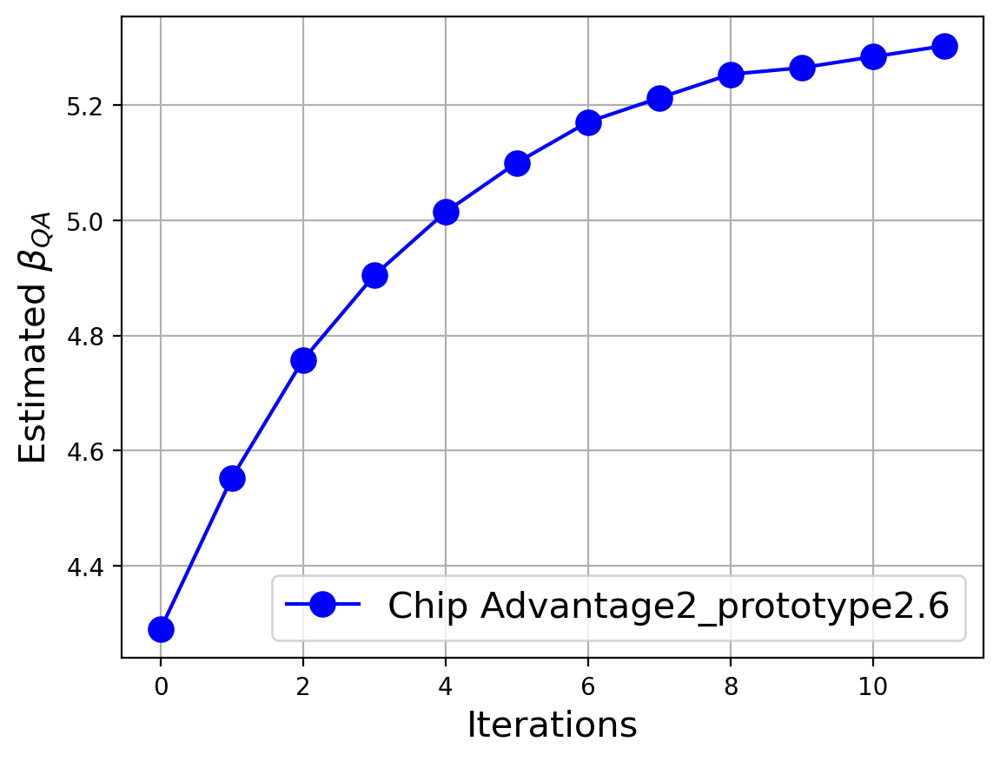

In [46]:
plt.plot( beta_list, linewidth=1.5, color="b" ,marker="o", ms=10)
plt.xlabel("Iterations", fontsize=15)
plt.ylabel("Estimated $β_{QA}$", fontsize=15)
plt.legend([f'Chip {engine.model._qpu_sampler.properties["chip_id"]}'], fontsize=15)
# plt.title(f'{ds[part]}')
plt.grid("True")
plt.savefig(f'/home/javier/Projects/CaloQVAE/figs/{modelname}/beta_QA_{engine.model._qpu_sampler.properties["chip_id"]}_{modelname}_{arch}_{datascaled}_{part}_2.png')
plt.show()

In [104]:
# QA = "$β_{QA}$"

In [30]:
# Hoffset = -(sum([engine.model.prior.bias_dict[key].sum().detach().cpu().item() for key in engine.model.prior.bias_dict.keys()])/2 
#             + sum([engine.model.prior.weight_dict[key].sum().detach().cpu().item() for key in engine.model.prior.weight_dict.keys()])/4)
# print(Hoffset)

-155.28899908065796


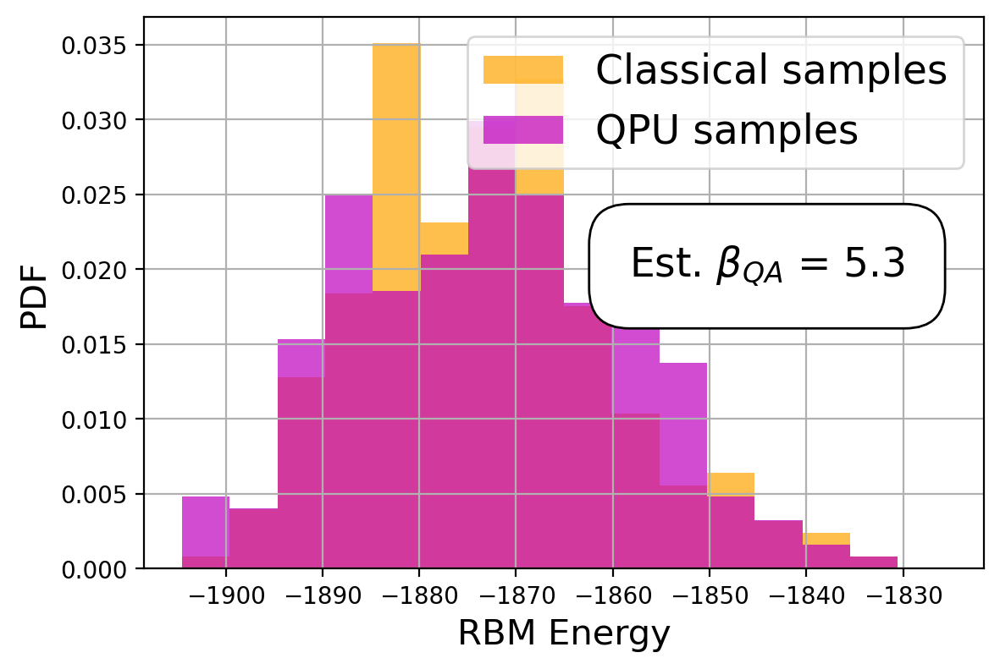

256
251


In [47]:
QA = "$β_{QA}$"
Hoffset = -(sum([engine.model.prior.bias_dict[key].sum().detach().cpu().item() for key in engine.model.prior.bias_dict.keys()])/2 
            + sum([engine.model.prior.weight_dict[key].sum().detach().cpu().item() for key in engine.model.prior.weight_dict.keys()])/4)
print(Hoffset)

minVal, maxVal = min(dwave_energy_list[-1] + Hoffset), max(dwave_energy_list[-1] + Hoffset)
# minVal, maxVal = min(energy_dwave.detach().cpu().numpy()+ Hoffset/2), max(energy_dwave.detach().cpu().numpy()+ Hoffset/2)
binwidth = (maxVal-minVal)/15

# plt.figure(figsize=(8,6))
plt.hist(rbm_energy_list[-1] + Hoffset, density=True, color="orange", alpha=0.7, bins=np.arange(minVal, maxVal + binwidth, binwidth))
plt.hist(dwave_energy_list[-1] + Hoffset, density=True, color="m", alpha=0.7, bins=np.arange(minVal, maxVal + binwidth, binwidth))
plt.xlabel("RBM Energy", fontsize=15)
plt.ylabel("PDF", fontsize=15)
plt.legend(["Classical samples", "QPU samples"], fontsize=17)
# plt.title(f'ln(Z)[AIS] = {np.round(Zais)}, ln(Z)[RAIS] = {np.round(Zrais)}')
plt.figtext(0.7, 0.6, f'Est. {QA} = {np.round(beta0, 2)}', ha='center', va='top', fontsize=17, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=1'))
plt.subplots_adjust(bottom=0.2)
plt.grid("True")
plt.savefig(f'/home/javier/Projects/CaloQVAE/figs/{modelname}/Ising_energy_{modelname}_{arch}_{datascaled}_{part}_2.png')
plt.show()
print(len(rbm_energy_list[-1]))
print(len(dwave_energy_list[-1]))

In [73]:
partition_size=config.model.n_latent_nodes_per_p
energy_encoded_data = []

engine.model.eval()
with torch.no_grad():
    for xx in val_loader:
        in_data, true_energy, in_data_flat = engine._preprocess(xx[0],xx[1])
        if reducedata:
            in_data = engine._reduce(in_data, true_energy, R=R)
        # enIn = torch.cat((in_data, true_energy), dim=1)
        # beta, post_logits, post_samples = engine.model.encoder(enIn, False)
        beta, post_logits, post_samples = engine.model.encoder(in_data, true_energy, False)
        post_samples = torch.cat(post_samples, 1)
        post_samples_energy = engine.model.stater.energy_samples(post_samples[:,0:partition_size], post_samples[:,partition_size:2*partition_size], 
                                                 post_samples[:,2*partition_size:3*partition_size], post_samples[:,3*partition_size:4*partition_size], 1.0 )
        energy_encoded_data.append(post_samples_energy.detach().cpu())

energy_encoded_data = torch.cat(energy_encoded_data, dim=0)

In [112]:
engine.model.sampler._n_steps = 3

In [52]:

partition_size=config.model.n_latent_nodes_per_p
encoded_data = []
energy_encoded_data = []
n_samples4_qpu = 50

# encoded_data_rdm = []
# energy_encoded_data_rdm = []
engine.model.eval()
# engine_2.model.eval()
with torch.no_grad():
    for i,xx in enumerate(val_loader):
    # for xx in train_loader:
        in_data, true_energy, in_data_flat = engine._preprocess(xx[0],xx[1])
        #################################################
        # true_energy = true_energy[:n_samples4_qpu,:]
        # in_data = in_data[:n_samples4_qpu,:]
        #################################################
        if reducedata:
            in_data = engine._reduce(in_data, true_energy, R=R)
        # enIn = torch.cat((in_data, true_energy), dim=1)
        # beta, post_logits, post_samples = engine.model.encoder(enIn, False)
        beta, post_logits, post_samples = engine.model.encoder(in_data, true_energy, False)
        post_samples = torch.cat(post_samples, 1)
        post_samples_energy = engine.model.stater.energy_samples(post_samples[:,0:partition_size], post_samples[:,partition_size:2*partition_size], 
                                                 post_samples[:,2*partition_size:3*partition_size], post_samples[:,3*partition_size:4*partition_size], 1.0 )
        encoded_data.append(post_samples.detach().cpu())
        energy_encoded_data.append(post_samples_energy.detach().cpu())
        
        # #Rdm model
        # # enIn = torch.cat((in_data, true_energy), dim=1)
        # # beta, post_logits, post_samples = engine.model.encoder(enIn, False)
        # beta, post_logits, post_samples = engine_2.model.encoder(in_data, true_energy, False)
        # post_samples = torch.cat(post_samples, 1)
        # post_samples_energy = engine_2.model.stater.energy_samples(post_samples[:,0:partition_size], post_samples[:,partition_size:2*partition_size], 
        #                                          post_samples[:,2*partition_size:3*partition_size], post_samples[:,3*partition_size:4*partition_size], 1.0 )
        # encoded_data_rdm.append(post_samples.detach().cpu())
        # energy_encoded_data_rdm.append(post_samples_energy.detach().cpu())
        # if i == 0:
        #     break

encoded_data = torch.cat(encoded_data, dim=0)
energy_encoded_data = torch.cat(energy_encoded_data, dim=0)
        
# encoded_data_rdm = torch.cat(encoded_data_rdm, dim=0)
# energy_encoded_data_rdm = torch.cat(energy_encoded_data_rdm, dim=0)

p1,p2,p3,p4 = post_samples[:,0:partition_size], post_samples[:,partition_size:2*partition_size], \
                                                 post_samples[:,2*partition_size:3*partition_size], post_samples[:,3*partition_size:4*partition_size]

energy_rbm_data = []
rbm_data = []
# energy_rbm_rdm_data = []
with torch.no_grad():
    # for i in range(10):
    for i,xx in enumerate(val_loader):
        in_data, true_energy, in_data_flat = engine._preprocess(xx[0],xx[1])
        ##################################################
        # true_energy = true_energy[:n_samples4_qpu,:]
        # in_data = in_data[:n_samples4_qpu,:]
        ##################################################
        # if i == 0:
            # p1, p2, p3, p4 = engine.model.stater.block_gibbs_sampling_ais(1.0)
        # else:
            # p1, p2, p3, p4 = engine.model.stater.block_gibbs_sampling_ais(1.0, p1, p2, p3, p4)
        engine._model.sampler._batch_size = true_energy.shape[0]
        if True: #cond:
            u = engine.model.encoder.binary_energy(true_energy).to(dtype=torch.float32)
            p1, p2, p3, p4 = engine.model.sampler.block_gibbs_sampling_cond(u)
        else:
            p1, p2, p3, p4 = engine.model.sampler.block_gibbs_sampling()
        rbm_data.append(torch.cat((p1,p2,p3,p4),1))
        rbm_samples_energy = engine.model.stater.energy_samples(p1, p2, p3, p4, 1.0)
        energy_rbm_data.append(rbm_samples_energy.detach().cpu())
        engine._model.sampler._batch_size = engine._config.engine.rbm_batch_size
        
        # if i == 0:
        #     p1_r, p2_r, p3_r, p4_r = engine_2.model.stater.block_gibbs_sampling_ais(1.0)
        # else:
        #     p1_r, p2_r, p3_r, p4_r = engine_2.model.stater.block_gibbs_sampling_ais(1.0, p1_r, p2_r, p3_r, p4_r)
        # rbm_rdm_samples_energy = engine_2.model.stater.energy_samples(p1_r, p2_r, p3_r, p4_r, 1.0)
        # energy_rbm_rdm_data.append(rbm_rdm_samples_energy.detach().cpu())
        # if i == 0:
        #     break
    
energy_rbm_data = torch.cat(energy_rbm_data, dim=0)
rbm_data = torch.cat(rbm_data,0)
# energy_rbm_rdm_data = torch.cat(energy_rbm_rdm_data, dim=0)

In [113]:
# plt.figure(figsize=(8,6))
# plt.hist(energy_encoded_data.numpy(), bins=70, linewidth=2.5, color="b", density=True, log=True)
# plt.hist(energy_rbm_data.numpy(), bins=20, color="orange", density=True, fc=(1, 0, 1, 0.5), histtype='step', linewidth=1.5)
# plt.hist(energy_rbm_rdm_data.numpy(), bins=20, linewidth=2.5, color="cyan", density=True, fc=(0.5, 1.0, 0.5, 0.8))
# plt.hist(energy_encoded_data_rdm.numpy(), bins=70, linewidth=2.5, color="r", density=True)

# plt.xlabel("RBM Energy", fontsize=15)
# plt.ylabel("PDF", fontsize=15)
# plt.legend(["Trained RBM w/ Encoded Data", "Trained RBM w/ Gibbs sampled data", "Random RBM w/ Gibbs sampled data", "Random RBM w/ Init Encoded Data"], fontsize=17)
# # plt.title(f'ln(Z)[AIS] = {np.round(Zais)}, ln(Z)[RAIS] = {np.round(Zrais)}')
# # plt.title(f'LL(trained) = {np.round(-energy_encoded_data.mean() - lnZais)}, LL(Rdm) = {np.round(-energy_encoded_data_rdm.mean() - lnZrais_rdm)} \n \
#         # LL(trained RBM data) = {np.round(-energy_rbm_data.mean() - lnZais)}, LL(Rdm RBM data) = {np.round(-energy_rbm_rdm_data.mean() - lnZrais_rdm)}')
# plt.grid("True")
# plt.savefig(f'/home/javier/Projects/CaloQVAE/figs/{modelname}/RBM_energy_{modelname}_{arch}_{datascaled}_{part}.png')
# plt.show()

In [300]:
energy_rbm_data.max()

tensor(-3813.8389)

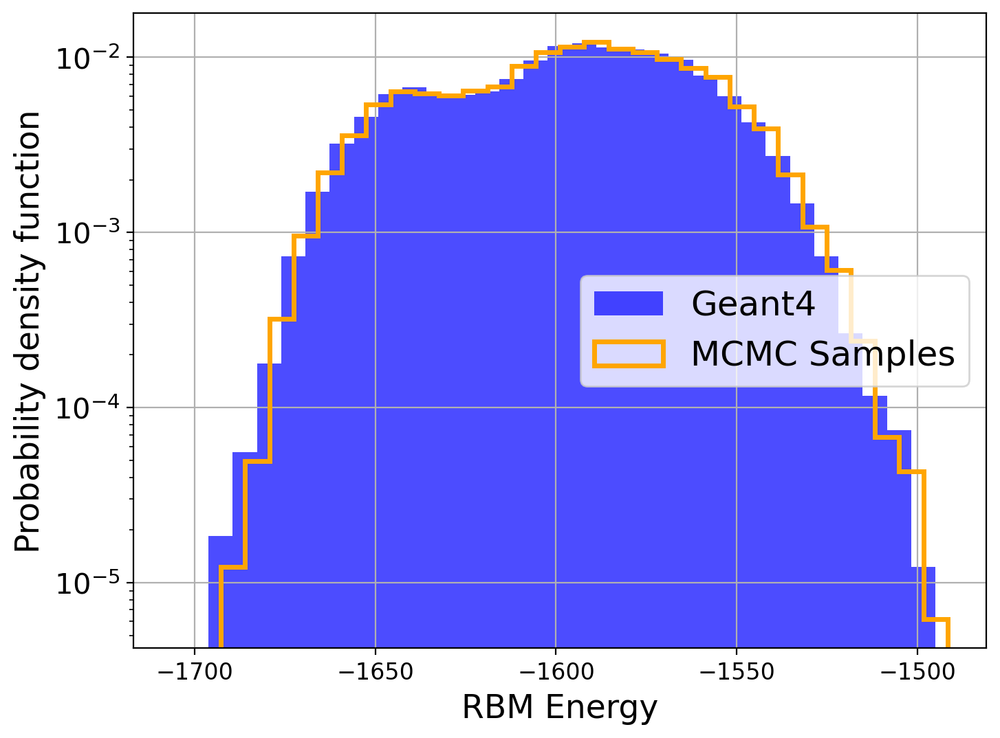

In [53]:
minVal, maxVal = min(energy_encoded_data.numpy()), max(energy_encoded_data.numpy())
# minVal, maxVal = min(energy_dwave.detach().cpu().numpy()+ Hoffset/2), max(energy_dwave.detach().cpu().numpy()+ Hoffset/2)
binwidth = (maxVal-minVal)/30

plt.figure(figsize=(8,6))
plt.hist(energy_encoded_data.numpy(), bins=np.arange(minVal, maxVal + binwidth, binwidth), linewidth=2.5, color="b", density=True, log=True, label="Geant4", alpha=0.7)
plt.hist(energy_rbm_data.numpy(), bins=np.arange(minVal-10, maxVal + binwidth, binwidth), color="orange", density=True, fc=(1, 0, 1, 0.5), log=True, histtype='step', linewidth=2.5, label="MCMC Samples")
# plt.hist(energy_rbm_data.numpy(), bins=30, color="orange", density=True, fc=(1, 0, 1, 0.5), log=True, histtype='step', linewidth=2.5, label="MC")
# plt.hist(energy_dwave.detach().cpu().numpy(), bins=np.arange(minVal-10, maxVal + binwidth, binwidth), color="m", density=True, fc=(1, 0, 1, 0.5), log=True, histtype='step', linewidth=2.5, label="QPU")
# plt.hist(energy_dwave.detach().cpu().numpy(), bins=20, color="m", density=True, fc=(1, 0, 1, 0.5), log=True, histtype='step', linewidth=2.5, label="QPU Samples")

# plt.hist(energy_rbm_rdm_data.numpy(), bins=20, linewidth=2.5, color="cyan", density=True, fc=(0.5, 1.0, 0.5, 0.8))
# plt.hist(energy_encoded_data_rdm.numpy(), bins=70, linewidth=2.5, color="r", density=True)

plt.xlabel("RBM Energy", fontsize=17)
plt.ylabel("Probability density function", fontsize=17)
plt.xticks(fontsize=12)
plt.yticks(fontsize=15)
# plt.legend(["Encoded data", "Gibbs sampled data", "QA sampled data"], fontsize=18)
plt.legend(fontsize=18, loc='best')
# plt.title(f'ln(Z)[AIS] = {np.round(Zais)}, ln(Z)[RAIS] = {np.round(Zrais)}')
# plt.title(f'LL(trained) = {np.round(-energy_encoded_data.mean() - lnZais)}, LL(Rdm) = {np.round(-energy_encoded_data_rdm.mean() - lnZrais_rdm)} \n \
        # LL(trained RBM data) = {np.round(-energy_rbm_data.mean() - lnZais)}, LL(Rdm RBM data) = {np.round(-energy_rbm_rdm_data.mean() - lnZrais_rdm)}')
plt.grid("True")
plt.savefig(f'/home/javier/Projects/CaloQVAE/figs/{modelname}/RBM_energy_{modelname}_{arch}_{datascaled}_{part}_cond_estimating.png')
plt.show()

In [23]:
# Sparsity and Energy
# beta
# _just_act_cool(in_data, true_energy)
# _shift_energy(in_data, true_energy)
# sample_data_qpu.shape
engine.model._config.qpu.cond
# beta0
cond

True

In [43]:
engine.model.prior_samples_qpu = [] # engine.model.prior_samples_qpu[20000:,:]
engine.model.prior_samples = []  #engine.model.prior_samples[10000:,:].shape

In [61]:
print(engine.model.prior_samples_qpu.shape)
print(engine.model.prior_samples.shape)

torch.Size([10000, 1208])
torch.Size([10000, 1208])


In [86]:
print(True * True)
(engine.model.prior_samples_qpu[:,:302] == engine.model.prior_samples[:,:302]).prod()

1


tensor(1, device='cuda:4')

In [62]:
energy_dwave = engine.model.stater.energy_samples(engine.model.prior_samples_qpu[:,0:302], engine.model.prior_samples_qpu[:,302:604], 
                                                  engine.model.prior_samples_qpu[:,604:906], engine.model.prior_samples_qpu[:,906:1208], 1.0)


# energy_dwave = engine.model.stater.energy_samples(engine.model.prior_samples_qpu[:,0:512], engine.model.prior_samples_qpu[:,512:1024], 
#                                                   engine.model.prior_samples_qpu[:,1024:1536], engine.model.prior_samples_qpu[:,1536:2048], 1.0)

# energy_rbm_ = engine.model.stater.energy_samples(engine.model.prior_samples[:,0:512], engine.model.prior_samples[:,512:1024], 
                                                  # engine.model.prior_samples[:,1024:1536], engine.model.prior_samples[:,1536:2048], 1.0)
# l1, l2 = 0, 1024
# l1, l2 = 1024, 2048
# l1, l2 = 2048, 3072
# l1, l2 = 3072, 4096
# energy_dwave = engine.model.stater.energy_samples(engine.model.prior_samples_qpu[l1:l2,0:512], engine.model.prior_samples_qpu[l1:l2,512:1024], 
#                                                   engine.model.prior_samples_qpu[l1:l2,1024:1536], engine.model.prior_samples_qpu[l1:l2,1536:2048], 1.0)

# energy_rbm_ = engine.model.stater.energy_samples(engine.model.prior_samples[l1:l2,0:512], engine.model.prior_samples[l1:l2,512:1024], 
#                                                   engine.model.prior_samples[l1:l2,1024:1536], engine.model.prior_samples[l1:l2,1536:2048], 1.0)

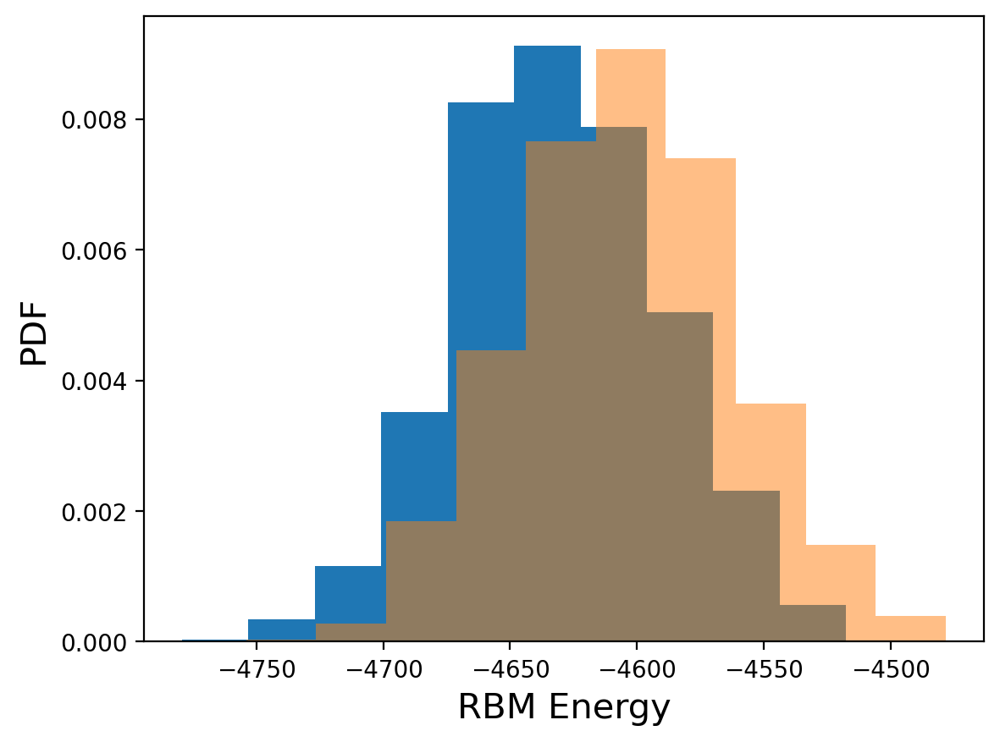

2.5012548828125

In [23]:
minVal, maxVal = min(energy_dwave.detach().cpu().numpy()), max(energy_dwave.detach().cpu().numpy())
binwidth = (maxVal-minVal)/10

plt.hist(energy_dwave.detach().cpu(), bins=np.arange(minVal, maxVal + binwidth, binwidth), density=True)
plt.hist(energy_rbm_.detach().cpu(), alpha=0.5, density=True, bins=10)
# plt.hist(energy_encoded_data[:].numpy(), bins=np.arange(minVal, maxVal + binwidth, binwidth), linewidth=2.5, color="b", density=True, log=False, label="Geant4", alpha=0.7)
# plt.hist(energy_dwave_2.detach().cpu(), alpha=0.5, density=True, bins=np.arange(minVal, maxVal + binwidth, binwidth))
# plt.hist(energy_dwave_3.detach().cpu(), alpha=0.5, density=True, bins=20)
plt.xlabel("RBM Energy", fontsize=15)
plt.ylabel("PDF", fontsize=15)
plt.show()
# print(rbm_data.shape, energy_rbm_data.detach().cpu().mean() - energy_dwave.detach().cpu().mean(),
#      energy_rbm_data.shape, energy_dwave.shape, Hoffset)
beta0

In [48]:
entarget_samples.detach().cpu().shape
len(np.array(engine.model.beta_list)[bts])

1024

In [49]:
# for name, param in engine.model.named_parameters():
    # print(name)
# engine.model.beta_list

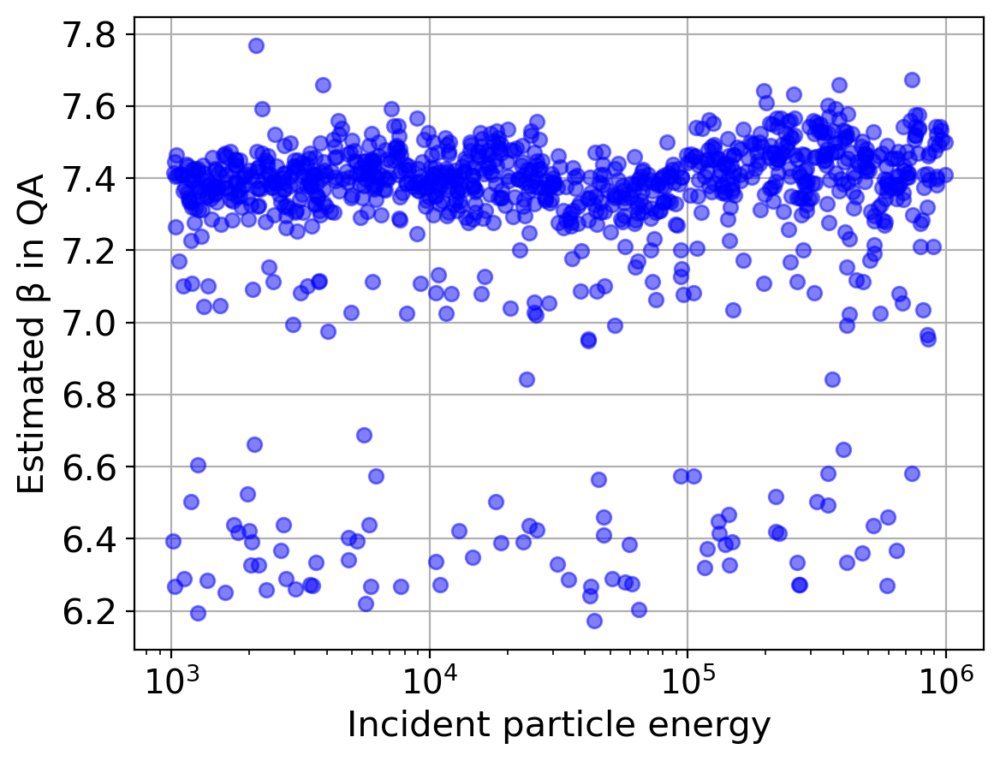

In [50]:
# dmp = {'b_it':engine.model.beta_list[1:], 'enc_en':energy_encoded_data.numpy(), 'rbm_en':energy_rbm_data.numpy(), 'dw_en':energy_dwave.detach().cpu().numpy()}
# with open(f'/home/javier/Projects/CaloQVAE/figs/{modelname}/beta_it_2.pickle', 'wb') as handle:
    # pickle.dump(dmp, handle, protocol=pickle.HIGHEST_PROTOCOL)
# plt.plot(true_energy.detach().cpu()[0:-1], engine.model.beta_list[6:-1], marker='o', alpha=.5, color="b", lw=0)
plt.plot(entarget_samples.detach().cpu(),np.array(engine.model.beta_list)[bts], marker='o', alpha=.5, color="b", lw=0)
plt.xscale('log')
plt.xlabel("Incident particle energy", fontsize=15)
plt.ylabel("Estimated β in QA", fontsize=15)
plt.xticks(fontsize=14)
plt.yticks(fontsize=15)
plt.grid(True)
plt.savefig(f'/home/javier/Projects/CaloQVAE/figs/{modelname}/beta_vs label_{modelname}_{arch}_{datascaled}_{part}.png', bbox_inches='tight')
plt.show()

In [41]:
len(engine.model.beta_list)
bts = (np.array(engine.model.beta_list) > 0)
# np.array(engine.model.beta_list)[bts]
# len(np.array(engine.model.beta_list[-6151:-1])[bts])

In [51]:
beta_10k = engine.model.beta_list

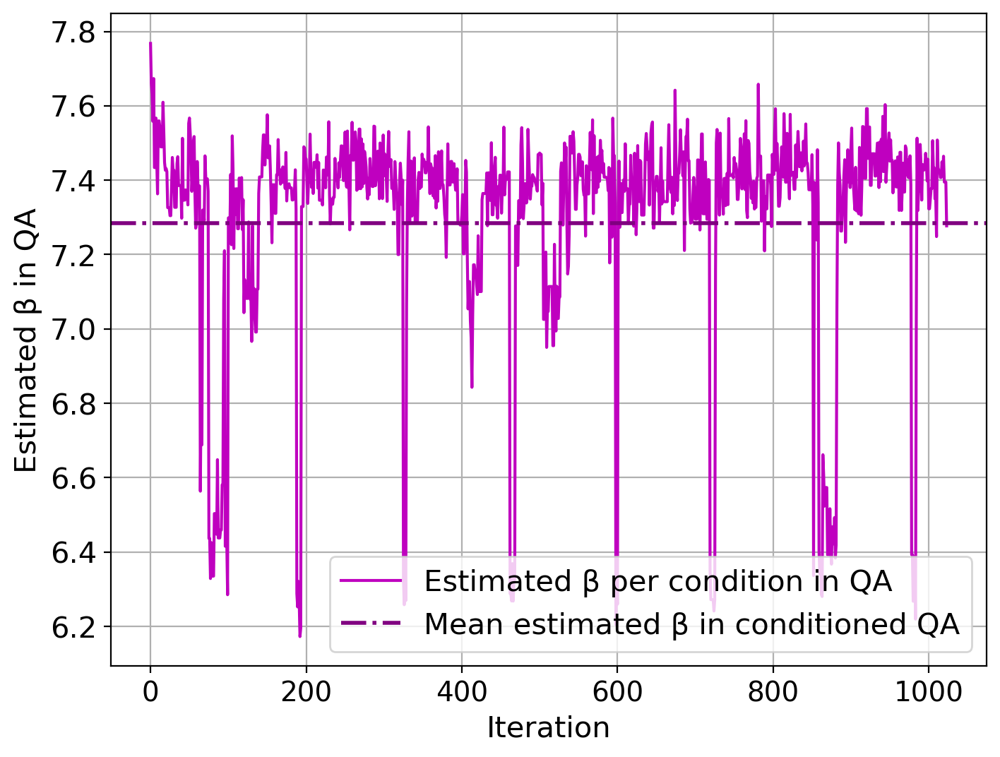

In [52]:
plt.figure(figsize=(8,6))
plt.plot(np.array(beta_10k)[bts], c='m', label="Estimated β per condition in QA")
plt.xlabel("Iteration", fontsize=15)
plt.ylabel("Estimated β in QA", fontsize=15)
# plt.axhline(y=4.11, color='r', lw=2, linestyle='dashdot', label="Estimated β in QA")
# plt.axhline(y=3.72, color='black', linestyle='dashed', label="Estimated β in conditioned QA")
plt.axhline(y=np.mean(beta_10k), color='purple', lw=2, linestyle='dashdot', label="Mean estimated β in conditioned QA")
plt.xticks(fontsize=14)
plt.yticks(fontsize=15)
plt.legend(fontsize=15, loc='lower right')
plt.grid(True)
plt.savefig(f'/home/javier/Projects/CaloQVAE/figs/{modelname}/beta_iteration_{modelname}_{arch}_{datascaled}_{part}.png', bbox_inches='tight')
plt.show()

In [99]:
the_dict = {'beta':engine.model.beta_list, 'incident_energy':true_energy.detach().cpu(), 'dwave_energy':energy_dwave.detach().cpu().numpy()}
with open(f'/home/javier/Projects/CaloQVAE/figs/{modelname}/cond_temp_results.pickle', 'wb') as handle:
    pickle.dump(the_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)
    

In [68]:
the_dict = { 'incident_energy':true_energy.detach().cpu(), 'dwave_energy':energy_dwave.detach().cpu().numpy()}
with open(f'/home/javier/Projects/CaloQVAE/figs/{modelname}/cond_temp_results_Feb2025.pickle', 'wb') as handle:
    pickle.dump(the_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [19]:
n_samp = 1000
xgen_samples_qpu_2 = []
with torch.no_grad():
    for i in range(len(b["samples"])):
        post_samples = b["samples"][i][:n_samp,:].to(dev)
        x0 = (torch.tensor([b["en"][i]]) * 1000).unsqueeze(1).repeat(n_samp,1).to(dev)
        output_hits, output_activations = engine.model.decoder(post_samples, x0)
        out_beta = torch.tensor(engine.model._config.model.output_smoothing_fct, dtype=torch.float, device=output_hits.device, requires_grad=False)
        out_output_activations = engine.model._inference_energy_activation_fct(output_activations) * engine.model._hit_smoothing_dist_mod(output_hits, out_beta, False)
        out_output_activations = engine._reduceinv(out_output_activations, x0, R=R)
        xgen_samples_qpu_2.append( out_output_activations.detach().cpu())
    xgen_samples_qpu_2 = torch.cat(xgen_samples_qpu_2, dim=0)

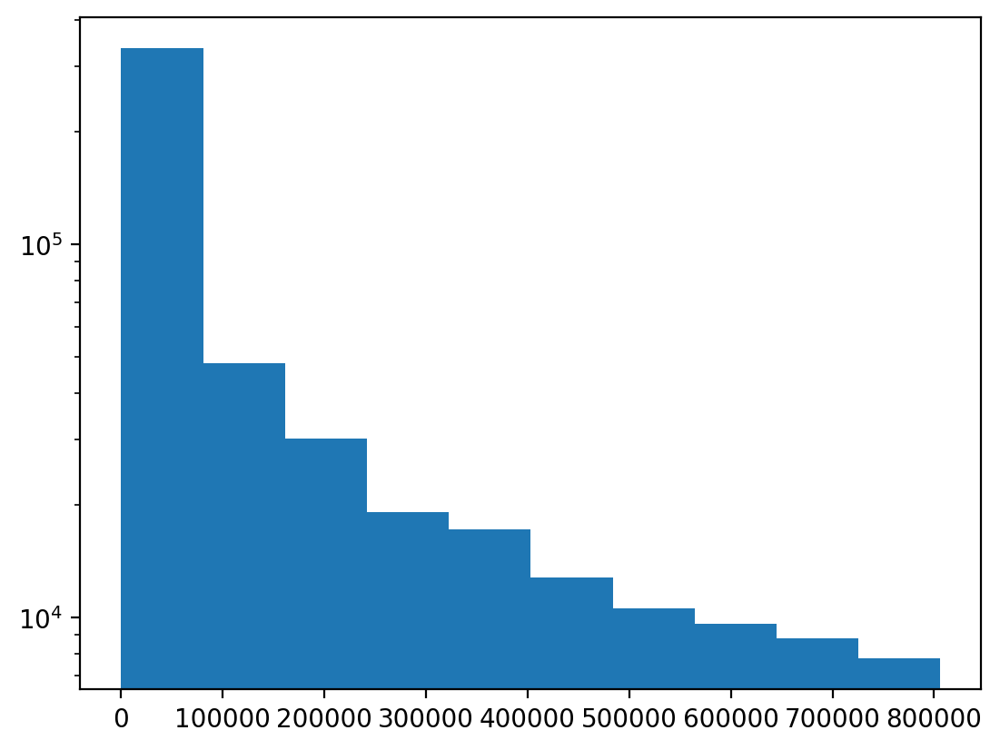

In [21]:
plt.hist(xgen_samples_qpu_2.sum(1).detach().cpu(), log=True)
plt.show()


In [90]:
# xx = next(iter(val_loader))
# in_data, true_energy, in_data_flat = engine._preprocess(xx[0],xx[1])
# flux_biases = []
# # x = next(iter(true_energy))
# for x in true_energy:
#     flux_biases.append(engine.model.gen_fb(0,x, thrsh=20))

In [91]:
# with open(f'/home/javier/Projects/CaloQVAE/figs/{modelname}/flux_biases_Peg.pickle', 'wb') as handle:
#     pickle.dump(flux_biases, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [92]:
# with open(f'/home/javier/Projects/CaloQVAE/figs/{modelname}/flux_biases_Peg.pickle', 'rb') as handle:
#     b = pickle.load(handle)

In [98]:
modelname

'wobbly-cosmos-528'

In [98]:
# 80/9

In [54]:
# en_labels = []

xtarget_samples = []
xrecon_samples = []
xgen_samples = []
xgen_samples_qpu = []
n_samples4_qpu = 50

# xrecon_samples_2 = []

# labelstarget_samples = []
# labelsrecon_samples = []
entarget_samples = []
with torch.no_grad():
    for i,xx in enumerate(val_loader):
        in_data, true_energy, in_data_flat = engine._preprocess(xx[0],xx[1])
        print(i)
        ###############################################
        # true_energy = true_energy[:n_samples4_qpu,:]
        # in_data = in_data[:n_samples4_qpu,:]
        ##############################################
        if reducedata:
            in_data = engine._reduce(in_data, true_energy, R=R)
        fwd_output = engine.model((in_data, true_energy), False)
        if reducedata:
            in_data = engine._reduceinv(in_data, true_energy, R=R)
            recon_data = engine._reduceinv(fwd_output.output_activations, true_energy, R=R)
            engine._model.sampler._batch_size = true_energy.shape[0]
            if cond:
                sample_energies, sample_data = engine._model.generate_samples_cond(num_samples=true_energy.shape[0], true_energy=true_energy, measure_time=True, cat_priors=True)
                # sample_energies_qpu, sample_data_qpu = engine.model.generate_samples_qpu_cond(true_energy=true_energy, num_samples=true_energy.shape[0], thrsh=16, beta=1/beta0, t=0.0, est_beta=False)
            else:
                sample_energies, sample_data = engine._model.generate_samples(num_samples=true_energy.shape[0], true_energy=true_energy, measure_time=True)
                # sample_energies_qpu, sample_data_qpu = engine._model.generate_samples_qpu(num_samples=true_energy.shape[0], true_energy=true_energy, measure_time=True, beta=1/beta0)
            engine._model.sampler._batch_size = engine._config.engine.rbm_batch_size
            sample_data = engine._reduceinv(sample_data, sample_energies, R=R)
            # sample_data_qpu = engine._reduceinv(sample_data_qpu, sample_energies_qpu, R=R)
#         elif scaled:
#             in_data = torch.tensor(engine._data_mgr.inv_transform(in_data.detach().cpu().numpy()))
#             recon_data = torch.tensor(engine._data_mgr.inv_transform(fwd_output.output_activations.detach().cpu().numpy()))
#             # recon_data_2 = torch.tensor(engine._data_mgr.inv_transform(fwd_just_act.detach().cpu().numpy()))
#             # recon_data_2 = torch.tensor(engine._data_mgr.inv_transform(fwd_energy_shift.detach().cpu().numpy()))
#             engine._model.sampler._batch_size = true_energy.shape[0]
            
#             if True:
#                 sample_energies, sample_data = engine._model.generate_samples_cond(num_samples=true_energy.shape[0], true_energy=true_energy, measure_time=True)
#                 # sample_energies_qpu, sample_data_qpu = engine.model.generate_samples_qpu_cond(true_energy=true_energy[:100,:], num_samples=1, thrsh=30, beta=1/beta0)
#             else:
#                 sample_energies, sample_data = engine._model.generate_samples(num_samples=true_energy.shape[0], true_energy=true_energy, measure_time=True)
#                 # sample_energies_qpu, sample_data_qpu = engine._model.generate_samples_qpu(num_samples=true_energy.shape[0], true_energy=true_energy, measure_time=True, beta=1/beta0)
#             engine._model.sampler._batch_size = engine._config.engine.rbm_batch_size
#             sample_data = torch.tensor(engine._data_mgr.inv_transform(sample_data.detach().cpu().numpy()))
#             # sample_data_qpu = torch.tensor(engine._data_mgr.inv_transform(sample_data_qpu.detach().cpu().numpy()))
#         else:
#             in_data = in_data.detach().cpu()*1000
#             recon_data = fwd_output.output_activations.detach().cpu()*1000
#             engine._model.sampler._batch_size = true_energy.shape[0]
#             sample_energies, sample_data = engine._model.generate_samples(num_samples=true_energy.shape[0], true_energy=true_energy)
#             engine._model.sampler._batch_size = engine._config.engine.rbm_batch_size
#             # sample_energies, sample_data = engine._model.generate_samples(num_samples=2048)
#             sample_data = sample_data.detach().cpu()*1000
        else:
            print("Non reduced!")
            break


        xtarget_samples.append(in_data.detach().cpu())
        xrecon_samples.append( recon_data.detach().cpu())
        xgen_samples.append( sample_data.detach().cpu())
        # xgen_samples_qpu.append( sample_data_qpu.detach().cpu())
        entarget_samples.append(true_energy.detach().cpu())

        # xrecon_samples_2.append( recon_data_2.detach().cpu())
        # if i==0:
            # break
    
    
xtarget_samples = torch.cat(xtarget_samples, dim=0)
xrecon_samples = torch.cat(xrecon_samples, dim=0)
xgen_samples = torch.cat(xgen_samples, dim=0)
# xgen_samples_qpu = torch.cat(xgen_samples_qpu, dim=0)
entarget_samples = torch.cat(entarget_samples, dim=0)

# xrecon_samples_2 = torch.cat(xrecon_samples_2, dim=0)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23


In [43]:
(xgen_samples.sum(dim=0) == 0).sum()
(xrecon_samples.sum(dim=0) == 0).sum()
# xtarget_samples = torch.cat(xtarget_samples, dim=0)
# xrecon_samples = torch.cat(xrecon_samples, dim=0)
# xgen_samples = torch.cat(xgen_samples, dim=0)
# xgen_samples_qpu = torch.cat(xgen_samples_qpu, dim=0)
# entarget_samples = torch.cat(entarget_samples, dim=0)
xrecon_samples = xrecon_samples * 1.07
xgen_samples = xgen_samples * 1.07

In [335]:
# Random RBM
# engine.model.sampler._prbm._bias_dict = load_RBM_state(f'/home/javier/Projects/CaloQVAE/outputs/2023-11-21/13-09-06/wandb/latest-run/files/RBM/RBM_1_9_biases.pth', dev)
# engine.model.sampler._prbm._weight_dict = load_RBM_state(f'/home/javier/Projects/CaloQVAE/outputs/2023-11-21/13-09-06/wandb/latest-run/files/RBM/RBM_1_9_weights.pth', dev)
engine.model.sampler._prbm._bias_dict = engine_2.model.sampler._prbm._bias_dict
engine.model.sampler._prbm._weight_dict = engine_2.model.sampler._prbm._weight_dict
# en_labels = []

xtarget_samples = []
xrecon_samples = []
xgen_samples = []
xgen_samples_qpu = []
n_samples4_qpu = 200

# xrecon_samples_2 = []

# labelstarget_samples = []
# labelsrecon_samples = []
entarget_samples = []
with torch.no_grad():
    for xx in val_loader:
    # for xx in train_loader:
        in_data, true_energy, in_data_flat = engine._preprocess(xx[0],xx[1])
        ###############################################
        # true_energy = true_energy[:n_samples4_qpu,:]
        # in_data = in_data[:n_samples4_qpu,:]
        ##############################################
        # print(in_data.shape)
        if reducedata:
            in_data = engine._reduce(in_data, true_energy, R=R)
        fwd_output = engine.model((in_data, true_energy), False)
        if reducedata:
            in_data = engine._reduceinv(in_data, true_energy, R=R)
            recon_data = engine._reduceinv(fwd_output.output_activations, true_energy, R=R)
            engine._model.sampler._batch_size = true_energy.shape[0]
            if cond:
                sample_energies, sample_data = engine._model.generate_samples_cond(num_samples=true_energy.shape[0], true_energy=true_energy, measure_time=True)
                # sample_energies_qpu, sample_data_qpu = engine.model.generate_samples_qpu_cond(true_energy=true_energy, num_samples=1, thrsh=30, beta=1/beta0)
            else:
                sample_energies, sample_data = engine._model.generate_samples(num_samples=true_energy.shape[0], true_energy=true_energy, measure_time=True)
                # sample_energies_qpu, sample_data_qpu = engine._model.generate_samples_qpu(num_samples=true_energy.shape[0], true_energy=true_energy, measure_time=True, beta=1/beta0)
            engine._model.sampler._batch_size = engine._config.engine.rbm_batch_size
            sample_data = engine._reduceinv(sample_data, sample_energies, R=R)
            # sample_data_qpu = engine._reduceinv(sample_data_qpu, sample_energies_qpu, R=R)
        elif scaled:
            in_data = torch.tensor(engine._data_mgr.inv_transform(in_data.detach().cpu().numpy()))
            recon_data = torch.tensor(engine._data_mgr.inv_transform(fwd_output.output_activations.detach().cpu().numpy()))
            # recon_data_2 = torch.tensor(engine._data_mgr.inv_transform(fwd_just_act.detach().cpu().numpy()))
            # recon_data_2 = torch.tensor(engine._data_mgr.inv_transform(fwd_energy_shift.detach().cpu().numpy()))
            engine._model.sampler._batch_size = true_energy.shape[0]
            
            if True:
                sample_energies, sample_data = engine._model.generate_samples_cond(num_samples=true_energy.shape[0], true_energy=true_energy, measure_time=True)
                # sample_energies_qpu, sample_data_qpu = engine.model.generate_samples_qpu_cond(true_energy=true_energy[:100,:], num_samples=1, thrsh=30, beta=1/beta0)
            else:
                sample_energies, sample_data = engine._model.generate_samples(num_samples=true_energy.shape[0], true_energy=true_energy, measure_time=True)
                # sample_energies_qpu, sample_data_qpu = engine._model.generate_samples_qpu(num_samples=true_energy.shape[0], true_energy=true_energy, measure_time=True, beta=1/beta0)
            engine._model.sampler._batch_size = engine._config.engine.rbm_batch_size
            sample_data = torch.tensor(engine._data_mgr.inv_transform(sample_data.detach().cpu().numpy()))
            # sample_data_qpu = torch.tensor(engine._data_mgr.inv_transform(sample_data_qpu.detach().cpu().numpy()))
        else:
            in_data = in_data.detach().cpu()*1000
            recon_data = fwd_output.output_activations.detach().cpu()*1000
            engine._model.sampler._batch_size = true_energy.shape[0]
            sample_energies, sample_data = engine._model.generate_samples(num_samples=true_energy.shape[0], true_energy=true_energy)
            engine._model.sampler._batch_size = engine._config.engine.rbm_batch_size
            # sample_energies, sample_data = engine._model.generate_samples(num_samples=2048)
            sample_data = sample_data.detach().cpu()*1000


        xtarget_samples.append(in_data.detach().cpu())
        xrecon_samples.append( recon_data.detach().cpu())
        xgen_samples.append( sample_data.detach().cpu())
        # xgen_samples_qpu.append( sample_data_qpu.detach().cpu())
        entarget_samples.append(true_energy.detach().cpu())

        # xrecon_samples_2.append( recon_data_2.detach().cpu())
    
    
xtarget_samples = torch.cat(xtarget_samples, dim=0)
xrecon_samples = torch.cat(xrecon_samples, dim=0)
xgen_samples = torch.cat(xgen_samples, dim=0)
# xgen_samples_qpu = torch.cat(xgen_samples_qpu, dim=0)
entarget_samples = torch.cat(entarget_samples, dim=0)

# xrecon_samples_2 = torch.cat(xrecon_samples_2, dim=0)

In [44]:
print("mean qpu time", np.mean([engine._model.sampling_time_qpu[i][0] for i in range(9)]), np.std([engine._model.sampling_time_qpu[i][0] for i in range(9)]))
print("mean gpu time", np.mean([engine._model.sampling_time_gpu[i][0] for i in range(9)]), np.std([engine._model.sampling_time_gpu[i][0] for i in range(9)]))
print("mean gpu time/mean qpu time", np.mean([engine._model.sampling_time_gpu[i][0] for i in range(9)])/np.mean([engine._model.sampling_time_qpu[i][0] for i in range(9)]))


mean qpu time 0.07484855213099056 0.0008544467559427857
mean gpu time 1.9804112023363512 0.034705626437319705
mean gpu time/mean qpu time 26.45891130760263


In [69]:
print("mean qpu time", np.mean([engine._model.sampling_time_qpu[i][0] for i in range(9)]), np.std([engine._model.sampling_time_qpu[i][0] for i in range(9)]))
print("mean gpu time", np.mean([engine._model.sampling_time_gpu[i][0] for i in range(9)]), np.std([engine._model.sampling_time_gpu[i][0] for i in range(9)]))
print("mean gpu time/mean qpu time", np.mean([engine._model.sampling_time_gpu[i][0] for i in range(9)])/np.mean([engine._model.sampling_time_qpu[i][0] for i in range(9)]))

mean qpu time 0.07659088778826925 0.00607399186932641
mean gpu time 2.09025762732684 0.17963231576320524
mean gpu time/mean qpu time 27.291205098773986


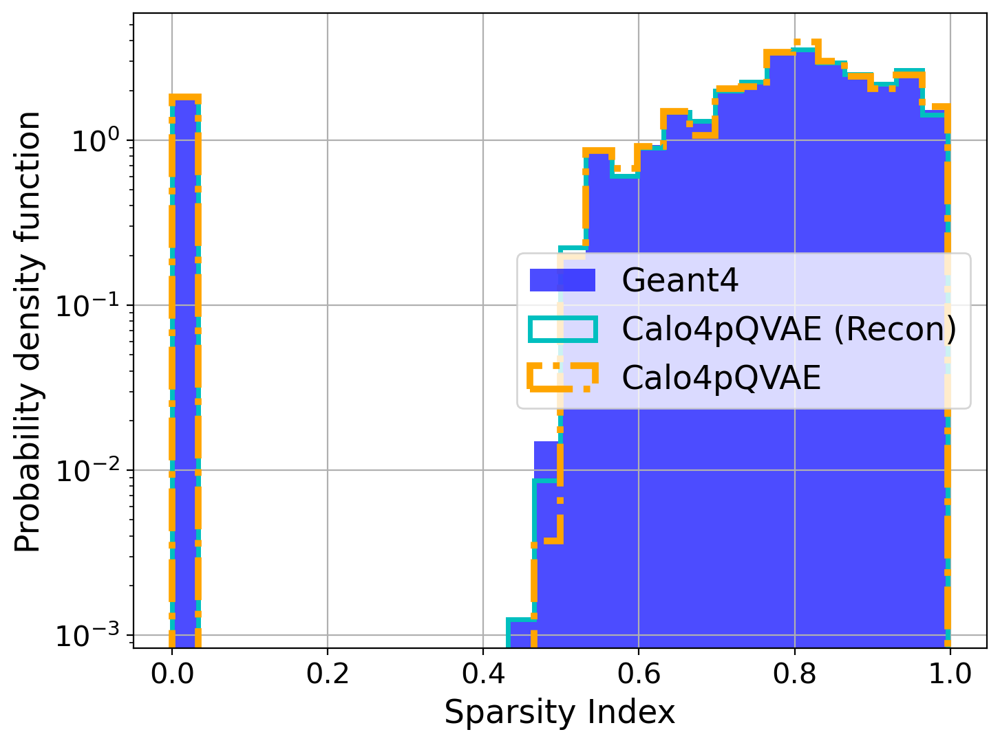

In [55]:
minVal, maxVal = min(((xtarget_samples == 0).sum(dim=1)/xtarget_samples.shape[1]).numpy()), max(((xtarget_samples == 0).sum(dim=1)/xtarget_samples.shape[1]).numpy())
binwidth = (maxVal-minVal)/30

plt.figure(figsize=(8,6))
plt.hist(((xtarget_samples == 0).sum(dim=1)/xtarget_samples.shape[1]).numpy(), bins=np.arange(minVal, maxVal + binwidth, binwidth), log=True, density=True, histtype='stepfilled', linewidth=2.5, color="b", alpha=0.7, label="Geant4")
plt.hist(((xrecon_samples == 0).sum(dim=1)/xtarget_samples.shape[1]).numpy(), bins=np.arange(minVal, maxVal + binwidth, binwidth), log=True, density=True, histtype='step', linewidth=2.5, color="c", label="Calo4pQVAE (Recon)")
plt.hist(((xgen_samples == 0).sum(dim=1)/xtarget_samples.shape[1]).numpy(), bins=np.arange(minVal, maxVal + binwidth, binwidth), log=True, density=True, histtype='step', linewidth=3.5, color="orange", linestyle="dashdot", label="Calo4pQVAE")
# plt.hist(((xgen_samples_qpu == 0).sum(dim=1)/xtarget_samples.shape[1]).numpy(), bins=np.arange(minVal, maxVal + binwidth, binwidth), log=True, density=True, histtype='step', linewidth=3.5, color="purple", linestyle="dashed", label="Calo4pQVAE QPU")
plt.xlabel("Sparsity Index", fontsize=17)
plt.ylabel("Probability density function", fontsize=17)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
# plt.legend(["GT", "Recon", "Samples", "Sample /w QPU"], fontsize=17)
plt.legend( fontsize=17)
# plt.title(f'{ds[part]}')
plt.grid("True")
plt.savefig(f'/home/javier/Projects/CaloQVAE/figs/{modelname}/sparsity_{modelname}_{arch}_{datascaled}_{part}.png')
plt.show()

NameError: name 'ds' is not defined

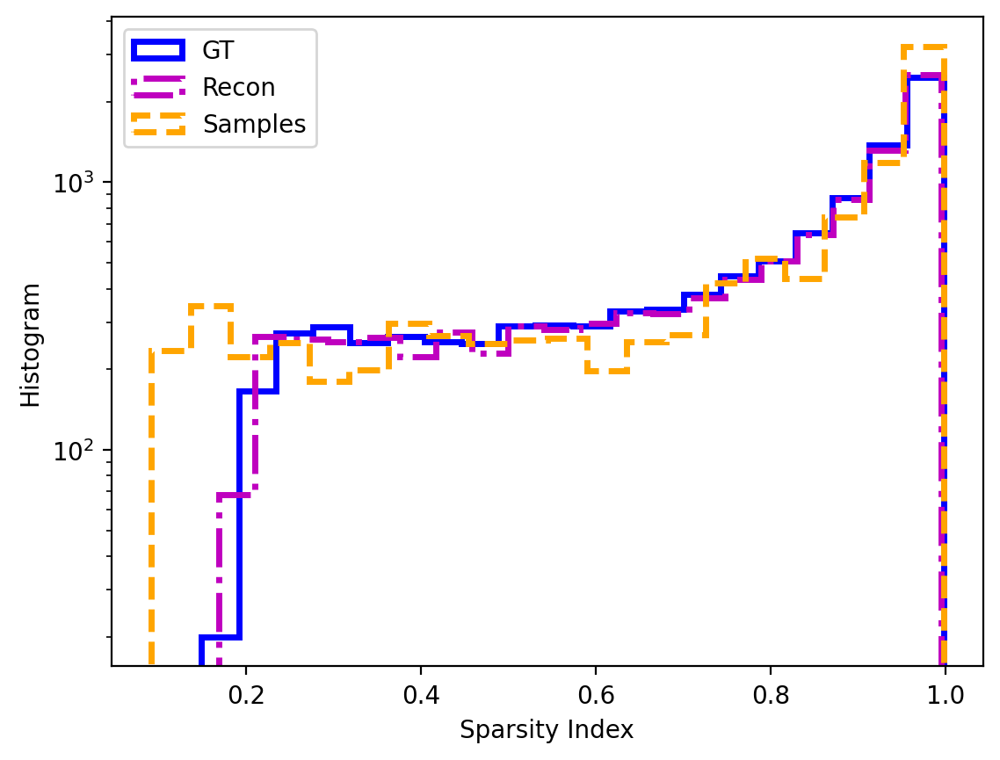

In [46]:
plt.hist(((xtarget_samples == 0).sum(dim=1)/xtarget_samples.shape[1]).numpy(), bins=20, log=True, histtype='step', linewidth=2.5, color="b")
plt.hist(((xrecon_samples == 0).sum(dim=1)/xtarget_samples.shape[1]).numpy(), bins=20, log=True, histtype='step', linewidth=2.5, color="m", linestyle="dashdot")
plt.hist(((xgen_samples == 0).sum(dim=1)/xtarget_samples.shape[1]).numpy(), bins=20, log=True, histtype='step', linewidth=2.5, color="orange", linestyle="dashed")
# plt.hist(((xgen_samples_qpu == 0).sum(dim=1)/xtarget_samples.shape[1]).numpy(), bins=20, log=True, histtype='step', linewidth=2.5, color="green", linestyle="dashed")
plt.xlabel("Sparsity Index")
plt.ylabel("Histogram")
plt.legend(["GT", "Recon", "Samples", "Sample /w QPU"])
plt.title(f'{ds[part]}')
plt.grid("True")
plt.savefig(f'/home/javier/Projects/CaloQVAE/figs/{modelname}/sparsity_RDM_{modelname}_{arch}_{datascaled}_{part}.png')
plt.show()

In [38]:
(xtarget_samples[:, idxPrev:idx] == 0).sum(dim=1)/l
# np.arange(minVal, maxVal + binwidth, binwidth)
minVal
maxVal
binwidth

0.0

<Figure size 800x600 with 0 Axes>

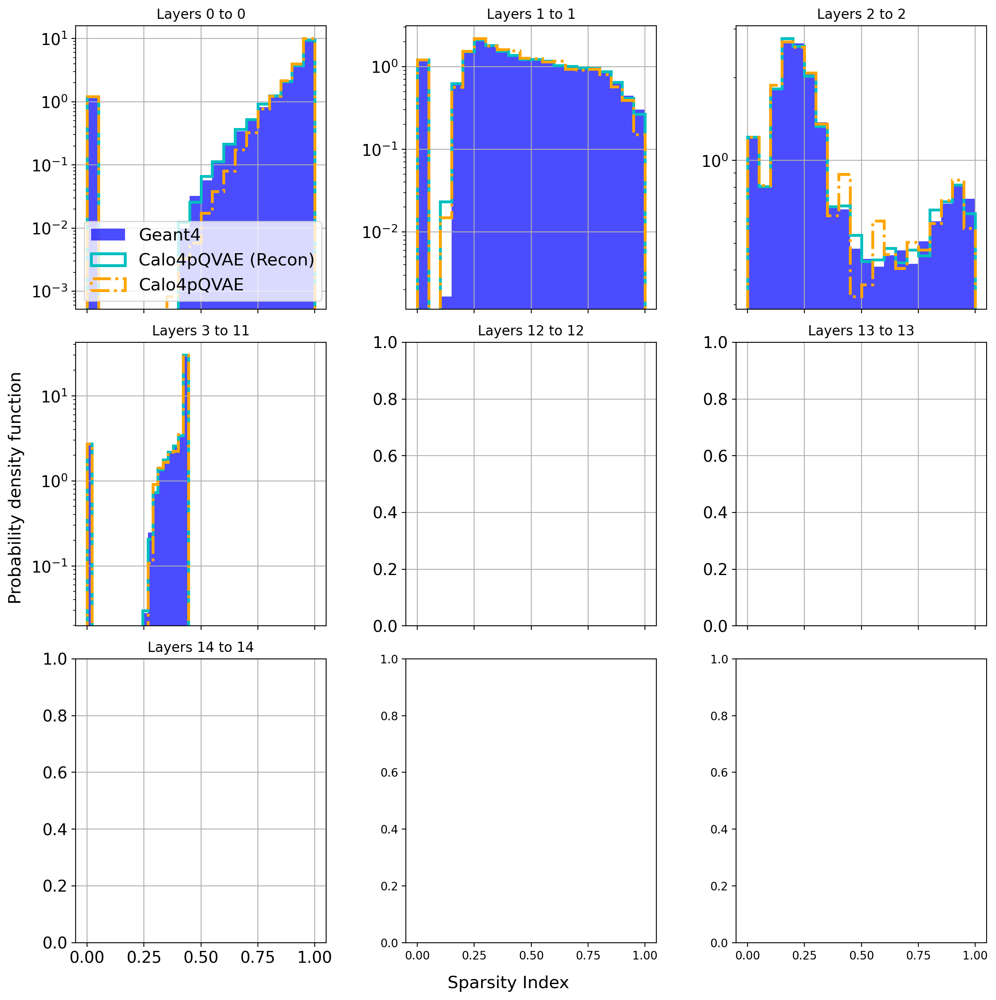

In [72]:
HLF_1_Atlas.relevantLayers = [0,1,2,3,12,13,14,15]
plt.figure(figsize=(8,6))
# Create a grid of subplots
fig, axes = plt.subplots(3,3, figsize=(12, 12), sharey=False, sharex=True, tight_layout=True)
fig.text(0.5, -0.01, 'Sparsity Index', ha='center', fontsize=15)
fig.text(-0.01, 0.5, 'Probability density function', va='center', rotation='vertical', fontsize=15)

# Iterate through the columns of X and plot histograms
for i,_ in enumerate(HLF_1_Atlas.relevantLayers[:-1]):
    row_index = i // 3  # Determine the row index
    col_index = i % 3   # Determine the column index
    
    ax = axes[row_index, col_index]  # Get the current subplot
    
    # Plot histogram for the current column
    idx = HLF_1_Atlas.relevantLayers[i+1]*14*24
    idxPrev = (HLF_1_Atlas.relevantLayers[i])*14*24
    l = idx - idxPrev
    minVal, maxVal = min(((xtarget_samples[:, idxPrev:idx] == 0).sum(dim=1)/l).numpy()), max(((xtarget_samples[:, idxPrev:idx] == 0).sum(dim=1)/l).numpy())
    binwidth = (maxVal-minVal)/20
    if minVal != maxVal:
        ax.hist(((xtarget_samples[:, idxPrev:idx] == 0).sum(dim=1)/l).numpy(),  bins=np.arange(minVal, maxVal + binwidth, binwidth), log=True, density=True, histtype='stepfilled', linewidth=2.5, color="b", alpha=0.7, label="Geant4")
        ax.hist(((xrecon_samples[:, idxPrev:idx] == 0).sum(dim=1)/l).numpy(), bins=np.arange(minVal, maxVal + binwidth, binwidth), log=True, density=True, histtype='step', linewidth=2.5, color="c", label="Calo4pQVAE (Recon)")
        ax.hist(((xgen_samples[:, idxPrev:idx] == 0).sum(dim=1)/l).numpy(), bins=np.arange(minVal, maxVal + binwidth, binwidth), log=True, density=True, histtype='step', linewidth=2.5, color="orange", linestyle="dashdot", label="Calo4pQVAE")
    else:
        pass
    # ax.hist(((xgen_samples_qpu[:, idxPrev:idx] == 0).sum(dim=1)/l).numpy(), bins=np.arange(minVal, maxVal + binwidth, binwidth), log=True, density=True, histtype='step', linewidth=2.5, color="m", linestyle="dashed", label="Calo4pQVAE QPU")
    if i == 0:
        # ax.legend(["GT", "Recon", "Sample", "Sample w/ QPU"], fontsize=14)
        ax.legend(fontsize=15, loc='best')
    ax.grid("True")
    ax.tick_params(labelsize=14)
    
    # Set labels and title for the subplot
    # ax.set_xlabel(f'Column {i + 1}')
    # ax.set_ylabel('Frequency')
    ax.set_title(f'Layers {HLF_1_Atlas.relevantLayers[i]} to {HLF_1_Atlas.relevantLayers[i+1]-1}', fontsize=12)

# Adjust layout and display the plots
plt.tight_layout()
plt.savefig(f'/home/javier/Projects/CaloQVAE/figs/{modelname}/sparsity_per_layer_{modelname}_{arch}_{datascaled}_{part}.png', bbox_inches="tight")
plt.show()


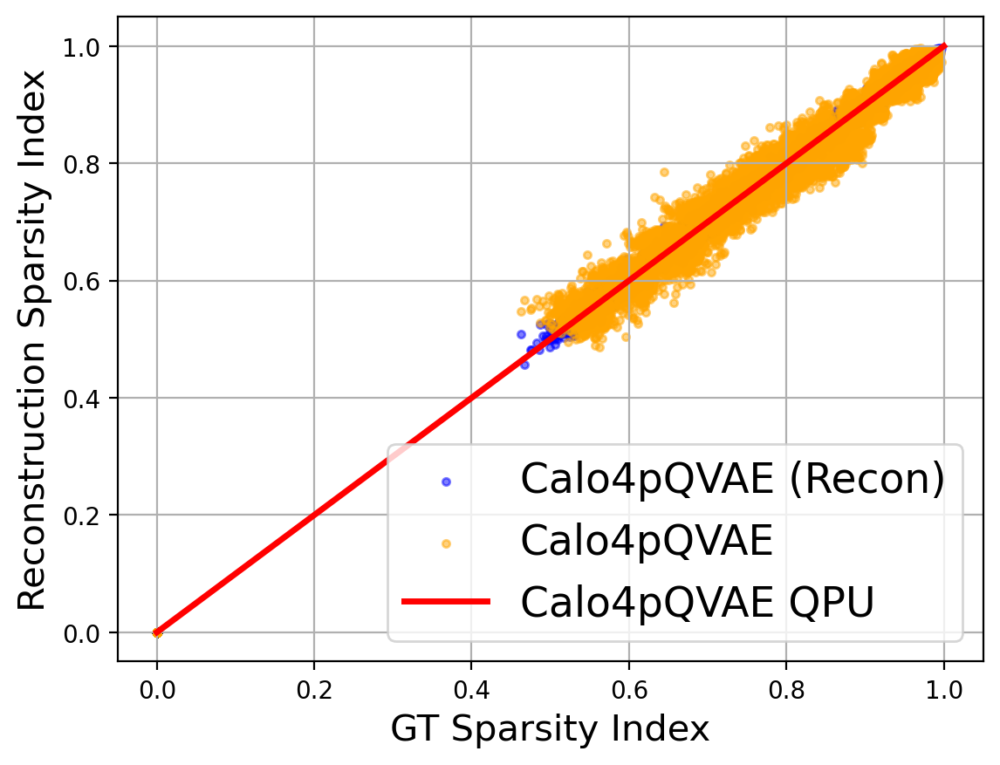

In [57]:
plt.scatter(((xtarget_samples == 0).sum(dim=1)/xtarget_samples.shape[1]).numpy(), ((xrecon_samples == 0).sum(dim=1)/xtarget_samples.shape[1]).numpy(),  marker='.', alpha=.5, color="b")
plt.scatter(((xtarget_samples == 0).sum(dim=1)/xtarget_samples.shape[1]).numpy(), ((xgen_samples == 0).sum(dim=1)/xtarget_samples.shape[1]).numpy(),  marker='.', alpha=.5, color="orange")
# plt.scatter(((xtarget_samples == 0).sum(dim=1)/xtarget_samples.shape[1]).numpy(), ((xgen_samples_qpu == 0).sum(dim=1)/xtarget_samples.shape[1]).numpy(),  marker='.', alpha=.5, color="purple")
plt.plot([0,1],[0,1], c='red', lw=2.5)
plt.xlabel('GT Sparsity Index', fontsize=15)
plt.ylabel('Reconstruction Sparsity Index', fontsize=15)
plt.legend(["Calo4pQVAE (Recon)", "Calo4pQVAE", "Calo4pQVAE QPU"], fontsize=17)
# plt.title(f'{ds[part]}')
plt.grid("True")
plt.savefig(f'/home/javier/Projects/CaloQVAE/figs/{modelname}/sparsity_scatter_{modelname}_{arch}_{datascaled}_{part}.png')
plt.show()

In [41]:
entarget_samples

tensor([[ 524288.],
        [ 524288.],
        [ 524288.],
        ...,
        [4194304.],
        [4194304.],
        [4194304.]])

In [98]:
E_right = 100000
E_left = 0
tmp = (entarget_samples < E_right) * (entarget_samples > E_left)
idxEnFilter = (tmp == True).nonzero(as_tuple=True)[0]
len(idxEnFilter)

16726

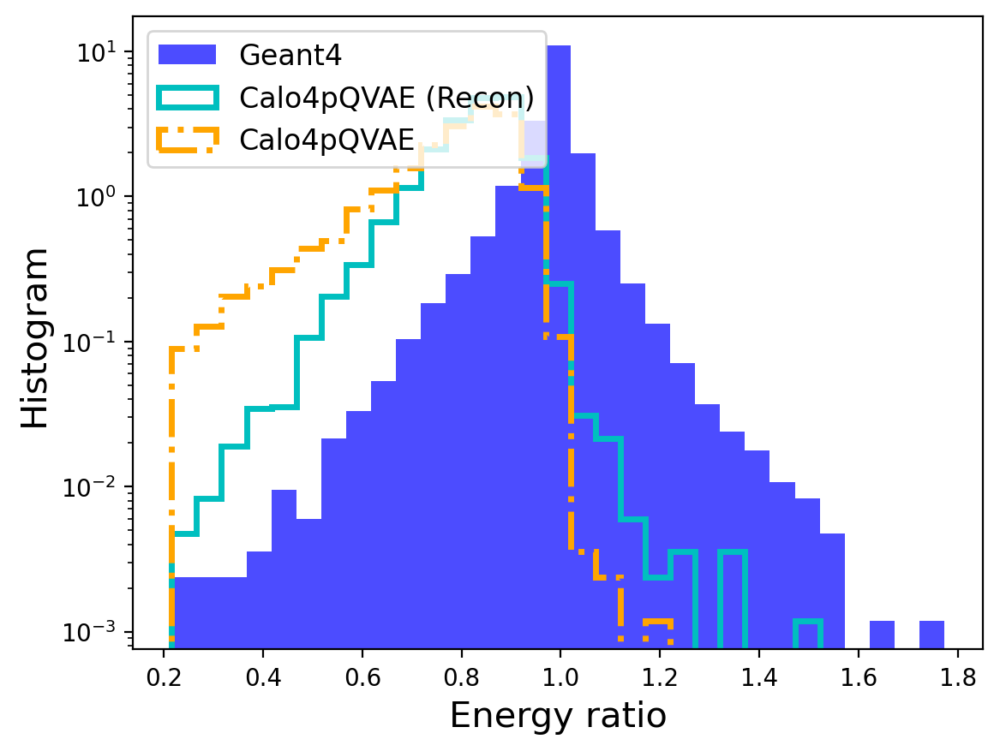

In [99]:
minVal, maxVal = min((xtarget_samples[idxEnFilter,:].sum(dim=1)/entarget_samples[idxEnFilter].view(-1)).numpy()), max((xtarget_samples[idxEnFilter,:].sum(dim=1)/entarget_samples[idxEnFilter].view(-1)).numpy())
binwidth = (maxVal-minVal)/30
plt.hist((xtarget_samples[idxEnFilter,:].sum(dim=1)/entarget_samples[idxEnFilter].view(-1)).numpy(), bins=np.arange(minVal, maxVal + binwidth, binwidth), log=True, histtype='stepfilled', linewidth=2.5, color="b", alpha=0.7, density=True, label="Geant4")
plt.hist((xrecon_samples[idxEnFilter,:].sum(dim=1).numpy()/entarget_samples[idxEnFilter].view(-1)).numpy(), bins=np.arange(minVal, maxVal + binwidth, binwidth), log=True, histtype='step', linewidth=2.5, color="c", density=True, label="Calo4pQVAE (Recon)")
plt.hist((xgen_samples[idxEnFilter,:].sum(dim=1).numpy()/entarget_samples[idxEnFilter].view(-1)).numpy(), bins=np.arange(minVal, maxVal + binwidth, binwidth), log=True, histtype='step', linewidth=2.5, color="orange", linestyle="dashdot", density=True, label="Calo4pQVAE")
# plt.hist((xgen_samples_qpu[idxEnFilter,:].sum(dim=1)/entarget_samples[idxEnFilter].view(-1)).numpy(), bins=np.arange(minVal, maxVal + binwidth, binwidth), log=True, histtype='step', linewidth=2.5, color="m", linestyle="dashed", density=True, label="Calo4pQVAE QPU")

# plt.hist((xtarget_samples.sum(dim=1)/entarget_samples.view(-1)).numpy(), bins=30, log=True, histtype='stepfilled', linewidth=2.5, color="b", alpha=0.7, density=True)
# plt.hist((xrecon_samples.sum(dim=1).numpy()/entarget_samples.view(-1)).numpy(), bins=30, log=True, histtype='step', linewidth=2.5, color="c", density=True)
# plt.hist((xgen_samples.sum(dim=1).numpy()/entarget_samples.view(-1)).numpy(), bins=30, log=True, histtype='step', linewidth=2.5, color="orange", linestyle="dashdot", density=True)
# plt.hist((xgen_samples_qpu[idxEnFilter,:].sum(dim=1)/entarget_samples[idxEnFilter].view(-1)).numpy(), bins=30, log=True, histtype='step', linewidth=2.5, color="m", linestyle="dashed", density=True)


plt.xlabel("Energy ratio", fontsize=15)
# plt.xscale('log')

plt.ylabel("Histogram", fontsize=15)
# plt.legend(["GT", "Recon", "Sample", "Sample w/ QPU"], fontsize=18)
plt.legend(fontsize=12, loc='upper left')
# plt.title(f'{ds[part]} \n {E_left/1000}<E_inc<{E_right/1000} (GeV)')
plt.savefig(f'/home/javier/Projects/CaloQVAE/figs/{modelname}/energy_ratio_{modelname}_{arch}_{datascaled}_{part}.png')
plt.show()


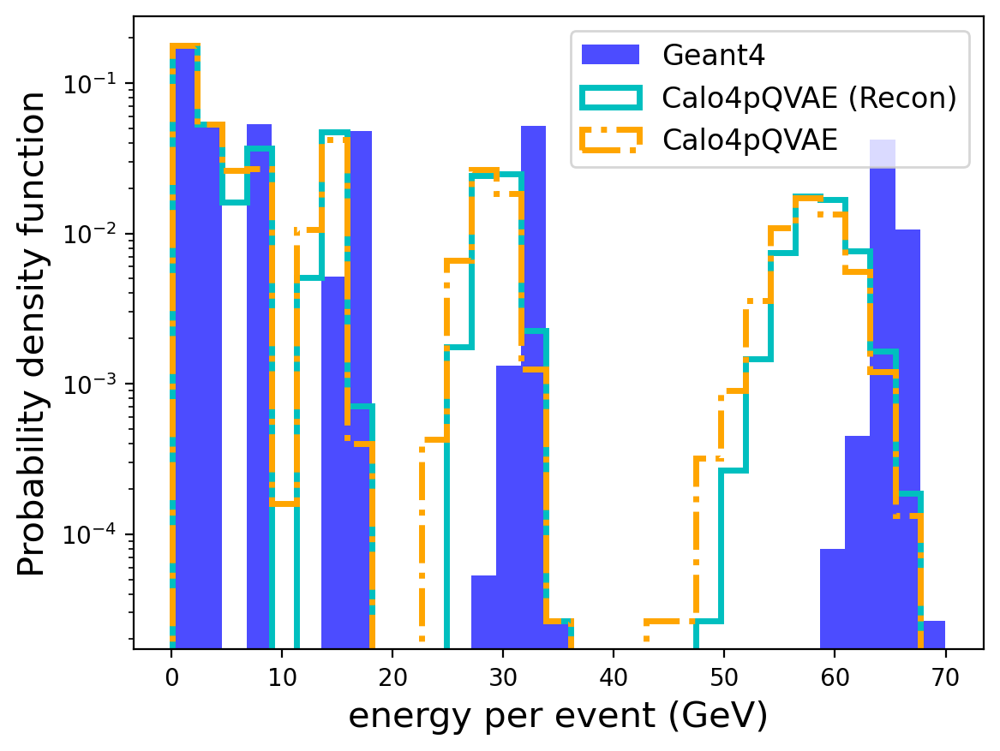

In [101]:
minVal, maxVal = min(xtarget_samples[idxEnFilter,:].sum(dim=1).numpy()/1000), max(xtarget_samples[idxEnFilter,:].sum(dim=1).numpy()/1000)
binwidth = (maxVal-minVal)/30
plt.hist(xtarget_samples[idxEnFilter,:].sum(dim=1).numpy()/1000, bins=np.arange(minVal, maxVal + binwidth, binwidth), log=True, histtype='stepfilled', linewidth=2.5, color="b", alpha=0.7, density=True, label="Geant4")
plt.hist(xrecon_samples[idxEnFilter,:].sum(dim=1).numpy()/1000, bins=np.arange(minVal, maxVal + binwidth, binwidth), log=True, histtype='step', linewidth=2.5, color="c", density=True, label="Calo4pQVAE (Recon)")
plt.hist(xgen_samples[idxEnFilter,:].sum(dim=1).numpy()/1000, bins=np.arange(minVal, maxVal + binwidth, binwidth), log=True, histtype='step', linewidth=2.5, color="orange", linestyle="dashdot", density=True, label="Calo4pQVAE")
# plt.hist(xgen_samples_qpu[idxEnFilter,:].sum(dim=1).numpy()/1000, bins=np.arange(minVal, maxVal + binwidth, binwidth), log=True, histtype='step', linewidth=2.5, color="m", linestyle="dashed", density=True, label="Calo4pQVAE QPU")

plt.xlabel("energy per event (GeV)", fontsize=15)
# plt.xscale('log')

plt.ylabel("Probability density function", fontsize=15)
# plt.legend(["GT", "Recon", "Sample", "Sample w/ QPU"])
plt.legend(fontsize=12)
# plt.title(f'{ds[part]} \n {E_left/1000}<E_inc<{E_right/1000} (GeV)')
plt.savefig(f'/home/javier/Projects/CaloQVAE/figs/{modelname}/energy_slice_{modelname}_{arch}_{datascaled}_{part}.png')
plt.show()

<Figure size 800x600 with 0 Axes>

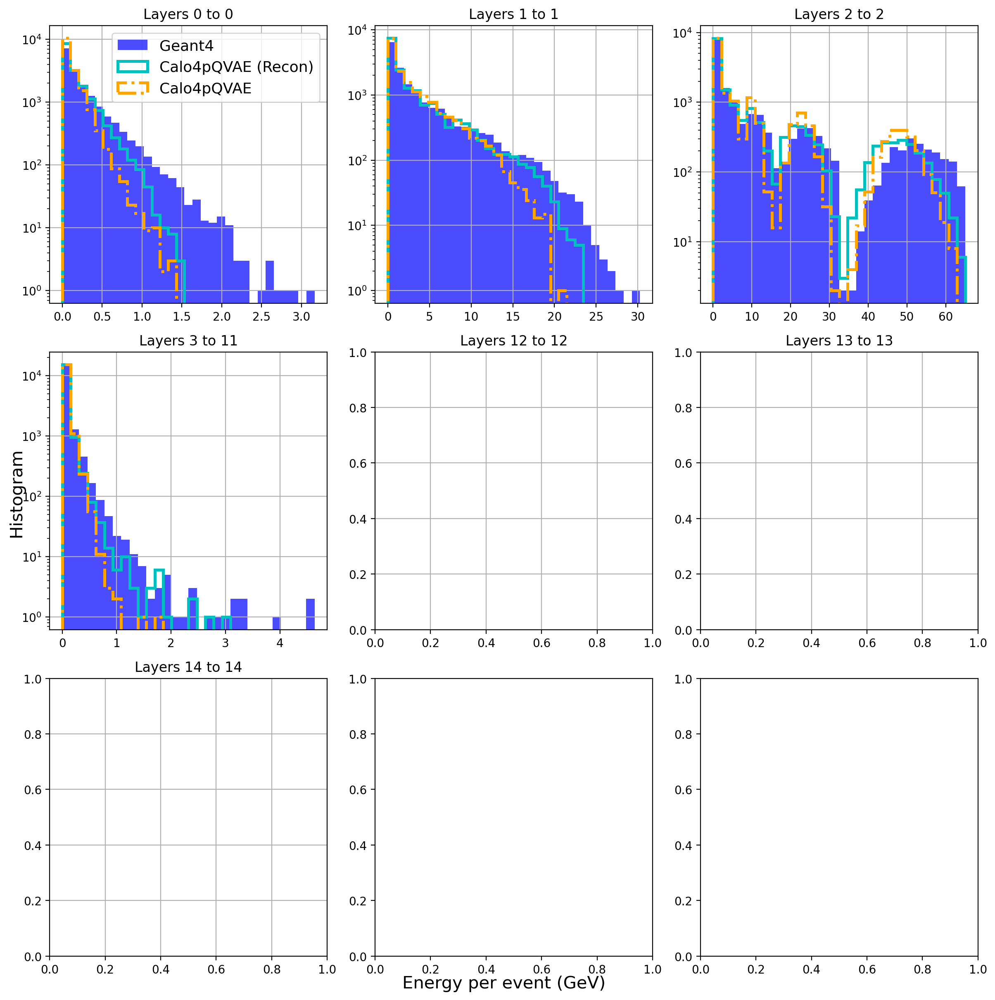

In [102]:
HLF_1_Atlas.relevantLayers = [0,1,2,3,12,13,14,15]
plt.figure(figsize=(8,6))
# Create a grid of subplots
fig, axes = plt.subplots(3,3, figsize=(12, 12), sharey=False, sharex=False, tight_layout=True)
fig.text(0.5, 0.0, 'Energy per event (GeV)', ha='center', fontsize=15)
fig.text(0.0, 0.5, 'Histogram', va='center', rotation='vertical', fontsize=15)

# Iterate through the columns of X and plot histograms
for i,_ in enumerate(HLF_1_Atlas.relevantLayers[:-1]):
    row_index = i // 3  # Determine the row index
    col_index = i % 3   # Determine the column index
    
    ax = axes[row_index, col_index]  # Get the current subplot
    
    # Plot histogram for the current column
    idx = HLF_1_Atlas.relevantLayers[i+1]*14*24
    idxPrev = (HLF_1_Atlas.relevantLayers[i])*14*24
    l = idx - idxPrev
    minVal, maxVal = min(xtarget_samples[idxEnFilter, idxPrev:idx].sum(dim=1).numpy()/1000), max(xtarget_samples[idxEnFilter, idxPrev:idx].sum(dim=1).numpy()/1000)
    binwidth = (maxVal-minVal)/30
    if minVal != maxVal:
        ax.hist(xtarget_samples[idxEnFilter, idxPrev:idx].sum(dim=1).numpy()/1000,  bins=np.arange(minVal, maxVal + binwidth, binwidth), log=True, histtype='stepfilled', linewidth=2.5, color="b", alpha=0.7, label="Geant4")
        ax.hist(xrecon_samples[idxEnFilter, idxPrev:idx].sum(dim=1).numpy()/1000, bins=np.arange(minVal, maxVal + binwidth, binwidth), log=True, histtype='step', linewidth=2.5, color="c", label="Calo4pQVAE (Recon)")
        # ax.hist(xrecon_samples_2[:, idxPrev:idx].sum(dim=1).numpy()/1000, bins=20, log=True, histtype='step', linewidth=2.5, color="m", linestyle="dashdot", label="MC")
        ax.hist(xgen_samples[idxEnFilter, idxPrev:idx].sum(dim=1).numpy()/1000, bins=np.arange(minVal, maxVal + binwidth, binwidth), log=True, histtype='step', linewidth=2.5, color="orange", linestyle="dashdot", label="Calo4pQVAE")
        
        # ax.hist(xgen_samples_qpu[idxEnFilter, idxPrev:idx].sum(dim=1).numpy()/1000, bins=np.arange(minVal, maxVal + binwidth, binwidth), log=True, histtype='step', linewidth=2.5, color="m", linestyle="dashed", label="Calo4pQVAE QPU")
    else:
        pass
    if i == 0:
        # ax.legend(["GT", "Recon", "Sample", "Sample w/ QPU"], title=f'{ds[part]}')
        ax.legend(fontsize=13, loc='upper right')
    ax.grid("True")
    
    # Set labels and title for the subplot
    # ax.set_xlabel(f'Column {i + 1}')
    # ax.set_ylabel('Frequency')
    ax.set_title(f'Layers {HLF_1_Atlas.relevantLayers[i]} to {HLF_1_Atlas.relevantLayers[i+1]-1}')

# Adjust layout and display the plots
plt.tight_layout()
plt.savefig(f'/home/javier/Projects/CaloQVAE/figs/{modelname}/energy_slice_per_layer_{modelname}_{arch}_{datascaled}_{part}.png')
plt.show()


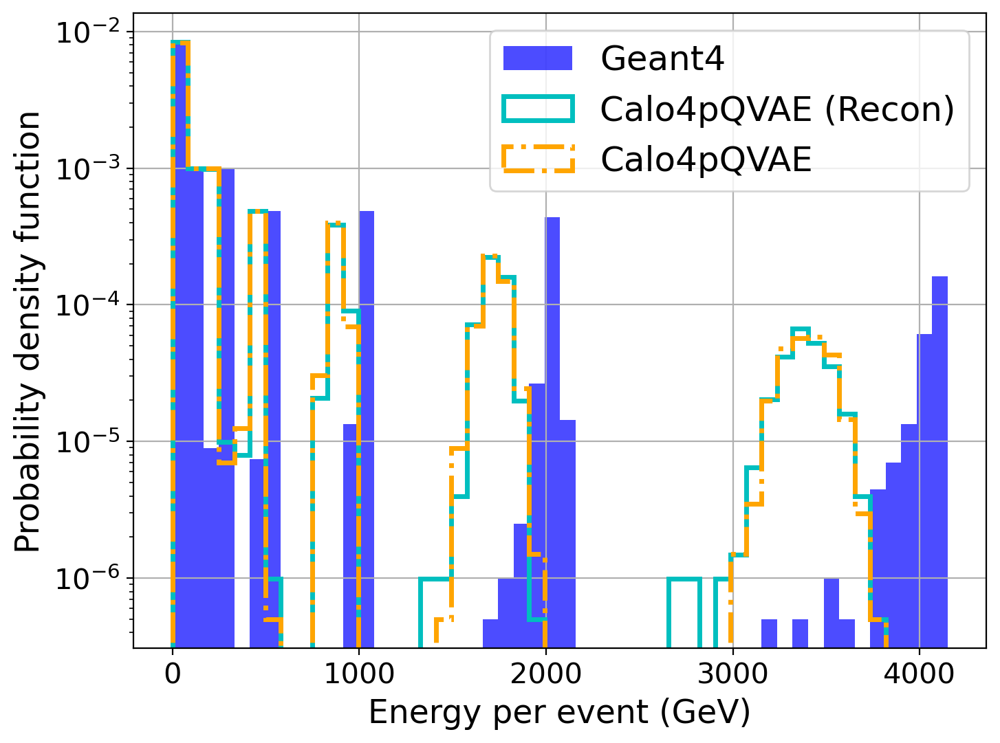

torch.Size([24183, 2352])


In [104]:
minVal, maxVal = min(xtarget_samples.sum(dim=1).numpy()/1000), max(xtarget_samples.sum(dim=1).numpy()/1000)
binwidth = (maxVal-minVal)/50

plt.figure(figsize=(8,6))
plt.hist(xtarget_samples.sum(dim=1).numpy()/1000, bins=np.arange(minVal, maxVal + binwidth, binwidth), log=True, density=True, histtype='stepfilled', linewidth=2.5, color="b", alpha=0.7, label="Geant4")
# plt.hist(xrecon_samples.sum(dim=1).numpy()/1000, bins=20, log=True, density=True, histtype='step', alpha=1.0, linewidth=2.5, color="c", label="Calo4pQVAE (Recon)")
# plt.hist(xgen_samples.sum(dim=1).numpy()/1000, bins=20, log=True, density=True, histtype='step', alpha=1.0, linewidth=2.5, color="orange", linestyle="dashdot", label="Calo4pQVAE")
plt.hist(xrecon_samples.sum(dim=1).numpy()/1000, bins=np.arange(minVal, maxVal + binwidth, binwidth), log=True, density=True, histtype='step', alpha=1.0, linewidth=2.5, color="c", label="Calo4pQVAE (Recon)")
plt.hist(xgen_samples.sum(dim=1).numpy()/1000, bins=np.arange(minVal, maxVal + binwidth, binwidth), log=True, density=True, histtype='step', alpha=1.0, linewidth=2.5, color="orange", linestyle="dashdot", label="Calo4pQVAE")
# plt.hist(xgen_samples_qpu_2.sum(dim=1).numpy()/1000, bins=np.arange(minVal, maxVal + binwidth, binwidth), log=True, density=True, histtype='step', alpha=1.0, linewidth=2.5, color="purple", linestyle="dashed", label="QPU")
# plt.hist(xgen_samples_qpu.sum(dim=1).numpy()/1000, bins=np.arange(minVal, maxVal + binwidth, binwidth), log=True, density=True, histtype='step', alpha=1.0, linewidth=2.5, color="purple", linestyle="dashed", label="Calo4pQVAE QPU")


# plt.hist(xtarget_samples.sum(dim=1).numpy()/1000, bins=np.arange(0, 100 + 1,2), log=True, histtype='step', linewidth=2.5, color="b")
# plt.hist(xrecon_samples.sum(dim=1).numpy()/1000, bins=np.arange(0, 100 + 1,2), log=True, histtype='step', linewidth=2.5, color="m", linestyle="dashdot")
# plt.hist(xgen_samples.sum(dim=1).numpy()/1000, bins=np.arange(0, 100 + 1,2), log=True, histtype='step', linewidth=2.5, color="orange", linestyle="dashed")
# plt.hist(xtarget_samples.sum(dim=1).numpy()/1000, bins=np.arange(100+1, 1000 + 1,10), log=True, histtype='step')
# plt.hist(xrecon_samples.sum(dim=1).numpy()/1000, bins=np.arange(100+1, 1000 + 1,10), log=True, histtype='step')
# plt.hist(xgen_samples.sum(dim=1).numpy()/1000, bins=np.arange(100+1, 1000 + 1,10), log=True, histtype='step')
plt.xlabel("Energy per event (GeV)", fontsize=17)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
# plt.xscale('log')

plt.ylabel("Probability density function", fontsize=17)
# plt.legend(["GT", "Recon", "Sample", "Sample w/ QPU"], fontsize=18)
plt.legend( fontsize=18)
# plt.title(f'{ds[part]}')
plt.grid("True")
plt.savefig(f'/home/javier/Projects/CaloQVAE/figs/{modelname}/energy_{modelname}_{arch}_{datascaled}_{part}.png')
plt.show()
print(xgen_samples.shape)

NameError: name 'ds' is not defined

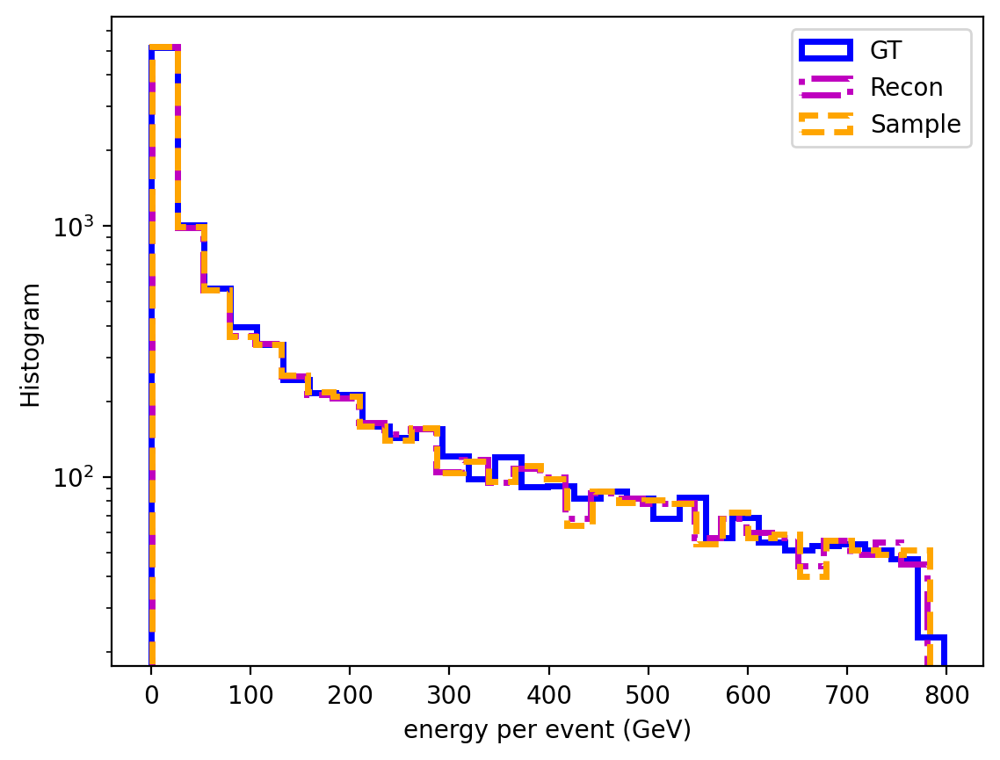

In [168]:
plt.hist(xtarget_samples.sum(dim=1).numpy()/1000, bins=30, log=True, histtype='step', linewidth=2.5, color="b")
plt.hist(xrecon_samples.sum(dim=1).numpy()/1000, bins=30, log=True, histtype='step', alpha=1.0, linewidth=2.5, color="m", linestyle="dashdot")
plt.hist(xgen_samples.sum(dim=1).numpy()/1000, bins=30, log=True, histtype='step', alpha=1.0, linewidth=2.5, color="orange", linestyle="dashed")
# plt.hist(xgen_samples_qpu.sum(dim=1).numpy()/1000, bins=30, log=True, histtype='step', alpha=1.0, linewidth=2.5, color="green", linestyle="dashed")
# plt.hist(xtarget_samples.sum(dim=1).numpy()/1000, bins=np.arange(0, 100 + 1,2), log=True, histtype='step', linewidth=2.5, color="b")
# plt.hist(xrecon_samples.sum(dim=1).numpy()/1000, bins=np.arange(0, 100 + 1,2), log=True, histtype='step', linewidth=2.5, color="m", linestyle="dashdot")
# plt.hist(xgen_samples.sum(dim=1).numpy()/1000, bins=np.arange(0, 100 + 1,2), log=True, histtype='step', linewidth=2.5, color="orange", linestyle="dashed")
# plt.hist(xtarget_samples.sum(dim=1).numpy()/1000, bins=np.arange(100+1, 1000 + 1,10), log=True, histtype='step')
# plt.hist(xrecon_samples.sum(dim=1).numpy()/1000, bins=np.arange(100+1, 1000 + 1,10), log=True, histtype='step')
# plt.hist(xgen_samples.sum(dim=1).numpy()/1000, bins=np.arange(100+1, 1000 + 1,10), log=True, histtype='step')
plt.xlabel("energy per event (GeV)")
# plt.xscale('log')

plt.ylabel("Histogram")
plt.legend(["GT", "Recon", "Sample", "Sample w/ QPU"])
plt.title(f'{ds[part]}')
plt.grid("True")
plt.savefig(f'/home/javier/Projects/CaloQVAE/figs/{modelname}/energy_RDM_{modelname}_{arch}_{datascaled}_{part}.png')
plt.show()
print(xgen_samples.shape)

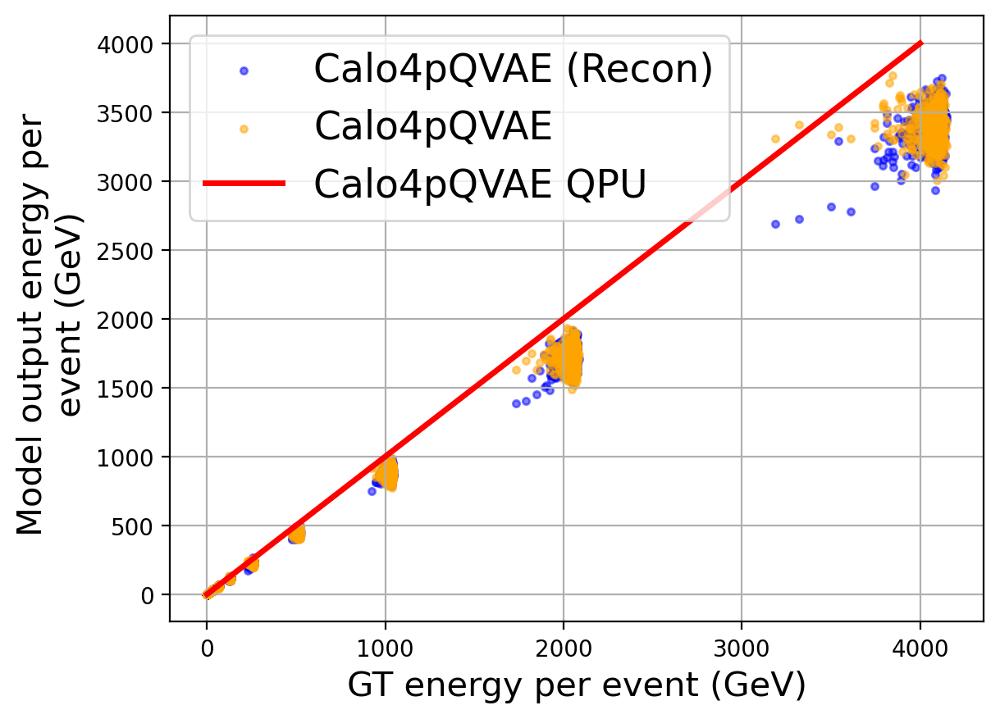

In [105]:
plt.scatter(xtarget_samples.sum(dim=1).numpy()/1000, xrecon_samples.sum(dim=1).numpy()/1000 * 1.0, marker='.', alpha=.5, color="b")
plt.scatter(xtarget_samples.sum(dim=1).numpy()/1000, xgen_samples.sum(dim=1).numpy()/1000 * 1.0, marker='.', alpha=.5, color="orange")
# plt.scatter(xtarget_samples.sum(dim=1).numpy()/1000, xgen_samples_qpu.sum(dim=1).numpy()/1000, marker='.', alpha=.5, color="purple")
plt.plot([0,4000],[0,4000], c='red', lw=2.5, label='y=x')
# plt.plot([0,20],[0,20], c='red', lw=2)
# axes[0,1].set_xlabel("GT energy per event (GeV)")
plt.legend(["Calo4pQVAE (Recon)", "Calo4pQVAE", "Calo4pQVAE QPU", "y=x"], fontsize=17)
plt.grid("True")
plt.xlabel("GT energy per event (GeV)", fontsize=15)
plt.ylabel("Model output energy per \n event (GeV)", fontsize=15)
plt.savefig(f'/home/javier/Projects/CaloQVAE/figs/{modelname}/energy_scatter_{modelname}_{arch}_{datascaled}_{part}.png')
plt.show()

<Figure size 800x600 with 0 Axes>

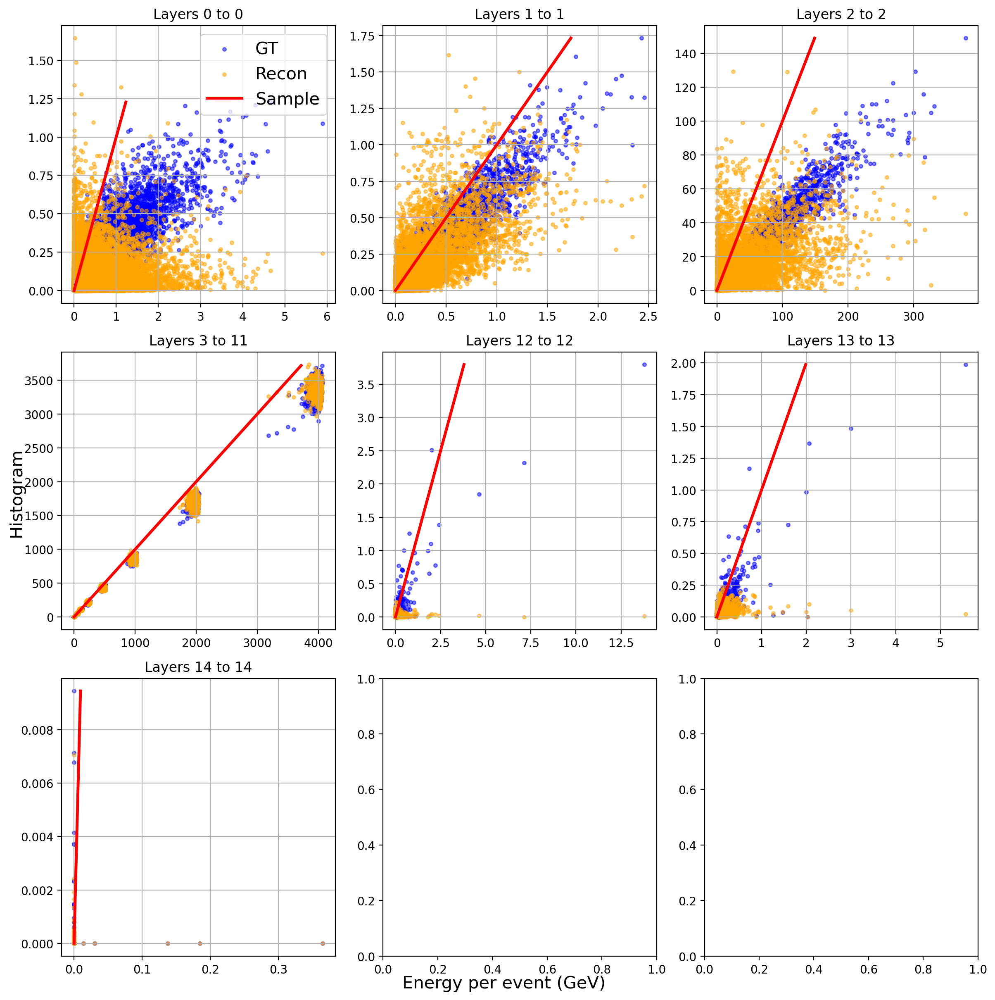

In [106]:
HLF_1_electron.relevantLayers = [0,1,2,3,12,13,14,15]
plt.figure(figsize=(8,6))
# Create a grid of subplots
fig, axes = plt.subplots(3,3, figsize=(12, 12), sharey=False, sharex=False, tight_layout=True)
fig.text(0.5, 0.0, 'Energy per event (GeV)', ha='center', fontsize=15)
fig.text(0.0, 0.5, 'Histogram', va='center', rotation='vertical', fontsize=15)

# Iterate through the columns of X and plot histograms
for i,_ in enumerate(HLF_1_electron.relevantLayers[:-1]):
    row_index = i // 3  # Determine the row index
    col_index = i % 3   # Determine the column index
    
    ax = axes[row_index, col_index]  # Get the current subplot
    
    # Plot histogram for the current column
    idx = HLF_1_electron.relevantLayers[i+1]*9*16
    idxPrev = (HLF_1_electron.relevantLayers[i])*9*16
    l = idx - idxPrev
    ax.scatter(xtarget_samples[:, idxPrev:idx].sum(dim=1).numpy()/1000, xrecon_samples[:, idxPrev:idx].sum(dim=1).numpy()/1000, marker='.', alpha=.5, color="b")
    ax.scatter(xtarget_samples[:, idxPrev:idx].sum(dim=1).numpy()/1000, xgen_samples[:, idxPrev:idx].sum(dim=1).numpy()/1000, marker='.', alpha=.5, color="orange")
    # ax.scatter(xtarget_samples[:, idxPrev:idx].sum(dim=1).numpy()/1000, xgen_samples_qpu[:, idxPrev:idx].sum(dim=1).numpy()/1000, marker='.', alpha=.5, color="purple")
    minVal, maxVal = np.min(xrecon_samples[:, idxPrev:idx].sum(dim=1).numpy()/1000), np.max(xrecon_samples[:, idxPrev:idx].sum(dim=1).numpy()/1000) 
    ax.plot([minVal, maxVal],[minVal, maxVal], c='red', lw=2.5, label='y=x')
    if i == 0:
        # ax.legend(["GT", "Recon", "Sample", "Sample w/ QPU"], title=f'{ds[part]}')
        ax.legend(["GT", "Recon", "Sample", "Sample w/ QPU"], fontsize=15)
    ax.grid("True")
    
    ax.set_title(f'Layers {HLF_1_electron.relevantLayers[i]} to {HLF_1_electron.relevantLayers[i+1]-1}')

# Adjust layout and display the plots
plt.tight_layout()
plt.savefig(f'/home/javier/Projects/CaloQVAE/figs/{modelname}/scatter_energy_per_layer_{modelname}_{arch}_{datascaled}_{part}.png')
plt.show()


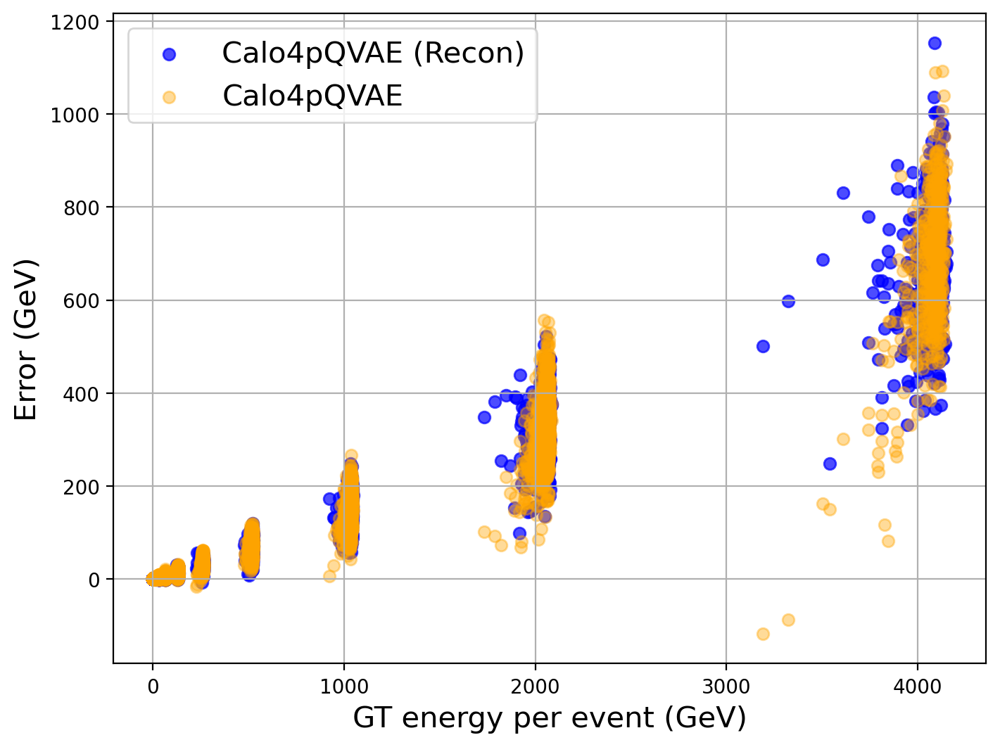

In [107]:
plt.figure(figsize=(8,6))
plt.scatter(xtarget_samples.sum(dim=1).numpy()/1000, (xtarget_samples.sum(dim=1).numpy() - xrecon_samples.sum(dim=1).numpy())/1000, marker='o', alpha=0.7, color="b")
plt.scatter(xtarget_samples.sum(dim=1).numpy()/1000, (xtarget_samples.sum(dim=1).numpy() - xgen_samples.sum(dim=1).numpy())/1000, marker='o', alpha=0.4, color="orange")
# plt.scatter(xtarget_samples.sum(dim=1).numpy()/1000, (xtarget_samples.sum(dim=1).numpy() - xgen_samples_qpu.sum(dim=1).numpy())/1000, marker='o', alpha=0.2, color="m")
# plt.plot([0,20],[0,20], c='red', lw=2)
plt.xlabel("GT energy per event (GeV)", fontsize=15)
plt.ylabel("Error (GeV)", fontsize=15)
# plt.ylim([-40,40])
plt.legend(["Calo4pQVAE (Recon)", "Calo4pQVAE", "Calo4pQVAE QPU"], fontsize=15)
plt.grid("True")
plt.savefig(f'/home/javier/Projects/CaloQVAE/figs/{modelname}/energy_scatter_Error_{modelname}_{arch}_{datascaled}_{part}.png')
plt.show()

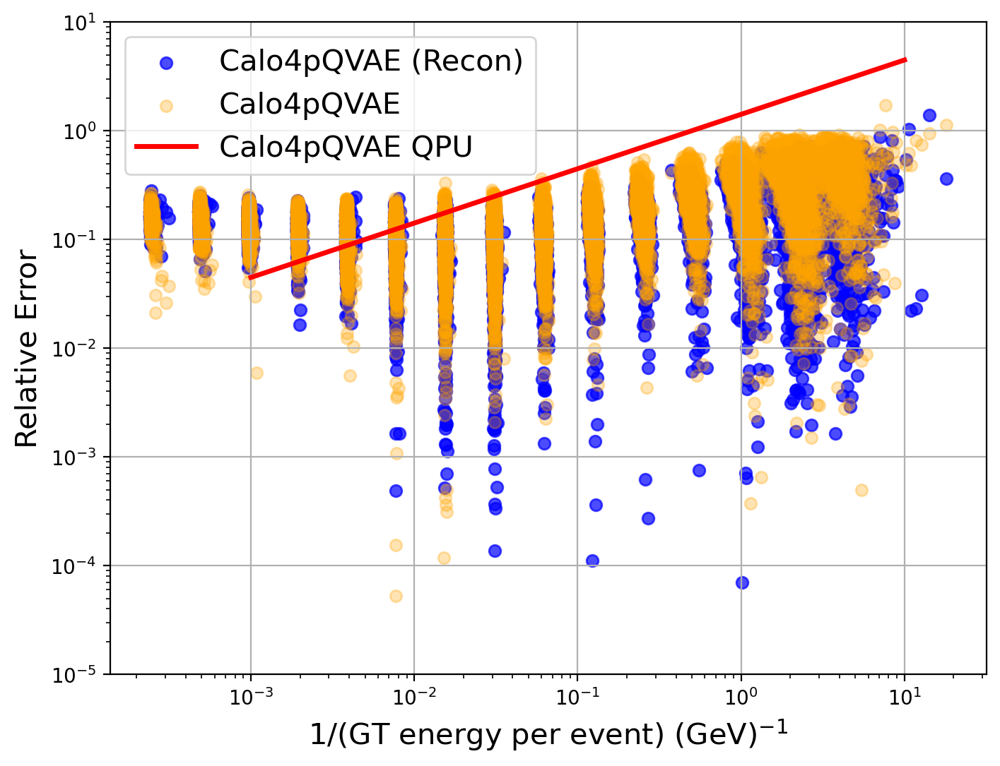

In [108]:
plt.figure(figsize=(8,6))
plt.scatter(1/(xtarget_samples.sum(dim=1).numpy()/1000), np.abs(xtarget_samples.sum(dim=1).numpy() - xrecon_samples.sum(dim=1).numpy())/(xtarget_samples.sum(dim=1).numpy()+1e-3), marker='o', alpha=.7, color="blue")
plt.scatter(1/(xtarget_samples.sum(dim=1).numpy()/1000), np.abs(xtarget_samples.sum(dim=1).numpy() - xgen_samples.sum(dim=1).numpy())/(xtarget_samples.sum(dim=1).numpy()+1e-3), marker='o', alpha=.3, color="orange")
# plt.scatter(1/(xtarget_samples.sum(dim=1).numpy()/1000), np.abs(xtarget_samples.sum(dim=1).numpy() - xgen_samples_qpu.sum(dim=1).numpy())/(xtarget_samples.sum(dim=1).numpy()+1e-3), marker='o', alpha=.1, color="m")
plt.plot([1e-3,1e1],np.sqrt([1e-3,1e1])*np.power(2,0.5), c='r', lw=2.5, label='y=sqrt(x)')
# axes[1,1].plot([1e-9,1e-6],np.linspace(1e-9,1e-6)*np.power(10,3.5), c='c', lw=2.5, label='y=x', linestyle="dashed")
plt.grid("True")
plt.yscale('log')
plt.xscale('log')
plt.legend()
plt.ylim([1e-5,1e1])
plt.yticks([1e-5,1e-4,1e-3,1e-2,1e-1,1e0,1e1])
plt.legend(["Calo4pQVAE (Recon)", "Calo4pQVAE", "Calo4pQVAE QPU", "y=sqrt(x)"], fontsize=15)
plt.ylabel("Relative Error", fontsize=15)
plt.xlabel('1/(GT energy per event) (GeV)$^{-1}$', fontsize=15)
plt.savefig(f'/home/javier/Projects/CaloQVAE/figs/{modelname}/energy_scatter_RelError_{modelname}_{arch}_{datascaled}_{part}.png')
plt.show()

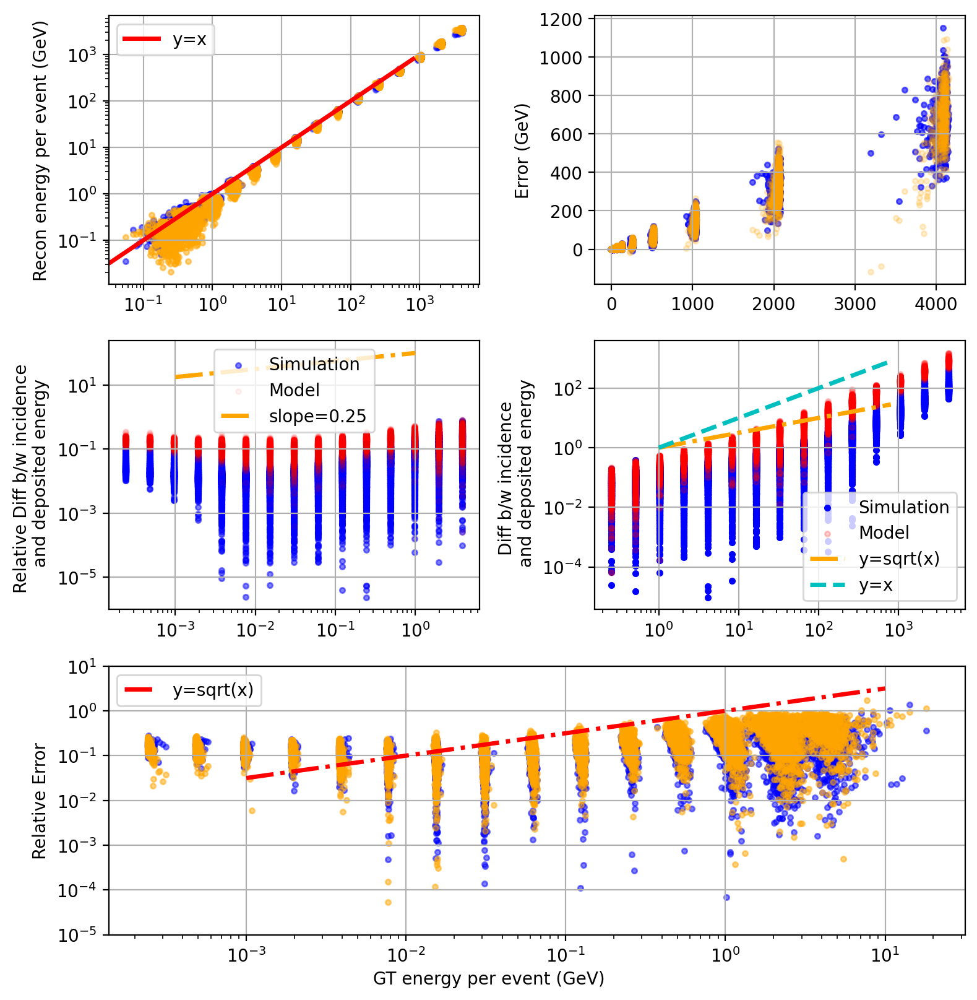

In [109]:
fig, axes = plt.subplots(3,2, figsize=(8,8), tight_layout=True)
fig.text(0.5, 0.0, 'GT energy per event (GeV)', ha='center')
# fig.text(0.5, 1.0, f'{ds[part]}', ha='center', fontsize=12)

axes[0,0].scatter(xtarget_samples.sum(dim=1).numpy()/1000, xrecon_samples.sum(dim=1).numpy()/1000, marker='.', alpha=.5, color="b")
axes[0,0].scatter(xtarget_samples.sum(dim=1).numpy()/1000, xgen_samples.sum(dim=1).numpy()/1000, marker='.', alpha=.5, color="orange")
# axes[0,0].scatter(xtarget_samples.sum(dim=1).numpy()/1000, xgen_samples_qpu.sum(dim=1).numpy()/1000, marker='.', alpha=.5, color="purple")
axes[0,0].plot([0,800],[0,800], c='red', lw=2.5, label='y=x')
# axes[0,0].plot([0,3800],[0,3800], c='red', lw=2.5, label='y=x')
axes[0,0].set_ylabel("Recon energy per event (GeV)")
axes[0,0].legend()
axes[0,0].grid("True")
axes[0,0].set_yscale('log')
axes[0,0].set_xscale('log')

axes[0,1].scatter(xtarget_samples.sum(dim=1).numpy()/1000, (xtarget_samples.sum(dim=1).numpy() - xrecon_samples.sum(dim=1).numpy())/1000, marker='.', alpha=0.6, color="b")
axes[0,1].scatter(xtarget_samples.sum(dim=1).numpy()/1000, (xtarget_samples.sum(dim=1).numpy() - xgen_samples.sum(dim=1).numpy())/1000, marker='.', alpha=0.2, color="orange")
# axes[0,1].scatter(xtarget_samples.sum(dim=1).numpy()/1000, (xtarget_samples.sum(dim=1).numpy() - xgen_samples_qpu.sum(dim=1).numpy())/1000, marker='.', alpha=0.1, color="m")
# plt.plot([0,20],[0,20], c='red', lw=2)
# axes[0,1].set_xlabel("GT energy per event (GeV)")
axes[0,1].set_ylabel("Error (GeV)")
# axes[0,1].set_ylim([-40,40])
# axes[0,1].legend()
# axes[0,1].set_yscale('log')
axes[0,1].grid("True")

# axes[1,0].scatter(entarget_samples.numpy()/1000, np.abs(entarget_samples.reshape(-1).numpy() - xtarget_samples.sum(dim=1).numpy())/(entarget_samples.reshape(-1).numpy()+1e-3), marker='.', alpha=.5, color="blue", label="Simulation")
# axes[1,0].scatter(entarget_samples.numpy()/1000, np.abs(entarget_samples.reshape(-1).numpy() - xrecon_samples.sum(dim=1).numpy())/(entarget_samples.reshape(-1).numpy()+1e-3), marker='.', alpha=.05, color="red", label="Model")
axes[1,0].scatter(1/(entarget_samples.numpy()/1000), np.abs(entarget_samples.reshape(-1).numpy() - xtarget_samples.sum(dim=1).numpy())/(entarget_samples.reshape(-1).numpy()+1e-3), marker='.', alpha=.5, color="blue", label="Simulation")
axes[1,0].scatter(1/(entarget_samples.numpy()/1000), np.abs(entarget_samples.reshape(-1).numpy() - xrecon_samples.sum(dim=1).numpy())/(entarget_samples.reshape(-1).numpy()+1e-3), marker='.', alpha=.05, color="red", label="Model")
axes[1,0].plot([1e-3,1e0],np.power([1e-3,1e0],0.25)*np.power(10,2.0), c='orange', lw=2.5, label='slope=0.25', linestyle="dashdot")
axes[1,0].grid("True")
axes[1,0].set_yscale('log')
axes[1,0].set_xscale('log')
axes[1,0].legend()
axes[1,0].set_ylabel("Relative Diff b/w incidence \n and deposited energy")

# axes[1,1].scatter(xtarget_samples.sum(dim=1).numpy()/1000, np.abs(xtarget_samples.sum(dim=1).numpy()/1000 - xrecon_samples.sum(dim=1).numpy()/1000), marker='.', alpha=.5, color="blue")
axes[1,1].scatter(entarget_samples.numpy()/1000, np.abs(entarget_samples.reshape(-1).numpy()/1000 - xtarget_samples.sum(dim=1).numpy()/1000), marker='.', alpha=1, color="blue", label="Simulation")
axes[1,1].scatter(entarget_samples.numpy()/1000, np.abs(entarget_samples.reshape(-1).numpy()/1000 - xrecon_samples.sum(dim=1).numpy()/1000), marker='.', alpha=.2, color="red", label="Model")
axes[1,1].plot([1,800],np.sqrt([1,800]), c='orange', lw=2.5, label='y=sqrt(x)', linestyle="dashdot")
axes[1,1].plot([1,800],[1,800], c='c', lw=2.5, label='y=x', linestyle="dashed")
# axes[1,1].set_title(f'{ds[part]}')
axes[1,1].grid("True")
axes[1,1].set_yscale('log')
axes[1,1].set_xscale('log')
axes[1,1].set_ylabel("Diff b/w incidence \n and deposited energy")
axes[1,1].legend()


# Merge the first row's axes
gs = axes[2, 0].get_gridspec()
for ax in axes[2, :]:
    ax.remove()
ax_big = fig.add_subplot(gs[2, :])
ax_big.scatter(1/(xtarget_samples.sum(dim=1).numpy()/1000), np.abs(xtarget_samples.sum(dim=1).numpy() - xrecon_samples.sum(dim=1).numpy())/(xtarget_samples.sum(dim=1).numpy()+1e-3), marker='.', alpha=.5, color="blue")
ax_big.scatter(1/(xtarget_samples.sum(dim=1).numpy()/1000), np.abs(xtarget_samples.sum(dim=1).numpy() - xgen_samples.sum(dim=1).numpy())/(xtarget_samples.sum(dim=1).numpy()+1e-3), marker='.', alpha=.5, color="orange")
# ax_big.scatter(1/(xtarget_samples.sum(dim=1).numpy()/1000), np.abs(xtarget_samples.sum(dim=1).numpy() - xgen_samples_qpu.sum(dim=1).numpy())/(xtarget_samples.sum(dim=1).numpy()+1e-3), marker='.', alpha=.5, color="purple")
# axes[1,0].set_title(f'{ds[part]}')
ax_big.plot([1e-3,1e1],np.sqrt([1e-3,1e1])*np.power(1,3.5), c='r', lw=2.5, label='y=sqrt(x)', linestyle="dashdot")
# axes[1,1].plot([1e-9,1e-6],np.linspace(1e-9,1e-6)*np.power(10,3.5), c='c', lw=2.5, label='y=x', linestyle="dashed")
ax_big.grid("True")
ax_big.set_yscale('log')
ax_big.set_xscale('log')
ax_big.legend()
ax_big.set_ylim([1e-5,1e1])
ax_big.set_yticks([1e-5,1e-4,1e-3,1e-2,1e-1,1e0,1e1])
ax_big.set_ylabel("Relative Error")
plt.savefig(f'/home/javier/Projects/CaloQVAE/figs/{modelname}/energy_scatter_4panels_{modelname}_{arch}_{datascaled}_{part}.png')
plt.show()

<Figure size 800x600 with 0 Axes>

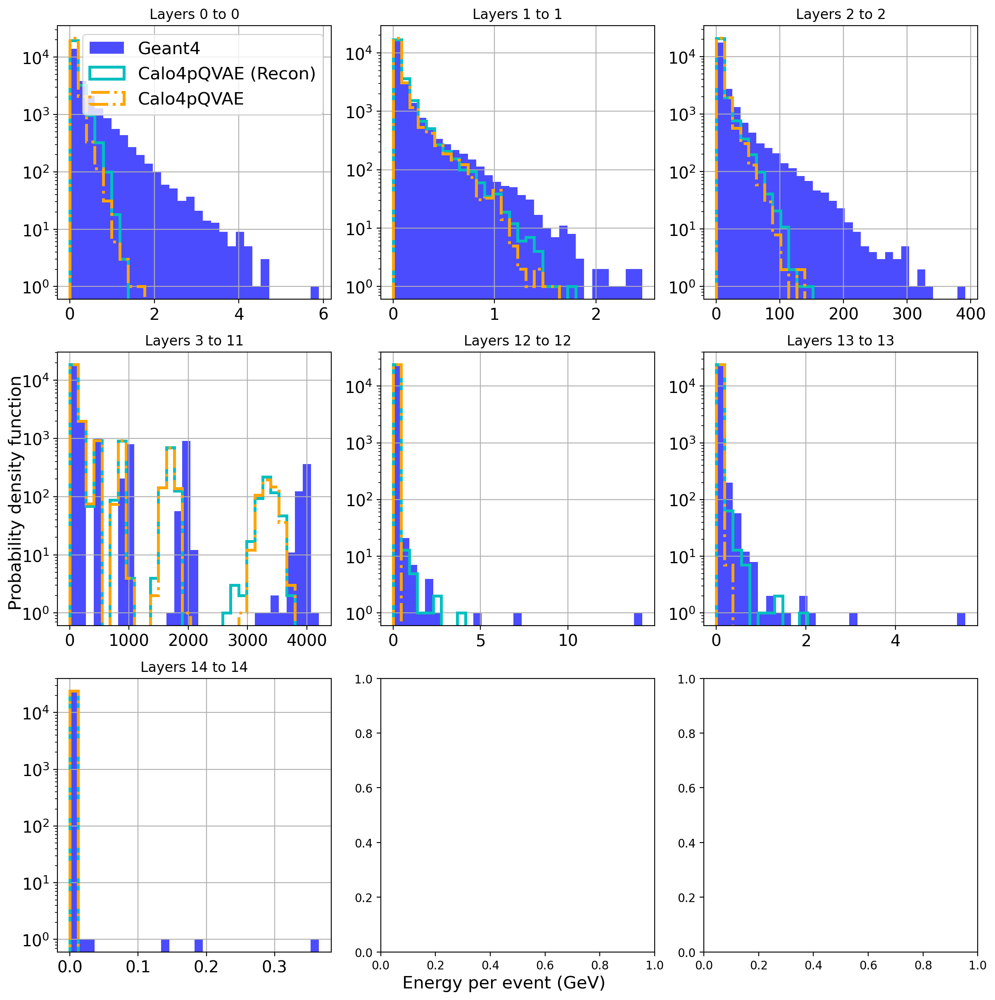

In [110]:
HLF_1_electron.relevantLayers = [0,1,2,3,12,13,14,15]
plt.figure(figsize=(8,6))
# Create a grid of subplots
fig, axes = plt.subplots(3,3, figsize=(12, 12), sharey=False, sharex=False, tight_layout=True)
fig.text(0.5, 0.0, 'Energy per event (GeV)', ha='center', fontsize=15)
fig.text(0.0, 0.5, 'Probability density function', va='center', rotation='vertical', fontsize=15)

# Iterate through the columns of X and plot histograms
for i,_ in enumerate(HLF_1_electron.relevantLayers[:-1]):
    row_index = i // 3  # Determine the row index
    col_index = i % 3   # Determine the column index
    
    ax = axes[row_index, col_index]  # Get the current subplot
    
    # Plot histogram for the current column
    idx = HLF_1_electron.relevantLayers[i+1]*9*16
    idxPrev = (HLF_1_electron.relevantLayers[i])*9*16
    l = idx - idxPrev
    minVal, maxVal = min(xtarget_samples[:, idxPrev:idx].sum(dim=1).numpy()/1000), max(xtarget_samples[:, idxPrev:idx].sum(dim=1).numpy()/1000)
    binwidth = (maxVal-minVal)/30
    ax.hist(xtarget_samples[:, idxPrev:idx].sum(dim=1).numpy()/1000,  bins=np.arange(minVal, maxVal + binwidth, binwidth), density=False, log=True, histtype='stepfilled', linewidth=2.5, color="b", alpha=0.7)
    ax.hist(xrecon_samples[:, idxPrev:idx].sum(dim=1).numpy()/1000, bins=np.arange(minVal, maxVal + binwidth, binwidth), density=False, log=True, histtype='step', linewidth=2.5, color="c")
    # ax.hist(xrecon_samples_2[:, idxPrev:idx].sum(dim=1).numpy()/1000, bins=20, log=True, histtype='step', linewidth=2.5, color="m", linestyle="dashdot")
    ax.hist(xgen_samples[:, idxPrev:idx].sum(dim=1).numpy()/1000, bins=np.arange(minVal, maxVal + binwidth, binwidth), density=False, log=True, histtype='step', linewidth=2.5, color="orange", linestyle="dashdot")
    # ax.hist(xgen_samples_qpu[:, idxPrev:idx].sum(dim=1).numpy()/1000, bins=np.arange(minVal, maxVal + binwidth, binwidth), log=True, density=False, histtype='step', linewidth=2.5, color="m", linestyle="dashed")
    if i == 0:
        # ax.legend(["GT", "Recon", "Sample", "Sample w/ QPU"], title=f'{ds[part]}')
        ax.legend(["Geant4", "Calo4pQVAE (Recon)", "Calo4pQVAE", "Calo4pQVAE QPU"], fontsize=15)
    ax.grid("True")
    ax.tick_params(labelsize=14)
    
    # Set labels and title for the subplot
    # ax.set_xlabel(f'Column {i + 1}')
    # ax.set_ylabel('Frequency')
    ax.set_title(f'Layers {HLF_1_electron.relevantLayers[i]} to {HLF_1_electron.relevantLayers[i+1]-1}')

# Adjust layout and display the plots
plt.tight_layout()
plt.savefig(f'/home/javier/Projects/CaloQVAE/figs/{modelname}/energy_per_layer_{modelname}_{arch}_{datascaled}_{part}.png', bbox_inches="tight")
plt.show()


In [59]:
with open(f'/home/javier/Projects/CaloQVAE/figs/{modelname}/xtarget_samples.pickle', 'wb') as handle:
    pickle.dump(xtarget_samples, handle, protocol=pickle.HIGHEST_PROTOCOL)
    
with open(f'/home/javier/Projects/CaloQVAE/figs/{modelname}/xrecon_samples.pickle', 'wb') as handle:
    pickle.dump(xrecon_samples, handle, protocol=pickle.HIGHEST_PROTOCOL)
         
with open(f'/home/javier/Projects/CaloQVAE/figs/{modelname}/xgen_samples.pickle', 'wb') as handle:
    pickle.dump(xgen_samples, handle, protocol=pickle.HIGHEST_PROTOCOL)
         
with open(f'/home/javier/Projects/CaloQVAE/figs/{modelname}/xgen_samples_qpu.pickle', 'wb') as handle:
    pickle.dump(xgen_samples_qpu, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [62]:
# engine.model.prior_samples_qpu
# with open(f'/home/javier/Projects/CaloQVAE/figs/{modelname}/priors_qpu.pickle', 'wb') as handle:
    # pickle.dump(engine.model.prior_samples_qpu, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [31]:

with open(f'/home/javier/Projects/CaloQVAE/figs/{modelname}/xgen_samples_qpu.pickle', 'rb') as handle:
    b = pickle.load(handle)

/raid/javier/anaconda3/lib/python3.11/site-packages/torch/storage.py:414: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(io.BytesIO(b))


In [32]:
b

tensor([[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
        [ 0.0000,  0.0000, 23.8827,  ...,  0.0000,  0.0000, 12.7882],
        ...,
        [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
        [25.3940,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]])

In [86]:
xgen_samples2 = []
en_input = [1,2,3,5,10,20,30,50,100,200,300,500,1000,2000,3000,5000,10000,20000]
ll = len(en_input)
gen_bs = 2048 #true_energy.shape[0]
with torch.no_grad():
    for i in en_input:
        if reducedata:
            engine._model.sampler._batch_size = true_energy.shape[0]
            sample_energies, sample_data = engine._model.generate_samples(num_samples=true_energy.shape[0], true_energy=true_energy)
            engine._model.sampler._batch_size = engine._config.engine.rbm_batch_size
            sample_data = engine._reduceinv(sample_data, sample_energies, R=R)
        elif scaled:
            engine._model.sampler._batch_size = gen_bs # true_energy.shape[0]
            sample_energies, sample_data = engine._model.generate_samples(num_samples=true_energy.shape[0], true_energy=1000*i, measure_time=True)
            engine._model.sampler._batch_size = engine._config.engine.rbm_batch_size
            sample_data = torch.tensor(engine._data_mgr.inv_transform(sample_data.detach().cpu().numpy()))
        else:
            engine._model.sampler._batch_size = true_energy.shape[0]
            sample_energies, sample_data = engine._model.generate_samples(num_samples=true_energy.shape[0], true_energy=true_energy)
            engine._model.sampler._batch_size = engine._config.engine.rbm_batch_size
            sample_data = sample_data.detach().cpu()*1000

        xgen_samples2.append( sample_data.detach().cpu())

xgen_samples2 = torch.cat(xgen_samples2, dim=0)

In [87]:
energy_gen = xgen_samples2.sum(dim=1)
m_energy_gen = [energy_gen[i*gen_bs:gen_bs*(i+1)].sum().item()/1000 for i in range(ll)]
sd_energy_gen = [energy_gen[i*gen_bs:gen_bs*(i+1)].std().item()/1000 for i in range(ll)]
lin_inter = np.power(m_energy_gen,1/2) * (1 - np.array(m_energy_gen)/np.array(m_energy_gen).max()) \
    + np.power(m_energy_gen,1) * np.array(m_energy_gen)/np.array(m_energy_gen).max()


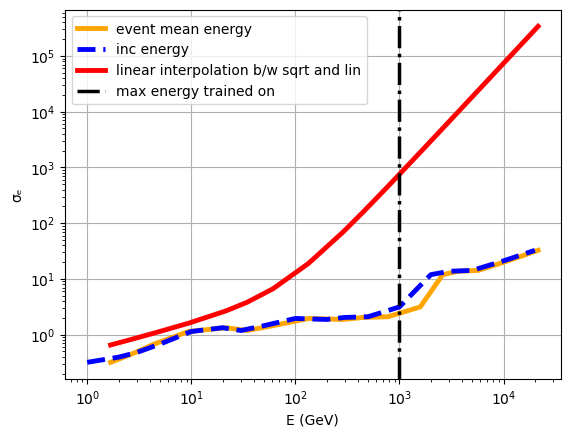

In [88]:
plt.plot(np.array(m_energy_gen)/1000, sd_energy_gen, c='orange', lw=3.5, label='event mean energy')
plt.plot((np.array(en_input)), sd_energy_gen, c='blue', lw=3.5, label='inc energy', linestyle="dashed")
plt.grid("True")
# plt.plot([1,10], np.sqrt([1,10])*np.power(10, -0.8))
plt.plot(np.array(m_energy_gen)/1000, lin_inter*np.power(10, -1.8), c='red', lw=3.5, label='linear interpolation b/w sqrt and lin')
plt.yscale('log')
plt.xscale('log')
plt.axvline(x=1000, c='black', lw=2.5, label='max energy trained on', linestyle="dashdot")
plt.legend()
plt.xlabel("E (GeV)")
plt.ylabel("σₑ")
plt.show()

In [254]:
# post_samples = torch.cat(post_samples,1)
M = post_samples.shape[1]
post_samples_cpu = post_samples.clone().detach().cpu()

In [283]:

pres = [(torch.arange(0,M).multiply(i*np.pi/M).cos() * post_samples_cpu + torch.arange(0,M).multiply(i*np.pi/M).sin() *(1 - post_samples_cpu).abs()).divide(np.sqrt(M)).unsqueeze(2) for i in np.arange(1,M-1,1)]
# pres = [(torch.arange(0,M).multiply(i*np.pi/M).cos()).divide(np.sqrt(M)) for i in np.arange(1,M-1,1)]
pos_enc = torch.cat(pres,2).transpose(1,2);
res = pos_enc.sum([1,2])/(M-1)

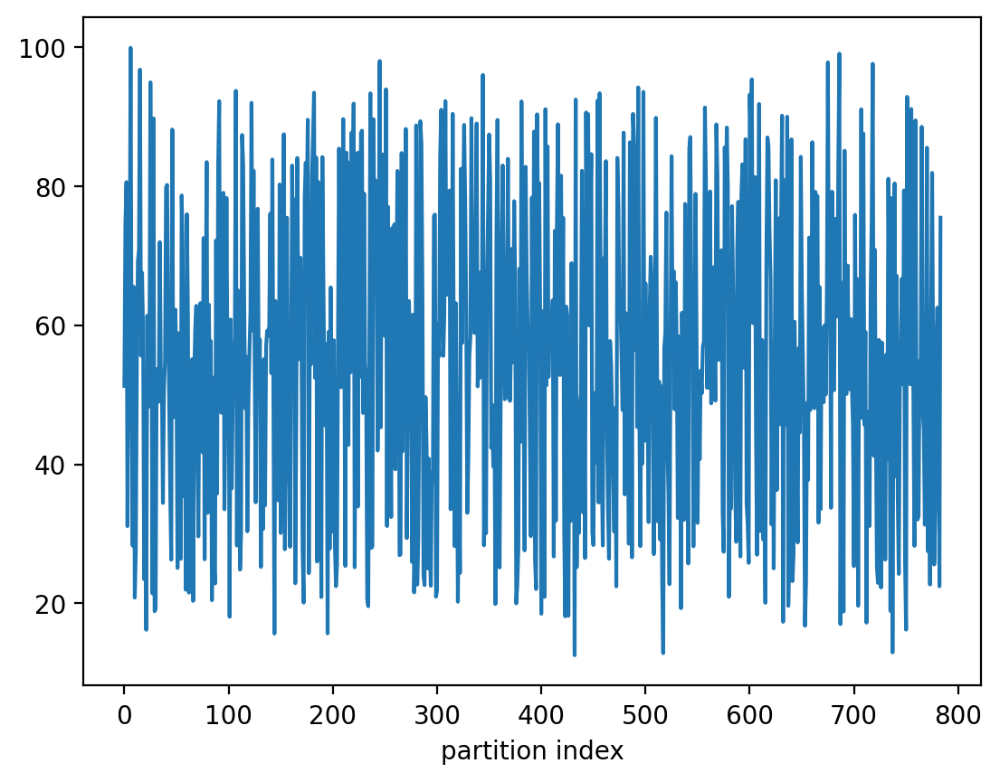

In [314]:
# plt.plot(pres[0][0,:,0])
# plt.plot(pres[1][0,:,0])
# plt.plot(pres[10][0,:,0])
plt.xlabel("partition index")
plt.plot(pos_enc.sum([1,2]))
# plt.plot(torch.arange(0,M).multiply(np.pi/M).cos())
# pos_enc.shape

In [298]:
post_samples.sum(dim=1).unique().shape
pos_enc.sum([1,2]).unique().shape

torch.Size([784])

In [143]:
engine.model.encoder.binary_energy(torch.tensor([[-1000.02]]))

tensor([[0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0

In [287]:
# bin_en = torch.tensor([[np.random.randint(2)for i in range(M)] for j in range(50)])

bin_en = engine.model.encoder.binary_energy(true_energy)
M = bin_en.shape[1]

pres = [(torch.arange(0,M).multiply(np.pi/M).cos().to(bin_en.device) * bin_en + torch.arange(0,M).multiply(np.pi/M).sin().to(bin_en.device) *(1 - bin_en).abs()).divide(np.sqrt(M)).unsqueeze(2) for i in np.arange(1,M-1,1)]
pos_enc = torch.cat(pres,2).transpose(1,2);
res = pos_enc.sum([1,2])/(M-1)
res.unsqueeze(1)

torch.Size([128, 1])

In [498]:
post_samples

tensor([[0., 0., 0.,  ..., 1., 1., 1.],
        [1., 1., 1.,  ..., 1., 0., 1.],
        [1., 0., 0.,  ..., 1., 0., 1.],
        ...,
        [1., 1., 1.,  ..., 1., 0., 1.],
        [0., 1., 0.,  ..., 1., 0., 1.],
        [1., 0., 1.,  ..., 1., 0., 1.]], device='cuda:4')

tensor([[0.0000],
        [0.0001],
        [0.0003],
        [0.0004],
        [0.0288],
        [0.0288],
        [0.0009],
        [0.0288],
        [0.0012],
        [0.0013]], device='cuda:4')
tensor([[0.0000],
        [0.0004],
        [0.0007],
        [0.0011],
        [0.0287],
        [0.0287],
        [0.0022],
        [0.0287],
        [0.0030],
        [0.0034]], device='cuda:4')


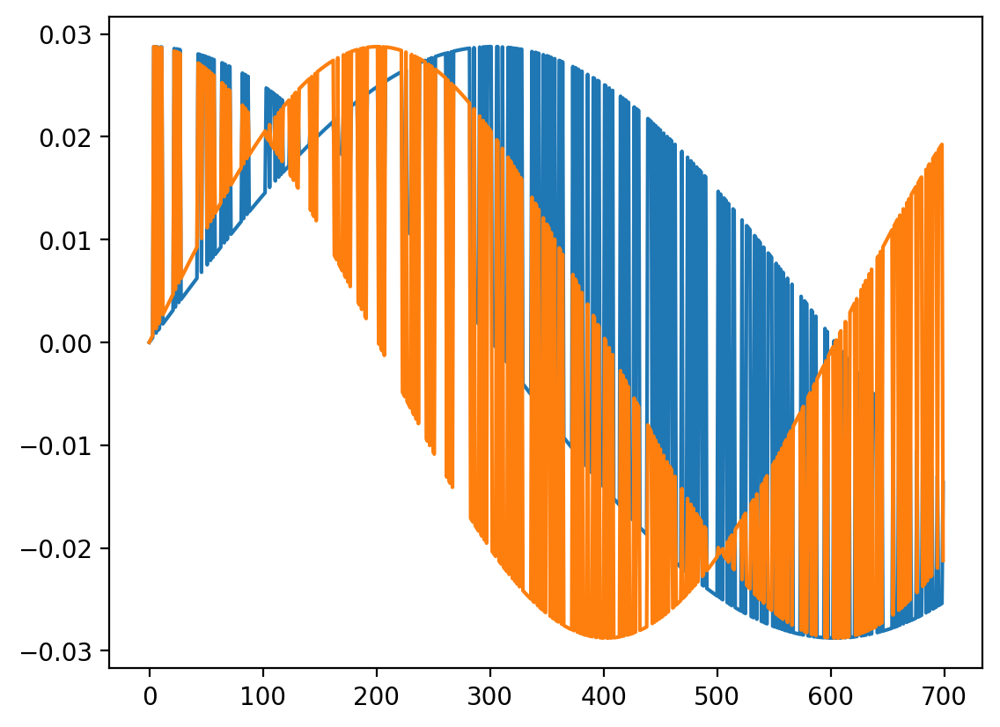

In [510]:
# plt.scatter(range(128), pos_enc.sum([1,2]).detach().cpu()/(M-1))
# pos_enc.sum()
M = post_samples.shape[1]
test_ = [(torch.arange(0,M).multiply(i*np.pi/M).cos().to(post_samples.device) * post_samples + torch.arange(0,M).multiply(i*np.pi/M).sin().to(post_samples.device) *(1 - post_samples).abs()).divide(np.sqrt(M)).unsqueeze(2) for i in np.arange(1,M/4-1,1)]
print(test_[1][0,:10,:])
print(test_[4][0,:10,:])
len(test_)
plt.plot(test_[1][0,:700,0].detach().cpu())
plt.plot(test_[2][0,:700,0].detach().cpu())

In [283]:
###########Create Synth data

In [40]:
engen_samples2 = []
xgen_samples2 = []
# xgen_samples2_qpu = []
with torch.no_grad():
    for i,xx in enumerate(train_loader):
        print(i)
        in_data, true_energy, in_data_flat = engine._preprocess(xx[0],xx[1])
        if reducedata:
            engine._model.sampler._batch_size = true_energy.shape[0]
            if cond:
                sample_energies, sample_data = engine._model.generate_samples_cond(num_samples=true_energy.shape[0], true_energy=true_energy, measure_time=True)
                # sample_energies_qpu, sample_data_qpu = engine.model.generate_samples_qpu_cond(true_energy=true_energy, num_samples=true_energy.shape[0], thrsh=27, beta=1/beta0, t=2.5, est_beta=False)
            else:
                sample_energies, sample_data = engine._model.generate_samples(num_samples=true_energy.shape[0], true_energy=true_energy, measure_time=True)
            engine._model.sampler._batch_size = engine._config.engine.rbm_batch_size
            sample_data = engine._reduceinv(sample_data, sample_energies, R=R)
        elif scaled:
            engine._model.sampler._batch_size = true_energy.shape[0]
            if cond:
                sample_energies, sample_data = engine._model.generate_samples_cond(num_samples=true_energy.shape[0], true_energy=true_energy, measure_time=True)
            else:
                sample_energies, sample_data = engine._model.generate_samples(num_samples=true_energy.shape[0], true_energy=true_energy, measure_time=True)
            engine._model.sampler._batch_size = engine._config.engine.rbm_batch_size
            sample_data = torch.tensor(engine._data_mgr.inv_transform(sample_data.detach().cpu().numpy()))
        else:
            engine._model.sampler._batch_size = true_energy.shape[0]
            if cond:
                sample_energies, sample_data = engine._model.generate_samples_cond(num_samples=true_energy.shape[0], true_energy=true_energy, measure_time=True)
            else:
                sample_energies, sample_data = engine._model.generate_samples(num_samples=true_energy.shape[0], true_energy=true_energy, measure_time=True)
            engine._model.sampler._batch_size = engine._config.engine.rbm_batch_size
            sample_data = sample_data.detach().cpu()*1000

        xgen_samples2.append( sample_data.detach().cpu())
        engen_samples2.append(true_energy.detach().cpu())
        # xgen_samples2_qpu.append( sample_data_qpu.detach().cpu())
        
    for i,xx in enumerate(val_loader):
        print(i, "val")
        in_data, true_energy, in_data_flat = engine._preprocess(xx[0],xx[1])
        if reducedata:
            engine._model.sampler._batch_size = true_energy.shape[0]
            if cond:
                sample_energies, sample_data = engine._model.generate_samples_cond(num_samples=true_energy.shape[0], true_energy=true_energy, measure_time=True)
                # sample_energies_qpu, sample_data_qpu = engine.model.generate_samples_qpu_cond(true_energy=true_energy, num_samples=true_energy.shape[0], thrsh=27, beta=1/beta0, t=2.5, est_beta=False)
            else:
                sample_energies, sample_data = engine._model.generate_samples(num_samples=true_energy.shape[0], true_energy=true_energy, measure_time=True)
            engine._model.sampler._batch_size = engine._config.engine.rbm_batch_size
            sample_data = engine._reduceinv(sample_data, sample_energies, R=R)
        elif scaled:
            engine._model.sampler._batch_size = true_energy.shape[0]
            if cond:
                sample_energies, sample_data = engine._model.generate_samples_cond(num_samples=true_energy.shape[0], true_energy=true_energy, measure_time=True)
            else:
                sample_energies, sample_data = engine._model.generate_samples(num_samples=true_energy.shape[0], true_energy=true_energy, measure_time=True)
            engine._model.sampler._batch_size = engine._config.engine.rbm_batch_size
            sample_data = torch.tensor(engine._data_mgr.inv_transform(sample_data.detach().cpu().numpy()))
        else:
            engine._model.sampler._batch_size = true_energy.shape[0]
            if cond:
                sample_energies, sample_data = engine._model.generate_samples_cond(num_samples=true_energy.shape[0], true_energy=true_energy, measure_time=True)
            else:
                sample_energies, sample_data = engine._model.generate_samples(num_samples=true_energy.shape[0], true_energy=true_energy, measure_time=True)
            engine._model.sampler._batch_size = engine._config.engine.rbm_batch_size
            sample_data = sample_data.detach().cpu()*1000

        xgen_samples2.append( sample_data.detach().cpu())
        engen_samples2.append(true_energy.detach().cpu())
        # xgen_samples2_qpu.append( sample_data_qpu.detach().cpu())
        
    for i,xx in enumerate(test_loader):
        print(i, "test")
        in_data, true_energy, in_data_flat = engine._preprocess(xx[0],xx[1])
        if reducedata:
            engine._model.sampler._batch_size = true_energy.shape[0]
            if cond:
                sample_energies, sample_data = engine._model.generate_samples_cond(num_samples=true_energy.shape[0], true_energy=true_energy, measure_time=True)
                # sample_energies_qpu, sample_data_qpu = engine.model.generate_samples_qpu_cond(true_energy=true_energy, num_samples=true_energy.shape[0], thrsh=27, beta=1/beta0, t=2.5, est_beta=False)
            else:
                sample_energies, sample_data = engine._model.generate_samples(num_samples=true_energy.shape[0], true_energy=true_energy, measure_time=True)
            engine._model.sampler._batch_size = engine._config.engine.rbm_batch_size
            sample_data = engine._reduceinv(sample_data, sample_energies, R=R)
        elif scaled:
            engine._model.sampler._batch_size = true_energy.shape[0]
            if cond:
                sample_energies, sample_data = engine._model.generate_samples_cond(num_samples=true_energy.shape[0], true_energy=true_energy, measure_time=True)
            else:
                sample_energies, sample_data = engine._model.generate_samples(num_samples=true_energy.shape[0], true_energy=true_energy, measure_time=True)
            engine._model.sampler._batch_size = engine._config.engine.rbm_batch_size
            sample_data = torch.tensor(engine._data_mgr.inv_transform(sample_data.detach().cpu().numpy()))
        else:
            engine._model.sampler._batch_size = true_energy.shape[0]
            if cond:
                sample_energies, sample_data = engine._model.generate_samples_cond(num_samples=true_energy.shape[0], true_energy=true_energy, measure_time=True)
            else:
                sample_energies, sample_data = engine._model.generate_samples(num_samples=true_energy.shape[0], true_energy=true_energy, measure_time=True)
            engine._model.sampler._batch_size = engine._config.engine.rbm_batch_size
            sample_data = sample_data.detach().cpu()*1000

        xgen_samples2.append( sample_data.detach().cpu())
        engen_samples2.append(true_energy.detach().cpu())
        # xgen_samples2_qpu.append( sample_data_qpu.detach().cpu())
        
        # if i > 30:
        #     break

xgen_samples2 = torch.cat(xgen_samples2, dim=0) 
engen_samples2 = torch.cat(engen_samples2, dim=0)
# xgen_samples2_qpu = torch.cat(xgen_samples2_qpu, dim=0)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
0 val
1 val
2 val
3 val
4 val
5 val
6 val
7 val
8 val
9 val
0 test
1 test
2 test
3 test
4 test
5 test
6 test
7 test
8 test
9 test


In [41]:
modelname

'polished-brook-46'

In [42]:
xgen_samples2.shape
# modelname
f'/raid/javier/Datasets/CaloVAE/data/synData/dataset2_synthetic_{modelname}.hdf5'

'/raid/javier/Datasets/CaloVAE/data/synData/dataset2_synthetic_polished-brook-46.hdf5'

In [43]:
# import torch
import h5py

# Convert tensors to numpy arrays as h5py does not support PyTorch tensors directly
tensor1_np = xgen_samples2[:100000,:].numpy()
tensor2_np = engen_samples2[:100000,:].numpy()

# Create a new HDF5 file
with h5py.File(f'/raid/javier/Datasets/CaloVAE/data/synData/dataset2_synthetic_{modelname}.hdf5', 'w') as f:
    # Create datasets for your tensors
    f.create_dataset('showers', data=tensor1_np)
    f.create_dataset('incident_energies', data=tensor2_np)

In [202]:
# import h5py

# # Convert tensors to numpy arrays as h5py does not support PyTorch tensors directly
# tensor1_np = xgen_samples2_qpu[:100000,:].numpy()
# tensor2_np = engen_samples2[:100000,:].numpy()

# # Create a new HDF5 file
# with h5py.File(f'/raid/javier/Datasets/CaloVAE/data/synData/dataset2_synthetic_qpu_{modelname}.hdf5', 'w') as f:
#     # Create datasets for your tensors
#     f.create_dataset('showers', data=tensor1_np)
#     f.create_dataset('incidence energy', data=tensor2_np)

In [56]:
class CylindricalConv(nn.Module):
    #assumes format of channels,zbin,phi_bin,rbin
    def __init__(self, dim_in, dim_out, kernel_size = 3, stride=1, groups = 1, padding = 0, bias = True):
        super().__init__()
        if(type(padding) != int):
            self.padding_orig = copy.copy(padding)
            padding = list(padding)
            padding[1] = 0
        else:
            padding = [padding]*3
            self.padding_orig = copy.copy(padding)
            padding[1] = 0
        self.kernel_size = kernel_size
        self.conv = nn.Conv3d(dim_in, dim_out, kernel_size=kernel_size, stride = stride, groups = groups, padding = padding, bias = bias)

    def forward(self, x):
        #to achieve 'same' use padding P = ((S-1)*W-S+F)/2, with F = filter size, S = stride, W = input size
        #pad last dim with nothing, 2nd to last dim is circular one
        circ_pad = self.padding_orig[1]
        x = F.pad(x, pad = (0,0, circ_pad, circ_pad, 0, 0), mode = 'circular')
        x = self.conv(x)
        return x
    
class PeriodicConv3d(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride=1, padding=0, dilation=1, groups=1, bias=True):
        super(PeriodicConv3d, self).__init__()
        self.padding = padding
        # try 3x3x3 cubic convolution
        self.conv = nn.Conv3d(in_channels, out_channels, kernel_size, stride=stride, padding=0, dilation=dilation, groups=groups, bias=bias)
    def forward(self, x):
        # Pad input tensor with periodic boundary and circle-center conditions
        if self.padding == 1:
            mid = x.shape[-1] // 2
            shift = torch.cat((x[..., [-1], mid:], x[..., [-1], :mid]), -1)
            x = torch.cat((x, shift), dim=-2)
        x = F.pad(x, (self.padding, self.padding, 0, 0, 0, 0), mode='circular')
        # Apply convolution
        x = self.conv(x)
        return x

In [66]:
cyl = CylindricalConv(2,2, padding=1)
cyl2 = PeriodicConv3d(2,2,3, padding=1)

In [67]:
print(cyl(torch.rand(2,45,16,9)).shape, cyl.padding_orig)
print(cyl2(torch.rand(2,45,16,9)).shape, cyl2.padding)

torch.Size([2, 45, 16, 9]) [1, 1, 1]
torch.Size([2, 43, 15, 9]) 1


In [74]:
x = torch.ones(2, 45, 16, 9)
print(x.shape)

# pad last dimension "at the end"
x1 = F.pad(x, (1, 1, 0, 0, 0, 0), mode='circular')
print(x1.shape)

# # pad last dimension "at the front"
x2 = F.pad(x, (0, 0, 1, 1, 0, 0, 0, 0))
print(x2.shape)

# # pad last dimension on both sides with two zeros
# x3 = F.pad(x, (0, 0, 0, 0, 0, 0, 2, 2))
# print(x3)

# # pad dim1 "at the front" with 4 values
# x4 = F.pad(x, (0, 0, 4, 0, 0, 0, 0, 0))
# print(x4)

torch.Size([2, 45, 16, 9])
torch.Size([2, 45, 16, 11])
torch.Size([2, 45, 18, 9])


In [92]:
print(true_energy.shape)
engine.model.encoder.binary_energy(true_energy).sum(dim=1)
# fwd_output.post_logits

torch.Size([631, 1])


tensor([85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85,
        85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85,
        85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85,
        85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85,
        85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85,
        85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85,
        85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85, 85,
        85, 85, 85, 85, 85, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60,
        60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60,
        60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60,
        60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60,
        60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60,
        60, 60, 60, 60, 60, 60, 60, 60, 

In [119]:
# data = engine.model.prior.weight_dict['01'].sign().abs().sum(dim=1).detach().cpu().numpy()
binwidth = 1.0
data = {}
for key in engine.model.prior.weight_dict.keys():
    # data[key] = engine.model.prior.weight_dict[key].sign().abs().sum(dim=0).detach().cpu().numpy()
    data[key] = engine.model.prior._weight_mask_dict[key].abs().sum(dim=0).detach().cpu().numpy()
    
    


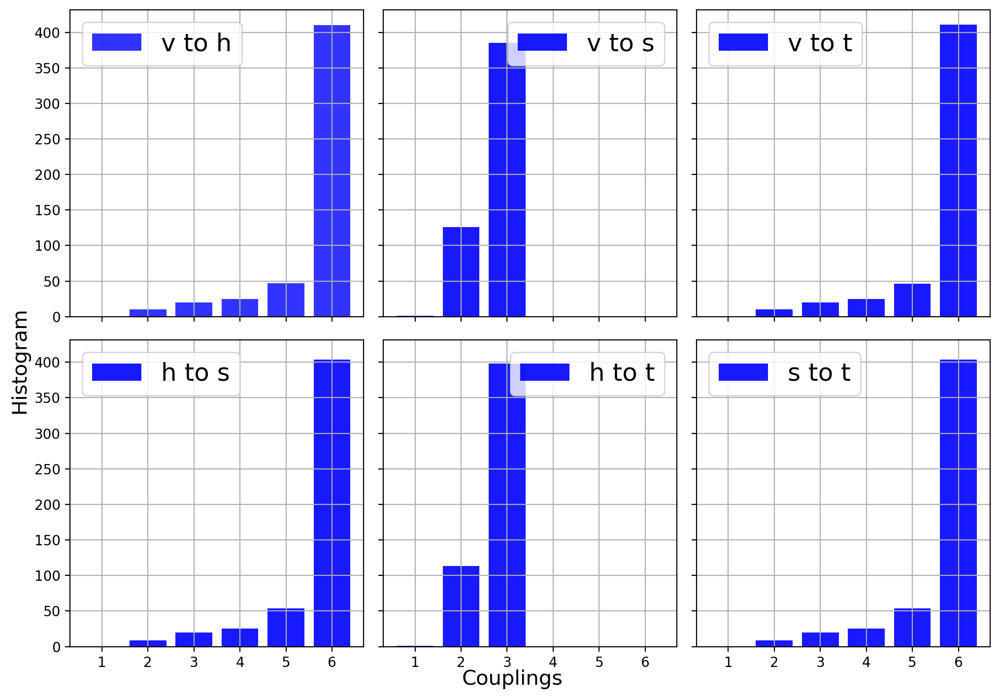

In [120]:
# Create 2x2 grid of subplots
fig, axs = plt.subplots(2, 3, figsize=(10, 7), sharey=True, sharex=True, tight_layout=True)  # 2x2 grid, figure size 10x10
fig.text(0.5, 0.0, 'Couplings', ha='center', fontsize=15)
fig.text(0.0, 0.4, 'Histogram', rotation=90, ha='center', fontsize=15)

# Plot data on each subplot
labels, counts = np.unique(data['01'], return_counts=True)
axs[0,0].bar(labels, counts, align='center', color="b", alpha=0.8)
# axs[0, 0].hist(data['01'], bins=np.arange(min(data['01']), max(data['01']) + binwidth, binwidth), histtype='stepfilled', linewidth=2.5, color="b", alpha=0.7, align='center')
axs[0,0].grid("True")
axs[0,0].legend(["v to h"], fontsize=18)

labels, counts = np.unique(data['02'], return_counts=True)
axs[0,1].bar(labels, counts, align='center', color="b", alpha=0.9)
axs[0,1].grid("True")
axs[0,1].legend(["v to s"], fontsize=18)

labels, counts = np.unique(data['03'], return_counts=True)
axs[0,2].bar(labels, counts, align='center', color="b", alpha=0.9)
axs[0,2].grid("True")
axs[0,2].legend(["v to t"], fontsize=18)

labels, counts = np.unique(data['12'], return_counts=True)
axs[1,0].bar(labels, counts, align='center', color="b", alpha=0.9)
axs[1,0].grid("True")
axs[1,0].legend(["h to s"], fontsize=18)

labels, counts = np.unique(data['13'], return_counts=True)
axs[1,1].bar(labels, counts, align='center', color="b", alpha=0.9)
axs[1,1].grid("True")
axs[1,1].legend(["h to t"], fontsize=18)

labels, counts = np.unique(data['12'], return_counts=True)
axs[1,2].bar(labels, counts, align='center', color="b", alpha=0.9)
axs[1,2].grid("True")
axs[1,2].legend(["s to t"], fontsize=18)

# plt.savefig(f'/home/javier/Projects/CaloQVAE/figs/weights_plot_zephyr.png', bbox_inches="tight")

plt.show()

In [47]:
np.unique(HLF_1_pions.bin_edges)

array([  0,   8, 108, 208, 213, 363, 523, 533])

In [140]:
# xx = next(iter(val_loader))
xx = next(iter(train_loader))
in_data_pre, true_energy, in_data_flat = engine._preprocess(xx[0],xx[1]) # input , label

In [148]:
if reducedata:
    in_data = engine._reduce(in_data, true_energy, R=R)
fwd_output = engine.model((in_data_pre, true_energy), False)
if reducedata:
    in_data = engine._reduceinv(in_data, true_energy, R=R)
    recon_data = engine._reduceinv(fwd_output.output_activations, true_energy, R=R)
    engine._model.sampler._batch_size = true_energy.shape[0]
    sample_energies, sample_data = engine._model.generate_samples(num_samples=true_energy.shape[0], true_energy=true_energy)
    engine._model.sampler._batch_size = engine._config.engine.rbm_batch_size
    sample_data = engine._reduceinv(sample_data, sample_energies, R=R)
elif scaled:
    in_data = torch.tensor(engine._data_mgr.inv_transform(in_data_pre.detach().cpu().numpy()))
    recon_data = torch.tensor(engine._data_mgr.inv_transform(fwd_output.output_activations.detach().cpu().numpy()))
    engine._model.sampler._batch_size = true_energy.shape[0]
    # try:
    sample_energies, sample_data = engine._model.generate_samples_cond(num_samples=true_energy.shape[0], true_energy=true_energy)
    # except:
        # pass
    engine._model.sampler._batch_size = engine._config.engine.rbm_batch_size
    # sample_energies, sample_data = engine._model.generate_samples(num_samples=2048)
    sample_data = torch.tensor(engine._data_mgr.inv_transform(sample_data.detach().cpu().numpy()))
else:
    in_data = in_data.detach().cpu()*1000
    recon_data = fwd_output.output_activations.detach().cpu()*1000
    engine._model.sampler._batch_size = true_energy.shape[0]
    sample_energies, sample_data = engine._model.generate_samples(num_samples=true_energy.shape[0], true_energy=true_energy)
    engine._model.sampler._batch_size = engine._config.engine.rbm_batch_size
    # sample_energies, sample_data = engine._model.generate_samples(num_samples=2048)
    sample_data = sample_data.detach().cpu()*1000

In [34]:
(20000/6)/60

55.55555555555556

In [303]:
THRSH=7
recon_data = recon_data * (recon_data > THRSH)
sample_data = sample_data * (sample_data > THRSH)

In [125]:
# HLF_1_pions.relevantLayers = [1,2,3,4,5,6,7]
# np.unique(HLF_1_pions.bin_edges)
# true_energy/1000
# HLF_1_electron.relevantLayers
true_energy[idx]/1000

tensor([696.5617], device='cuda:4')

In [28]:
# HLF_1_electron.relevantLayers = [0,5,10,15,20,25,30,35,40,44] #[i for i in range(0,5)] #[0,5,10,15,20,25,30,35,40,47,]
# HLF_1_electron.relevantLayers = [0,1,2,3,12,13,14,15]

In [122]:
# HLF_1_electron.DrawSingleShower(engine._reduceinv(in_data, true_energy).detach().cpu().numpy()[idx,:], vmax=1e+4, vmin=1e+0, cmap='rainbow', filename=None ) 

In [65]:
# xtarget_samples
idx=5073
# print(HLF_1_electron.DrawSingleShower(xtarget_samples[idx,:].detach().cpu().numpy(), vmax=1e+4, vmin=1e+0, cmap='rainbow', filename=None ) )
# print(HLF_1_electron.DrawSingleShower(xrecon_samples[idx,:].detach().cpu().numpy(), vmax=1e+4, vmin=1e+0, cmap='rainbow', filename=None ) )
# print(HLF_1_electron.DrawSingleShower(xgen_samples[idx,:].detach().cpu().numpy(), vmax=1e+4, vmin=1e+0, cmap='rainbow', filename=None ) )
# print(HLF_1_electron.DrawSingleShower(xgen_samples_qpu[idx,:].detach().cpu().numpy(), vmax=1e+4, vmin=1e+0, cmap='rainbow', filename=None ) )

In [70]:
xtarget_samples

tensor([[0.0000e+00, 6.9477e-04, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 1.1249e-03, 3.3420e-05,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 2.8417e-05, 3.2793e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [2.9802e-08, 2.9802e-08, 2.9802e-08,  ..., 2.9802e-08, 2.9802e-08,
         2.9802e-08],
        [2.4736e-06, 2.9802e-08, 2.9802e-08,  ..., 2.9802e-08, 2.9802e-08,
         2.9802e-08],
        [2.9802e-08, 2.9802e-08, 2.9802e-08,  ..., 2.9802e-08, 2.9802e-08,
         2.9802e-08]])

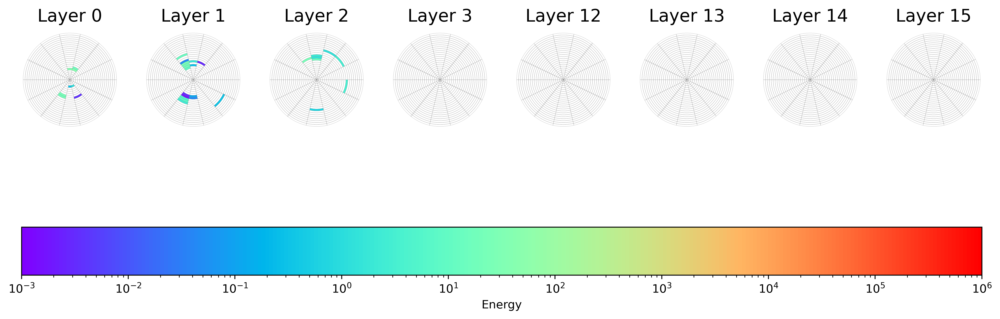

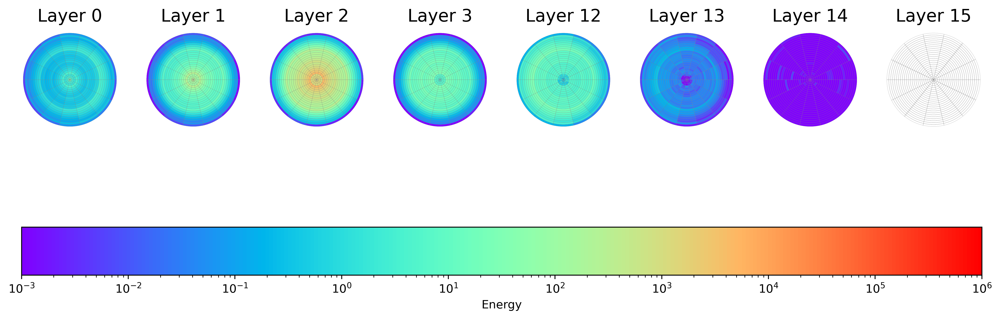

In [76]:
idx=21
# HLF_1_pions.DrawSingleShower(in_data[idx,:].detach().cpu().numpy(), filename=None)
# HLF_1_pions.DrawSingleShower(in_data[idx,:].detach().cpu().numpy(), filename=f'/home/javier/Projects/CaloQVAE/figs/{modelname}/target_{idx}_{modelname}_{arch}_{datascaled}_{part}.png')

# HLF_1_Atlas.DrawSingleShower(xtarget_samples[idx,:].detach().cpu().numpy(), filename=f'/home/javier/Projects/CaloQVAE/figs/{modelname}/target_a_{idx}_{modelname}_{arch}_{datascaled}_{part}.png', vmax=1e+1, vmin=1e-9, cmap='rainbow')
HLF_1_Atlas.DrawSingleShower(xtarget_samples[idx,:].detach().cpu().numpy(), vmax=1e+6, vmin=1e-3, cmap='rainbow', filename=None ) 

# HLF_1_Atlas.DrawSingleShower(xtarget_samples[:,:].detach().cpu().numpy(), filename=f'/home/javier/Projects/CaloQVAE/figs/{modelname}/target_a_{idx}_{modelname}_{arch}_{datascaled}_{part}_avg.png',  vmax=1e+1, vmin=1e-9, cmap='rainbow')
HLF_1_Atlas.DrawSingleShower(xtarget_samples.detach().mean(axis=0).cpu().numpy(), vmax=1e+6, vmin=1e-3, cmap='rainbow', filename=None ) 


In [77]:
# recon_data.shape
# xrecon_samples.shape

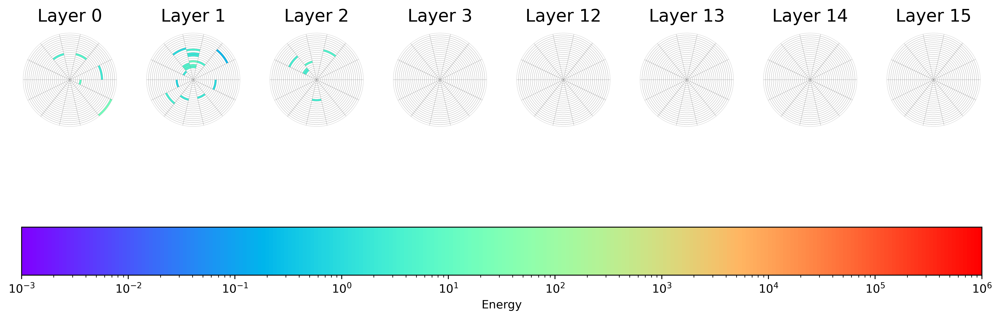

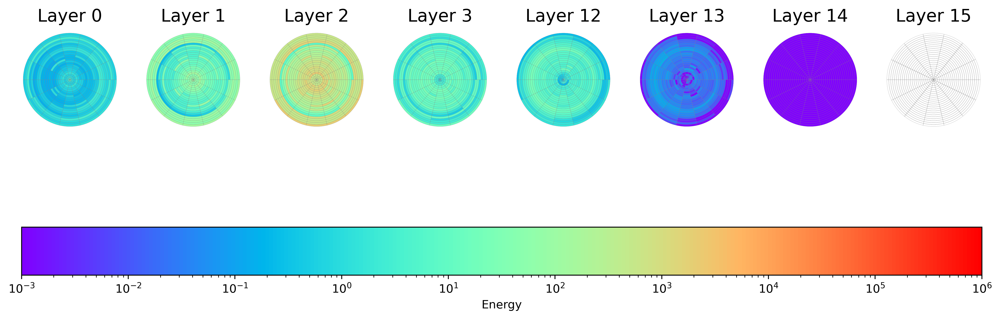

In [78]:
# HLF_1_pions.DrawSingleShower(recon_data[idx,:].detach().cpu().numpy(), filename=None)
# HLF_1_pions.DrawSingleShower(recon_data[idx,:].detach().cpu().numpy(), filename=f'/home/javier/Projects/CaloQVAE/figs/{modelname}/recon_{idx}_{modelname}_{arch}_{datascaled}_{part}.png')

# HLF_1_Atlas.DrawSingleShower(xrecon_samples[idx,:].detach().cpu().numpy(), filename=f'/home/javier/Projects/CaloQVAE/figs/{modelname}/recon_a_{idx}_{modelname}_{arch}_{datascaled}_{part}.png', vmax=1e+3, vmin=1e+0, cmap='rainbow')
HLF_1_Atlas.DrawSingleShower(xrecon_samples[idx,:].detach().cpu().numpy(), filename=None, vmax=1e+6, vmin=1e-3, cmap='rainbow')

# HLF_1_Atlas.DrawAverageShower(xrecon_samples[:,:].detach().cpu().numpy(), filename=f'/home/javier/Projects/CaloQVAE/figs/{modelname}/recon_{idx}_{modelname}_{arch}_{datascaled}_{part}_avg.png',  vmax=1e+2, vmin=1e-2, cmap='rainbow')
HLF_1_Atlas.DrawSingleShower(xrecon_samples.detach().mean(axis=0).cpu().numpy(), filename=None, vmax=1e+6, vmin=1e-3, cmap='rainbow')

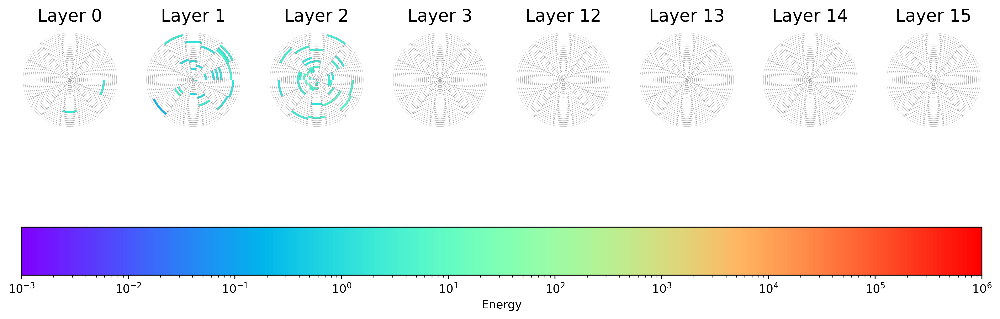

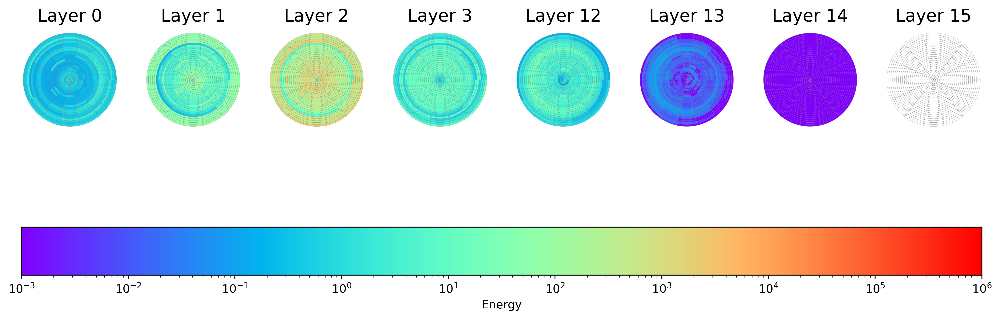

In [79]:
# HLF_1_pions.DrawSingleShower(sample_data[idx,:].detach().cpu().numpy(), filename=None)
# HLF_1_pions.DrawSingleShower(sample_data[1,:].detach().cpu().numpy(), filename=f'/home/javier/Projects/CaloQVAE/figs/{modelname}/sample_{idx}_{modelname}_{arch}_{datascaled}_{part}.png')

# HLF_1_Atlas.DrawSingleShower(xgen_samples[idx,:].detach().cpu().numpy(), filename=f'/home/javier/Projects/CaloQVAE/figs/{modelname}/sample_a_{idx}_{modelname}_{arch}_{datascaled}_{part}.png', vmax=1e+3, vmin=1e+0, cmap='rainbow')
HLF_1_Atlas.DrawSingleShower(xgen_samples[idx,:].detach().cpu().numpy(), filename=None, vmax=1e+6, vmin=1e-3, cmap='rainbow')

# HLF_1_Atlas.DrawAverageShower(xgen_samples[:,:].detach().cpu().numpy(), filename=f'/home/javier/Projects/CaloQVAE/figs/{modelname}/sample_a_{idx}_{modelname}_{arch}_{datascaled}_{part}_avg.png',  vmax=1e+2, vmin=1e-2, cmap='rainbow')
HLF_1_Atlas.DrawSingleShower(xgen_samples.detach().mean(axis=0).cpu().numpy(), filename=None, vmax=1e+6, vmin=1e-3, cmap='rainbow')

In [174]:
xgen_samples_qpu.shape
idx

5073

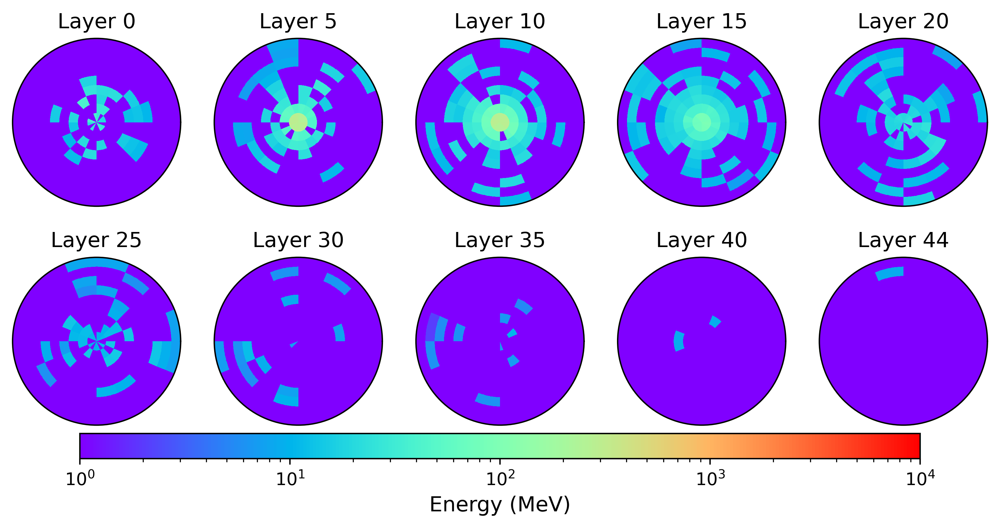

In [48]:
# HLF_1_electron.DrawSingleShower(xgen_samples_qpu[idx,:].detach().cpu().numpy(), filename=f'/home/javier/Projects/CaloQVAE/figs/{modelname}/sample_QPU_a_{idx}_{modelname}_{arch}_{datascaled}_{part}.png', vmax=1e+3, vmin=1e+0, cmap='rainbow')
# HLF_1_electron.DrawSingleShower(xgen_samples_qpu[idx,:].detach().cpu().numpy(), filename=None, vmax=1e+4, vmin=1e+0, cmap='rainbow')

# HLF_1_electron.DrawAverageShower(xgen_samples_qpu[:,:].detach().cpu().numpy(), filename=f'/home/javier/Projects/CaloQVAE/figs/{modelname}/sample_QPU_a_{idx}_{modelname}_{arch}_{datascaled}_{part}_avg.png', vmax=1e+2, vmin=1e-2, cmap='rainbow')
# HLF_1_electron.DrawAverageShower(xgen_samples_qpu[:,:].detach().cpu().numpy(),  vmax=1e+2, vmin=1e-2, cmap='rainbow', filename=None)


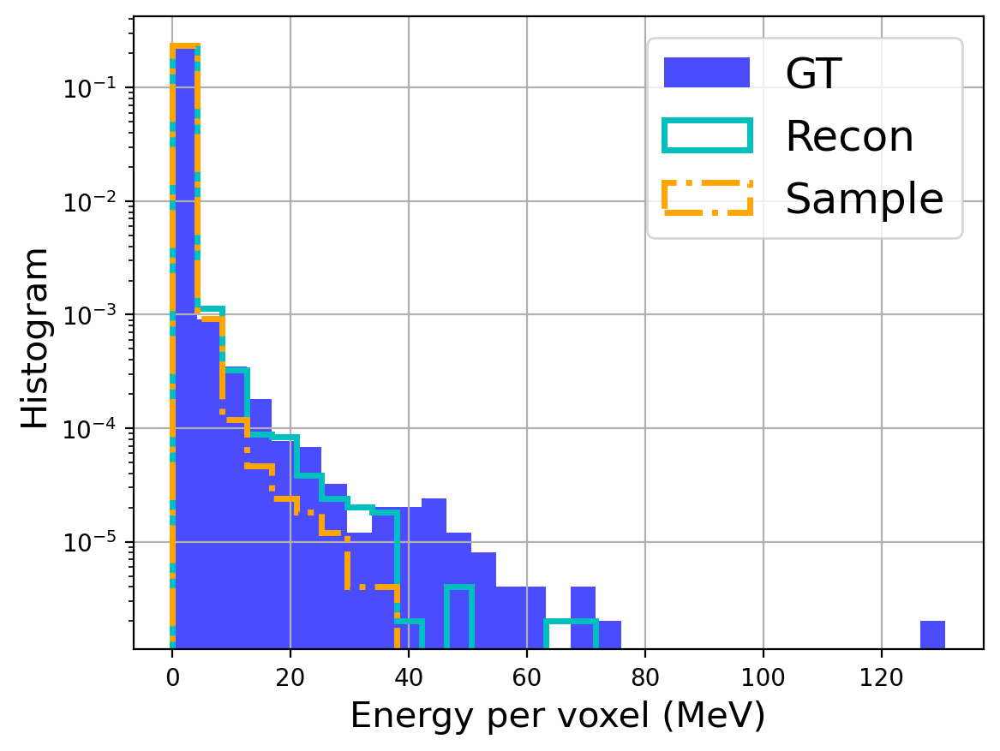

torch.Size([56878416])


In [42]:
samps = 50
minVal, maxVal = min(xtarget_samples[:samps,:].view(-1)), max(xtarget_samples[:samps,:].view(-1))
binwidth = (maxVal-minVal)/30

plt.hist(xtarget_samples[:samps,:].view(-1), bins=np.arange(minVal, maxVal + binwidth, binwidth), density=True, log=True, histtype='stepfilled', linewidth=2.5, color="b", alpha=0.7)
plt.hist(xrecon_samples[:samps,:].view(-1), bins=np.arange(minVal, maxVal + binwidth, binwidth), density=True, log=True, histtype='step', alpha=1.0, linewidth=2.5, color="c")
plt.hist(xgen_samples[:samps,:].view(-1), bins=np.arange(minVal, maxVal + binwidth, binwidth), density=True, log=True, histtype='step', alpha=1.0, linewidth=2.5, color="orange", linestyle="dashdot")
# plt.hist(xgen_samples_qpu[:samps,:].view(-1), bins=np.arange(minVal, maxVal + binwidth, binwidth), density=True, log=True, histtype='step', alpha=1.0, linewidth=2.5, color="purple", linestyle="dashdot")
plt.xlabel("Energy per voxel (MeV)", fontsize=15)

plt.ylabel("Histogram", fontsize=15)
plt.legend(["GT", "Recon", "Sample", "Sample w/ QPU"], fontsize=18)
plt.grid("True")
plt.savefig(f'/home/javier/Projects/CaloQVAE/figs/{modelname}/energy_per_voxel_{modelname}_{arch}_{datascaled}_{part}.png')
plt.show()
print(xtarget_samples.view(-1).shape)

In [77]:
xtar_reduced = engine._reduce(xtarget_samples, entarget_samples);

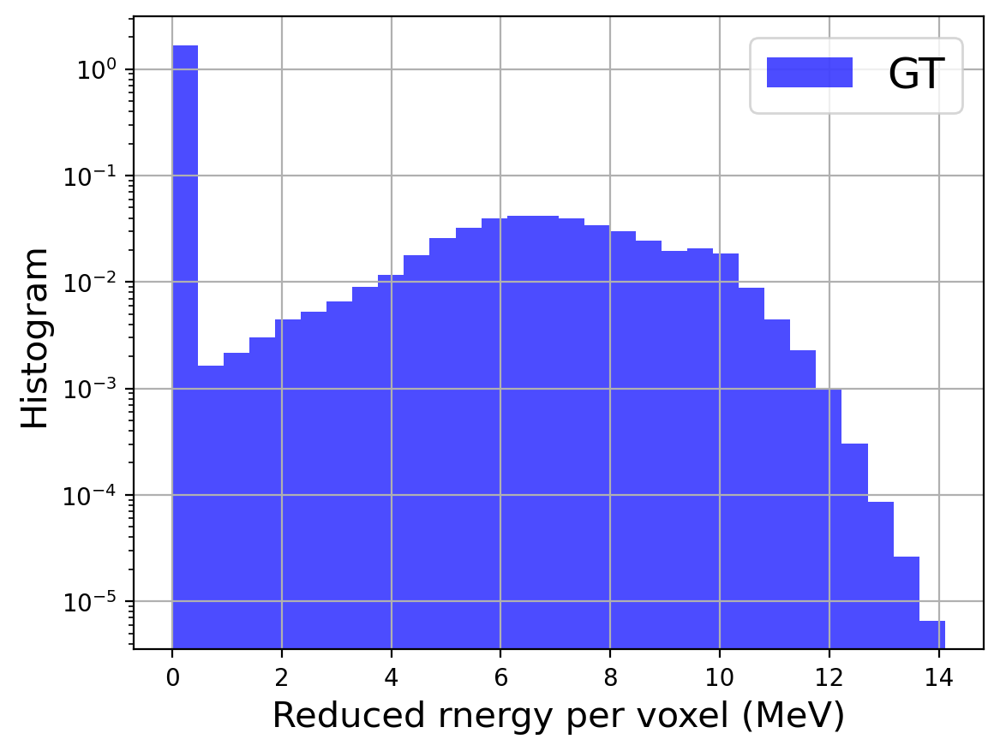

torch.Size([64800000])


In [78]:
samps = 50
minVal, maxVal = min(xtar_reduced[:samps,:].view(-1)), max(xtar_reduced[:samps,:].view(-1))
binwidth = (maxVal-minVal)/30

plt.hist(xtar_reduced[:samps,:].view(-1), bins=np.arange(minVal, maxVal + binwidth, binwidth), density=True, log=True, histtype='stepfilled', linewidth=2.5, color="b", alpha=0.7)
# plt.hist(xrecon_samples[:samps,:].view(-1), bins=np.arange(minVal, maxVal + binwidth, binwidth), density=True, log=True, histtype='step', alpha=1.0, linewidth=2.5, color="c")
# plt.hist(xgen_samples[:samps,:].view(-1), bins=np.arange(minVal, maxVal + binwidth, binwidth), density=True, log=True, histtype='step', alpha=1.0, linewidth=2.5, color="orange", linestyle="dashdot")
# plt.hist(xgen_samples_qpu[:samps,:].view(-1), bins=np.arange(minVal, maxVal + binwidth, binwidth), density=True, log=True, histtype='step', alpha=1.0, linewidth=2.5, color="purple", linestyle="dashdot")
plt.xlabel("Reduced rnergy per voxel (MeV)", fontsize=15)

plt.ylabel("Histogram", fontsize=15)
plt.legend(["GT", "Recon", "Sample", "Sample w/ QPU"], fontsize=18)
plt.grid("True")
# plt.savefig(f'/home/javier/Projects/CaloQVAE/figs/{modelname}/energy_per_voxel_{modelname}_{arch}_{datascaled}_{part}.png')
plt.show()
print(xtarget_samples.view(-1).shape)